# Assigning Regions to Sales Representative at Pfizer Turkey

# Imports

In [2]:
import cvxpy as cp
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
%matplotlib inline

# Problem formulation

In [12]:
distances = pd.read_excel('distances.xlsx',header=1, usecols=range(1,6), index_col=0)
distances_brick_brick = pd.read_excel('distances.xlsx',sheet_name=1,header=1, usecols=range(1,24), index_col=0)
Current_affectation = np.zeros((4,22))
SR = []
SR.append([4,5,6,7,8,15])
SR.append([10,11,12,13,14])
SR.append([9,16,17,18])
SR.append([1,2,3,19,20,21,22])
for i in range(4):
    for j in range(22):
        if j in SR[i]:
            Current_affectation[i,j-1]=1
index_value = np.array((0.1609, 0.1164, 0.1026, 0.1516, 0.0939, 
                        0.1320, 0.0687, 0.0930, 0.2116, 0.2529,
                        0.0868, 0.0828, 0.0975, 0.8177, 0.4115, 
                        0.3795, 0.0710, 0.0427, 0.1043, 0.0997, 
                        0.1698, 0.2531))


In [4]:
distances_brick_brick

,1,2,3,4,5,6,7,8,9,10,...,13,14,15,16,17,18,19,20,21,22
dij,,,,,,,,,,,,,,,,,,,,,
1,0.000000,7.353258,13.208755,16.159669,18.219385,16.683252,14.003832,19.022245,17.447017,28.486721,...,24.528583,24.094136,25.383225,24.293812,23.233883,23.698122,8.475966,13.845739,5.237194,21.120353
2,7.353258,0.000000,6.575409,19.000329,20.060199,19.064367,16.300702,21.588353,21.449886,30.986005,...,25.984799,26.473492,28.221837,27.224160,26.252522,26.271829,8.079431,8.361800,9.146857,17.330058
3,13.208755,6.575409,0.000000,25.293843,26.050850,25.242300,22.536115,27.759038,27.928323,36.986085,...,31.680357,32.498003,34.365455,33.407055,32.472254,32.361721,14.181241,10.961756,15.719574,12.247094
4,16.159669,19.000329,25.293843,0.000000,3.069544,1.219262,2.796319,2.872716,3.799224,12.348279,...,8.819597,7.935320,9.337858,8.289656,7.280000,7.550265,11.126801,17.492090,11.028259,36.120000
5,18.219385,20.060199,26.050850,3.069544,0.000000,1.915646,4.221718,2.354782,6.186857,10.943843,...,6.311022,6.447154,8.403910,7.548649,6.769202,6.346416,11.984824,17.217680,12.986216,37.368839
6,16.683252,19.064367,25.242300,1.219262,1.915646,0.000000,2.792132,2.524460,4.828302,12.006140,...,7.982437,7.511678,9.157478,8.170251,7.231943,7.232793,11.066621,17.014776,11.483192,36.290178
7,14.003832,16.300702,22.536115,2.796319,4.221718,2.792132,0.000000,5.301141,6.204716,14.797844,...,10.532260,10.299752,11.930507,10.923855,9.955431,10.023777,8.356895,14.769570,8.776018,33.503471
8,19.022245,21.588353,27.759038,2.872716,2.354782,2.524460,5.301141,0.000000,4.417624,9.528804,...,6.142963,5.074682,6.633649,5.648690,4.730296,4.735652,13.587590,19.334945,13.868208,38.804480
9,17.447017,21.449886,27.928323,3.799224,6.186857,4.828302,6.204716,4.417624,0.000000,11.741163,...,10.147995,8.018591,8.474485,7.370244,6.306227,7.363817,13.998128,20.922000,12.730130,38.162082


In [5]:
print(index_value)
distances

[0.1609 0.1164 0.1026 0.1516 0.0939 0.132  0.0687 0.093  0.2116 0.2529
 0.0868 0.0828 0.0975 0.8177 0.4115 0.3795 0.071  0.0427 0.1043 0.0997
 0.1698 0.2531]


,1,2,3,4
1,16.16,24.08,24.32,21.12
2,19.00,26.47,27.24,17.33
3,25.29,32.49,33.42,12.25
4,0.00,7.93,8.31,36.12
5,3.07,6.44,7.56,37.37
6,1.22,7.51,8.19,36.29
7,2.80,10.31,10.95,33.50
8,2.87,5.07,5.67,38.80
9,3.80,8.01,7.41,38.16
10,12.35,4.52,4.35,48.27


In [6]:
def Disruption(Affectation, order):
    a = 0.5*cp.matmul(cp.abs(Current_affectation-Affectation),index_value)/cp.max(index_value)
    return cp.atoms.norm(a,2)**2

def Distance(Affectation,order_norm):
    a = cp.multiply(Affectation,distances.T)/cp.max(distances.T)
    #b = cp.matmul(a,index_value)
    a = cp.sum(a,axis=1)
    c = cp.norm(a,2)**2
    return c

def workload(Affectation):
        return cp.matmul(Affectation,index_value)

def objective_fn(Affectation, eps, order_disruption, order_distance):
    return Disruption(Affectation, order_disruption) + eps*Distance(Affectation,order_distance)

def Affectation_problem(eps, order_disruption, upper_bound_disruption, order_distance, constraint_set):

    #Variables declaration
    Affectation = cp.Variable((4,22), boolean=True)
    
    #Parameters and value declaration
    Current_affect = cp.Parameter((4,22))
    epsilon = cp.Parameter(nonneg=True)
    order_disr = cp.Parameter()
    order_dist = cp.Parameter()
    
    Current_affect.value = Current_affectation
    epsilon.value = eps
    order_disr.value = order_disruption
    order_dist.value = order_distance
    
    #Constraints declaration 
    Constraints=[]
    
    #Individual workload constraints 
    Constraints.append(workload(Affectation)>=0.8)
    Constraints.append(workload(Affectation)<=1.2)
    
    #Individual workload constraints 
    Constraints = Constraints + [cp.sum(Disruption(Affectation,order_disr)) <= upper_bound_disruption]
    
    #Stochasticity of the affectation mat to ensure total affectation
    Constraints = Constraints + [cp.sum(Affectation[:,j]) == 1 for j in range(22)]
    
    #Constraint to explore the Pareto optimal front
    Constraints = Constraints + [cp.sum(cp.sum(cp.multiply(Affectation,i), axis = 1), axis = 0) <= 22-1 for i in constraint_set]
    
    #Declaration of problem and solving
    problem = cp.Problem(cp.Minimize(objective_fn(Affectation, eps, order_disr, order_dist)),Constraints)
    problem.solve(solver = 'ECOS_BB')
    
    return Affectation.value
Affec = np.round(np.abs(Affectation_problem(1, 2, 1, 2, [])))


In [7]:
A = np.hstack((distances_brick_brick, distances))
bottom = np.hstack((distances.T, np.ones((4,4))+100))
A = np.vstack((A,bottom))
A.shape

(26, 26)

In [8]:
G = nx.from_numpy_matrix(A)
D = nx.Graph(G)
pos = nx.spring_layout(D)
pos_np = np.array(list(pos.values())).T


def draw_map(pos_np,Affec):
    n = len(Affec)
    u = int(np.sqrt(n))
    fig, ax = plt.subplots(1,n ,figsize = (20, 5))
    for k in range(n):
        ax[k].scatter(pos_np[0,:22], pos_np[1,:22])
        ax[k].scatter(pos_np[0,22:], pos_np[1,22:], c='r')

        for i in range(4):
            ax[k].annotate(i+1, (pos_np[0,22+i], pos_np[1,22+i]))

        for i in range(22):
            for j in range(4):
                   if Affec[k].T[i,j]==1:
                        ax[k].plot(pos_np[0, [i, 22+j]], pos_np[1, [i, 22+j]], '-g',alpha=.2)    
    plt.savefig('affectation')

In [ ]:
print('Initial affectation','\n',Current_affectation)
print('Disruption: ', Disruption(Current_affectation,2).value)
print('Distance penalty: ', Distance(Current_affectation,2).value)
print('workload balance: ', workload(Current_affectation).value)
print('loss function: ', objective_fn(Current_affectation, 1, 2, 2).value,'\n')


a = np.absolute(np.round(Affectation_problem(1, 2, 1, 2, [])))
Constraint_set = [a]
print('Affectation','\n',a)
print('Disruption: ', Disruption(a,1).value)
print('Distance penalty: ', Distance(a,1).value)
print('workload balance: ', workload(a).value)
print('loss function: ', objective_fn(a, 1, 2, 2).value,'\n')
while True: 
    result = Affectation_problem(1, 2, 1, 2, Constraint_set)
    if result is not None:
        Constraint_set.append(np.absolute(np.round(result)))
    else:
        break
    a = Constraint_set[-1]
    print('Affectation','\n',a)
    print('Disruption: ', Disruption(a,1).value)
    print('Distance penalty: ', Distance(a,1).value)
    print('workload balance: ', workload(a).value)
    print('loss function: ', objective_fn(a, 1, 2, 2).value,'\n')

Initial affectation 
 [[0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0.]]
Disruption:  0.0
Distance penalty:  7.35786898749777
workload balance:  [0.9507 1.3377 0.7048 0.7537]
loss function:  7.35786898749777 

Affectation 
 [[0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]]
Disruption:  0.11908223639298607
Distance penalty:  3.920312074770699
workload balance:  [1.1547 1.1534 0.8891 0.8028]
loss function:  4.039394311163685 

Affectation 
 [[0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 

Affectation 
 [[0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]]
Disruption:  0.15294128938749077
Distance penalty:  3.9418809387788256
workload balance:  [1.0608 1.1534 0.983  0.8028] 

loss function:  4.094822228166317 

Affectation 
 [[0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]]
Disruption:  0.1690727326783266
Distance penalty:  3.92614569769719
workload balance:  [1.0608 1.1961 0.9403 0.8028] 

loss function:  4.095218430375517 

Affectation 
 [[0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.

Affectation 
 [[0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]]
Disruption:  0.2508012538532145
Distance penalty:  3.877481472153841
workload balance:  [1.0608 1.0407 1.0957 0.8028] 

loss function:  4.128282726007056 

Affectation 
 [[0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0.]
 [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]]
Disruption:  0.18962073740001786
Distance penalty:  3.9419523982240445
workload balance:  [1.0504 1.1558 0.991  0.8028] 

loss function:  4.131573135624063 

Affectation 
 [[0. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0

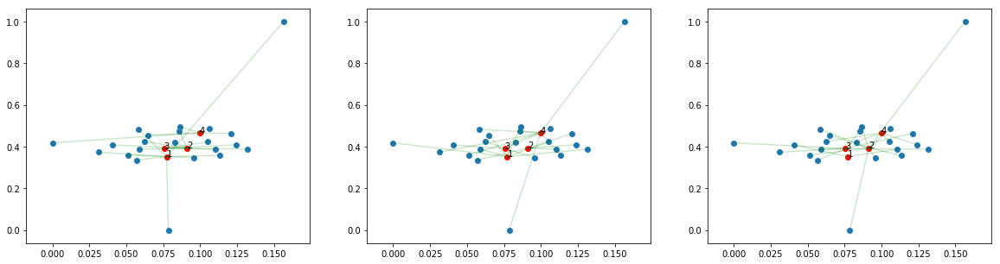

In [185]:
draw_map(pos_np,Constraint_set)

In [ ]:
distances5 = np.hstack((distances,np.zeros(22).reshape(22,1)))
#Current_affectation = np.vstack((Current_affectation,np.zeros(22)))

In [25]:
def Disruption(Affectation, order):
    a = 0.5*cp.matmul(cp.abs(Current_affectation5-Affectation),index_value)/cp.max(index_value)
    return cp.atoms.norm(a,2)**2

def Distance(Affectation,order_norm):
    a = cp.multiply(Affectation,distances5.T)/cp.max(distances5.T)
    #b = cp.matmul(a,index_value)
    a = cp.sum(a,axis=1)
    c = cp.norm(a,1)
    return c

def workload(Affectation):
        return cp.matmul(Affectation,index_value)

def objective_fn(Affectation, eps, order_disruption, order_distance):
    return Disruption(Affectation, order_disruption) + eps*Distance(Affectation,order_distance)

def Affectation_problem(eps, order_disruption, upper_bound_disruption, order_distance, constraint_set):

    #Variables declaration
    Affectation = cp.Variable((5,22), boolean=True)
    
    #Parameters and value declaration
    Current_affect = cp.Parameter((5,22))
    epsilon = cp.Parameter(nonneg=True)
    order_disr = cp.Parameter()
    order_dist = cp.Parameter()
    
    Current_affect.value = np.vstack((Current_affectation,np.zeros(22)))
    epsilon.value = eps
    order_disr.value = order_disruption
    order_dist.value = order_distance
    
    #Constraints declaration 
    Constraints=[]
    
    #Individual workload constraints 
    Constraints.append(workload(Affectation)>=0.8)
    Constraints.append(workload(Affectation)<=1.2)
    
    #Individual workload constraints 
    Constraints = Constraints + [cp.sum(Disruption(Affectation,order_disr)) <= upper_bound_disruption]
    
    #Stochasticity of the affectation mat to ensure total affectation
    Constraints = Constraints + [cp.sum(Affectation[:,j]) == 1 for j in range(22)]
    
    #Constraint to explore the Pareto optimal front
    Constraints = Constraints + [cp.sum(cp.sum(cp.multiply(Affectation,i), axis = 1), axis = 0) <= 22-1 for i in constraint_set]
    
    #Declaration of problem and solving
    problem = cp.Problem(cp.Minimize(objective_fn(Affectation, eps, order_disr, order_dist)),Constraints)
    problem.solve(solver = 'ECOS_BB', verbose=True)
    
    return Affectation.value
Affec = np.round(np.abs(Affectation_problem(1, 2, 1, 2, [])))



Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.140e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.468e+00  -4.301e+01  +9e+02  3e-01  5e-01  1e+00  1e+00  0.4687  3e-01   1  1  1 |  0  0
 2  +3.280e+00  -2.677e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3979  4e-01   1  2  1 |  0  0
 3  +3.362e+00  -9.595e+00  +4e+02  7e-02  8e-02  6e-01  6e-01  0.5612  2e-01   2  2  2 |  0  0
 4  +2.927e+00  -1.111e+00  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7240  2e-01   2  2  2 |  0  0
 5  +2.700e+00  +6.398e-01  +9e+01  1e-02  1e-02  9e-02  1e-01  0.5623  2e-01   2  2  2 |  0  0
 6  +2.528e+00  +1.919e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.7939  2e-01   2  2  2 |  0  0
 7  +2.471e+00  +2.122e+00  +2e+01  1e-03  2e-03  6e-03  3e-02  0.6708  4e-01   2  2  2 |  0  0
 8  +2.398e+0

 0  +3.886e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.376e+00  -5.555e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4770  2e-01   1  1  1 |  0  0
 2  +3.826e+00  +1.939e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3540  4e-01   1  2  2 |  0  0
 3  +3.486e+00  +2.223e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.3834  6e-01   2  2  2 |  0  0
 4  +4.978e+00  +4.683e+00  +2e+02  1e-01  6e-02  4e-01  3e-01  0.7905  3e-01   2  2  2 |  0  0
 5  +4.509e+00  +4.412e+00  +1e+02  4e-02  2e-02  2e-01  2e-01  0.5971  2e-01   2  2  2 |  0  0
 6  +5.632e+00  +5.542e+00  +1e+02  5e-02  2e-02  2e-01  2e-01  0.3726  5e-01   2  2  2 |  0  0
 7  +6.753e+00  +6.701e+00  +8e+01  5e-02  2e-02  2e-01  1e-01  0.3006  1e-01   2  2  2 |  0  0
 8  +5.812e+00  +5.753e+00  +8e+01  6e-02  2e-02  2e-01  1e-01  0.0733  9e-01   2  2  2 |  0  0
 9  +1.125e+01  +1.116e+01  +5e+01  8e-02  2e-02  2e-01  7e-02  0.8773  6e-01   2  2  2 |  0  0
10  +8.011e+00  +7.893e+00  +4e+01  8e-

16  +1.744e+02  +1.760e+02  +7e-01  6e-02  5e-03  2e+00  1e-03  0.5278  4e-01   3  3  3 |  0  0
17  +1.894e+03  +1.911e+03  +6e-02  6e-02  5e-03  2e+01  9e-05  0.9063  5e-03   4  3  3 |  0  0
18  +5.590e+03  +5.647e+03  +2e-02  6e-02  5e-03  6e+01  3e-05  0.9083  2e-01   5  4  4 |  0  0
19  +1.803e+04  +1.814e+04  +9e-03  5e-02  5e-03  1e+02  1e-05  0.7602  3e-01   5  5  4 |  0  0
20  +2.329e+03  +2.496e+03  +6e-03  8e-02  5e-03  2e+02  9e-06  0.8615  6e-01   7  6  6 |  0  0
21  +3.496e+03  +3.703e+03  +5e-03  8e-02  5e-03  2e+02  7e-06  0.2728  3e-01   7  7  7 |  0  0
22  +3.131e+04  +3.152e+04  +5e-03  6e-02  5e-03  2e+02  7e-06  0.1414  9e-01   8  7  5 |  0  0
23  +7.701e+05  +7.751e+05  +2e-04  6e-02  5e-03  5e+03  3e-07  0.9596  1e-04   8  7  7 |  0  0
24  +5.839e+06  +5.892e+06  +2e-05  8e-02  6e-03  5e+04  3e-08  0.9282  5e-02   1  1  1 |  0  0
25  +1.518e+07  +1.526e+07  +8e-06  3e+00  4e-03  8e+04  1e-08  0.8349  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.7e-

14  +2.518e+00  +2.518e+00  +4e-04  2e-08  4e-08  3e-08  6e-07  0.9890  3e-02   3  1  1 |  0  0
15  +2.518e+00  +2.518e+00  +4e-06  2e-10  4e-10  3e-10  6e-09  0.9890  1e-04   3  1  1 |  0  0
16  +2.518e+00  +2.518e+00  +6e-08  3e-12  5e-12  4e-12  8e-11  0.9863  1e-04   3  1  1 |  0  0
17  +2.518e+00  +2.518e+00  +2e-09  2e-13  1e-13  1e-13  2e-12  0.9732  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.4e-13, reltol=6.2e-10, abstol=1.6e-09).
Runtime: 0.011869 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.346e+00  -6.266e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4781  2e-01   1  1  1 |  0  0
 2  +3.600e+00  +1.696e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3589  4e-01   1  2  2 |  0  0
 3  +2.628e+00  +1.533e+00  +5e+02  3e-01  2e-0

 2  +3.412e+00  -2.749e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3766  4e-01   1  2  1 |  0  0
 3  +3.676e+00  -9.472e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5800  3e-01   2  2  3 |  0  0
 4  +3.415e+00  -1.642e+00  +2e+02  3e-02  2e-02  3e-01  3e-01  0.6308  2e-01   2  2  2 |  0  0
 5  +3.085e+00  +2.755e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4936  2e-01   2  2  2 |  0  0
 6  +2.842e+00  +1.462e+00  +7e+01  6e-03  7e-03  5e-02  1e-01  0.5067  1e-01   2  1  2 |  0  0
 7  +2.748e+00  +2.293e+00  +3e+01  2e-03  2e-03  1e-02  4e-02  0.7686  2e-01   2  2  2 |  0  0
 8  +2.628e+00  +2.347e+00  +2e+01  1e-03  1e-03  6e-03  2e-02  0.5662  3e-01   2  2  1 |  0  0
 9  +2.568e+00  +2.419e+00  +8e+00  5e-04  8e-04  3e-03  1e-02  0.5297  1e-01   2  2  2 |  0  0
10  +2.561e+00  +2.493e+00  +4e+00  2e-04  3e-04  5e-04  6e-03  0.8873  4e-01   2  2  2 |  0  0
11  +2.547e+00  +2.501e+00  +3e+00  2e-04  2e-04  3e-04  4e-03  0.4752  3e-01   2  2  2 |  0  0
12  +2.547e+00  +2.503e+00  +3e+00  2e-0

 7  +2.879e+00  +2.205e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.6533  6e-02   2  2  2 |  0  0
 8  +2.661e+00  +2.406e+00  +1e+01  1e-03  1e-03  5e-03  2e-02  0.7723  2e-01   2  2  1 |  0  0
 9  +2.597e+00  +2.491e+00  +6e+00  4e-04  5e-04  2e-03  8e-03  0.6407  1e-01   2  2  2 |  0  0
10  +2.555e+00  +2.514e+00  +2e+00  2e-04  2e-04  4e-04  3e-03  0.8011  2e-01   2  2  2 |  0  0
11  +2.546e+00  +2.524e+00  +1e+00  8e-05  1e-04  2e-04  2e-03  0.7745  4e-01   2  2  2 |  0  0
12  +2.532e+00  +2.526e+00  +3e-01  2e-05  3e-05  3e-05  5e-04  0.9626  2e-01   2  2  2 |  0  0
13  +2.528e+00  +2.527e+00  +6e-02  4e-06  5e-06  5e-06  8e-05  0.8323  1e-02   3  2  2 |  0  0
14  +2.527e+00  +2.527e+00  +3e-02  2e-06  2e-06  2e-06  4e-05  0.7294  3e-01   2  2  2 |  0  0
15  +2.527e+00  +2.527e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9354  2e-03   2  1  1 |  0  0
16  +2.527e+00  +2.527e+00  +4e-04  2e-08  3e-08  3e-08  5e-07  0.9226  1e-01   2  1  1 |  0  0
17  +2.527e+00  +2.527e+00  +5e-05  3e-0

 4  +6.462e+00  +6.085e+00  +3e+02  1e-01  8e-02  4e-01  4e-01  0.5690  2e-01   2  2  2 |  0  0
 5  +1.460e+01  +1.428e+01  +2e+02  2e-01  9e-02  8e-01  3e-01  0.3854  4e-01   2  2  2 |  0  0
 6  +1.249e+01  +1.215e+01  +2e+02  3e-01  9e-02  9e-01  3e-01  0.4353  7e-01   2  2  2 |  0  0
 7  +5.702e+01  +5.692e+01  +1e+02  3e-01  9e-02  1e+00  2e-01  0.9890  6e-01   2  2  1 |  0  0
 8  +5.176e+01  +5.181e+01  +7e+01  3e-01  6e-02  1e+00  1e-01  0.5989  4e-01   2  2  2 |  0  0
 9  +2.243e+02  +2.264e+02  +2e+01  3e-01  5e-02  3e+00  3e-02  0.7596  4e-02   2  2  2 |  0  0
10  +5.383e+02  +5.422e+02  +9e+00  2e-01  4e-02  5e+00  1e-02  0.7886  3e-01   3  2  2 |  0  0
11  +8.292e+01  +8.817e+01  +6e+00  4e-01  2e-02  6e+00  9e-03  0.9579  6e-01   3  2  2 |  0  0
12  +1.468e+02  +1.526e+02  +5e+00  4e-01  2e-02  6e+00  8e-03  0.2440  6e-01   3  3  2 |  0  0
13  +1.142e+03  +1.148e+03  +5e+00  1e-01  3e-02  6e+00  7e-03  0.3606  9e-01   3  2  1 |  0  0
14  +6.971e+03  +7.009e+03  +8e-01  1e-0

31  +1.658e+04  +1.668e+04  +1e-06  6e-04  2e-05  9e+01  2e-09  0.8633  4e-02   1  1  1 |  0  0
32  +1.565e+04  +1.585e+04  +5e-07  7e-04  2e-05  2e+02  7e-10  0.7541  3e-01   1  1  1 |  0  0
33  +1.370e+05  +1.387e+05  +6e-08  7e-04  2e-05  2e+03  9e-11  0.8866  5e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.4e-09).
Runtime: 0.044015 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.066e+00  -5.264e-01  +8e+02  6e-01  9e-01  1e+00  1e+00  0.4764  2e-01   1  1  1 |  0  0
 2  +3.441e+00  +1.797e+00  +6e+02  4e-01  5e-01  8e-01  9e-01  0.3534  4e-01   1  2  2 |  0  0
 3  +3.800e+00  +2.634e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.3848  6e-01   2  2  2 |  0  0
 4  +9.891e+00  +9.717e+00  +2e+02  1e-01  7e-02  6e-01  3e-01  0.895

10  +2.632e+00  +2.538e+00  +5e+00  4e-04  5e-04  1e-03  8e-03  0.6959  4e-01   2  2  1 |  0  0
11  +2.631e+00  +2.565e+00  +4e+00  2e-04  3e-04  5e-04  5e-03  0.6872  6e-01   2  2  2 |  0  0
12  +2.615e+00  +2.600e+00  +9e-01  5e-05  7e-05  1e-04  1e-03  0.7991  4e-02   2  2  2 |  0  0
13  +2.612e+00  +2.606e+00  +4e-01  2e-05  3e-05  4e-05  5e-04  0.7136  2e-01   2  1  1 |  0  0
14  +2.611e+00  +2.610e+00  +4e-02  3e-06  4e-06  4e-06  6e-05  0.9076  3e-02   2  1  1 |  0  0
15  +2.610e+00  +2.610e+00  +4e-03  2e-07  3e-07  3e-07  6e-06  0.9890  8e-02   3  1  1 |  0  0
16  +2.610e+00  +2.610e+00  +5e-05  3e-09  4e-09  3e-09  7e-08  0.9880  3e-04   2  1  1 |  0  0
17  +2.610e+00  +2.610e+00  +5e-07  3e-11  4e-11  4e-11  8e-10  0.9890  1e-04   2  1  1 |  0  0
18  +2.610e+00  +2.610e+00  +7e-09  1e-11  6e-13  5e-13  1e-11  0.9866  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.4e-11, reltol=2.7e-09, abstol=7.0e-09).
Runtime: 0.017321 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

14  +2.477e+01  +2.514e+01  +1e+00  5e-02  4e-03  4e-01  2e-03  0.7323  2e-01   3  3  2 |  0  0
15  +1.214e+02  +1.223e+02  +5e-01  4e-02  4e-03  9e-01  8e-04  0.7634  3e-01   2  3  2 |  0  0
16  +9.323e+02  +9.394e+02  +7e-02  4e-02  4e-03  7e+00  1e-04  0.8845  9e-03   3  3  3 |  0  0
17  +1.664e+03  +1.691e+03  +2e-02  5e-02  3e-03  3e+01  3e-05  0.8896  2e-01   3  4  4 |  0  0
18  +7.730e+03  +7.777e+03  +1e-02  4e-02  3e-03  5e+01  1e-05  0.7257  4e-01   5  5  4 |  0  0
19  +4.414e+04  +4.442e+04  +2e-03  4e-02  3e-03  3e+02  2e-06  0.8485  2e-02   5  5  5 |  0  0
20  +4.847e+04  +4.951e+04  +4e-04  5e-02  3e-03  1e+03  6e-07  0.9890  3e-01   9  9  9 |  0  0
21  +6.771e+05  +6.825e+05  +7e-05  4e-02  3e-03  5e+03  1e-07  0.9890  2e-01   1  1  1 |  0  0
22  +9.797e+06  +9.879e+06  +5e-06  4e-02  3e-03  8e+04  8e-09  0.9322  2e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.4e-09).
Runtime: 0.089062 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W


PRIMAL INFEASIBLE (within feastol=5.5e-09).
Runtime: 0.043080 seconds.

26 	2.54 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.060e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.692e+00  -4.249e+01  +9e+02  3e-01  5e-01  2e+00  1e+00  0.4830  3e-01   1  1  1 |  0  0
 2  +3.560e+00  -2.729e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3632  4e-01   1  2  1 |  0  0
 3  +3.757e+00  -8.859e+00  +4e+02  8e-02  8e-02  6e-01  6e-01  0.5885  2e-01   2  2  2 |  0  0
 4  +3.195e+00  -3.491e-01  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7876  2e-01   2  2  2 |  0  0
 5  +2.833e+00  +1.056e+00  +8e+01  9e-03  9e-03  8e-02  1e-01  0.5462  2e-01   2  1  2 |  0  0
 6  +2.693e+00  +2.062e+00  +3e+01  3e-03  4e-03  2e-02  5e-02  0.7149  2e-01   2  2  2 |  0  0
 7  +2.616e+00  +2.287e+00  +2e+01  1e-03  2e-03

13  +6.315e+02  +6.333e+02  +6e-01  6e-02  3e-03  5e+00  8e-04  0.8118  3e-01   5  4  3 |  0  0
14  +2.406e+02  +2.459e+02  +3e-01  9e-02  3e-03  8e+00  4e-04  0.9366  5e-01   5  4  4 |  0  0
15  +1.112e+03  +1.126e+03  +1e-01  8e-02  3e-03  2e+01  2e-04  0.6842  3e-01   6  6  5 |  0  0
16  +1.175e+04  +1.187e+04  +2e-02  7e-02  3e-03  1e+02  3e-05  0.9067  5e-02   7  7  6 |  0  0
17  +6.681e+04  +6.721e+04  +6e-03  6e-02  3e-03  4e+02  8e-06  0.8526  2e-01   9  9  9 |  0  0
18  +3.026e+04  +3.103e+04  +3e-03  8e-02  3e-03  8e+02  4e-06  0.8678  5e-01   1  1  1 |  0  0
19  +2.633e+05  +2.673e+05  +6e-04  8e-02  3e-03  4e+03  8e-07  0.8641  5e-02   1  1  1 |  0  0
20  +1.091e+06  +1.098e+06  +3e-04  6e-02  3e-03  7e+03  4e-07  0.6659  3e-01   1  1  1 |  0  0
21  +8.233e+06  +8.282e+06  +4e-05  6e-02  3e-03  5e+04  6e-08  0.8679  5e-03   1  1  1 |  0  0
22  +1.599e+07  +1.610e+07  +2e-05  1e+00  3e-03  1e+05  3e-08  0.5580  9e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.0e-

13  +8.053e+03  +8.179e+03  +3e-01  3e-01  3e-02  1e+02  5e-04  0.7286  4e-01   3  3  3 |  0  0
14  +4.367e+04  +4.431e+04  +6e-02  3e-01  3e-02  6e+02  9e-05  0.8060  5e-03   4  4  3 |  0  0
15  +4.825e+05  +4.874e+05  +8e-03  2e-01  3e-02  5e+03  1e-05  0.9050  3e-02   4  4  4 |  0  0
16  +2.756e+06  +2.771e+06  +2e-03  1e-01  3e-02  2e+04  3e-06  0.8330  2e-01   6  5  6 |  0  0
17  +4.617e+06  +4.669e+06  +9e-04  2e-01  3e-02  5e+04  1e-06  0.9890  3e-01   2  2  2 |  0  0
18  +2.978e+07  +3.005e+07  +1e-04  2e-01  2e-02  3e+05  2e-07  0.8868  4e-02   2  2  2 |  0  0
19  +5.820e+07  +5.856e+07  +7e-05  2e+03  2e-02  4e+05  1e-07  0.5928  2e-01   2  2  1 |  0  0
Unreliable search direction detected, recovering best iterate (18) and stopping.

Close to PRIMAL INFEASIBLE (within feastol=3.1e-08).
Runtime: 0.036737 seconds.

32 	2.54 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. 

 5  +5.526e+00  +3.346e+00  +8e+01  1e-02  6e-03  1e-01  1e-01  0.7290  1e-01   2  2  2 |  0  0
 6  +6.214e+00  +4.627e+00  +4e+01  1e-02  3e-03  7e-02  6e-02  0.6931  4e-01   2  2  2 |  0  0
 7  +7.235e+00  +5.942e+00  +2e+01  1e-02  2e-03  7e-02  3e-02  0.6568  3e-01   2  2  2 |  0  0
 8  +7.527e+00  +6.172e+00  +2e+01  2e-02  2e-03  7e-02  3e-02  0.3741  5e-01   3  3  2 |  0  0
 9  +8.777e+00  +7.412e+00  +1e+01  2e-02  2e-03  8e-02  2e-02  0.5098  5e-01   3  3  2 |  0  0
10  +7.336e+00  +5.990e+00  +1e+01  2e-02  2e-03  6e-02  2e-02  0.3089  8e-01   3  3  2 |  0  0
11  +1.033e+01  +9.048e+00  +1e+01  2e-02  2e-03  5e-02  1e-02  0.6837  7e-01   3  3  2 |  0  0
12  +1.328e+01  +1.205e+01  +6e+00  2e-02  1e-03  7e-02  9e-03  0.5472  3e-01   3  3  3 |  0  0
13  +9.778e+00  +8.598e+00  +6e+00  2e-02  1e-03  6e-02  9e-03  0.2773  8e-01   3  3  3 |  0  0
14  +1.556e+01  +1.456e+01  +3e+00  2e-02  1e-03  1e-01  4e-03  0.9890  4e-01   3  3  3 |  0  0
15  +5.164e+01  +5.096e+01  +7e-01  3e-0

22  +6.274e+04  +6.324e+04  +2e-03  6e-02  5e-03  5e+02  2e-06  0.9284  2e-02   5  6  5 |  0  0
23  +2.854e+05  +2.871e+05  +5e-04  5e-02  5e-03  2e+03  7e-07  0.7712  8e-02   1  1  1 |  0  0
24  +1.266e+05  +1.307e+05  +2e-04  7e-02  5e-03  4e+03  3e-07  0.9890  5e-01   1  1  1 |  0  0
25  +1.262e+06  +1.273e+06  +6e-05  5e-02  4e-03  1e+04  9e-08  0.9890  2e-01   1  1  1 |  0  0
26  +1.444e+07  +1.457e+07  +5e-06  5e-02  4e-03  1e+05  7e-09  0.9162  3e-03   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.1e-09).
Runtime: 0.050393 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.050e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.700e+00  -4.317e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4879  3e-01   1  1  1 |  0  0
 2  +3.573e+00  -2.800e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.355

 3  +2.847e+00  +1.627e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4108  6e-01   2  2  2 |  0  0
 4  +3.422e+00  +3.130e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.7465  3e-01   2  2  2 |  0  0
 5  +4.145e+00  +4.032e+00  +1e+02  5e-02  2e-02  2e-01  2e-01  0.6286  3e-01   2  2  2 |  0  0
 6  +6.687e+00  +6.628e+00  +8e+01  7e-02  2e-02  3e-01  1e-01  0.4553  3e-01   2  2  2 |  0  0
 7  +6.451e+00  +6.368e+00  +8e+01  8e-02  2e-02  3e-01  1e-01  0.2305  8e-01   2  2  1 |  0  0
 8  +1.139e+01  +1.130e+01  +6e+01  9e-02  2e-02  3e-01  8e-02  0.6005  5e-01   2  2  1 |  0  0
 9  +5.796e+00  +5.659e+00  +5e+01  1e-01  2e-02  2e-01  7e-02  0.4697  8e-01   2  2  2 |  0  0
10  +1.634e+01  +1.620e+01  +4e+01  8e-02  2e-02  2e-01  5e-02  0.7326  6e-01   2  2  2 |  0  0
11  +4.786e+01  +4.806e+01  +1e+01  1e-01  1e-02  5e-01  2e-02  0.7577  5e-02   2  2  2 |  0  0
12  +4.467e+01  +4.533e+01  +4e+00  1e-01  1e-02  9e-01  6e-03  0.9005  3e-01   2  2  2 |  0  0
13  +2.373e+02  +2.384e+02  +2e+00  7e-0

14  +9.000e+00  +9.011e+00  +3e+00  2e-02  2e-03  5e-02  4e-03  0.7592  2e-01   3  3  2 |  0  0
15  +6.092e+00  +6.129e+00  +1e+00  2e-02  2e-03  7e-02  2e-03  0.8555  5e-01   3  3  2 |  0  0
16  +1.711e+01  +1.716e+01  +1e+00  2e-02  2e-03  9e-02  2e-03  0.5862  7e-01   3  3  2 |  0  0
17  +4.460e+01  +4.482e+01  +4e-01  2e-02  2e-03  3e-01  6e-04  0.8466  2e-01   3  3  2 |  0  0
18  +2.637e+01  +2.670e+01  +3e-01  2e-02  2e-03  4e-01  4e-04  0.6277  5e-01   3  3  3 |  0  0
19  +1.588e+02  +1.608e+02  +5e-02  2e-02  2e-03  2e+00  7e-05  0.8441  2e-02   3  3  3 |  0  0
20  +9.835e+02  +9.890e+02  +2e-02  2e-02  2e-03  6e+00  3e-05  0.8709  3e-01   4  4  3 |  0  0
21  +4.980e+03  +5.013e+03  +3e-03  2e-02  2e-03  3e+01  4e-06  0.8853  6e-02   4  5  5 |  0  0
22  +6.199e+03  +6.341e+03  +7e-04  2e-02  2e-03  1e+02  1e-06  0.9890  2e-01   6  6  6 |  0  0
23  +2.039e+04  +2.058e+04  +5e-04  2e-02  2e-03  2e+02  7e-07  0.4151  4e-01   9  9  9 |  0  0
24  +3.540e+05  +3.566e+05  +4e-05  2e-0

 3  +3.049e+00  +1.794e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4087  6e-01   2  2  2 |  0  0
 4  +3.311e+00  +3.033e+00  +2e+02  9e-02  5e-02  3e-01  3e-01  0.7699  3e-01   2  2  2 |  0  0
 5  +3.164e+00  +3.071e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6719  3e-01   2  2  2 |  0  0
 6  +4.044e+00  +3.973e+00  +8e+01  4e-02  2e-02  1e-01  1e-01  0.4027  4e-01   2  2  2 |  0  0
 7  +4.757e+00  +4.702e+00  +7e+01  4e-02  1e-02  2e-01  1e-01  0.2109  2e-01   2  2  1 |  0  0
 8  +4.085e+00  +4.022e+00  +7e+01  4e-02  2e-02  2e-01  1e-01  0.0836  9e-01   2  2  2 |  0  0
 9  +8.424e+00  +8.303e+00  +5e+01  6e-02  2e-02  1e-01  7e-02  0.8506  7e-01   2  2  1 |  0  0
10  +5.882e+00  +5.748e+00  +4e+01  6e-02  1e-02  1e-01  6e-02  0.5276  7e-01   2  2  2 |  0  0
11  +1.202e+01  +1.199e+01  +2e+01  8e-02  1e-02  2e-01  3e-02  0.5930  5e-02   2  2  2 |  0  0
12  +3.353e+01  +3.363e+01  +7e+00  6e-02  8e-03  3e-01  1e-02  0.9890  4e-01   2  2  2 |  0  0
13  +1.646e+01  +1.666e+01  +4e+00  7e-0

 5  +1.864e+01  +1.861e+01  +2e+02  3e-01  9e-02  1e+00  3e-01  0.4146  5e-01   2  2  2 |  0  0
 6  +1.645e+01  +1.639e+01  +2e+02  3e-01  9e-02  1e+00  3e-01  0.2776  7e-01   2  2  2 |  0  0
 7  +5.259e+01  +5.275e+01  +1e+02  3e-01  9e-02  2e+00  2e-01  0.9890  6e-01   3  2  2 |  0  0
 8  +3.391e+01  +3.388e+01  +9e+01  3e-01  6e-02  1e+00  1e-01  0.5075  6e-01   2  2  2 |  0  0
 9  +1.491e+02  +1.505e+02  +3e+01  3e-01  4e-02  2e+00  4e-02  0.7892  1e-01   2  2  2 |  0  0
10  +4.010e+02  +4.040e+02  +1e+01  2e-01  4e-02  4e+00  2e-02  0.7480  3e-01   3  2  2 |  0  0
11  +5.597e+01  +5.922e+01  +1e+01  4e-01  3e-02  4e+00  1e-02  0.7507  7e-01   3  2  2 |  0  0
12  +8.298e+01  +8.667e+01  +8e+00  4e-01  3e-02  4e+00  1e-02  0.2279  5e-01   3  2  2 |  0  0
13  +6.118e+02  +6.153e+02  +8e+00  1e-01  3e-02  4e+00  1e-02  0.2117  9e-01   2  3  1 |  0  0
14  +3.874e+03  +3.898e+03  +1e+00  1e-01  2e-02  3e+01  2e-03  0.9168  8e-02   3  2  2 |  0  0
15  +3.698e+03  +3.744e+03  +7e-01  2e-0

15  +5.308e+01  +5.348e+01  +8e-01  4e-02  3e-03  5e-01  1e-03  0.7287  9e-02   3  2  3 |  0  0
16  +2.840e+02  +2.864e+02  +1e-01  4e-02  3e-03  2e+00  2e-04  0.9258  1e-01   3  3  3 |  0  0
17  +9.134e+02  +9.196e+02  +6e-02  4e-02  3e-03  6e+00  8e-05  0.9329  3e-01   4  4  3 |  0  0
18  +5.825e+02  +5.975e+02  +2e-02  5e-02  3e-03  2e+01  3e-05  0.9607  4e-01   4  4  4 |  0  0
19  +3.116e+03  +3.135e+03  +2e-02  4e-02  3e-03  2e+01  3e-05  0.5064  7e-01   4  5  4 |  0  0
20  +2.564e+04  +2.580e+04  +2e-03  4e-02  3e-03  2e+02  3e-06  0.8865  5e-03   5  5  5 |  0  0
21  +4.103e+04  +4.171e+04  +5e-04  4e-02  3e-03  7e+02  7e-07  0.9890  2e-01   9  9  8 |  0  0
22  +9.284e+05  +9.365e+05  +4e-05  4e-02  3e-03  8e+03  6e-08  0.9890  6e-02   1  1  1 |  0  0
23  +4.735e+06  +4.767e+06  +8e-06  3e-02  3e-03  3e+04  1e-08  0.8107  3e-02   2  2  2 |  0  0
24  +2.533e+07  +2.558e+07  +2e-06  6e-01  5e-03  2e+05  3e-09  0.8933  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.4e-

 9  +2.602e+00  +2.483e+00  +7e+00  4e-04  6e-04  1e-03  1e-02  0.7471  3e-01   2  2  1 |  0  0
10  +2.585e+00  +2.552e+00  +2e+00  1e-04  2e-04  1e-04  3e-03  0.9890  3e-01   2  2  2 |  0  0
11  +2.579e+00  +2.568e+00  +7e-01  4e-05  6e-05  5e-05  1e-03  0.7854  2e-01   2  1  1 |  0  0
12  +2.575e+00  +2.574e+00  +4e-02  2e-06  3e-06  3e-06  6e-05  0.9747  3e-02   2  1  1 |  0  0
13  +2.575e+00  +2.575e+00  +4e-03  2e-07  3e-07  3e-07  6e-06  0.9278  3e-02   2  1  1 |  0  0
14  +2.575e+00  +2.575e+00  +8e-05  5e-09  7e-09  5e-09  1e-07  0.9890  8e-03   2  1  1 |  0  0
15  +2.575e+00  +2.575e+00  +3e-06  2e-10  3e-10  2e-10  5e-09  0.9579  2e-04   2  1  1 |  0  0
16  +2.575e+00  +2.575e+00  +2e-07  1e-11  2e-11  1e-11  3e-10  0.9523  1e-02   1  1  1 |  0  0
17  +2.575e+00  +2.575e+00  +3e-09  2e-13  3e-13  2e-13  5e-12  0.9846  2e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.6e-13, reltol=1.2e-09, abstol=3.1e-09).
Runtime: 0.013726 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

25  +5.192e+06  +5.224e+06  +1e-05  4e-02  3e-03  3e+04  2e-08  0.6781  2e-01   2  2  2 |  0  0
26  +2.377e+07  +2.400e+07  +4e-06  2e-01  5e-03  2e+05  6e-09  0.9541  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.7e-09).
Runtime: 0.025822 seconds.

56 	2.57 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.030e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.857e+00  -4.474e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4840  3e-01   1  1  1 |  0  0
 2  +3.864e+00  -2.824e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3662  4e-01   1  2  2 |  0  0
 3  +4.100e+00  -9.001e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5808  2e-01   2  2  2 |  0  0
 4  +3.384e+00  -3.415e-01  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7752  2e-01   2  2  2 |  0  0
 5  +3.043e+00  +5.774e-01  +1e+02  1e-02  1e-02


PRIMAL INFEASIBLE (within feastol=3.1e-09).
Runtime: 0.018417 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -1.060e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.556e+00  -4.182e+01  +9e+02  3e-01  5e-01  2e+00  1e+00  0.4799  3e-01   1  1  1 |  0  0
 2  +3.401e+00  -2.694e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3690  4e-01   1  2  1 |  0  0
 3  +3.588e+00  -9.406e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5689  2e-01   2  2  2 |  0  0
 4  +3.182e+00  -1.198e+00  +2e+02  2e-02  2e-02  2e-01  3e-01  0.6801  2e-01   2  2  2 |  0  0
 5  +2.915e+00  +2.025e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.3736  2e-01   2  2  2 |  0  0
 6  +2.766e+00  +1.341e+00  +7e+01  7e-03  8e-03  6e-02  1e-01  0.5043  2e-01   2  2  2 |  0  0
 7  +2.681e+00  +1.939e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.790

 4  +2.149e+00  +1.782e+00  +3e+02  9e-02  6e-02  2e-01  4e-01  0.4491  2e-01   2  2  2 |  0  0
 5  +3.264e+00  +3.012e+00  +2e+02  6e-02  5e-02  2e-01  3e-01  0.4284  7e-01   2  2  2 |  0  0
 6  +3.160e+00  +3.062e+00  +1e+02  2e-02  2e-02  7e-02  2e-01  0.6257  2e-01   2  2  2 |  0  0
 7  +4.080e+00  +3.979e+00  +9e+01  3e-02  2e-02  1e-01  1e-01  0.3883  4e-01   2  2  2 |  0  0
 8  +3.662e+00  +3.537e+00  +8e+01  5e-02  2e-02  1e-01  1e-01  0.4527  7e-01   2  2  2 |  0  0
 9  +8.780e+00  +8.729e+00  +3e+01  6e-02  1e-02  2e-01  4e-02  0.8320  3e-01   2  2  2 |  0  0
10  +5.223e+00  +5.153e+00  +3e+01  6e-02  1e-02  1e-01  4e-02  0.4486  7e-01   2  2  2 |  0  0
11  +1.151e+01  +1.148e+01  +2e+01  5e-02  9e-03  1e-01  2e-02  0.7032  4e-01   2  2  2 |  0  0
12  +4.122e+01  +4.155e+01  +3e+00  6e-02  7e-03  5e-01  5e-03  0.9542  2e-01   2  2  2 |  0  0
13  +1.009e+02  +1.017e+02  +1e+00  6e-02  6e-03  9e-01  2e-03  0.9890  4e-01   3  2  2 |  0  0
14  +3.093e+02  +3.126e+02  +3e-01  6e-0

 5  +4.219e+00  +1.949e+00  +9e+01  1e-02  7e-03  9e-02  1e-01  0.6977  1e-01   2  2  2 |  0  0
 6  +3.922e+00  +3.145e+00  +3e+01  4e-03  2e-03  3e-02  5e-02  0.6710  8e-02   2  2  2 |  0  0
 7  +4.006e+00  +3.346e+00  +3e+01  4e-03  2e-03  2e-02  4e-02  0.3949  6e-01   2  2  2 |  0  0
 8  +3.970e+00  +3.773e+00  +9e+00  1e-03  5e-04  3e-03  1e-02  0.8563  2e-01   2  2  2 |  0  0
 9  +3.978e+00  +3.849e+00  +6e+00  7e-04  3e-04  2e-03  8e-03  0.6186  4e-01   2  2  2 |  0  0
10  +3.948e+00  +3.916e+00  +1e+00  2e-04  7e-05  3e-04  2e-03  0.9170  2e-01   2  2  2 |  0  0
11  +3.946e+00  +3.926e+00  +9e-01  1e-04  5e-05  1e-04  1e-03  0.6322  4e-01   2  2  2 |  0  0
12  +3.939e+00  +3.935e+00  +2e-01  2e-05  9e-06  3e-05  2e-04  0.8573  6e-02   3  2  2 |  0  0
13  +3.938e+00  +3.936e+00  +8e-02  1e-05  4e-06  1e-05  1e-04  0.7250  3e-01   2  2  2 |  0  0
14  +3.937e+00  +3.937e+00  +2e-02  2e-06  1e-06  3e-06  3e-05  0.7858  2e-02   2  1  2 |  0  0
15  +3.937e+00  +3.937e+00  +3e-03  4e-0

18  +6.520e+04  +6.564e+04  +7e-02  1e-01  2e-02  4e+02  1e-04  0.8853  3e-01   4  4  3 |  0  0
19  +1.010e+06  +1.017e+06  +4e-03  1e-01  2e-02  7e+03  6e-06  0.9416  2e-03   5  5  4 |  0  0
20  +6.644e+06  +6.732e+06  +5e-04  3e-01  3e-02  9e+04  8e-07  0.9175  5e-02   2  2  2 |  0  0
21  +1.904e+07  +1.914e+07  +1e-04  9e-02  9e-03  1e+05  2e-07  0.9522  1e-01   2  2  2 |  0  0
22  +1.726e+08  +1.737e+08  +2e-05  2e+01  2e-02  1e+06  3e-08  0.9140  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.4e-09).
Runtime: 0.017196 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.743e+00  -4.940e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4750  3e-01   1  1  1 |  0  0
 2  +3.892e+00  -3.076e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.382


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -5.551e-16  -1.040e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.813e+00  -4.615e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4817  3e-01   1  1  1 |  0  0
 2  +3.841e+00  -2.951e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3653  4e-01   1  2  2 |  0  0
 3  +4.085e+00  -1.035e+01  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5590  2e-01   2  2  2 |  0  0
 4  +3.551e+00  +3.243e-02  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8090  2e-01   2  2  2 |  0  0
 5  +3.225e+00  +5.850e-01  +1e+02  1e-02  1e-02  9e-02  2e-01  0.3120  4e-01   2  2  2 |  0  0
 6  +3.003e+00  +1.506e+00  +7e+01  7e-03  8e-03  5e-02  1e-01  0.5109  3e-01   2  2  2 |  0  0
 7  +2.774e+00  +1.871e+00  +5e+01  4e-03  5e-03  2e-02  7e-02  0.5036  3e-01   2  2  2 |  0  0
 8  +2.746e+00  +2.140e+00  +3e+01  3e-03  3e-


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.723e+00  -4.414e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4841  3e-01   1  1  1 |  0  0
 2  +3.697e+00  -2.789e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3673  4e-01   1  2  2 |  0  0
 3  +3.878e+00  -9.227e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5728  2e-01   2  2  2 |  0  0
 4  +3.343e+00  -5.856e-01  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7560  2e-01   2  2  2 |  0  0
 5  +3.022e+00  +4.611e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.3845  2e-01   2  1  2 |  0  0
 6  +2.810e+00  +1.563e+00  +6e+01  6e-03  7e-03  4e-02  9e-02  0.5630  2e-01   2  2  2 |  0  0
 7  +2.787e+00  +1.968e+00  +4e+01  4e-03  4e-03  2e-02  6e-02  0.6967  5e-01   2  2  2 |  0  0
 8  +2.693e+00  +2.285e+00  +2e+01  2e-03  2e-03  8e-03  3e-02  0.5606  2e-01   2  2  2 |  0  0
 9  +2.658e+00  +2.448e+00  +1e+01  9e-

14  +7.412e+04  +7.449e+04  +9e-02  1e-01  3e-02  4e+02  1e-04  0.6013  1e-01   4  3  3 |  0  0
15  +1.562e+04  +1.611e+04  +7e-02  3e-01  2e-02  5e+02  1e-04  0.6578  7e-01   4  4  3 |  0  0
16  +2.420e+05  +2.487e+05  +5e-03  3e-01  2e-02  7e+03  8e-06  0.9269  2e-03   4  4  4 |  0  0
17  +9.073e+05  +9.172e+05  +3e-03  2e-01  3e-02  1e+04  5e-06  0.4874  3e-01   2  2  2 |  0  0
18  +1.644e+07  +1.658e+07  +2e-04  1e-01  2e-02  1e+05  3e-07  0.9449  6e-03   2  2  2 |  0  0
19  +1.327e+08  +1.338e+08  +3e-05  3e+00  2e-02  1e+06  4e-08  0.9890  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.5e-09).
Runtime: 0.014423 seconds.

80 	2.59 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.783e+00  -4.680e+01  +9e+02  3e-01  6e-01


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.844e+00  -4.324e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4847  3e-01   1  1  1 |  0  0
 2  +3.873e+00  -2.745e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3672  4e-01   1  2  2 |  0  0
 3  +4.144e+00  -8.681e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5847  2e-01   2  2  2 |  0  0
 4  +3.482e+00  -1.436e-01  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7900  2e-01   2  2  2 |  0  0
 5  +2.968e+00  +1.034e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.5626  3e-01   2  2  2 |  0  0
 6  +2.798e+00  +2.044e+00  +4e+01  4e-03  4e-03  2e-02  6e-02  0.6611  2e-01   2  2  2 |  0  0
 7  +2.710e+00  +2.156e+00  +3e+01  3e-03  3e-03  1e-02  4e-02  0.5375  5e-01   2  2  2 |  0  0
 8  +2.702e+00  +2.347e+00  +2e+01  2e-03  2e-03  5e-03  3e-02  0.7192  5e-01   2  2  2 |  0  0
 9  +2.618e+00  +2.518e+00  +6e+00  4e-

 2  +3.761e+00  -2.801e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3493  4e-01   1  2  1 |  0  0
 3  +4.169e+00  -8.635e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.6000  2e-01   2  2  2 |  0  0
 4  +3.850e+00  -6.346e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.6587  2e-01   2  2  2 |  0  0
 5  +3.427e+00  +1.161e+00  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4782  1e-01   2  2  1 |  0  0
 6  +3.152e+00  +2.127e+00  +5e+01  5e-03  5e-03  4e-02  8e-02  0.5774  1e-01   2  2  2 |  0  0
 7  +3.096e+00  +2.754e+00  +2e+01  1e-03  2e-03  1e-02  3e-02  0.7433  2e-01   2  2  2 |  0  0
 8  +3.061e+00  +2.868e+00  +1e+01  8e-04  1e-03  5e-03  2e-02  0.5426  2e-01   2  2  2 |  0  0
 9  +3.032e+00  +2.969e+00  +4e+00  2e-04  3e-04  1e-03  6e-03  0.7166  8e-02   2  2  2 |  0  0
10  +3.020e+00  +3.009e+00  +7e-01  4e-05  6e-05  2e-04  1e-03  0.8421  3e-02   2  1  1 |  0  0
11  +3.017e+00  +3.015e+00  +2e-01  1e-05  2e-05  5e-05  3e-04  0.7755  3e-02   2  1  1 |  0  0
12  +3.017e+00  +3.016e+00  +3e-02  1e-0

17  +4.460e+01  +4.482e+01  +4e-01  2e-02  2e-03  3e-01  6e-04  0.8466  2e-01   3  3  2 |  0  0
18  +2.637e+01  +2.670e+01  +3e-01  2e-02  2e-03  4e-01  4e-04  0.6277  5e-01   3  3  3 |  0  0
19  +1.588e+02  +1.608e+02  +5e-02  2e-02  2e-03  2e+00  7e-05  0.8441  2e-02   3  3  3 |  0  0
20  +9.835e+02  +9.890e+02  +2e-02  2e-02  2e-03  6e+00  3e-05  0.8709  3e-01   4  4  3 |  0  0
21  +4.980e+03  +5.013e+03  +3e-03  2e-02  2e-03  3e+01  4e-06  0.8853  6e-02   4  5  5 |  0  0
22  +6.199e+03  +6.341e+03  +7e-04  2e-02  2e-03  1e+02  1e-06  0.9890  2e-01   6  6  6 |  0  0
23  +2.039e+04  +2.058e+04  +5e-04  2e-02  2e-03  2e+02  7e-07  0.4151  4e-01   9  9  9 |  0  0
24  +3.540e+05  +3.566e+05  +4e-05  2e-02  2e-03  3e+03  5e-08  0.9379  1e-02   1  1  1 |  0  0
25  +1.290e+06  +1.298e+06  +1e-05  2e-02  1e-03  8e+03  2e-08  0.7155  5e-02   1  1  1 |  0  0
26  +1.711e+06  +1.739e+06  +5e-06  4e-02  2e-03  3e+04  8e-09  0.9890  4e-01   1  1  1 |  0  0
27  +5.750e+06  +5.776e+06  +1e-06  3e-0

 8  +8.668e+00  +5.747e+00  +4e+01  4e-02  5e-03  2e-01  6e-02  0.2178  7e-01   2  2  2 |  0  0
 9  +1.271e+01  +9.611e+00  +3e+01  4e-02  5e-03  1e-01  4e-02  0.8097  6e-01   2  2  2 |  0  0
10  +8.796e+00  +5.815e+00  +3e+01  5e-02  5e-03  1e-01  4e-02  0.3596  8e-01   3  2  2 |  0  0
11  +1.194e+01  +9.115e+00  +2e+01  5e-02  4e-03  1e-01  3e-02  0.4399  2e-01   3  3  3 |  0  0
12  +2.358e+01  +2.136e+01  +8e+00  5e-02  3e-03  2e-01  1e-02  0.9501  4e-01   3  3  2 |  0  0
13  +4.157e+01  +3.976e+01  +3e+00  5e-02  3e-03  4e-01  5e-03  0.8768  3e-01   3  3  3 |  0  0
14  +1.619e+02  +1.613e+02  +8e-01  5e-02  2e-03  1e+00  1e-03  0.8798  1e-01   4  3  3 |  0  0
15  +2.962e+02  +2.972e+02  +3e-01  5e-02  2e-03  3e+00  5e-04  0.9890  4e-01   5  4  4 |  0  0
16  +1.568e+03  +1.579e+03  +8e-02  5e-02  2e-03  1e+01  1e-04  0.8492  9e-02   6  6  6 |  0  0
17  +1.852e+03  +1.877e+03  +4e-02  5e-02  2e-03  3e+01  5e-05  0.7801  3e-01   8  8  8 |  0  0
18  +9.519e+03  +9.564e+03  +2e-02  4e-0

17  +2.599e+00  +2.599e+00  +5e-03  3e-07  4e-07  4e-07  7e-06  0.8618  3e-01   2  1  1 |  0  0
18  +2.599e+00  +2.599e+00  +8e-04  5e-08  6e-08  5e-08  1e-06  0.8747  4e-02   2  1  1 |  0  0
19  +2.599e+00  +2.599e+00  +1e-04  9e-09  1e-08  1e-08  2e-07  0.9530  1e-01   2  1  1 |  0  0
20  +2.599e+00  +2.599e+00  +1e-05  6e-10  8e-10  7e-10  1e-08  0.9412  1e-02   2  1  1 |  0  0
21  +2.599e+00  +2.599e+00  +1e-06  7e-11  9e-11  8e-11  2e-09  0.8936  7e-03   2  1  1 |  0  0
22  +2.599e+00  +2.599e+00  +6e-08  4e-12  5e-12  4e-12  8e-11  0.9706  2e-02   2  1  2 |  0  0
23  +2.599e+00  +2.599e+00  +3e-09  7e-13  2e-13  2e-13  4e-12  0.9552  3e-03   2  1  1 |  0  0

OPTIMAL (within feastol=7.3e-13, reltol=1.1e-09, abstol=2.7e-09).
Runtime: 0.015002 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00

 4  +2.745e+00  +2.365e+00  +2e+02  9e-02  6e-02  2e-01  4e-01  0.5568  1e-01   2  2  2 |  0  0
 5  +3.484e+00  +3.235e+00  +2e+02  5e-02  5e-02  2e-01  3e-01  0.3856  6e-01   2  2  2 |  0  0
 6  +2.721e+00  +2.646e+00  +9e+01  1e-02  1e-02  4e-02  1e-01  0.6632  1e-01   2  2  2 |  0  0
 7  +2.979e+00  +2.917e+00  +7e+01  1e-02  1e-02  4e-02  1e-01  0.4027  4e-01   2  2  2 |  0  0
 8  +3.676e+00  +3.639e+00  +3e+01  1e-02  6e-03  4e-02  5e-02  0.7347  3e-01   2  2  2 |  0  0
 9  +3.582e+00  +3.540e+00  +3e+01  2e-02  6e-03  4e-02  4e-02  0.2001  8e-01   2  2  1 |  0  0
10  +4.535e+00  +4.494e+00  +2e+01  2e-02  6e-03  4e-02  3e-02  0.5677  5e-01   2  2  2 |  0  0
11  +3.358e+00  +3.312e+00  +2e+01  2e-02  5e-03  3e-02  3e-02  0.3761  8e-01   2  2  2 |  0  0
12  +5.237e+00  +5.188e+00  +2e+01  2e-02  5e-03  3e-02  3e-02  0.5461  8e-01   2  2  2 |  0  0
13  +7.706e+00  +7.675e+00  +1e+01  2e-02  4e-03  4e-02  1e-02  0.5003  9e-02   2  2  2 |  0  0
14  +5.402e+00  +5.371e+00  +1e+01  2e-0


OPTIMAL (within feastol=1.8e-13, reltol=7.6e-10, abstol=2.0e-09).
Runtime: 0.011562 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.576e+00  -4.928e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4785  2e-01   1  1  1 |  0  0
 2  +4.185e+00  +2.161e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3605  4e-01   1  2  2 |  0  0
 3  +3.158e+00  +1.880e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4106  6e-01   2  2  2 |  0  0
 4  +3.233e+00  +2.969e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.7855  2e-01   2  2  2 |  0  0
 5  +3.117e+00  +3.013e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6403  4e-01   2  2  2 |  0  0
 6  +4.172e+00  +4.095e+00  +8e+01  3e-02  2e-02  1e-01  1e-01  0.6030  5e-01   2  2  2 |  0  0
 7  +4.598e+00  +4.533e+00  +7e+01  3e-02  1e-0

12  +2.613e+00  +2.609e+00  +2e-01  1e-05  2e-05  3e-05  3e-04  0.7965  2e-01   2  1  1 |  0  0
13  +2.611e+00  +2.611e+00  +9e-03  6e-07  1e-06  8e-07  1e-05  0.9890  3e-02   2  1  1 |  0  0
14  +2.611e+00  +2.611e+00  +1e-04  7e-09  1e-08  9e-09  2e-07  0.9890  1e-04   2  1  1 |  0  0
15  +2.611e+00  +2.611e+00  +1e-06  7e-11  1e-10  1e-10  2e-09  0.9890  1e-04   2  1  1 |  0  0
16  +2.611e+00  +2.611e+00  +1e-08  9e-13  1e-12  1e-12  2e-11  0.9883  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.4e-12, reltol=5.2e-09, abstol=1.4e-08).
Runtime: 0.011516 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.587e+00  -4.832e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4786  2e-01   1  1  1 |  0  0
 2  +4.209e+00  +2.185e+00  +6e+02  4e-01  6e-0

16  +2.266e+04  +2.280e+04  +2e-01  1e-01  2e-02  1e+02  3e-04  0.8493  1e-02   3  3  3 |  0  0
17  +2.138e+04  +2.183e+04  +7e-02  3e-01  2e-02  5e+02  1e-04  0.9639  3e-01   4  3  3 |  0  0
18  +4.227e+05  +4.274e+05  +6e-03  2e-01  2e-02  5e+03  9e-06  0.9680  6e-02   4  4  5 |  0  0
19  +3.218e+06  +3.237e+06  +1e-03  1e-01  1e-02  2e+04  2e-06  0.9067  1e-01   8  7  7 |  0  0
20  +1.316e+07  +1.328e+07  +3e-04  2e-01  2e-02  1e+05  5e-07  0.9890  2e-01   2  1  2 |  0  0
21  +6.614e+07  +6.662e+07  +4e-05  1e-01  1e-02  5e+05  6e-08  0.9255  5e-02   2  2  3 |  0  0

PRIMAL INFEASIBLE (within feastol=7.3e-09).
Runtime: 0.017483 seconds.

110 	2.60 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -1.060e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.845e+00  -4.402e+01  +9e+02  3e-01  6e-0

14  +1.326e+04  +1.347e+04  +1e-01  2e-01  2e-02  2e+02  2e-04  0.9513  2e-01   3  4  3 |  0  0
15  +6.258e+04  +6.298e+04  +7e-02  1e-01  2e-02  4e+02  1e-04  0.6994  3e-01   4  4  4 |  0  0
16  +5.035e+05  +5.067e+05  +9e-03  1e-01  2e-02  3e+03  1e-05  0.8788  5e-03   5  5  4 |  0  0
17  +9.948e+05  +1.010e+06  +2e-03  3e-01  2e-02  2e+04  3e-06  0.9842  2e-01   7  7  7 |  0  0
18  +5.404e+06  +5.427e+06  +7e-04  8e-02  1e-02  2e+04  1e-06  0.9890  3e-01   2  2  2 |  0  0
19  +1.097e+08  +1.102e+08  +5e-05  1e-01  2e-02  5e+05  8e-08  0.9635  3e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=7.1e-09).
Runtime: 0.018004 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.941e+00  -4.474e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.480

14  +2.647e+00  +2.647e+00  +1e-04  7e-09  1e-08  2e-08  2e-07  0.9867  1e-04   2  1  1 |  0  0
15  +2.647e+00  +2.647e+00  +1e-06  9e-11  1e-10  2e-10  2e-09  0.9881  1e-04   2  1  1 |  0  0
16  +2.647e+00  +2.647e+00  +2e-08  1e-12  2e-12  3e-12  3e-11  0.9863  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.7e-12, reltol=7.2e-09, abstol=1.9e-08).
Runtime: 0.017956 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.477e+00  -5.436e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4784  2e-01   1  1  1 |  0  0
 2  +3.889e+00  +1.932e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3607  4e-01   1  2  2 |  0  0
 3  +2.849e+00  +1.706e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4494  6e-01   2  2  2 |  0  0
 4  +2.691e+00  +2.375e+00  +2e+02  8e-02  5e-0


OPTIMAL (within feastol=1.4e-13, reltol=5.1e-10, abstol=1.3e-09).
Runtime: 0.017021 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.381e+00  -5.998e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4781  2e-01   1  1  1 |  0  0
 2  +3.680e+00  +1.770e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3598  4e-01   1  2  2 |  0  0
 3  +2.717e+00  +1.631e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4643  5e-01   2  2  2 |  0  0
 4  +2.547e+00  +2.188e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.5531  1e-01   2  2  2 |  0  0
 5  +3.348e+00  +3.087e+00  +2e+02  6e-02  5e-02  2e-01  3e-01  0.3100  7e-01   2  2  2 |  0  0
 6  +2.534e+00  +2.460e+00  +9e+01  1e-02  1e-02  3e-02  1e-01  0.7036  1e-01   2  2  2 |  0  0
 7  +2.701e+00  +2.647e+00  +6e+01  9e-03  8e-0

23  +1.110e+06  +1.115e+06  +2e-04  5e-02  5e-03  5e+03  2e-07  0.9890  5e-01   2  2  2 |  0  0
24  +5.451e+06  +5.481e+06  +3e-05  5e-02  4e-03  3e+04  4e-08  0.9890  1e-01   1  1  2 |  0  0
25  +1.091e+07  +1.098e+07  +1e-05  9e-02  5e-03  7e+04  2e-08  0.5169  4e-02   1  1  1 |  0  0
26  +1.092e+07  +1.099e+07  +1e-05  2e-01  5e-03  7e+04  2e-08  0.0286  5e-01   1  1  0 |  0  0
27  +1.323e+07  +1.332e+07  +1e-05  3e+01  5e-03  9e+04  2e-08  0.3497  5e-01   0  1  1 |  0  0
28  +1.377e+07  +1.387e+07  +1e-05  3e+01  5e-03  1e+05  2e-08  0.0527  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=9.8e-09).
Runtime: 0.032707 seconds.

121 	2.61 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.773e+00  -4.602e+01  +9e+02  3e-01  6e-0

12  +2.686e+00  +2.679e+00  +5e-01  3e-05  4e-05  3e-05  7e-04  0.9890  4e-01   2  1  1 |  0  0
13  +2.683e+00  +2.683e+00  +1e-02  8e-07  1e-06  9e-07  2e-05  0.9807  1e-02   2  1  1 |  0  0
14  +2.683e+00  +2.683e+00  +3e-04  2e-08  3e-08  2e-08  5e-07  0.9778  3e-04   2  1  1 |  0  0
15  +2.683e+00  +2.683e+00  +4e-06  2e-10  4e-10  3e-10  6e-09  0.9867  1e-04   2  1  1 |  0  0
16  +2.683e+00  +2.683e+00  +5e-08  3e-12  4e-12  3e-12  7e-11  0.9886  1e-04   2  1  1 |  0  0
17  +2.683e+00  +2.683e+00  +5e-10  1e-13  5e-14  3e-14  8e-13  0.9890  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.4e-13, reltol=2.0e-10, abstol=5.3e-10).
Runtime: 0.013031 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.263e+00  -6.518e-01  +8e+02  6e-01  1e+0

 5  +2.895e+00  +2.368e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.3844  2e-01   2  2  2 |  0  0
 6  +2.775e+00  +1.191e+00  +8e+01  8e-03  9e-03  6e-02  1e-01  0.4403  2e-01   2  2  2 |  0  0
 7  +2.675e+00  +1.989e+00  +4e+01  3e-03  3e-03  1e-02  5e-02  0.8883  4e-01   2  2  2 |  0  0
 8  +2.670e+00  +2.351e+00  +2e+01  1e-03  2e-03  5e-03  3e-02  0.6967  3e-01   2  2  2 |  0  0
 9  +2.643e+00  +2.568e+00  +5e+00  3e-04  4e-04  1e-03  7e-03  0.8031  6e-02   2  2  2 |  0  0
10  +2.637e+00  +2.597e+00  +2e+00  2e-04  2e-04  3e-04  4e-03  0.8846  5e-01   2  1  1 |  0  0
11  +2.629e+00  +2.624e+00  +4e-01  2e-05  3e-05  3e-05  5e-04  0.9121  6e-02   2  1  1 |  0  0
12  +2.628e+00  +2.626e+00  +1e-01  8e-06  1e-05  1e-05  2e-04  0.7988  2e-01   2  1  1 |  0  0
13  +2.628e+00  +2.628e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9854  3e-03   3  1  1 |  0  0
14  +2.628e+00  +2.628e+00  +4e-04  2e-08  3e-08  3e-08  5e-07  0.8795  4e-02   2  1  1 |  0  0
15  +2.628e+00  +2.628e+00  +5e-06  3e-1

12  +3.623e+01  +3.635e+01  +5e+00  6e-02  8e-03  3e-01  8e-03  0.8315  3e-01   3  2  2 |  0  0
13  +6.734e+00  +6.894e+00  +4e+00  7e-02  6e-03  3e-01  6e-03  0.7746  7e-01   2  2  2 |  0  0
14  +9.573e+00  +9.785e+00  +3e+00  7e-02  6e-03  3e-01  5e-03  0.2690  4e-01   3  2  3 |  0  0
15  +4.675e+01  +4.696e+01  +3e+00  6e-02  6e-03  3e-01  5e-03  0.2058  9e-01   3  3  2 |  0  0
16  +3.987e+02  +4.013e+02  +4e-01  6e-02  6e-03  3e+00  6e-04  0.9021  2e-02   2  2  3 |  0  0
17  +2.024e+03  +2.040e+03  +7e-02  6e-02  6e-03  2e+01  1e-04  0.8729  5e-02   4  4  4 |  0  0
18  +2.628e+03  +2.668e+03  +3e-02  7e-02  6e-03  4e+01  4e-05  0.8165  2e-01   5  5  4 |  0  0
19  +1.296e+04  +1.303e+04  +1e-02  5e-02  5e-03  7e+01  2e-05  0.8030  5e-01   5  5  4 |  0  0
20  +5.035e+04  +5.064e+04  +3e-03  6e-02  5e-03  3e+02  5e-06  0.8206  6e-02   6  6  5 |  0  0
21  +2.928e+04  +3.011e+04  +1e-03  8e-02  5e-03  8e+02  2e-06  0.9890  3e-01   8  9  9 |  0  0
22  +3.264e+05  +3.315e+05  +2e-04  7e-0

12  +1.178e+01  +1.184e+01  +7e+00  6e-02  7e-03  2e-01  1e-02  0.7274  6e-01   3  2  2 |  0  0
13  +3.607e+01  +3.641e+01  +3e+00  7e-02  7e-03  5e-01  4e-03  0.7082  1e-01   3  3  3 |  0  0
14  +2.740e+02  +2.761e+02  +5e-01  6e-02  6e-03  2e+00  7e-04  0.9890  2e-01   3  3  3 |  0  0
15  +8.806e+02  +8.900e+02  +1e-01  7e-02  6e-03  1e+01  2e-04  0.8537  9e-02   3  3  4 |  0  0
16  +4.574e+03  +4.599e+03  +4e-02  5e-02  5e-03  3e+01  6e-05  0.9029  3e-01   4  4  3 |  0  0
17  +2.273e+03  +2.312e+03  +3e-02  7e-02  5e-03  4e+01  4e-05  0.7096  5e-01   5  5  4 |  0  0
18  +1.643e+04  +1.667e+04  +4e-03  7e-02  5e-03  2e+02  6e-06  0.8536  1e-02   5  5  5 |  0  0
19  +1.544e+05  +1.552e+05  +1e-03  5e-02  5e-03  8e+02  2e-06  0.9790  3e-01   9  8  8 |  0  0
20  +1.264e+06  +1.272e+06  +1e-04  6e-02  5e-03  8e+03  2e-07  0.9393  4e-02   1  1  1 |  0  0
21  +6.776e+06  +6.873e+06  +3e-05  2e-01  1e-02  1e+05  4e-08  0.9166  1e-01   1  1  2 |  0  0
22  +1.770e+07  +1.779e+07  +4e-06  4e+0

 2  +3.971e+00  -2.835e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3701  4e-01   1  2  2 |  0  0
 3  +4.215e+00  -9.022e+00  +4e+02  9e-02  8e-02  7e-01  6e-01  0.5794  2e-01   2  2  2 |  0  0
 4  +3.502e+00  +4.157e-02  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7991  2e-01   2  2  2 |  0  0
 5  +3.115e+00  +7.930e-01  +1e+02  1e-02  1e-02  9e-02  2e-01  0.3463  2e-01   2  2  2 |  0  0
 6  +2.905e+00  +1.569e+00  +7e+01  7e-03  7e-03  5e-02  1e-01  0.4465  2e-01   2  2  2 |  0  0
 7  +2.738e+00  +2.014e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.5164  2e-01   2  2  2 |  0  0
 8  +2.690e+00  +2.400e+00  +2e+01  1e-03  2e-03  5e-03  3e-02  0.8259  3e-01   2  2  2 |  0  0
 9  +2.661e+00  +2.511e+00  +9e+00  6e-04  9e-04  2e-03  1e-02  0.5605  2e-01   2  2  2 |  0  0
10  +2.630e+00  +2.597e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.9644  2e-01   2  2  2 |  0  0
11  +2.622e+00  +2.613e+00  +6e-01  3e-05  5e-05  5e-05  8e-04  0.8082  1e-01   2  1  1 |  0  0
12  +2.622e+00  +2.615e+00  +4e-01  2e-0

21  +6.533e+03  +6.585e+03  +2e-03  2e-02  2e-03  5e+01  3e-06  0.4980  3e-01   6  6  5 |  0  0
22  +7.916e+04  +7.968e+04  +2e-04  2e-02  2e-03  5e+02  3e-07  0.9099  9e-03   6  6  6 |  0  0
23  +1.632e+05  +1.652e+05  +5e-05  2e-02  2e-03  2e+03  7e-08  0.9780  2e-01   1  1  1 |  0  0
24  +1.265e+06  +1.271e+06  +1e-05  2e-02  1e-03  6e+03  2e-08  0.9809  3e-01   1  1  1 |  0  0
25  +4.093e+06  +4.125e+06  +3e-06  3e-02  2e-03  3e+04  5e-09  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.2e-09).
Runtime: 0.017833 seconds.

140 	2.61 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.825e+00  -4.354e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4846  3e-01   1  1  1 |  0  0
 2  +3.805e+00  -2.760e+01  +7e+02  2e-01  3e-0

10  +2.718e+00  +2.598e+00  +7e+00  5e-04  6e-04  2e-03  1e-02  0.4067  3e-01   2  2  1 |  0  0
11  +2.692e+00  +2.665e+00  +2e+00  1e-04  1e-04  3e-04  2e-03  0.8488  9e-02   2  2  2 |  0  0
12  +2.686e+00  +2.683e+00  +2e-01  1e-05  2e-05  3e-05  3e-04  0.9100  2e-02   2  1  1 |  0  0
13  +2.685e+00  +2.685e+00  +2e-02  1e-06  1e-06  2e-06  2e-05  0.9597  5e-02   2  1  1 |  0  0
14  +2.685e+00  +2.685e+00  +2e-04  1e-08  2e-08  2e-08  3e-07  0.9887  1e-04   3  1  1 |  0  0
15  +2.685e+00  +2.685e+00  +2e-06  1e-10  2e-10  2e-10  3e-09  0.9889  1e-04   2  1  1 |  0  0
16  +2.685e+00  +2.685e+00  +3e-08  2e-12  2e-12  3e-12  4e-11  0.9863  1e-04   2  1  1 |  0  0
17  +2.685e+00  +2.685e+00  +6e-10  5e-13  5e-14  7e-14  9e-13  0.9790  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=4.6e-13, reltol=2.3e-10, abstol=6.3e-10).
Runtime: 0.013546 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

 7  +5.179e+00  +5.121e+00  +6e+01  4e-02  1e-02  1e-01  9e-02  0.3820  5e-01   2  2  2 |  0  0
 8  +5.175e+00  +5.109e+00  +6e+01  5e-02  1e-02  1e-01  8e-02  0.2381  6e-01   2  2  2 |  0  0
 9  +7.920e+00  +7.824e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.6881  6e-01   2  1  1 |  0  0
10  +5.016e+00  +4.904e+00  +4e+01  5e-02  1e-02  9e-02  5e-02  0.5163  8e-01   2  2  2 |  0  0
11  +1.134e+01  +1.130e+01  +2e+01  6e-02  1e-02  1e-01  2e-02  0.7710  3e-01   2  2  2 |  0  0
12  +3.752e+01  +3.773e+01  +5e+00  7e-02  8e-03  4e-01  7e-03  0.8117  1e-01   3  2  2 |  0  0
13  +3.115e+01  +3.156e+01  +2e+00  7e-02  6e-03  5e-01  3e-03  0.9393  4e-01   2  2  2 |  0  0
14  +1.616e+02  +1.623e+02  +1e+00  5e-02  5e-03  8e-01  2e-03  0.9851  6e-01   3  3  2 |  0  0
15  +2.134e+02  +2.143e+02  +9e-01  5e-02  5e-03  1e+00  1e-03  0.3266  2e-01   3  3  3 |  0  0
16  +1.191e+02  +1.201e+02  +9e-01  6e-02  5e-03  1e+00  1e-03  0.1071  9e-01   3  3  2 |  0  0
17  +1.294e+03  +1.307e+03  +8e-02  6e-0

14  +2.247e+02  +2.263e+02  +6e-01  6e-02  6e-03  2e+00  9e-04  0.9739  1e-01   3  3  2 |  0  0
15  +3.080e+02  +3.129e+02  +2e-01  7e-02  6e-03  5e+00  3e-04  0.8602  2e-01   3  3  4 |  0  0
16  +1.544e+03  +1.553e+03  +1e-01  6e-02  6e-03  9e+00  2e-04  0.7669  5e-01   4  4  3 |  0  0
17  +7.568e+03  +7.613e+03  +2e-02  6e-02  6e-03  4e+01  3e-05  0.8337  3e-02   4  4  4 |  0  0
18  +6.161e+03  +6.289e+03  +8e-03  7e-02  5e-03  1e+02  1e-05  0.9335  3e-01   5  5  5 |  0  0
19  +6.566e+04  +6.653e+04  +1e-03  7e-02  5e-03  9e+02  2e-06  0.8889  4e-02   7  7  7 |  0  0
20  +2.932e+05  +2.950e+05  +5e-04  6e-02  5e-03  2e+03  8e-07  0.6967  2e-01   1  1  1 |  0  0
21  +2.591e+06  +2.607e+06  +6e-05  5e-02  5e-03  2e+04  9e-08  0.8847  3e-03   1  1  1 |  0  0
22  +1.181e+07  +1.192e+07  +2e-05  1e-01  8e-03  1e+05  2e-08  0.9366  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=9.5e-09).
Runtime: 0.016313 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

13  +4.211e+01  +4.223e+01  +4e+00  5e-02  6e-03  2e-01  6e-03  0.6366  6e-01   3  3  2 |  0  0
14  +1.704e+02  +1.713e+02  +1e+00  5e-02  6e-03  1e+00  1e-03  0.7940  3e-02   2  3  3 |  0  0
15  +1.351e+02  +1.365e+02  +6e-01  7e-02  6e-03  2e+00  9e-04  0.6049  4e-01   3  3  3 |  0  0
16  +1.080e+03  +1.093e+03  +7e-02  7e-02  5e-03  1e+01  1e-04  0.8862  3e-03   3  4  4 |  0  0
17  +2.079e+03  +2.097e+03  +5e-02  6e-02  5e-03  2e+01  8e-05  0.3804  3e-01   4  4  4 |  0  0
18  +1.522e+04  +1.533e+04  +9e-03  6e-02  5e-03  1e+02  1e-05  0.8653  4e-02   4  5  5 |  0  0
19  +1.916e+04  +1.945e+04  +3e-03  7e-02  5e-03  3e+02  5e-06  0.8815  3e-01   6  6  6 |  0  0
20  +1.108e+05  +1.114e+05  +2e-03  5e-02  5e-03  6e+02  2e-06  0.8888  4e-01   8  8  7 |  0  0
21  +4.511e+05  +4.536e+05  +4e-04  5e-02  5e-03  3e+03  5e-07  0.8292  6e-02   1  1  1 |  0  0
22  +4.579e+05  +4.674e+05  +1e-04  8e-02  6e-03  1e+04  2e-07  0.9890  3e-01   1  1  1 |  0  0
23  +4.055e+06  +4.103e+06  +1e-05  5e-0

 9  +5.177e+00  +5.084e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.3656  7e-01   2  2  2 |  0  0
10  +9.921e+00  +9.809e+00  +3e+01  5e-02  1e-02  8e-02  4e-02  0.9890  6e-01   2  2  1 |  0  0
11  +1.618e+01  +1.618e+01  +1e+01  6e-02  8e-03  2e-01  2e-02  0.9294  3e-01   2  2  2 |  0  0
12  +3.545e+01  +3.556e+01  +5e+00  6e-02  7e-03  3e-01  8e-03  0.7232  3e-01   3  3  2 |  0  0
13  +8.165e+00  +8.343e+00  +4e+00  7e-02  6e-03  3e-01  5e-03  0.8473  6e-01   3  2  2 |  0  0
14  +1.094e+01  +1.115e+01  +3e+00  7e-02  6e-03  3e-01  5e-03  0.2276  6e-01   2  3  3 |  0  0
15  +5.156e+01  +5.177e+01  +3e+00  5e-02  6e-03  3e-01  5e-03  0.2162  9e-01   3  2  2 |  0  0
16  +4.064e+02  +4.089e+02  +4e-01  6e-02  5e-03  3e+00  6e-04  0.8938  2e-02   3  3  3 |  0  0
17  +4.664e+02  +4.729e+02  +1e-01  7e-02  5e-03  7e+00  2e-04  0.8836  3e-01   3  4  3 |  0  0
18  +5.541e+03  +5.594e+03  +2e-02  6e-02  5e-03  5e+01  3e-05  0.9112  4e-02   4  3  4 |  0  0
19  +3.969e+04  +3.991e+04  +4e-03  5e-0

 6  +1.659e+01  +1.669e+01  +2e+02  3e-01  8e-02  1e+00  3e-01  0.2861  7e-01   2  2  2 |  0  0
 7  +5.772e+01  +5.791e+01  +1e+02  3e-01  8e-02  2e+00  2e-01  0.9890  6e-01   2  2  1 |  0  0
 8  +3.588e+01  +3.588e+01  +9e+01  3e-01  6e-02  1e+00  1e-01  0.4607  6e-01   2  2  2 |  0  0
 9  +1.357e+02  +1.371e+02  +3e+01  3e-01  5e-02  2e+00  4e-02  0.7252  7e-02   2  2  2 |  0  0
10  +4.294e+02  +4.325e+02  +1e+01  2e-01  4e-02  4e+00  2e-02  0.8150  3e-01   3  2  2 |  0  0
11  +8.406e+01  +8.747e+01  +9e+00  4e-01  3e-02  4e+00  1e-02  0.7034  7e-01   2  2  2 |  0  0
12  +5.497e+02  +5.593e+02  +3e+00  3e-01  2e-02  1e+01  5e-03  0.8837  3e-01   3  2  2 |  0  0
13  +3.437e+03  +3.455e+03  +2e+00  1e-01  2e-02  2e+01  2e-03  0.9486  5e-01   3  2  1 |  0  0
14  +1.077e+04  +1.084e+04  +5e-01  1e-01  2e-02  6e+01  7e-04  0.7754  9e-02   2  2  2 |  0  0
15  +5.975e+03  +6.084e+03  +3e-01  3e-01  2e-02  1e+02  4e-04  0.7501  5e-01   3  2  2 |  0  0
16  +5.112e+04  +5.195e+04  +4e-02  2e-0

10  +4.930e+00  +4.851e+00  +3e+01  5e-02  1e-02  1e-01  5e-02  0.4389  7e-01   2  2  2 |  0  0
11  +1.087e+01  +1.082e+01  +2e+01  5e-02  9e-03  1e-01  3e-02  0.7391  4e-01   2  2  2 |  0  0
12  +3.677e+01  +3.704e+01  +4e+00  7e-02  8e-03  4e-01  6e-03  0.8116  6e-02   2  2  2 |  0  0
13  +4.684e+01  +4.741e+01  +2e+00  7e-02  6e-03  7e-01  3e-03  0.8909  3e-01   2  2  2 |  0  0
14  +2.136e+02  +2.147e+02  +9e-01  5e-02  5e-03  1e+00  1e-03  0.9890  5e-01   2  3  2 |  0  0
15  +6.128e+02  +6.171e+02  +2e-01  6e-02  5e-03  4e+00  3e-04  0.9890  3e-01   3  3  3 |  0  0
16  +2.666e+03  +2.690e+03  +4e-02  6e-02  5e-03  2e+01  6e-05  0.9113  1e-01   3  3  4 |  0  0
17  +8.654e+03  +8.711e+03  +2e-02  6e-02  5e-03  6e+01  3e-05  0.7730  3e-01   5  5  4 |  0  0
18  +3.309e+03  +3.431e+03  +8e-03  8e-02  5e-03  1e+02  1e-05  0.9890  5e-01   5  5  5 |  0  0
19  +2.950e+04  +2.973e+04  +4e-03  6e-02  5e-03  2e+02  6e-06  0.8544  4e-01   6  7  6 |  0  0
20  +4.386e+05  +4.425e+05  +2e-04  6e-0

14  +2.630e+00  +2.630e+00  +2e-03  1e-07  2e-07  1e-07  3e-06  0.9859  9e-02   2  1  1 |  0  0
15  +2.630e+00  +2.630e+00  +1e-04  7e-09  1e-08  9e-09  2e-07  0.9344  5e-04   2  1  1 |  0  0
16  +2.630e+00  +2.630e+00  +7e-06  4e-10  6e-10  5e-10  1e-08  0.9890  4e-02   3  1  1 |  0  0
17  +2.630e+00  +2.630e+00  +7e-08  5e-12  7e-12  5e-12  1e-10  0.9890  1e-04   1  1  1 |  0  0
18  +2.630e+00  +2.630e+00  +8e-10  6e-14  7e-14  6e-14  1e-12  0.9890  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=7.4e-14, reltol=3.1e-10, abstol=8.1e-10).
Runtime: 0.014926 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.369e+00  -6.092e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4781  2e-01   1  1  1 |  0  0
 2  +3.647e+00  +1.740e+00  +6e+02  4e-01  6e-0


PRIMAL INFEASIBLE (within feastol=9.8e-09).
Runtime: 0.038340 seconds.

166 	2.62 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.913e+00  -4.354e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4834  3e-01   1  1  1 |  0  0
 2  +3.996e+00  -2.763e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3633  4e-01   1  2  2 |  0  0
 3  +4.294e+00  -9.127e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5655  2e-01   2  2  2 |  0  0
 4  +3.901e+00  -2.946e-01  +2e+02  3e-02  2e-02  2e-01  2e-01  0.7120  2e-01   2  2  2 |  0  0
 5  +3.490e+00  +1.013e+00  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4134  1e-01   2  2  1 |  0  0
 6  +3.197e+00  +2.140e+00  +5e+01  6e-03  5e-03  4e-02  7e-02  0.6429  2e-01   2  1  2 |  0  0
 7  +3.064e+00  +2.606e+00  +2e+01  2e-03  2e-0

14  +2.501e+01  +2.588e+01  +1e+00  7e-02  5e-03  1e+00  2e-03  0.8501  6e-01   3  3  3 |  0  0
15  +9.373e+01  +9.593e+01  +4e-01  7e-02  5e-03  2e+00  6e-04  0.6874  2e-01   3  3  3 |  0  0
16  +5.361e+02  +5.391e+02  +3e-01  5e-02  5e-03  3e+00  5e-04  0.6603  6e-01   4  4  3 |  0  0
17  +3.160e+03  +3.178e+03  +5e-02  5e-02  5e-03  2e+01  8e-05  0.8992  7e-02   3  4  4 |  0  0
18  +2.903e+03  +2.945e+03  +2e-02  7e-02  5e-03  4e+01  3e-05  0.8117  3e-01   4  5  4 |  0  0
19  +2.642e+04  +2.673e+04  +3e-03  7e-02  5e-03  3e+02  4e-06  0.8790  1e-02   5  5  5 |  0  0
20  +9.311e+04  +9.373e+04  +2e-03  6e-02  5e-03  6e+02  2e-06  0.6253  2e-01   9  8  8 |  0  0
21  +6.315e+05  +6.354e+05  +2e-04  6e-02  5e-03  4e+03  3e-07  0.8503  8e-03   1  1  1 |  0  0
22  +1.101e+06  +1.118e+06  +7e-05  8e-02  6e-03  2e+04  1e-07  0.9798  3e-01   1  1  2 |  0  0
23  +4.944e+06  +4.964e+06  +2e-05  9e-02  3e-03  2e+04  3e-08  0.9890  3e-01   1  1  1 |  0  0
24  +6.982e+07  +7.016e+07  +3e-06  2e+0

14  +2.867e+01  +2.898e+01  +7e-01  3e-02  2e-03  4e-01  1e-03  0.9890  2e-01   3  3  2 |  0  0
15  +2.065e+02  +2.078e+02  +2e-01  3e-02  2e-03  1e+00  3e-04  0.9420  2e-01   2  3  3 |  0  0
16  +5.546e+02  +5.601e+02  +4e-02  3e-02  2e-03  5e+00  6e-05  0.9475  2e-01   4  4  4 |  0  0
17  +6.058e+03  +6.113e+03  +4e-03  3e-02  2e-03  5e+01  6e-06  0.9066  7e-03   4  4  4 |  0  0
18  +2.075e+04  +2.093e+04  +1e-03  3e-02  2e-03  2e+02  2e-06  0.8537  2e-01   7  6  6 |  0  0
19  +1.868e+04  +1.900e+04  +7e-04  3e-02  2e-03  3e+02  1e-06  0.7855  4e-01   9  9  9 |  0  0
20  +9.515e+04  +9.560e+04  +4e-04  3e-02  2e-03  4e+02  7e-07  0.8189  6e-01   1  1  2 |  0  0
21  +1.928e+05  +1.937e+05  +2e-04  3e-02  2e-03  1e+03  3e-07  0.6160  1e-01   1  1  1 |  0  0
22  +3.230e+04  +3.360e+04  +2e-04  4e-02  2e-03  1e+03  2e-07  0.7185  7e-01   1  1  1 |  0  0
23  +2.769e+05  +2.857e+05  +2e-05  4e-02  2e-03  9e+03  3e-08  0.8635  9e-03   1  1  1 |  0  0
24  +1.427e+06  +1.436e+06  +1e-05  3e-0

13  +2.635e+00  +2.634e+00  +3e-02  2e-06  3e-06  2e-06  4e-05  0.8737  2e-01   2  1  1 |  0  0
14  +2.634e+00  +2.634e+00  +4e-03  2e-07  4e-07  3e-07  6e-06  0.8560  6e-03   3  1  1 |  0  0
15  +2.634e+00  +2.634e+00  +8e-04  5e-08  8e-08  6e-08  1e-06  0.9317  2e-01   2  1  1 |  0  0
16  +2.634e+00  +2.634e+00  +9e-05  6e-09  9e-09  7e-09  1e-07  0.8945  3e-03   2  1  1 |  0  0
17  +2.634e+00  +2.634e+00  +9e-06  6e-10  9e-10  6e-10  1e-08  0.9745  7e-02   3  1  1 |  0  0
18  +2.634e+00  +2.634e+00  +5e-07  3e-11  5e-11  4e-11  7e-10  0.9430  4e-04   2  1  1 |  0  0
19  +2.634e+00  +2.634e+00  +2e-08  1e-12  2e-12  1e-12  3e-11  0.9890  3e-02   2  1  1 |  0  0

OPTIMAL (within feastol=2.1e-12, reltol=7.2e-09, abstol=1.9e-08).
Runtime: 0.013645 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00

12  +2.816e+00  +2.816e+00  +4e-02  3e-06  4e-06  4e-06  6e-05  0.9089  5e-03   2  1  1 |  0  0
13  +2.816e+00  +2.816e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9710  2e-02   3  1  1 |  0  0
14  +2.816e+00  +2.816e+00  +2e-04  1e-08  2e-08  2e-08  3e-07  0.9060  8e-03   2  1  1 |  0  0
15  +2.816e+00  +2.816e+00  +2e-05  1e-09  2e-09  2e-09  3e-08  0.8947  6e-03   2  1  1 |  0  0
16  +2.816e+00  +2.816e+00  +2e-06  1e-10  1e-10  1e-10  2e-09  0.9331  1e-02   1  1  1 |  0  0
17  +2.816e+00  +2.816e+00  +8e-08  5e-12  7e-12  6e-12  1e-10  0.9530  2e-03   2  1  1 |  0  0
18  +2.816e+00  +2.816e+00  +3e-09  3e-10  3e-13  2e-13  4e-12  0.9743  9e-03   2  2  1 |  0  0

OPTIMAL (within feastol=3.1e-10, reltol=9.4e-10, abstol=2.7e-09).
Runtime: 0.016192 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -3.999e+00  +1e+03  7e-01  1e+00

 3  +4.131e+00  -1.084e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.5643  3e-01   2  2  2 |  0  0
 4  +3.790e+00  -1.406e+00  +2e+02  3e-02  3e-02  2e-01  3e-01  0.6923  2e-01   2  2  2 |  0  0
 5  +3.353e+00  +2.966e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.4591  2e-01   2  2  2 |  0  0
 6  +3.129e+00  +1.614e+00  +7e+01  8e-03  8e-03  5e-02  1e-01  0.6229  3e-01   2  2  2 |  0  0
 7  +2.851e+00  +1.994e+00  +4e+01  4e-03  5e-03  3e-02  6e-02  0.4385  1e-01   2  2  2 |  0  0
 8  +2.785e+00  +2.473e+00  +2e+01  1e-03  2e-03  4e-03  2e-02  0.8778  3e-01   2  2  2 |  0  0
 9  +2.716e+00  +2.634e+00  +5e+00  3e-04  5e-04  9e-04  7e-03  0.8090  1e-01   2  2  2 |  0  0
10  +2.700e+00  +2.672e+00  +2e+00  1e-04  2e-04  3e-04  2e-03  0.7497  1e-01   2  2  2 |  0  0
11  +2.699e+00  +2.675e+00  +1e+00  1e-04  1e-04  2e-04  2e-03  0.3254  6e-01   2  1  1 |  0  0
12  +2.695e+00  +2.681e+00  +8e-01  6e-05  9e-05  1e-04  1e-03  0.4990  2e-01   2  1  1 |  0  0
13  +2.692e+00  +2.687e+00  +3e-01  2e-0

20  +2.595e+03  +2.610e+03  +4e-02  4e-02  3e-03  2e+01  5e-05  0.9023  9e-02   3  3  4 |  0  0
21  +2.382e+03  +2.418e+03  +2e-02  5e-02  3e-03  4e+01  2e-05  0.8198  3e-01   4  5  5 |  0  0
22  +2.037e+04  +2.061e+04  +2e-03  5e-02  3e-03  2e+02  3e-06  0.8709  2e-02   5  5  5 |  0  0
23  +7.458e+04  +7.507e+04  +1e-03  5e-02  3e-03  5e+02  2e-06  0.6397  2e-01   9  9  9 |  0  0
24  +4.906e+05  +4.936e+05  +2e-04  4e-02  3e-03  3e+03  3e-07  0.8479  9e-03   1  1  1 |  0  0
25  +7.735e+05  +7.860e+05  +5e-05  6e-02  4e-03  1e+04  8e-08  0.9890  3e-01   1  1  1 |  0  0
26  +3.970e+06  +3.987e+06  +2e-05  3e-02  2e-03  2e+04  2e-08  0.9890  3e-01   1  1  2 |  0  0
27  +7.129e+07  +7.163e+07  +1e-06  7e-01  3e-03  3e+05  2e-09  0.9533  3e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.1e-09).
Runtime: 0.055439 seconds.

183 	2.63 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

 4  +4.563e+00  -8.133e-01  +2e+02  4e-02  3e-02  3e-01  3e-01  0.6258  2e-01   2  2  2 |  0  0
 5  +4.137e+00  +2.463e+00  +7e+01  1e-02  7e-03  7e-02  1e-01  0.7191  1e-01   2  2  2 |  0  0
 6  +3.901e+00  +3.219e+00  +3e+01  4e-03  2e-03  2e-02  4e-02  0.7426  2e-01   2  2  2 |  0  0
 7  +4.039e+00  +3.456e+00  +2e+01  4e-03  2e-03  2e-02  3e-02  0.5882  5e-01   2  2  2 |  0  0
 8  +4.016e+00  +3.676e+00  +1e+01  2e-03  8e-04  1e-02  2e-02  0.4906  7e-02   2  2  2 |  0  0
 9  +4.078e+00  +3.900e+00  +6e+00  1e-03  4e-04  3e-03  8e-03  0.8283  4e-01   2  2  2 |  0  0
10  +4.096e+00  +4.019e+00  +2e+00  6e-04  1e-04  9e-04  3e-03  0.8574  3e-01   2  2  2 |  0  0
11  +4.104e+00  +4.030e+00  +2e+00  6e-04  1e-04  9e-04  3e-03  0.3577  6e-01   3  3  3 |  0  0
12  +4.108e+00  +4.088e+00  +5e-01  2e-04  4e-05  2e-04  8e-04  0.8769  2e-01   3  2  2 |  0  0
13  +4.112e+00  +4.107e+00  +1e-01  4e-05  8e-06  5e-05  2e-04  0.8778  1e-01   3  2  2 |  0  0
14  +4.112e+00  +4.112e+00  +2e-02  5e-0

 7  +2.827e+00  +1.934e+00  +4e+01  4e-03  5e-03  3e-02  6e-02  0.4565  1e-01   2  2  2 |  0  0
 8  +2.719e+00  +2.237e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.5190  2e-01   2  2  2 |  0  0
 9  +2.681e+00  +2.525e+00  +9e+00  6e-04  9e-04  2e-03  1e-02  0.8512  2e-01   2  2  2 |  0  0
10  +2.653e+00  +2.586e+00  +4e+00  3e-04  4e-04  9e-04  6e-03  0.6544  1e-01   2  2  2 |  0  0
11  +2.641e+00  +2.613e+00  +2e+00  1e-04  2e-04  2e-04  2e-03  0.8421  3e-01   2  2  2 |  0  0
12  +2.632e+00  +2.628e+00  +2e-01  2e-05  2e-05  3e-05  4e-04  0.8655  1e-02   2  1  1 |  0  0
13  +2.631e+00  +2.630e+00  +8e-02  5e-06  8e-06  8e-06  1e-04  0.8863  3e-01   2  1  1 |  0  0
14  +2.631e+00  +2.631e+00  +4e-02  3e-06  4e-06  4e-06  7e-05  0.4973  1e-01   2  1  1 |  0  0
15  +2.631e+00  +2.631e+00  +6e-03  4e-07  6e-07  5e-07  9e-06  0.9860  1e-01   3  1  1 |  0  0
16  +2.631e+00  +2.631e+00  +7e-05  5e-09  7e-09  6e-09  1e-07  0.9882  1e-04   3  1  1 |  0  0
17  +2.631e+00  +2.631e+00  +8e-07  5e-1

18  +2.640e+00  +2.640e+00  +4e-05  3e-09  3e-09  3e-09  6e-08  0.7881  2e-02   2  1  1 |  0  0
19  +2.640e+00  +2.640e+00  +4e-06  3e-10  3e-10  3e-10  6e-09  0.9172  2e-02   3  1  1 |  0  0
20  +2.640e+00  +2.640e+00  +2e-07  1e-11  1e-11  1e-11  2e-10  0.9596  2e-04   3  1  1 |  0  0
21  +2.640e+00  +2.640e+00  +1e-08  1e-12  1e-12  1e-12  2e-11  0.9097  3e-04   1  1  1 |  0  0

OPTIMAL (within feastol=1.1e-12, reltol=5.4e-09, abstol=1.4e-08).
Runtime: 0.017214 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.211e+00  -6.895e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4783  2e-01   1  1  1 |  0  0
 2  +3.238e+00  +1.423e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3604  4e-01   1  2  2 |  0  0
 3  +2.239e+00  +1.335e+00  +4e+02  2e-01  2e-0

11  +4.094e+00  +3.372e+00  +1e+01  9e-03  1e-03  2e-02  1e-02  0.8392  5e-01   2  2  2 |  0  0
12  +3.524e+00  +2.874e+00  +9e+00  9e-03  1e-03  2e-02  1e-02  0.4392  7e-01   2  2  2 |  0  0
13  +5.355e+00  +4.832e+00  +4e+00  1e-02  7e-04  2e-02  5e-03  0.9890  4e-01   2  2  2 |  0  0
14  +1.213e+01  +1.168e+01  +9e-01  1e-02  6e-04  9e-02  1e-03  0.8085  6e-02   3  3  3 |  0  0
15  +2.735e+01  +2.706e+01  +4e-01  1e-02  5e-04  2e-01  5e-04  0.9890  4e-01   3  2  3 |  0  0
16  +1.788e+01  +1.772e+01  +2e-01  1e-02  5e-04  3e-01  3e-04  0.7801  4e-01   2  3  3 |  0  0
17  +6.126e+01  +6.160e+01  +7e-02  1e-02  5e-04  8e-01  1e-04  0.7002  8e-02   2  3  3 |  0  0
18  +6.413e+02  +6.464e+02  +1e-02  1e-02  5e-04  5e+00  1e-05  0.9890  1e-01   3  3  3 |  0  0
19  +3.005e+03  +3.030e+03  +2e-03  1e-02  5e-04  3e+01  3e-06  0.8276  5e-02   4  4  4 |  0  0
20  +3.948e+03  +3.999e+03  +1e-03  1e-02  5e-04  5e+01  2e-06  0.7997  4e-01   5  6  5 |  0  0
21  +1.831e+04  +1.841e+04  +6e-04  1e-0

 6  +5.641e+01  +5.733e+01  +1e+02  3e-01  8e-02  2e+00  1e-01  0.5168  3e-01   3  2  2 |  0  0
 7  +2.183e+01  +2.222e+01  +8e+01  4e-01  7e-02  2e+00  1e-01  0.5911  7e-01   2  2  2 |  0  0
 8  +9.388e+01  +9.384e+01  +7e+01  2e-01  6e-02  9e-01  1e-01  0.6061  8e-01   2  2  2 |  0  0
 9  +1.825e+02  +1.833e+02  +4e+01  2e-01  5e-02  2e+00  6e-02  0.5554  1e-01   2  2  2 |  0  0
10  +1.138e+02  +1.146e+02  +4e+01  3e-01  5e-02  2e+00  5e-02  0.2449  8e-01   2  2  2 |  0  0
11  +7.153e+02  +7.235e+02  +5e+00  3e-01  4e-02  9e+00  8e-03  0.8546  8e-03   2  2  2 |  0  0
12  +2.985e+03  +3.005e+03  +2e+00  2e-01  3e-02  2e+01  3e-03  0.8994  3e-01   3  2  2 |  0  0
13  +1.049e+03  +1.093e+03  +9e-01  4e-01  3e-02  4e+01  1e-03  0.9890  5e-01   3  2  2 |  0  0
14  +1.398e+04  +1.413e+04  +2e-01  2e-01  3e-02  2e+02  3e-04  0.9890  3e-01   3  4  3 |  0  0
15  +1.346e+05  +1.360e+05  +2e-02  2e-01  3e-02  1e+03  4e-05  0.8965  5e-03   3  3  3 |  0  0
16  +8.171e+05  +8.222e+05  +7e-03  1e-0

12  +4.321e+01  +4.336e+01  +7e+00  7e-02  8e-03  3e-01  1e-02  0.9890  4e-01   2  2  2 |  0  0
13  +2.682e+01  +2.716e+01  +4e+00  8e-02  6e-03  5e-01  5e-03  0.8980  5e-01   2  2  2 |  0  0
14  +1.433e+02  +1.446e+02  +1e+00  8e-02  6e-03  1e+00  2e-03  0.7613  1e-01   2  2  2 |  0  0
15  +1.562e+03  +1.575e+03  +1e-01  7e-02  6e-03  1e+01  2e-04  0.8988  1e-02   3  3  3 |  0  0
16  +7.946e+03  +8.001e+03  +3e-02  7e-02  6e-03  6e+01  4e-05  0.8008  4e-02   3  4  3 |  0  0
17  +5.969e+03  +6.108e+03  +1e-02  9e-02  5e-03  1e+02  2e-05  0.9608  4e-01   5  5  5 |  0  0
18  +2.917e+04  +2.936e+04  +8e-03  7e-02  5e-03  2e+02  1e-05  0.5753  5e-01   6  6  5 |  0  0
19  +3.023e+05  +3.042e+05  +8e-04  7e-02  5e-03  2e+03  1e-06  0.9038  2e-03   7  7  7 |  0  0
20  +7.765e+05  +7.868e+05  +2e-04  9e-02  6e-03  1e+04  3e-07  0.9844  2e-01   1  1  1 |  0  0
21  +4.468e+06  +4.488e+06  +4e-05  5e-02  4e-03  2e+04  6e-08  0.9729  2e-01   2  2  2 |  0  0
22  +5.895e+07  +5.929e+07  +6e-06  1e-0

22  +2.496e+04  +2.519e+04  +8e-04  3e-02  2e-03  2e+02  1e-06  0.7144  3e-01   8  7  7 |  0  0
23  +3.542e+05  +3.574e+05  +6e-05  3e-02  2e-03  3e+03  9e-08  0.9295  1e-03   9  9  9 |  0  0
24  +1.710e+06  +1.722e+06  +2e-05  3e-02  2e-03  1e+04  2e-08  0.8214  1e-01   1  1  1 |  0  0
25  +4.020e+06  +4.070e+06  +6e-06  7e-02  2e-03  5e+04  8e-09  0.8732  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.4e-09).
Runtime: 0.059893 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.686e+00  -4.575e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4790  3e-01   1  1  1 |  0  0
 2  +3.679e+00  -2.878e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3762  4e-01   1  2  2 |  0  0
 3  +3.783e+00  -1.045e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.550

 8  +2.846e+00  +2.435e+00  +2e+01  2e-03  2e-03  8e-03  3e-02  0.6172  4e-01   2  2  2 |  0  0
 9  +2.799e+00  +2.647e+00  +9e+00  6e-04  9e-04  2e-03  1e-02  0.7566  2e-01   2  2  2 |  0  0
10  +2.764e+00  +2.733e+00  +2e+00  1e-04  2e-04  4e-04  3e-03  0.8247  4e-02   2  2  2 |  0  0
11  +2.758e+00  +2.743e+00  +9e-01  6e-05  8e-05  1e-04  1e-03  0.7697  3e-01   2  1  1 |  0  0
12  +2.753e+00  +2.753e+00  +3e-02  2e-06  3e-06  4e-06  5e-05  0.9767  1e-02   2  1  1 |  0  0
13  +2.753e+00  +2.753e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9463  3e-04   3  1  1 |  0  0
14  +2.753e+00  +2.753e+00  +9e-05  6e-09  9e-09  8e-09  1e-07  0.9890  4e-02   3  1  1 |  0  0
15  +2.753e+00  +2.753e+00  +1e-06  7e-11  9e-11  9e-11  1e-09  0.9890  1e-04   2  1  1 |  0  0
16  +2.753e+00  +2.753e+00  +1e-08  8e-13  1e-12  1e-12  2e-11  0.9881  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.1e-12, reltol=4.4e-09, abstol=1.2e-08).
Runtime: 0.041278 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

21  +2.463e+05  +2.481e+05  +5e-04  6e-02  5e-03  2e+03  7e-07  0.9890  4e-01   1  1  2 |  0  0
22  +6.759e+05  +6.829e+05  +1e-04  6e-02  5e-03  7e+03  2e-07  0.8429  1e-01   1  1  1 |  0  0
23  +2.417e+06  +2.429e+06  +5e-05  5e-02  4e-03  1e+04  8e-08  0.8301  3e-01   2  2  2 |  0  0
24  +5.571e+06  +5.627e+06  +2e-05  9e-02  6e-03  6e+04  3e-08  0.9890  4e-01   1  1  1 |  0  0
25  +2.012e+07  +2.025e+07  +4e-06  4e-01  3e-03  1e+05  5e-09  0.9377  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.1e-09).
Runtime: 0.063798 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.902e+00  -4.256e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4830  3e-01   1  1  1 |  0  0
 2  +3.974e+00  -2.667e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.369

10  +5.688e+00  +5.626e+00  +2e+01  3e-02  7e-03  5e-02  3e-02  0.5817  3e-01   2  2  2 |  0  0
11  +9.130e+00  +9.096e+00  +1e+01  3e-02  5e-03  5e-02  1e-02  0.9810  5e-01   3  2  2 |  0  0
12  +4.404e+00  +4.375e+00  +9e+00  3e-02  5e-03  5e-02  1e-02  0.4159  8e-01   3  2  2 |  0  0
13  +7.068e+00  +7.069e+00  +6e+00  4e-02  4e-03  8e-02  8e-03  0.5464  3e-01   3  2  2 |  0  0
14  +1.989e+01  +1.998e+01  +2e+00  4e-02  4e-03  2e-01  3e-03  0.9436  4e-01   3  3  2 |  0  0
15  +5.308e+01  +5.348e+01  +8e-01  4e-02  3e-03  5e-01  1e-03  0.7287  9e-02   3  2  3 |  0  0
16  +2.840e+02  +2.864e+02  +1e-01  4e-02  3e-03  2e+00  2e-04  0.9258  1e-01   3  3  3 |  0  0
17  +9.134e+02  +9.196e+02  +6e-02  4e-02  3e-03  6e+00  8e-05  0.9329  3e-01   4  4  3 |  0  0
18  +5.825e+02  +5.975e+02  +2e-02  5e-02  3e-03  2e+01  3e-05  0.9607  4e-01   4  4  4 |  0  0
19  +3.116e+03  +3.135e+03  +2e-02  4e-02  3e-03  2e+01  3e-05  0.5064  7e-01   4  5  4 |  0  0
20  +2.564e+04  +2.580e+04  +2e-03  4e-0

17  +1.239e+03  +1.249e+03  +1e-01  6e-02  2e-03  1e+01  2e-04  0.9161  4e-03   3  3  3 |  0  0
18  +5.093e+03  +5.149e+03  +2e-02  6e-02  2e-03  6e+01  3e-05  0.8151  2e-02   3  3  4 |  0  0
19  +1.770e+04  +1.781e+04  +1e-02  5e-02  2e-03  1e+02  2e-05  0.7039  3e-01   5  5  4 |  0  0
20  +8.341e+04  +8.404e+04  +2e-03  5e-02  2e-03  6e+02  3e-06  0.9115  9e-02   6  6  6 |  0  0
21  +1.063e+05  +1.078e+05  +8e-04  6e-02  2e-03  2e+03  1e-06  0.7989  3e-01   2  2  2 |  0  0
22  +5.306e+05  +5.331e+05  +5e-04  4e-02  2e-03  2e+03  7e-07  0.8764  5e-01   1  1  2 |  0  0
23  +2.249e+06  +2.261e+06  +9e-05  5e-02  2e-03  1e+04  1e-07  0.9051  1e-01   1  1  1 |  0  0
24  +6.408e+06  +6.493e+06  +3e-05  1e-01  4e-03  9e+04  4e-08  0.9566  2e-01   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.6e-09).
Runtime: 0.023460 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step

21  +8.389e+04  +8.451e+04  +7e-04  4e-02  3e-03  6e+02  1e-06  0.8078  1e-01   9  9  9 |  0  0
22  +8.117e+04  +8.247e+04  +4e-04  5e-02  3e-03  1e+03  5e-07  0.7937  4e-01   1  1  1 |  0  0
23  +4.100e+05  +4.117e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.8591  6e-01   1  1  2 |  0  0
24  +1.044e+06  +1.049e+06  +8e-05  4e-02  3e-03  5e+03  1e-07  0.7343  1e-01   1  1  1 |  0  0
25  +8.557e+05  +8.704e+05  +4e-05  6e-02  4e-03  1e+04  6e-08  0.9890  5e-01   2  2  2 |  0  0
26  +5.821e+06  +5.894e+06  +6e-06  4e-02  3e-03  7e+04  8e-09  0.8903  2e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.0e-09).
Runtime: 0.060861 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.822e+00  -4.592e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.479

 8  +2.834e+00  +2.801e+00  +5e+01  5e-03  6e-03  2e-02  7e-02  0.5969  2e-01   2  2  2 |  0  0
 9  +3.149e+00  +3.114e+00  +3e+01  8e-03  5e-03  2e-02  5e-02  0.4891  4e-01   2  2  2 |  0  0
10  +3.112e+00  +3.071e+00  +3e+01  1e-02  5e-03  2e-02  4e-02  0.3982  7e-01   2  2  2 |  0  0
11  +3.936e+00  +3.909e+00  +2e+01  2e-02  4e-03  3e-02  2e-02  0.5340  1e-01   2  2  2 |  0  0
12  +4.589e+00  +4.570e+00  +1e+01  2e-02  3e-03  4e-02  2e-02  0.3648  2e-01   2  2  2 |  0  0
13  +3.491e+00  +3.469e+00  +1e+01  2e-02  3e-03  4e-02  2e-02  0.0966  9e-01   2  2  2 |  0  0
14  +4.804e+00  +4.776e+00  +1e+01  1e-02  3e-03  2e-02  1e-02  0.5699  8e-01   2  2  2 |  0  0
15  +6.984e+00  +6.972e+00  +5e+00  2e-02  2e-03  4e-02  8e-03  0.5162  9e-02   3  2  2 |  0  0
16  +4.693e+00  +4.680e+00  +5e+00  2e-02  2e-03  3e-02  8e-03  0.1393  9e-01   3  2  2 |  0  0
17  +8.679e+00  +8.712e+00  +2e+00  2e-02  2e-03  8e-02  3e-03  0.8143  2e-01   3  2  2 |  0  0
18  +4.649e+01  +4.689e+01  +3e-01  2e-0

10  +2.696e+00  +2.662e+00  +2e+00  1e-04  2e-04  3e-04  3e-03  0.8578  9e-02   2  2  2 |  0  0
11  +2.688e+00  +2.680e+00  +5e-01  3e-05  4e-05  4e-05  7e-04  0.9890  2e-01   2  1  1 |  0  0
12  +2.686e+00  +2.685e+00  +3e-02  2e-06  3e-06  2e-06  5e-05  0.9629  3e-02   2  1  1 |  0  0
13  +2.686e+00  +2.686e+00  +1e-03  9e-08  1e-07  1e-07  2e-06  0.9577  9e-04   2  1  1 |  0  0
14  +2.686e+00  +2.686e+00  +6e-05  4e-09  5e-09  4e-09  8e-08  0.9599  1e-03   2  1  1 |  0  0
15  +2.686e+00  +2.686e+00  +3e-06  2e-10  3e-10  3e-10  5e-09  0.9632  2e-02   2  1  1 |  0  0
16  +2.686e+00  +2.686e+00  +5e-08  3e-12  4e-12  4e-12  8e-11  0.9844  2e-04   2  1  1 |  0  0
17  +2.686e+00  +2.686e+00  +6e-10  5e-14  5e-14  4e-14  8e-13  0.9890  1e-04   1  1  1 |  0  0

OPTIMAL (within feastol=4.9e-14, reltol=2.1e-10, abstol=5.7e-10).
Runtime: 0.020342 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

10  +9.909e+00  +9.796e+00  +3e+01  6e-02  1e-02  9e-02  4e-02  0.9890  6e-01   2  2  1 |  0  0
11  +1.114e+01  +1.110e+01  +1e+01  6e-02  9e-03  1e-01  2e-02  0.8615  4e-01   2  2  2 |  0  0
12  +4.263e+01  +4.281e+01  +4e+00  6e-02  7e-03  3e-01  6e-03  0.8686  2e-01   2  2  2 |  0  0
13  +1.994e+01  +2.036e+01  +2e+00  7e-02  6e-03  5e-01  3e-03  0.9890  5e-01   2  2  2 |  0  0
14  +1.234e+02  +1.243e+02  +1e+00  6e-02  5e-03  1e+00  1e-03  0.7800  4e-01   3  2  2 |  0  0
15  +1.250e+03  +1.260e+03  +9e-02  6e-02  5e-03  1e+01  1e-04  0.9247  2e-02   3  3  3 |  0  0
16  +4.894e+03  +4.943e+03  +2e-02  6e-02  5e-03  5e+01  3e-05  0.8275  5e-02   4  4  4 |  0  0
17  +2.021e+04  +2.032e+04  +9e-03  5e-02  5e-03  1e+02  1e-05  0.8511  3e-01   5  6  5 |  0  0
18  +7.606e+03  +7.806e+03  +5e-03  7e-02  5e-03  2e+02  7e-06  0.8455  5e-01   7  6  6 |  0  0
19  +4.573e+04  +4.654e+04  +1e-03  7e-02  5e-03  8e+02  2e-06  0.8034  6e-02   8  8  8 |  0  0
20  +2.176e+05  +2.190e+05  +7e-04  5e-0

 1  +2.639e+00  -4.225e+01  +9e+02  3e-01  5e-01  2e+00  1e+00  0.4836  3e-01   1  1  1 |  0  0
 2  +3.528e+00  -2.753e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3576  4e-01   1  2  1 |  0  0
 3  +3.837e+00  -9.262e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5808  2e-01   2  2  2 |  0  0
 4  +3.417e+00  -1.513e+00  +2e+02  3e-02  2e-02  3e-01  3e-01  0.6811  2e-01   2  2  2 |  0  0
 5  +3.223e+00  +7.556e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.5918  2e-01   2  2  2 |  0  0
 6  +2.961e+00  +1.801e+00  +5e+01  6e-03  6e-03  4e-02  8e-02  0.6096  2e-01   2  2  2 |  0  0
 7  +2.813e+00  +2.270e+00  +3e+01  2e-03  3e-03  2e-02  4e-02  0.6039  2e-01   2  2  2 |  0  0
 8  +2.765e+00  +2.433e+00  +2e+01  1e-03  2e-03  9e-03  2e-02  0.4159  1e-01   2  2  2 |  0  0
 9  +2.758e+00  +2.497e+00  +1e+01  1e-03  1e-03  6e-03  2e-02  0.3954  5e-01   2  2  2 |  0  0
10  +2.730e+00  +2.582e+00  +8e+00  6e-04  8e-04  3e-03  1e-02  0.4497  7e-02   2  2  2 |  0  0
11  +2.724e+00  +2.641e+00  +4e+00  3e-0

 4  +2.964e+00  +2.640e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.6653  2e-01   2  2  2 |  0  0
 5  +3.041e+00  +2.909e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6065  3e-01   2  2  2 |  0  0
 6  +3.623e+00  +3.534e+00  +9e+01  3e-02  2e-02  9e-02  1e-01  0.5630  4e-01   2  2  2 |  0  0
 7  +4.259e+00  +4.184e+00  +7e+01  3e-02  1e-02  1e-01  1e-01  0.3369  3e-01   2  2  2 |  0  0
 8  +4.057e+00  +3.973e+00  +7e+01  4e-02  1e-02  1e-01  1e-01  0.2076  8e-01   2  2  2 |  0  0
 9  +6.462e+00  +6.366e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.6728  6e-01   2  2  2 |  0  0
10  +4.766e+00  +4.657e+00  +4e+01  5e-02  1e-02  8e-02  5e-02  0.6021  7e-01   2  2  2 |  0  0
11  +1.065e+01  +1.059e+01  +2e+01  6e-02  1e-02  1e-01  3e-02  0.8040  4e-01   2  2  2 |  0  0
12  +2.998e+01  +3.014e+01  +5e+00  7e-02  8e-03  3e-01  7e-03  0.7760  7e-02   2  2  2 |  0  0
13  +3.870e+01  +3.898e+01  +2e+00  6e-02  6e-03  4e-01  4e-03  0.9890  5e-01   3  3  2 |  0  0
14  +2.138e+02  +2.155e+02  +5e-01  6e-0

19  +1.402e+05  +1.410e+05  +1e-03  5e-02  5e-03  8e+02  2e-06  0.9053  2e-01   8  8  7 |  0  0
20  +8.483e+04  +8.717e+04  +4e-04  8e-02  5e-03  2e+03  6e-07  0.9890  4e-01   1  1  1 |  0  0
21  +1.223e+06  +1.238e+06  +5e-05  6e-02  4e-03  2e+04  8e-08  0.9724  9e-02   1  1  1 |  0  0
22  +4.477e+06  +4.501e+06  +2e-05  1e-01  3e-03  2e+04  3e-08  0.7666  2e-01   1  1  1 |  0  0
23  +3.488e+07  +3.511e+07  +4e-06  7e-01  5e-03  2e+05  6e-09  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.2e-09).
Runtime: 0.019725 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -1.030e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.231e+00  -4.721e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4877  3e-01   1  1  1 |  0  0
 2  +4.432e+00  -2.960e+01  +7e+02  2e-01  4e-01  2e+00  1e+00  0.370

15  +1.250e+03  +1.260e+03  +9e-02  6e-02  5e-03  1e+01  1e-04  0.9247  2e-02   3  3  3 |  0  0
16  +4.894e+03  +4.943e+03  +2e-02  6e-02  5e-03  5e+01  3e-05  0.8275  5e-02   4  4  4 |  0  0
17  +2.021e+04  +2.032e+04  +9e-03  5e-02  5e-03  1e+02  1e-05  0.8511  3e-01   5  6  5 |  0  0
18  +7.606e+03  +7.806e+03  +5e-03  7e-02  5e-03  2e+02  7e-06  0.8455  5e-01   7  6  6 |  0  0
19  +4.573e+04  +4.654e+04  +1e-03  7e-02  5e-03  8e+02  2e-06  0.8034  6e-02   8  8  8 |  0  0
20  +2.176e+05  +2.190e+05  +7e-04  5e-02  5e-03  1e+03  1e-06  0.6855  4e-01   1  1  2 |  0  0
21  +1.964e+06  +1.976e+06  +8e-05  5e-02  5e-03  1e+04  1e-07  0.8910  3e-03   1  1  1 |  0  0
22  +8.348e+06  +8.436e+06  +2e-05  1e-01  8e-03  9e+04  3e-08  0.9197  2e-01   1  1  1 |  0  0
23  +2.022e+07  +2.030e+07  +5e-06  2e+01  4e-03  9e+04  7e-09  0.9133  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.6e-09).
Runtime: 0.021339 seconds.

226 	2.64 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

23  +7.732e+06  +7.760e+06  +2e-05  4e-02  3e-03  3e+04  2e-08  0.9314  8e-04   1  1  1 |  0  0
24  +3.185e+07  +3.200e+07  +4e-06  3e-01  3e-03  1e+05  7e-09  0.8571  1e-01   1  1  2 |  0  0

PRIMAL INFEASIBLE (within feastol=3.0e-09).
Runtime: 0.020863 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.529e+00  -4.231e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4881  3e-01   1  1  1 |  0  0
 2  +3.347e+00  -2.733e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3629  4e-01   1  2  2 |  0  0
 3  +3.447e+00  -9.820e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5545  2e-01   2  2  2 |  0  0
 4  +3.107e+00  -1.012e+00  +2e+02  2e-02  2e-02  2e-01  2e-01  0.6938  2e-01   2  2  2 |  0  0
 5  +2.789e+00  +3.221e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.411

23  +1.317e+07  +1.331e+07  +4e-06  4e-02  3e-03  1e+05  6e-09  0.9463  2e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.9e-09).
Runtime: 0.024747 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.778e+00  -4.823e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4749  3e-01   1  1  1 |  0  0
 2  +3.972e+00  -3.031e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3776  4e-01   1  2  2 |  0  0
 3  +4.240e+00  -1.104e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.5569  3e-01   2  2  2 |  0  0
 4  +3.875e+00  +3.527e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8545  2e-01   2  2  2 |  0  0
 5  +3.523e+00  +8.867e-01  +1e+02  1e-02  1e-02  9e-02  2e-01  0.3181  4e-01   2  2  2 |  0  0
 6  +3.391e+00  +1.273e+00  +9e+01  1e-02  1e-02  7e-02  1e-01  0.294

24  +9.391e+04  +9.441e+04  +1e-04  2e-02  1e-03  5e+02  2e-07  0.9240  2e-01   9  9  9 |  0  0
25  +2.652e+05  +2.679e+05  +3e-05  2e-02  1e-03  3e+03  4e-08  0.9890  2e-01   1  1  1 |  0  0
26  +3.292e+06  +3.318e+06  +2e-06  2e-02  1e-03  3e+04  4e-09  0.9268  1e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.7e-09).
Runtime: 0.029992 seconds.

234 	2.64 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.591e+00  -4.326e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4840  3e-01   1  1  1 |  0  0
 2  +3.622e+00  -2.866e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3527  4e-01   1  2  2 |  0  0
 3  +4.227e+00  -1.202e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.5053  3e-01   2  2  2 |  0  0
 4  +5.201e+00  -2.696e+00  +2e+02  6e-02  3e-0

 7  +3.978e+00  +3.552e+00  +2e+01  3e-03  1e-03  1e-02  2e-02  0.7164  4e-01   2  2  2 |  0  0
 8  +4.008e+00  +3.752e+00  +8e+00  2e-03  5e-04  8e-03  1e-02  0.5119  9e-02   2  2  2 |  0  0
 9  +4.042e+00  +3.927e+00  +4e+00  9e-04  2e-04  2e-03  5e-03  0.8456  3e-01   2  2  2 |  0  0
10  +4.063e+00  +3.944e+00  +3e+00  1e-03  2e-04  2e-03  5e-03  0.3255  7e-01   3  3  3 |  0  0
11  +4.091e+00  +4.052e+00  +1e+00  4e-04  7e-05  5e-04  1e-03  0.7750  1e-01   3  2  2 |  0  0
12  +4.102e+00  +4.079e+00  +6e-01  2e-04  4e-05  3e-04  8e-04  0.8458  5e-01   4  3  3 |  0  0
13  +4.109e+00  +4.105e+00  +9e-02  4e-05  6e-06  5e-05  1e-04  0.9091  8e-02   3  3  3 |  0  0
14  +4.110e+00  +4.110e+00  +2e-02  7e-06  1e-06  1e-05  2e-05  0.8375  1e-02   4  3  3 |  0  0
15  +4.111e+00  +4.111e+00  +4e-03  2e-06  3e-07  3e-06  6e-06  0.8788  1e-01   3  3  3 |  0  0
16  +4.111e+00  +4.111e+00  +7e-04  3e-07  5e-08  4e-07  1e-06  0.9258  1e-01   3  2  2 |  0  0
17  +4.111e+00  +4.111e+00  +3e-05  1e-0

12  +4.954e+00  +4.846e+00  +4e+01  4e-02  1e-02  5e-02  6e-02  0.6144  8e-01   2  2  1 |  0  0
13  +9.354e+00  +9.296e+00  +2e+01  5e-02  8e-03  9e-02  2e-02  0.5833  4e-02   2  2  2 |  0  0
14  +1.127e+01  +1.125e+01  +9e+00  4e-02  5e-03  9e-02  1e-02  0.9890  5e-01   2  2  2 |  0  0
15  +2.327e+01  +2.340e+01  +3e+00  5e-02  4e-03  2e-01  4e-03  0.9230  3e-01   3  2  2 |  0  0
16  +7.398e+01  +7.433e+01  +1e+00  4e-02  4e-03  4e-01  2e-03  0.8413  4e-01   3  3  2 |  0  0
17  +1.932e+01  +1.978e+01  +1e+00  5e-02  3e-03  6e-01  1e-03  0.6551  7e-01   3  3  3 |  0  0
18  +8.391e+01  +8.556e+01  +3e-01  6e-02  3e-03  2e+00  5e-04  0.7552  9e-02   3  3  3 |  0  0
19  +4.743e+02  +4.769e+02  +2e-01  4e-02  3e-03  3e+00  3e-04  0.7309  5e-01   4  3  3 |  0  0
20  +2.595e+03  +2.610e+03  +4e-02  4e-02  3e-03  2e+01  5e-05  0.9023  9e-02   3  3  4 |  0  0
21  +2.382e+03  +2.418e+03  +2e-02  5e-02  3e-03  4e+01  2e-05  0.8198  3e-01   4  5  5 |  0  0
22  +2.037e+04  +2.061e+04  +2e-03  5e-0

26  +1.033e+05  +1.063e+05  +2e-05  2e-02  1e-03  3e+03  3e-08  0.9890  4e-01   1  1  1 |  0  0
27  +1.107e+06  +1.117e+06  +5e-06  2e-02  9e-04  1e+04  7e-09  0.9890  2e-01   1  1  1 |  0  0
28  +1.319e+07  +1.330e+07  +4e-07  2e-02  9e-04  1e+05  6e-10  0.9194  3e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.6e-09).
Runtime: 0.023431 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -9.992e-16  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.851e+00  -4.316e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4822  3e-01   1  1  1 |  0  0
 2  +3.933e+00  -2.708e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3726  4e-01   1  2  2 |  0  0
 3  +4.214e+00  -8.028e+00  +4e+02  8e-02  8e-02  7e-01  5e-01  0.6013  2e-01   2  2  2 |  0  0
 4  +3.545e+00  +5.851e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.827

 5  +2.679e+01  +2.730e+01  +1e+02  3e-01  9e-02  2e+00  2e-01  0.5643  3e-01   2  2  2 |  0  0
 6  +5.343e+01  +5.421e+01  +1e+02  3e-01  8e-02  2e+00  1e-01  0.5349  4e-01   3  2  1 |  0  0
 7  +1.965e+01  +1.979e+01  +8e+01  3e-01  6e-02  1e+00  1e-01  0.7550  7e-01   2  2  2 |  0  0
 8  +9.555e+01  +9.553e+01  +7e+01  2e-01  5e-02  8e-01  1e-01  0.4845  8e-01   2  2  2 |  0  0
 9  +2.228e+02  +2.238e+02  +3e+01  2e-01  5e-02  2e+00  4e-02  0.6391  8e-02   2  2  2 |  0  0
10  +1.204e+02  +1.216e+02  +2e+01  3e-01  4e-02  2e+00  3e-02  0.4658  6e-01   2  2  2 |  0  0
11  +9.436e+02  +9.558e+02  +3e+00  3e-01  3e-02  1e+01  5e-03  0.8645  6e-03   3  2  2 |  0  0
12  +4.796e+03  +4.828e+03  +1e+00  2e-01  3e-02  3e+01  2e-03  0.8226  2e-01   3  2  2 |  0  0
13  +2.349e+04  +2.367e+04  +2e-01  2e-01  3e-02  2e+02  3e-04  0.8832  6e-02   4  3  3 |  0  0
14  +2.861e+04  +2.911e+04  +7e-02  3e-01  3e-02  5e+02  1e-04  0.8545  2e-01   4  3  3 |  0  0
15  +1.557e+05  +1.565e+05  +4e-02  1e-0

 3  +2.953e+00  +1.744e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4264  6e-01   2  2  2 |  0  0
 4  +3.004e+00  +2.706e+00  +2e+02  8e-02  5e-02  2e-01  3e-01  0.7095  2e-01   2  2  2 |  0  0
 5  +3.137e+00  +3.022e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6374  3e-01   2  2  2 |  0  0
 6  +4.320e+00  +4.230e+00  +8e+01  3e-02  2e-02  1e-01  1e-01  0.6038  5e-01   2  2  2 |  0  0
 7  +4.181e+00  +4.079e+00  +8e+01  4e-02  2e-02  1e-01  1e-01  0.2661  7e-01   2  2  2 |  0  0
 8  +6.487e+00  +6.415e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.5973  3e-01   2  2  2 |  0  0
 9  +4.895e+00  +4.802e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.3390  8e-01   2  2  2 |  0  0
10  +9.623e+00  +9.506e+00  +3e+01  5e-02  1e-02  7e-02  4e-02  0.9890  7e-01   2  2  2 |  0  0
11  +1.454e+01  +1.447e+01  +2e+01  6e-02  1e-02  1e-01  2e-02  0.6327  3e-01   2  2  2 |  0  0
12  +8.041e+00  +8.026e+00  +1e+01  6e-02  7e-03  1e-01  2e-02  0.8504  6e-01   3  2  2 |  0  0
13  +2.205e+01  +2.215e+01  +5e+00  6e-0

 2  +3.980e+00  +2.003e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3604  4e-01   1  2  2 |  0  0
 3  +2.994e+00  +1.805e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4359  6e-01   2  2  2 |  0  0
 4  +2.897e+00  +2.552e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.6336  2e-01   2  2  2 |  0  0
 5  +3.072e+00  +2.889e+00  +2e+02  4e-02  3e-02  1e-01  2e-01  0.4823  5e-01   2  2  1 |  0  0
 6  +2.629e+00  +2.544e+00  +1e+02  2e-02  1e-02  5e-02  1e-01  0.4805  1e-01   2  2  2 |  0  0
 7  +2.891e+00  +2.810e+00  +1e+02  1e-02  2e-02  5e-02  1e-01  0.1965  8e-01   2  2  2 |  0  0
 8  +2.683e+00  +2.654e+00  +4e+01  4e-03  5e-03  1e-02  6e-02  0.8385  3e-01   2  2  2 |  0  0
 9  +2.829e+00  +2.797e+00  +3e+01  6e-03  5e-03  2e-02  5e-02  0.3451  6e-01   2  2  2 |  0  0
10  +2.876e+00  +2.842e+00  +3e+01  6e-03  5e-03  2e-02  5e-02  0.1436  6e-01   2  2  2 |  0  0
11  +3.056e+00  +3.022e+00  +2e+01  8e-03  4e-03  2e-02  4e-02  0.4974  5e-01   2  2  2 |  0  0
12  +3.083e+00  +3.049e+00  +2e+01  9e-0

15  +3.558e+02  +3.580e+02  +2e-01  4e-02  4e-03  2e+00  3e-04  0.8656  2e-01   3  4  3 |  0  0
16  +1.405e+02  +1.436e+02  +2e-01  5e-02  4e-03  3e+00  2e-04  0.7324  5e-01   4  3  4 |  0  0
17  +9.969e+02  +1.014e+03  +3e-02  5e-02  4e-03  2e+01  4e-05  0.8379  3e-02   3  4  4 |  0  0
18  +4.140e+03  +4.168e+03  +2e-02  4e-02  4e-03  3e+01  2e-05  0.6245  3e-01   5  5  4 |  0  0
19  +4.204e+04  +4.231e+04  +2e-03  4e-02  4e-03  3e+02  2e-06  0.8971  2e-03   6  6  5 |  0  0
20  +8.144e+04  +8.261e+04  +4e-04  5e-02  4e-03  1e+03  6e-07  0.9885  2e-01   1  1  1 |  0  0
21  +5.534e+05  +5.564e+05  +1e-04  4e-02  3e-03  3e+03  2e-07  0.8961  3e-01   1  1  1 |  0  0
22  +3.520e+06  +3.540e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.8705  2e-02   1  1  1 |  0  0
23  +2.150e+07  +2.172e+07  +6e-06  2e-01  8e-03  2e+05  8e-09  0.8677  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.3e-09).
Runtime: 0.019253 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

20  +3.419e+04  +3.504e+04  +1e-03  8e-02  5e-03  8e+02  2e-06  0.9674  3e-01   8  8  8 |  0  0
21  +5.055e+05  +5.106e+05  +2e-04  6e-02  5e-03  5e+03  3e-07  0.9890  1e-01   1  1  1 |  0  0
22  +4.437e+06  +4.474e+06  +2e-05  5e-02  4e-03  4e+04  3e-08  0.8961  2e-02   1  1  1 |  0  0
23  +1.631e+07  +1.647e+07  +7e-06  3e+00  5e-03  2e+05  1e-08  0.9697  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.8e-09).
Runtime: 0.016188 seconds.

256 	2.65 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.833e+00  -4.691e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4784  3e-01   1  1  1 |  0  0
 2  +3.952e+00  -2.935e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3728  4e-01   1  2  2 |  0  0
 3  +4.241e+00  -9.068e+00  +4e+02  9e-02  8e-0

 6  +2.994e+00  +2.920e+00  +8e+01  2e-02  1e-02  6e-02  1e-01  0.5403  2e-01   2  2  2 |  0  0
 7  +3.485e+00  +3.410e+00  +7e+01  2e-02  1e-02  8e-02  1e-01  0.2584  5e-01   2  2  2 |  0  0
 8  +4.081e+00  +4.020e+00  +6e+01  3e-02  1e-02  9e-02  8e-02  0.2447  2e-01   2  2  2 |  0  0
 9  +3.532e+00  +3.467e+00  +6e+01  3e-02  1e-02  9e-02  8e-02  0.0693  9e-01   2  2  2 |  0  0
10  +6.692e+00  +6.619e+00  +4e+01  5e-02  1e-02  1e-01  5e-02  0.8025  5e-01   2  2  2 |  0  0
11  +4.979e+00  +4.895e+00  +3e+01  5e-02  8e-03  8e-02  4e-02  0.5644  7e-01   2  2  2 |  0  0
12  +1.343e+01  +1.345e+01  +9e+00  6e-02  6e-03  2e-01  1e-02  0.8289  2e-01   2  2  2 |  0  0
13  +4.016e+01  +4.045e+01  +3e+00  6e-02  5e-03  4e-01  4e-03  0.8489  2e-01   3  2  2 |  0  0
14  +3.312e+01  +3.363e+01  +1e+00  6e-02  4e-03  6e-01  2e-03  0.8491  4e-01   2  3  3 |  0  0
15  +1.582e+02  +1.589e+02  +9e-01  4e-02  4e-03  8e-01  1e-03  0.8824  6e-01   3  3  2 |  0  0
16  +2.191e+02  +2.201e+02  +6e-01  4e-0

 3  +4.473e+00  -1.232e+01  +4e+02  1e-01  1e-01  8e-01  7e-01  0.5077  3e-01   2  2  2 |  0  0
 4  +5.105e+00  -1.176e+00  +2e+02  4e-02  2e-02  3e-01  3e-01  0.6510  2e-01   2  2  2 |  0  0
 5  +4.369e+00  +2.949e+00  +6e+01  9e-03  4e-03  5e-02  8e-02  0.7966  9e-02   2  2  2 |  0  0
 6  +4.202e+00  +3.316e+00  +4e+01  5e-03  2e-03  3e-02  5e-02  0.4996  3e-01   2  2  2 |  0  0
 7  +4.267e+00  +3.421e+00  +3e+01  5e-03  2e-03  2e-02  5e-02  0.2397  7e-01   2  2  2 |  0  0
 8  +4.138e+00  +3.757e+00  +1e+01  2e-03  8e-04  6e-03  2e-02  0.8610  3e-01   2  2  2 |  0  0
 9  +4.144e+00  +3.958e+00  +6e+00  1e-03  3e-04  3e-03  9e-03  0.7260  2e-01   2  2  2 |  0  0
10  +4.157e+00  +3.984e+00  +6e+00  1e-03  3e-04  3e-03  8e-03  0.2193  5e-01   3  2  2 |  0  0
11  +4.162e+00  +3.998e+00  +5e+00  1e-03  3e-04  2e-03  8e-03  0.2450  8e-01   3  2  2 |  0  0
12  +4.181e+00  +4.104e+00  +2e+00  6e-04  1e-04  9e-04  3e-03  0.6743  2e-01   3  2  2 |  0  0
13  +4.182e+00  +4.146e+00  +1e+00  3e-0

24  +1.131e+08  +1.137e+08  +9e-07  2e+00  5e-03  6e+05  1e-09  0.9818  4e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.7e-10).
Runtime: 0.030849 seconds.

265 	2.65 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.030e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.880e+00  -4.731e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4792  3e-01   1  1  1 |  0  0
 2  +4.003e+00  -2.966e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3688  4e-01   1  2  2 |  0  0
 3  +4.303e+00  -9.940e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5674  2e-01   2  2  2 |  0  0
 4  +3.822e+00  -8.100e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.7089  2e-01   2  2  2 |  0  0
 5  +3.298e+00  +6.320e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4388  2e-01   2  2  2 |  0  0
 6  +3.022e+00  +1.723e+00  +6e+01  6e-03  6e-0

 7  +8.679e+00  +4.267e+00  +7e+01  5e-02  9e-03  3e-01  1e-01  0.1972  7e-01   2  2  2 |  0  0
 8  +1.568e+01  +1.063e+01  +5e+01  7e-02  8e-03  2e-01  7e-02  0.9138  7e-01   2  2  2 |  0  0
 9  +8.922e+00  +4.046e+00  +5e+01  7e-02  8e-03  2e-01  7e-02  0.2142  9e-01   2  2  2 |  0  0
10  +1.721e+01  +1.283e+01  +2e+01  9e-02  7e-03  3e-01  3e-02  0.5894  7e-02   2  2  2 |  0  0
11  +5.241e+01  +4.939e+01  +7e+00  7e-02  5e-03  5e-01  1e-02  0.9594  3e-01   3  3  2 |  0  0
12  +1.598e+02  +1.585e+02  +2e+00  7e-02  4e-03  2e+00  3e-03  0.9890  2e-01   4  3  3 |  0  0
13  +5.733e+02  +5.752e+02  +6e-01  7e-02  4e-03  5e+00  8e-04  0.8077  2e-01   4  4  4 |  0  0
14  +4.518e+02  +4.586e+02  +3e-01  9e-02  3e-03  1e+01  4e-04  0.8571  4e-01   5  4  5 |  0  0
15  +1.991e+03  +2.000e+03  +2e-01  6e-02  3e-03  1e+01  3e-04  0.5985  6e-01   5  6  4 |  0  0
16  +1.059e+04  +1.065e+04  +4e-02  6e-02  3e-03  7e+01  6e-05  0.8317  2e-02   6  5  5 |  0  0
17  +8.933e+03  +9.083e+03  +2e-02  8e-0

 3  +4.218e+00  -9.417e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5693  2e-01   2  2  2 |  0  0
 4  +3.738e+00  -3.473e-01  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7445  2e-01   2  2  2 |  0  0
 5  +3.369e+00  +5.857e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.3596  3e-01   2  2  2 |  0  0
 6  +3.127e+00  +1.669e+00  +7e+01  8e-03  8e-03  5e-02  1e-01  0.5199  2e-01   2  2  2 |  0  0
 7  +2.923e+00  +2.058e+00  +4e+01  4e-03  5e-03  3e-02  7e-02  0.4754  2e-01   2  2  2 |  0  0
 8  +2.892e+00  +2.539e+00  +2e+01  2e-03  2e-03  4e-03  3e-02  0.9738  4e-01   2  2  2 |  0  0
 9  +2.829e+00  +2.674e+00  +9e+00  6e-04  9e-04  1e-03  1e-02  0.7073  2e-01   2  2  2 |  0  0
10  +2.789e+00  +2.744e+00  +3e+00  2e-04  3e-04  3e-04  4e-03  0.8154  1e-01   2  2  2 |  0  0
11  +2.787e+00  +2.753e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.5285  6e-01   2  1  1 |  0  0
12  +2.778e+00  +2.766e+00  +7e-01  4e-05  7e-05  7e-05  1e-03  0.7566  1e-01   2  1  1 |  0  0
13  +2.774e+00  +2.773e+00  +5e-02  3e-0

17  +2.654e+00  +2.654e+00  +4e-09  2e-13  4e-13  3e-13  5e-12  0.9791  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=3.6e-13, reltol=1.3e-09, abstol=3.5e-09).
Runtime: 0.012644 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.665e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.589e+00  -4.882e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4786  2e-01   1  1  1 |  0  0
 2  +4.245e+00  +2.210e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3608  4e-01   1  2  2 |  0  0
 3  +3.258e+00  +1.968e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4097  6e-01   2  2  2 |  0  0
 4  +3.365e+00  +3.052e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.7324  2e-01   2  2  2 |  0  0
 5  +3.041e+00  +2.911e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5625  3e-01   2  2  2 |  0  0
 6  +3.359e+00  +3.238e+00  +1e+02  3e-02  2e-0

 4  +3.370e+00  -5.399e-01  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7558  2e-01   2  2  2 |  0  0
 5  +3.066e+00  +4.998e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4182  3e-01   2  2  2 |  0  0
 6  +2.898e+00  +1.280e+00  +8e+01  9e-03  9e-03  7e-02  1e-01  0.3871  1e-01   2  2  2 |  0  0
 7  +2.890e+00  +1.507e+00  +6e+01  7e-03  7e-03  5e-02  1e-01  0.3082  5e-01   2  2  2 |  0  0
 8  +2.964e+00  +1.883e+00  +4e+01  6e-03  4e-03  3e-02  7e-02  0.7215  6e-01   2  2  2 |  0  0
 9  +3.407e+00  +2.627e+00  +2e+01  7e-03  2e-03  3e-02  3e-02  0.6625  2e-01   2  2  2 |  0  0
10  +3.362e+00  +2.566e+00  +2e+01  7e-03  2e-03  3e-02  3e-02  0.1422  8e-01   2  2  2 |  0  0
11  +4.577e+00  +3.673e+00  +1e+01  1e-02  1e-03  2e-02  2e-02  0.8704  7e-01   2  2  1 |  0  0
12  +4.034e+00  +3.193e+00  +1e+01  1e-02  1e-03  2e-02  2e-02  0.5769  9e-01   2  2  2 |  0  0
13  +5.668e+00  +4.844e+00  +7e+00  1e-02  1e-03  3e-02  1e-02  0.5852  2e-01   2  2  2 |  0  0
14  +9.256e+00  +8.601e+00  +3e+00  1e-0

 3  +3.018e+00  +1.818e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4319  6e-01   2  2  2 |  0  0
 4  +2.970e+00  +2.628e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.6450  2e-01   2  2  2 |  0  0
 5  +3.019e+00  +2.849e+00  +2e+02  4e-02  3e-02  1e-01  2e-01  0.5085  4e-01   2  2  1 |  0  0
 6  +2.685e+00  +2.595e+00  +1e+02  2e-02  2e-02  6e-02  2e-01  0.4283  2e-01   2  2  2 |  0  0
 7  +2.939e+00  +2.855e+00  +1e+02  1e-02  2e-02  5e-02  1e-01  0.2238  8e-01   2  2  2 |  0  0
 8  +2.706e+00  +2.676e+00  +4e+01  4e-03  5e-03  1e-02  6e-02  0.9146  4e-01   2  2  2 |  0  0
 9  +2.828e+00  +2.799e+00  +3e+01  5e-03  4e-03  1e-02  5e-02  0.5245  5e-01   2  2  2 |  0  0
10  +3.126e+00  +3.102e+00  +2e+01  7e-03  3e-03  2e-02  3e-02  0.6613  3e-01   2  2  2 |  0  0
11  +3.092e+00  +3.067e+00  +2e+01  7e-03  3e-03  1e-02  2e-02  0.3060  6e-01   2  2  2 |  0  0
12  +3.894e+00  +3.872e+00  +8e+00  1e-02  2e-03  2e-02  1e-02  0.8919  5e-01   2  2  2 |  0  0
13  +3.154e+00  +3.133e+00  +7e+00  1e-0

23  +4.030e+06  +4.051e+06  +1e-05  4e-02  2e-03  2e+04  2e-08  0.9178  2e-01   1  1  1 |  0  0
24  +1.149e+08  +1.156e+08  +8e-07  1e+00  5e-03  7e+05  1e-09  0.9813  4e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.6e-10).
Runtime: 0.021840 seconds.

281 	2.65 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -1.050e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.894e+00  -4.485e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4847  3e-01   1  1  1 |  0  0
 2  +3.920e+00  -2.884e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3559  4e-01   1  2  2 |  0  0
 3  +4.244e+00  -9.933e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5568  2e-01   2  2  2 |  0  0
 4  +3.809e+00  -9.935e-02  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7626  2e-01   2  2  2 |  0  0
 5  +3.354e+00  +1.084e+00  +1e+02  1e-02  1e-0


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.605e+00  -4.672e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4786  2e-01   1  1  1 |  0  0
 2  +4.259e+00  +2.231e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3610  4e-01   1  2  2 |  0  0
 3  +3.254e+00  +1.980e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4138  6e-01   2  2  2 |  0  0
 4  +3.283e+00  +2.964e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.7139  2e-01   2  2  2 |  0  0
 5  +2.967e+00  +2.832e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5476  3e-01   2  2  2 |  0  0
 6  +3.162e+00  +3.040e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.2107  7e-01   2  2  2 |  0  0
 7  +2.742e+00  +2.690e+00  +7e+01  8e-03  9e-03  3e-02  1e-01  0.8463  4e-01   2  2  2 |  0  0
 8  +2.912e+00  +2.868e+00  +5e+01  6e-03  8e-03  2e-02  8e-02  0.5470  7e-01   2  2  2 |  0  0
 9  +2.870e+00  +2.848e+00  +3e+01  3e-

18  +3.541e+00  +3.542e+00  +6e-01  4e-03  3e-04  1e-02  9e-04  0.4349  3e-01   2  3  3 |  0  0
19  +4.550e+00  +4.556e+00  +4e-01  4e-03  3e-04  1e-02  5e-04  0.9331  6e-01   2  3  2 |  0  0
20  +6.050e+00  +6.068e+00  +2e-01  5e-03  3e-04  3e-02  3e-04  0.5224  1e-01   3  3  3 |  0  0
21  +6.435e+00  +6.458e+00  +2e-01  5e-03  3e-04  3e-02  2e-04  0.6676  8e-01   3  2  3 |  0  0
22  +2.101e+01  +2.115e+01  +3e-02  5e-03  3e-04  1e-01  5e-05  0.8559  6e-02   3  3  3 |  0  0
23  +3.744e+01  +3.780e+01  +1e-02  5e-03  3e-04  4e-01  2e-05  0.9687  4e-01   2  3  3 |  0  0
24  +1.825e+02  +1.835e+02  +5e-03  5e-03  3e-04  1e+00  7e-06  0.9007  3e-01   4  3  4 |  0  0
25  +1.666e+02  +1.682e+02  +3e-03  6e-03  3e-04  2e+00  4e-06  0.6323  4e-01   4  3  4 |  0  0
26  +1.565e+03  +1.581e+03  +3e-04  6e-03  3e-04  2e+01  5e-07  0.8981  4e-03   4  4  4 |  0  0
27  +8.200e+03  +8.251e+03  +9e-05  5e-03  3e-04  5e+01  1e-07  0.8496  2e-01   6  6  5 |  0  0
28  +4.783e+03  +4.921e+03  +3e-05  6e-0

 5  +2.321e+01  +2.350e+01  +2e+02  3e-01  9e-02  2e+00  2e-01  0.5121  4e-01   2  2  2 |  0  0
 6  +2.095e+01  +2.109e+01  +1e+02  3e-01  8e-02  1e+00  2e-01  0.4291  7e-01   2  2  1 |  0  0
 7  +7.575e+01  +7.601e+01  +9e+01  3e-01  8e-02  2e+00  1e-01  0.9890  6e-01   2  2  1 |  0  0
 8  +6.259e+01  +6.290e+01  +6e+01  3e-01  6e-02  1e+00  9e-02  0.5579  5e-01   2  2  2 |  0  0
 9  +3.076e+02  +3.106e+02  +1e+01  3e-01  5e-02  4e+00  2e-02  0.8073  7e-02   2  2  2 |  0  0
10  +7.429e+02  +7.485e+02  +7e+00  2e-01  4e-02  6e+00  1e-02  0.8401  3e-01   2  2  2 |  0  0
11  +1.805e+02  +1.892e+02  +4e+00  4e-01  3e-02  9e+00  6e-03  0.9890  6e-01   3  2  2 |  0  0
12  +1.541e+03  +1.555e+03  +2e+00  2e-01  3e-02  1e+01  3e-03  0.8396  6e-01   3  3  2 |  0  0
13  +1.910e+04  +1.930e+04  +2e-01  2e-01  3e-02  2e+02  2e-04  0.9325  5e-03   3  2  2 |  0  0
14  +4.716e+04  +4.780e+04  +5e-02  2e-01  2e-02  6e+02  8e-05  0.7390  6e-02   4  4  4 |  0  0
15  +2.251e+05  +2.263e+05  +3e-02  1e-0

 2  +4.936e+00  +3.068e+00  +7e+02  4e-01  6e-01  1e+00  1e+00  0.3526  4e-01   1  2  2 |  0  0
 3  +5.057e+00  +3.745e+00  +6e+02  4e-01  3e-01  9e-01  8e-01  0.3617  6e-01   2  2  2 |  0  0
 4  +8.663e+00  +8.365e+00  +3e+02  1e-01  8e-02  6e-01  4e-01  0.7823  4e-01   2  2  2 |  0  0
 5  +7.970e+00  +7.888e+00  +1e+02  5e-02  2e-02  2e-01  2e-01  0.5913  1e-01   2  2  2 |  0  0
 6  +1.036e+01  +1.031e+01  +9e+01  7e-02  2e-02  3e-01  1e-01  0.5684  5e-01   2  2  2 |  0  0
 7  +1.141e+01  +1.136e+01  +8e+01  8e-02  2e-02  3e-01  1e-01  0.2742  5e-01   3  2  2 |  0  0
 8  +1.006e+01  +9.989e+00  +8e+01  9e-02  2e-02  3e-01  1e-01  0.2148  8e-01   2  2  2 |  0  0
 9  +1.746e+01  +1.728e+01  +5e+01  9e-02  2e-02  2e-01  8e-02  0.9890  7e-01   2  2  2 |  0  0
10  +1.831e+01  +1.820e+01  +3e+01  1e-01  1e-02  2e-01  5e-02  0.7262  5e-01   2  2  2 |  0  0
11  +3.805e+01  +3.814e+01  +1e+01  1e-01  1e-02  4e-01  2e-02  0.6269  3e-02   2  2  2 |  0  0
12  +8.647e+01  +8.710e+01  +4e+00  9e-0

 9  +2.796e+00  +2.374e+00  +3e+01  2e-03  2e-03  9e-03  4e-02  0.5693  7e-01   2  2  2 |  0  0
10  +2.745e+00  +2.622e+00  +8e+00  5e-04  7e-04  2e-03  1e-02  0.7558  9e-02   2  2  2 |  0  0
11  +2.729e+00  +2.686e+00  +3e+00  2e-04  2e-04  6e-04  4e-03  0.7640  2e-01   2  2  2 |  0  0
12  +2.720e+00  +2.705e+00  +1e+00  6e-05  8e-05  2e-04  2e-03  0.7186  1e-01   2  1  1 |  0  0
13  +2.716e+00  +2.712e+00  +3e-01  1e-05  2e-05  3e-05  4e-04  0.8552  1e-01   2  1  1 |  0  0
14  +2.715e+00  +2.715e+00  +3e-02  2e-06  3e-06  3e-06  5e-05  0.9321  8e-02   2  1  1 |  0  0
15  +2.715e+00  +2.715e+00  +4e-03  2e-07  3e-07  3e-07  6e-06  0.9254  5e-02   2  1  1 |  0  0
16  +2.715e+00  +2.715e+00  +7e-04  4e-08  6e-08  6e-08  1e-06  0.8995  9e-02   2  1  1 |  0  0
17  +2.715e+00  +2.715e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9889  2e-02   1  1  1 |  0  0
18  +2.715e+00  +2.715e+00  +4e-07  2e-11  3e-11  3e-11  6e-10  0.9807  1e-04   2  1  1 |  0  0
19  +2.715e+00  +2.715e+00  +1e-08  7e-1

 4  +3.874e+00  -7.789e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.6735  2e-01   2  2  2 |  0  0
 5  +3.290e+00  +7.319e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4594  2e-01   2  2  2 |  0  0
 6  +2.942e+00  +1.661e+00  +6e+01  6e-03  6e-03  5e-02  9e-02  0.5724  2e-01   2  2  2 |  0  0
 7  +2.830e+00  +2.374e+00  +2e+01  2e-03  3e-03  1e-02  3e-02  0.7935  2e-01   2  2  2 |  0  0
 8  +2.734e+00  +2.535e+00  +1e+01  8e-04  1e-03  3e-03  2e-02  0.6796  2e-01   2  2  2 |  0  0
 9  +2.686e+00  +2.615e+00  +4e+00  3e-04  4e-04  1e-03  6e-03  0.7046  1e-01   2  2  2 |  0  0
10  +2.681e+00  +2.634e+00  +3e+00  2e-04  3e-04  5e-04  4e-03  0.5912  4e-01   2  2  2 |  0  0
11  +2.664e+00  +2.657e+00  +4e-01  3e-05  4e-05  7e-05  6e-04  0.8887  5e-02   2  2  2 |  0  0
12  +2.663e+00  +2.660e+00  +2e-01  1e-05  2e-05  2e-05  2e-04  0.8344  2e-01   2  1  1 |  0  0
13  +2.662e+00  +2.661e+00  +6e-03  4e-07  6e-07  7e-07  9e-06  0.9605  6e-04   2  1  1 |  0  0
14  +2.661e+00  +2.661e+00  +1e-04  9e-0

OPTIMAL (within feastol=2.1e-11, reltol=1.7e-09, abstol=4.4e-09).
Runtime: 0.013794 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.360e+00  -6.056e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4783  2e-01   1  1  1 |  0  0
 2  +3.572e+00  +1.687e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3607  4e-01   1  2  2 |  0  0
 3  +2.535e+00  +1.520e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4902  5e-01   2  2  2 |  0  0
 4  +2.335e+00  +1.985e+00  +2e+02  8e-02  6e-02  2e-01  3e-01  0.5504  1e-01   2  2  2 |  0  0
 5  +3.458e+00  +3.200e+00  +2e+02  6e-02  5e-02  2e-01  3e-01  0.3465  7e-01   2  2  2 |  0  0
 6  +3.054e+00  +2.957e+00  +1e+02  2e-02  2e-02  6e-02  2e-01  0.6191  2e-01   2  2  2 |  0  0
 7  +4.172e+00  +4.064e+00  +8e+01  3e-02  2e-02

 7  +2.960e+00  +2.909e+00  +6e+01  8e-03  8e-03  3e-02  9e-02  0.5708  3e-01   2  2  2 |  0  0
 8  +3.712e+00  +3.635e+00  +5e+01  2e-02  8e-03  5e-02  7e-02  0.6234  7e-01   2  2  2 |  0  0
 9  +3.929e+00  +3.859e+00  +3e+01  2e-02  6e-03  4e-02  5e-02  0.5652  5e-01   2  2  2 |  0  0
10  +4.383e+00  +4.320e+00  +3e+01  2e-02  6e-03  4e-02  4e-02  0.3473  4e-01   2  2  2 |  0  0
11  +3.681e+00  +3.617e+00  +2e+01  2e-02  5e-03  3e-02  4e-02  0.3755  8e-01   2  2  2 |  0  0
12  +4.681e+00  +4.618e+00  +2e+01  2e-02  5e-03  3e-02  4e-02  0.2027  9e-01   2  2  2 |  0  0
13  +5.829e+00  +5.776e+00  +2e+01  2e-02  4e-03  3e-02  2e-02  0.3856  1e-01   2  2  2 |  0  0
14  +4.079e+00  +4.027e+00  +2e+01  2e-02  4e-03  3e-02  2e-02  0.1492  9e-01   2  2  2 |  0  0
15  +7.217e+00  +7.208e+00  +5e+00  3e-02  3e-03  6e-02  8e-03  0.9890  3e-01   2  2  2 |  0  0
16  +2.185e+01  +2.194e+01  +2e+00  3e-02  2e-03  1e-01  2e-03  0.8935  2e-01   3  3  2 |  0  0
17  +1.497e+01  +1.516e+01  +9e-01  3e-0

12  +2.808e+00  +2.778e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.9131  2e-01   2  2  2 |  0  0
13  +2.800e+00  +2.784e+00  +1e+00  6e-05  9e-05  9e-05  1e-03  0.6285  2e-01   2  1  1 |  0  0
14  +2.797e+00  +2.789e+00  +5e-01  3e-05  4e-05  4e-05  7e-04  0.7815  4e-01   3  1  1 |  0  0
15  +2.794e+00  +2.793e+00  +4e-02  3e-06  4e-06  3e-06  6e-05  0.9183  4e-03   2  1  1 |  0  0
16  +2.793e+00  +2.793e+00  +7e-04  4e-08  6e-08  5e-08  1e-06  0.9845  9e-04   2  1  1 |  0  0
17  +2.793e+00  +2.793e+00  +8e-06  5e-10  7e-10  6e-10  1e-08  0.9890  1e-04   2  1  1 |  0  0
18  +2.793e+00  +2.793e+00  +8e-08  5e-12  8e-12  7e-12  1e-10  0.9890  1e-04   1  1  1 |  0  0
19  +2.793e+00  +2.793e+00  +1e-09  9e-14  1e-13  9e-14  2e-12  0.9866  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.0e-13, reltol=4.1e-10, abstol=1.1e-09).
Runtime: 0.017639 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

18  +4.820e+03  +4.846e+03  +4e-02  5e-02  5e-03  3e+01  5e-05  0.6366  6e-01   5  4  3 |  0  0
19  +2.456e+04  +2.470e+04  +7e-03  5e-02  5e-03  1e+02  1e-05  0.8292  2e-02   4  5  5 |  0  0
20  +1.661e+04  +1.698e+04  +3e-03  7e-02  5e-03  4e+02  4e-06  0.9437  3e-01   6  6  6 |  0  0
21  +1.991e+05  +2.021e+05  +3e-04  7e-02  5e-03  3e+03  5e-07  0.8984  2e-02   9  9  9 |  0  0
22  +8.163e+05  +8.218e+05  +2e-04  5e-02  5e-03  5e+03  2e-07  0.6571  2e-01   1  1  1 |  0  0
23  +9.529e+06  +9.586e+06  +1e-05  5e-02  4e-03  6e+04  2e-08  0.9138  2e-03   1  1  1 |  0  0
24  +6.905e+07  +6.954e+07  +3e-06  6e-01  7e-03  5e+05  4e-09  0.8677  7e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.9e-09).
Runtime: 0.019492 seconds.

309 	2.66 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.040e+02  +1e+03  7e-01  1e+00

 7  +4.139e+00  +4.038e+00  +8e+01  4e-02  2e-02  1e-01  1e-01  0.2517  7e-01   2  2  2 |  0  0
 8  +5.570e+00  +5.489e+00  +6e+01  5e-02  2e-02  1e-01  8e-02  0.4586  4e-01   2  2  2 |  0  0
 9  +4.794e+00  +4.698e+00  +5e+01  5e-02  2e-02  1e-01  8e-02  0.2368  8e-01   2  2  2 |  0  0
10  +8.986e+00  +8.856e+00  +4e+01  6e-02  1e-02  8e-02  5e-02  0.9890  7e-01   2  2  1 |  0  0
11  +8.656e+00  +8.566e+00  +2e+01  6e-02  1e-02  9e-02  3e-02  0.7323  5e-01   2  2  2 |  0  0
12  +3.013e+01  +3.023e+01  +6e+00  7e-02  9e-03  3e-01  9e-03  0.7832  8e-02   2  2  2 |  0  0
13  +2.234e+01  +2.258e+01  +3e+00  6e-02  6e-03  4e-01  4e-03  0.9890  5e-01   3  2  2 |  0  0
14  +1.253e+02  +1.259e+02  +1e+00  5e-02  6e-03  8e-01  2e-03  0.8924  4e-01   2  2  2 |  0  0
15  +7.104e+02  +7.152e+02  +2e-01  6e-02  5e-03  5e+00  3e-04  0.8920  5e-02   3  3  3 |  0  0
16  +9.342e+02  +9.515e+02  +6e-02  7e-02  5e-03  2e+01  8e-05  0.8965  2e-01   3  3  4 |  0  0
17  +7.214e+03  +7.295e+03  +1e-02  7e-0

 3  +4.160e+00  -1.106e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.5631  3e-01   2  2  3 |  0  0
 4  +3.811e+00  +9.893e-02  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8343  2e-01   2  2  2 |  0  0
 5  +3.517e+00  +5.810e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.3161  4e-01   2  2  2 |  0  0
 6  +3.334e+00  +1.676e+00  +7e+01  9e-03  7e-03  5e-02  1e-01  0.6047  3e-01   2  2  2 |  0  0
 7  +4.087e+00  +2.071e+00  +5e+01  2e-02  5e-03  8e-02  8e-02  0.3539  4e-01   2  2  2 |  0  0
 8  +4.449e+00  +2.385e+00  +5e+01  2e-02  5e-03  8e-02  7e-02  0.2640  5e-01   2  2  2 |  0  0
 9  +4.339e+00  +2.241e+00  +4e+01  2e-02  5e-03  8e-02  7e-02  0.1434  8e-01   2  2  2 |  0  0
10  +5.549e+00  +3.349e+00  +4e+01  2e-02  4e-03  5e-02  5e-02  0.6418  8e-01   2  2  1 |  0  0
11  +5.110e+00  +3.025e+00  +3e+01  2e-02  4e-03  4e-02  5e-02  0.6577  8e-01   2  2  1 |  0  0
12  +9.434e+00  +7.392e+00  +1e+01  3e-02  3e-03  7e-02  2e-02  0.6096  7e-02   2  2  2 |  0  0
13  +4.949e+00  +3.379e+00  +1e+01  3e-0

25  +1.312e+06  +1.322e+06  +1e-05  3e-02  1e-03  1e+04  2e-08  0.9890  2e-01   1  1  1 |  0  0
26  +1.950e+07  +1.965e+07  +1e-06  3e-02  1e-03  2e+05  2e-09  0.9289  2e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.7e-09).
Runtime: 0.017390 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.645e+00  -4.483e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4801  3e-01   1  1  1 |  0  0
 2  +3.682e+00  -2.818e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3765  4e-01   1  2  2 |  0  0
 3  +3.801e+00  -1.027e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5490  2e-01   2  2  2 |  0  0
 4  +3.522e+00  +1.935e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8135  2e-01   2  2  2 |  0  0
 5  +2.972e+00  +1.250e+00  +8e+01  9e-03  9e-03  6e-02  1e-01  0.511

 3  +4.052e+00  -1.055e+01  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5545  2e-01   2  2  2 |  0  0
 4  +3.686e+00  -1.072e+00  +2e+02  3e-02  2e-02  2e-01  3e-01  0.7226  2e-01   2  2  2 |  0  0
 5  +3.189e+00  +6.326e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4451  1e-01   2  2  2 |  0  0
 6  +2.977e+00  +1.758e+00  +6e+01  6e-03  6e-03  3e-02  9e-02  0.7247  4e-01   2  2  2 |  0  0
 7  +2.740e+00  +2.188e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.7733  3e-01   2  2  2 |  0  0
 8  +2.735e+00  +2.478e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.6165  2e-01   2  2  2 |  0  0
 9  +2.703e+00  +2.585e+00  +6e+00  5e-04  6e-04  1e-03  9e-03  0.7184  3e-01   2  2  2 |  0  0
10  +2.680e+00  +2.646e+00  +2e+00  1e-04  2e-04  3e-04  3e-03  0.7696  9e-02   2  2  2 |  0  0
11  +2.673e+00  +2.667e+00  +4e-01  2e-05  3e-05  5e-05  5e-04  0.8878  9e-02   2  1  1 |  0  0
12  +2.671e+00  +2.671e+00  +1e-02  8e-07  1e-06  1e-06  2e-05  0.9726  5e-03   2  1  1 |  0  0
13  +2.671e+00  +2.671e+00  +1e-04  9e-0

10  +7.151e+00  +7.116e+00  +2e+01  4e-02  9e-03  1e-01  3e-02  0.8221  5e-01   2  2  2 |  0  0
11  +5.476e+00  +5.426e+00  +2e+01  4e-02  8e-03  8e-02  3e-02  0.5780  6e-01   2  2  2 |  0  0
12  +1.874e+01  +1.885e+01  +4e+00  5e-02  5e-03  2e-01  6e-03  0.9367  2e-01   2  2  2 |  0  0
13  +2.717e+01  +2.743e+01  +2e+00  4e-02  4e-03  3e-01  2e-03  0.9890  4e-01   2  3  2 |  0  0
14  +1.636e+02  +1.646e+02  +5e-01  4e-02  4e-03  1e+00  7e-04  0.9608  3e-01   2  3  3 |  0  0
15  +9.958e+01  +1.016e+02  +2e-01  5e-02  4e-03  2e+00  3e-04  0.8189  4e-01   3  3  4 |  0  0
16  +7.624e+02  +7.749e+02  +4e-02  5e-02  4e-03  1e+01  6e-05  0.8534  2e-02   3  3  4 |  0  0
17  +2.519e+03  +2.538e+03  +2e-02  4e-02  4e-03  2e+01  4e-05  0.5270  3e-01   5  4  4 |  0  0
18  +2.845e+04  +2.864e+04  +2e-03  4e-02  4e-03  2e+02  4e-06  0.9037  7e-03   5  5  5 |  0  0
19  +5.459e+04  +5.530e+04  +7e-04  5e-02  4e-03  7e+02  1e-06  0.9706  2e-01   9  9  9 |  0  0
20  +3.800e+05  +3.820e+05  +2e-04  4e-0

10  +3.893e+00  +3.847e+00  +3e+01  2e-02  5e-03  3e-02  4e-02  0.6042  6e-01   2  2  2 |  0  0
11  +5.554e+00  +5.530e+00  +1e+01  2e-02  4e-03  4e-02  2e-02  0.7583  2e-01   2  2  2 |  0  0
12  +4.273e+00  +4.247e+00  +1e+01  2e-02  3e-03  3e-02  2e-02  0.4147  7e-01   2  2  2 |  0  0
13  +7.570e+00  +7.557e+00  +5e+00  2e-02  2e-03  3e-02  8e-03  0.9890  5e-01   2  2  2 |  0  0
14  +1.690e+01  +1.697e+01  +1e+00  2e-02  2e-03  1e-01  2e-03  0.8359  1e-01   3  3  2 |  0  0
15  +1.356e+01  +1.372e+01  +7e-01  3e-02  2e-03  2e-01  1e-03  0.8300  4e-01   3  2  3 |  0  0
16  +3.736e+01  +3.772e+01  +3e-01  3e-02  2e-03  4e-01  5e-04  0.6101  2e-01   3  3  3 |  0  0
17  +1.492e+02  +1.505e+02  +1e-01  3e-02  2e-03  1e+00  1e-04  0.9890  3e-01   3  3  3 |  0  0
18  +8.014e+02  +8.080e+02  +2e-02  3e-02  2e-03  7e+00  3e-05  0.8385  4e-02   3  3  4 |  0  0
19  +1.243e+03  +1.258e+03  +9e-03  3e-02  2e-03  1e+01  1e-05  0.8401  3e-01   4  5  4 |  0  0
20  +5.519e+03  +5.548e+03  +4e-03  2e-0

 7  +3.243e+00  +1.988e+00  +4e+01  8e-03  4e-03  4e-02  7e-02  0.5634  5e-01   2  2  2 |  0  0
 8  +3.824e+00  +2.494e+00  +3e+01  1e-02  3e-03  5e-02  5e-02  0.4446  3e-01   2  2  2 |  0  0
 9  +3.794e+00  +2.432e+00  +3e+01  1e-02  3e-03  5e-02  4e-02  0.1865  7e-01   2  2  2 |  0  0
10  +5.266e+00  +3.837e+00  +2e+01  2e-02  2e-03  4e-02  3e-02  0.7974  6e-01   2  2  2 |  0  0
11  +4.140e+00  +2.818e+00  +2e+01  2e-02  2e-03  3e-02  3e-02  0.4453  8e-01   2  2  2 |  0  0
12  +6.182e+00  +4.957e+00  +1e+01  2e-02  2e-03  4e-02  1e-02  0.6831  3e-01   2  2  2 |  0  0
13  +1.609e+01  +1.504e+01  +2e+00  3e-02  1e-03  1e-01  3e-03  0.8152  8e-02   3  2  2 |  0  0
14  +3.567e+01  +3.499e+01  +1e+00  2e-02  1e-03  2e-01  1e-03  0.9497  4e-01   3  3  2 |  0  0
15  +1.537e+01  +1.485e+01  +6e-01  2e-02  9e-04  3e-01  8e-04  0.8889  6e-01   3  3  2 |  0  0
16  +1.186e+02  +1.193e+02  +1e-01  2e-02  9e-04  2e+00  2e-04  0.9890  2e-01   3  3  3 |  0  0
17  +5.957e+02  +5.986e+02  +5e-02  2e-0

 6  +2.790e+00  +1.999e+00  +4e+01  4e-03  5e-03  3e-02  6e-02  0.6324  2e-01   2  2  2 |  0  0
 7  +2.806e+00  +2.152e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.4237  6e-01   2  2  2 |  0  0
 8  +2.708e+00  +2.420e+00  +2e+01  1e-03  2e-03  7e-03  2e-02  0.6864  2e-01   2  2  2 |  0  0
 9  +2.740e+00  +2.452e+00  +2e+01  1e-03  1e-03  7e-03  2e-02  0.1490  5e-01   2  2  2 |  0  0
10  +2.732e+00  +2.584e+00  +9e+00  6e-04  9e-04  1e-03  1e-02  0.7370  4e-01   2  2  1 |  0  0
11  +2.737e+00  +2.618e+00  +7e+00  5e-04  6e-04  8e-04  1e-02  0.5038  5e-01   2  2  2 |  0  0
12  +2.730e+00  +2.701e+00  +2e+00  1e-04  1e-04  2e-04  2e-03  0.8168  6e-02   2  2  2 |  0  0
13  +2.725e+00  +2.718e+00  +4e-01  3e-05  3e-05  4e-05  6e-04  0.9030  2e-01   2  1  1 |  0  0
14  +2.724e+00  +2.723e+00  +1e-02  1e-06  1e-06  1e-06  2e-05  0.9744  1e-02   2  1  1 |  0  0
15  +2.724e+00  +2.724e+00  +2e-04  1e-08  1e-08  2e-08  2e-07  0.9886  1e-04   3  1  1 |  0  0
16  +2.724e+00  +2.724e+00  +7e-06  6e-1

 7  +2.850e+00  +2.230e+00  +3e+01  3e-03  4e-03  2e-02  5e-02  0.4574  6e-01   2  2  2 |  0  0
 8  +2.748e+00  +2.576e+00  +1e+01  7e-04  1e-03  3e-03  2e-02  0.8351  2e-01   2  2  2 |  0  0
 9  +2.730e+00  +2.639e+00  +6e+00  4e-04  6e-04  1e-03  8e-03  0.6876  3e-01   2  2  2 |  0  0
10  +2.706e+00  +2.678e+00  +2e+00  1e-04  2e-04  3e-04  2e-03  0.7556  8e-02   2  1  1 |  0  0
11  +2.700e+00  +2.691e+00  +5e-01  3e-05  5e-05  7e-05  8e-04  0.7981  1e-01   2  1  1 |  0  0
12  +2.699e+00  +2.693e+00  +4e-01  2e-05  4e-05  5e-05  6e-04  0.4777  4e-01   2  1  2 |  0  0
13  +2.698e+00  +2.696e+00  +2e-01  1e-05  2e-05  2e-05  3e-04  0.7673  3e-01   2  1  1 |  0  0
14  +2.697e+00  +2.697e+00  +2e-02  1e-06  2e-06  1e-06  3e-05  0.9890  9e-02   2  1  1 |  0  0
15  +2.697e+00  +2.697e+00  +1e-03  7e-08  1e-07  9e-08  2e-06  0.9369  5e-03   3  1  1 |  0  0
16  +2.697e+00  +2.697e+00  +7e-05  4e-09  7e-09  5e-09  1e-07  0.9455  3e-03   2  1  1 |  0  0
17  +2.697e+00  +2.697e+00  +6e-06  4e-1

14  +1.146e+02  +1.152e+02  +8e-01  4e-02  4e-03  8e-01  1e-03  0.8985  3e-01   2  3  2 |  0  0
15  +3.311e+01  +3.409e+01  +5e-01  5e-02  4e-03  1e+00  7e-04  0.8297  6e-01   3  3  3 |  0  0
16  +1.749e+02  +1.784e+02  +1e-01  5e-02  4e-03  4e+00  2e-04  0.7851  9e-02   4  4  3 |  0  0
17  +9.627e+02  +9.685e+02  +9e-02  4e-02  3e-03  6e+00  1e-04  0.7226  5e-01   4  4  3 |  0  0
18  +7.362e+03  +7.407e+03  +1e-02  4e-02  3e-03  4e+01  2e-05  0.8881  2e-02   4  4  4 |  0  0
19  +9.111e+03  +9.252e+03  +4e-03  5e-02  3e-03  1e+02  5e-06  0.9087  2e-01   6  6  6 |  0  0
20  +1.016e+05  +1.027e+05  +5e-04  5e-02  3e-03  1e+03  7e-07  0.8987  3e-02   9  9  9 |  0  0
21  +6.555e+05  +6.593e+05  +1e-04  4e-02  3e-03  4e+03  2e-07  0.8534  2e-01   1  1  1 |  0  0
22  +3.580e+06  +3.603e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.8812  5e-02   2  2  2 |  0  0
23  +1.352e+07  +1.368e+07  +7e-06  1e-01  6e-03  2e+05  1e-08  0.7861  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.7e-

10  +2.679e+00  +2.652e+00  +2e+00  1e-04  2e-04  3e-04  2e-03  0.8275  6e-02   2  2  2 |  0  0
11  +2.673e+00  +2.665e+00  +5e-01  3e-05  5e-05  6e-05  7e-04  0.8919  2e-01   2  2  2 |  0  0
12  +2.670e+00  +2.669e+00  +7e-02  4e-06  6e-06  8e-06  1e-04  0.8692  4e-03   2  1  1 |  0  0
13  +2.670e+00  +2.670e+00  +1e-02  8e-07  1e-06  1e-06  2e-05  0.9358  1e-01   2  1  1 |  0  0
14  +2.670e+00  +2.670e+00  +2e-03  1e-07  2e-07  1e-07  2e-06  0.8768  4e-03   2  1  1 |  0  0
15  +2.670e+00  +2.670e+00  +2e-04  1e-08  2e-08  2e-08  4e-07  0.9552  1e-01   3  1  1 |  0  0
16  +2.670e+00  +2.670e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9225  1e-03   2  1  1 |  0  0
17  +2.670e+00  +2.670e+00  +1e-06  7e-11  1e-10  8e-11  2e-09  0.9890  5e-02   3  1  1 |  0  0
18  +2.670e+00  +2.670e+00  +3e-08  2e-12  3e-12  2e-12  5e-11  0.9705  1e-04   2  1  1 |  0  0
19  +2.670e+00  +2.670e+00  +2e-09  2e-12  2e-13  2e-13  3e-12  0.9431  7e-03   1  1  1 |  0  0

OPTIMAL (within feastol=1.6e-12, reltol

 8  +2.752e+00  +2.480e+00  +1e+01  1e-03  2e-03  3e-03  2e-02  0.9437  3e-01   2  2  2 |  0  0
 9  +2.724e+00  +2.583e+00  +8e+00  6e-04  9e-04  1e-03  1e-02  0.6867  3e-01   2  2  2 |  0  0
10  +2.687e+00  +2.641e+00  +3e+00  2e-04  3e-04  4e-04  4e-03  0.7647  1e-01   2  2  2 |  0  0
11  +2.675e+00  +2.664e+00  +7e-01  4e-05  7e-05  8e-05  1e-03  0.7964  5e-02   2  2  2 |  0  0
12  +2.673e+00  +2.667e+00  +4e-01  2e-05  4e-05  4e-05  6e-04  0.6745  4e-01   2  1  2 |  0  0
13  +2.671e+00  +2.671e+00  +3e-02  2e-06  3e-06  3e-06  4e-05  0.9347  6e-03   3  1  1 |  0  0
14  +2.671e+00  +2.671e+00  +3e-03  2e-07  3e-07  2e-07  4e-06  0.9833  9e-02   2  1  1 |  0  0
15  +2.671e+00  +2.671e+00  +2e-04  1e-08  2e-08  1e-08  2e-07  0.9392  4e-04   2  1  1 |  0  0
16  +2.671e+00  +2.671e+00  +9e-06  6e-10  9e-10  7e-10  1e-08  0.9890  4e-02   2  1  1 |  0  0
17  +2.671e+00  +2.671e+00  +1e-07  6e-12  1e-11  7e-12  1e-10  0.9890  1e-04   1  1  1 |  0  0
18  +2.671e+00  +2.671e+00  +1e-09  8e-1

18  +5.164e+04  +5.202e+04  +3e-03  6e-02  5e-03  4e+02  4e-06  0.6681  3e-01   8  8  7 |  0  0
19  +8.967e+05  +9.032e+05  +1e-04  6e-02  5e-03  7e+03  2e-07  0.9419  5e-04   9  9  9 |  0  0
20  +3.535e+06  +3.568e+06  +3e-05  7e-02  6e-03  3e+04  5e-08  0.8556  1e-01   2  2  2 |  0  0
21  +8.080e+06  +8.123e+06  +2e-05  2e+00  4e-03  4e+04  2e-08  0.7309  3e-01   1  1  2 |  0  0
22  +2.257e+07  +2.275e+07  +7e-06  6e+00  7e-03  2e+05  1e-08  0.8171  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.1e-09).
Runtime: 0.018732 seconds.

346 	2.67 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.032e+00  -4.649e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4770  3e-01   1  1  1 |  0  0
 2  +4.260e+00  -2.893e+01  +7e+02  2e-01  4e-0

 5  +7.823e+00  +3.897e+00  +1e+02  4e-02  1e-02  3e-01  2e-01  0.6355  1e-01   2  2  2 |  0  0
 6  +9.558e+00  +6.426e+00  +6e+01  4e-02  7e-03  2e-01  9e-02  0.5930  3e-01   2  2  2 |  0  0
 7  +1.184e+01  +8.491e+00  +4e+01  5e-02  6e-03  3e-01  6e-02  0.4861  3e-01   2  2  2 |  0  0
 8  +1.546e+01  +1.204e+01  +3e+01  6e-02  6e-03  3e-01  5e-02  0.5069  6e-01   2  2  2 |  0  0
 9  +1.068e+01  +7.300e+00  +3e+01  6e-02  6e-03  2e-01  4e-02  0.5604  7e-01   3  2  2 |  0  0
10  +1.858e+01  +1.531e+01  +3e+01  6e-02  5e-03  2e-01  4e-02  0.3848  8e-01   3  3  2 |  0  0
11  +3.992e+01  +3.703e+01  +9e+00  6e-02  4e-03  4e-01  1e-02  0.8866  3e-01   3  3  2 |  0  0
12  +2.713e+01  +2.476e+01  +5e+00  8e-02  4e-03  5e-01  8e-03  0.8338  5e-01   4  3  3 |  0  0
13  +6.144e+01  +5.928e+01  +4e+00  7e-02  4e-03  6e-01  6e-03  0.4270  4e-01   3  3  3 |  0  0
14  +2.069e+02  +2.061e+02  +1e+00  6e-02  3e-03  2e+00  2e-03  0.9890  3e-01   4  4  3 |  0  0
15  +9.717e+02  +9.780e+02  +2e-01  7e-0

24  +1.034e+05  +1.049e+05  +7e-05  2e-02  2e-03  2e+03  1e-07  0.8842  4e-02   1  1  1 |  0  0
25  +7.687e+05  +7.728e+05  +2e-05  2e-02  1e-03  4e+03  3e-08  0.8908  2e-01   1  1  1 |  0  0
26  +6.875e+06  +6.914e+06  +2e-06  2e-02  1e-03  4e+04  3e-09  0.8997  6e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.7e-09).
Runtime: 0.037552 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.400e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.967e+00  -4.326e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4791  3e-01   1  1  1 |  0  0
 2  +4.111e+00  -2.657e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3740  4e-01   1  2  2 |  0  0
 3  +4.327e+00  -7.562e+00  +4e+02  8e-02  8e-02  6e-01  6e-01  0.6032  2e-01   2  2  2 |  0  0
 4  +3.660e+00  +9.407e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.818

 5  +3.230e+00  +7.070e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4003  2e-01   2  2  2 |  0  0
 6  +3.103e+00  +2.172e+00  +5e+01  4e-03  5e-03  2e-02  7e-02  0.8420  3e-01   2  2  2 |  0  0
 7  +3.023e+00  +2.558e+00  +2e+01  2e-03  3e-03  1e-02  4e-02  0.6167  2e-01   2  2  2 |  0  0
 8  +2.979e+00  +2.803e+00  +1e+01  7e-04  1e-03  3e-03  1e-02  0.6693  1e-01   2  2  2 |  0  0
 9  +2.953e+00  +2.903e+00  +3e+00  2e-04  3e-04  7e-04  4e-03  0.8072  1e-01   2  2  2 |  0  0
10  +2.943e+00  +2.931e+00  +7e-01  4e-05  6e-05  1e-04  1e-03  0.8445  9e-02   2  1  1 |  0  0
11  +2.941e+00  +2.936e+00  +3e-01  2e-05  3e-05  4e-05  5e-04  0.7221  3e-01   2  1  1 |  0  0
12  +2.940e+00  +2.939e+00  +3e-02  2e-06  3e-06  3e-06  4e-05  0.9325  2e-02   2  1  1 |  0  0
13  +2.940e+00  +2.940e+00  +1e-02  6e-07  9e-07  9e-07  1e-05  0.8642  2e-01   2  1  1 |  0  0
14  +2.940e+00  +2.940e+00  +1e-03  7e-08  1e-07  1e-07  2e-06  0.8960  1e-02   2  1  1 |  0  0
15  +2.940e+00  +2.940e+00  +3e-04  2e-0

 6  +3.588e+00  +3.500e+00  +9e+01  2e-02  2e-02  9e-02  1e-01  0.5441  6e-01   2  2  2 |  0  0
 7  +3.948e+00  +3.878e+00  +7e+01  2e-02  1e-02  9e-02  1e-01  0.3079  2e-01   2  2  2 |  0  0
 8  +3.581e+00  +3.497e+00  +7e+01  3e-02  1e-02  1e-01  1e-01  0.2622  9e-01   2  2  2 |  0  0
 9  +4.343e+00  +4.283e+00  +5e+01  3e-02  1e-02  1e-01  7e-02  0.3036  1e-01   2  2  2 |  0  0
10  +8.192e+00  +8.199e+00  +2e+01  5e-02  8e-03  2e-01  4e-02  0.6063  1e-01   2  2  2 |  0  0
11  +4.379e+00  +4.359e+00  +2e+01  5e-02  8e-03  1e-01  3e-02  0.1968  9e-01   2  2  2 |  0  0
12  +1.033e+01  +1.028e+01  +2e+01  4e-02  6e-03  7e-02  2e-02  0.9781  6e-01   2  2  2 |  0  0
13  +2.582e+01  +2.590e+01  +5e+00  5e-02  5e-03  2e-01  7e-03  0.7122  6e-02   3  2  3 |  0  0
14  +1.355e+01  +1.376e+01  +2e+00  5e-02  4e-03  3e-01  3e-03  0.9868  4e-01   3  2  2 |  0  0
15  +6.279e+01  +6.325e+01  +1e+00  5e-02  4e-03  5e-01  2e-03  0.7097  3e-01   3  3  2 |  0  0
16  +3.595e+02  +3.626e+02  +2e-01  5e-0

 4  +1.321e+01  +1.322e+01  +2e+02  2e-01  8e-02  9e-01  3e-01  0.9890  4e-01   2  2  2 |  0  0
 5  +2.683e+01  +2.734e+01  +1e+02  3e-01  9e-02  2e+00  2e-01  0.5641  3e-01   2  2  2 |  0  0
 6  +5.342e+01  +5.420e+01  +1e+02  3e-01  8e-02  2e+00  1e-01  0.5353  4e-01   2  2  1 |  0  0
 7  +1.967e+01  +1.980e+01  +8e+01  3e-01  6e-02  1e+00  1e-01  0.7585  7e-01   2  2  2 |  0  0
 8  +9.651e+01  +9.648e+01  +7e+01  2e-01  5e-02  8e-01  1e-01  0.4807  8e-01   2  2  2 |  0  0
 9  +2.076e+02  +2.085e+02  +3e+01  2e-01  5e-02  2e+00  4e-02  0.6050  9e-02   3  2  2 |  0  0
10  +1.104e+02  +1.114e+02  +3e+01  3e-01  4e-02  2e+00  4e-02  0.3832  7e-01   2  2  2 |  0  0
11  +9.215e+02  +9.330e+02  +4e+00  3e-01  3e-02  1e+01  5e-03  0.8745  4e-03   3  2  2 |  0  0
12  +5.255e+03  +5.289e+03  +1e+00  1e-01  3e-02  3e+01  2e-03  0.8739  2e-01   3  2  2 |  0  0
13  +2.479e+04  +2.502e+04  +2e-01  2e-01  3e-02  2e+02  2e-04  0.9783  1e-01   3  3  3 |  0  0
14  +1.135e+05  +1.142e+05  +5e-02  1e-0

12  +4.000e+00  +3.984e+00  +8e+00  1e-02  2e-03  2e-02  1e-02  0.7071  2e-01   2  2  2 |  0  0
13  +3.475e+00  +3.457e+00  +7e+00  1e-02  2e-03  2e-02  1e-02  0.3116  8e-01   2  2  2 |  0  0
14  +4.338e+00  +4.321e+00  +5e+00  9e-03  2e-03  1e-02  8e-03  0.8992  7e-01   2  2  1 |  0  0
15  +5.328e+00  +5.316e+00  +3e+00  1e-02  1e-03  2e-02  5e-03  0.4448  2e-01   3  2  2 |  0  0
16  +3.697e+00  +3.685e+00  +3e+00  1e-02  1e-03  2e-02  5e-03  0.1285  9e-01   2  2  2 |  0  0
17  +4.749e+00  +4.748e+00  +2e+00  1e-02  1e-03  3e-02  3e-03  0.5097  2e-01   3  3  2 |  0  0
18  +8.175e+00  +8.198e+00  +1e+00  1e-02  1e-03  5e-02  1e-03  0.9890  5e-01   3  3  2 |  0  0
19  +3.491e+01  +3.516e+01  +2e-01  2e-02  1e-03  3e-01  2e-04  0.8547  3e-02   2  3  3 |  0  0
20  +1.045e+02  +1.053e+02  +6e-02  2e-02  1e-03  8e-01  8e-05  0.9890  3e-01   3  3  3 |  0  0
21  +1.798e+02  +1.819e+02  +2e-02  2e-02  1e-03  2e+00  3e-05  0.8171  2e-01   4  4  3 |  0  0
22  +7.554e+02  +7.595e+02  +1e-02  2e-0


PRIMAL INFEASIBLE (within feastol=1.6e-09).
Runtime: 0.018319 seconds.

365 	2.67 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.941e+00  -4.564e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4792  3e-01   1  1  1 |  0  0
 2  +4.058e+00  -2.865e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3715  4e-01   1  2  2 |  0  0
 3  +4.319e+00  -9.057e+00  +4e+02  9e-02  8e-02  7e-01  6e-01  0.5868  2e-01   2  2  2 |  0  0
 4  +3.715e+00  +1.706e-01  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7804  2e-01   2  2  2 |  0  0
 5  +3.178e+00  +1.041e+00  +1e+02  1e-02  1e-02  9e-02  1e-01  0.4027  2e-01   2  1  2 |  0  0
 6  +2.839e+00  +1.806e+00  +5e+01  5e-03  6e-03  4e-02  8e-02  0.5566  2e-01   2  2  2 |  0  0
 7  +2.786e+00  +2.373e+00  +2e+01  2e-03  3e-0

16  +1.959e+02  +1.974e+02  +7e-01  6e-02  5e-03  2e+00  1e-03  0.4365  6e-01   3  3  2 |  0  0
17  +1.755e+03  +1.769e+03  +8e-02  6e-02  5e-03  1e+01  1e-04  0.8850  4e-03   4  3  3 |  0  0
18  +2.987e+03  +3.034e+03  +2e-02  7e-02  5e-03  5e+01  3e-05  0.9417  2e-01   4  4  4 |  0  0
19  +1.751e+04  +1.761e+04  +1e-02  5e-02  5e-03  1e+02  1e-05  0.8354  3e-01   5  5  4 |  0  0
20  +9.305e+04  +9.363e+04  +2e-03  5e-02  5e-03  6e+02  3e-06  0.8449  2e-02   6  6  6 |  0  0
21  +9.186e+04  +9.345e+04  +7e-04  7e-02  5e-03  2e+03  1e-06  0.8663  3e-01   1  1  1 |  0  0
22  +7.647e+05  +7.750e+05  +1e-04  7e-02  5e-03  1e+04  1e-07  0.8712  2e-02   1  1  1 |  0  0
23  +3.909e+06  +3.930e+06  +3e-05  4e-02  4e-03  2e+04  4e-08  0.8810  2e-01   2  2  3 |  0  0
24  +4.948e+07  +4.981e+07  +4e-06  1e+00  7e-03  3e+05  6e-09  0.9870  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.4e-09).
Runtime: 0.017050 seconds.

368 	2.67 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

21  +2.963e+05  +2.977e+05  +6e-04  5e-02  5e-03  1e+03  9e-07  0.8450  5e-01   1  1  2 |  0  0
22  +1.208e+06  +1.215e+06  +1e-04  5e-02  5e-03  7e+03  2e-07  0.8730  1e-01   1  1  1 |  0  0
23  +2.698e+06  +2.742e+06  +4e-05  1e-01  8e-03  4e+04  6e-08  0.9575  3e-01   1  2  2 |  0  0
24  +7.785e+06  +7.817e+06  +1e-05  6e-01  3e-03  3e+04  2e-08  0.9890  2e-01   1  1  1 |  0  0
25  +8.213e+07  +8.249e+07  +1e-06  1e+00  4e-03  4e+05  2e-09  0.9256  5e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.5e-09).
Runtime: 0.023693 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.050e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.794e+00  -4.448e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4859  3e-01   1  1  1 |  0  0
 2  +3.780e+00  -2.874e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.357

17  +1.983e+03  +1.994e+03  +9e-02  5e-02  5e-03  1e+01  1e-04  0.8140  2e-02   4  4  3 |  0  0
18  +1.468e+03  +1.488e+03  +5e-02  7e-02  5e-03  2e+01  7e-05  0.7276  4e-01   4  4  4 |  0  0
19  +8.265e+03  +8.373e+03  +9e-03  7e-02  5e-03  1e+02  1e-05  0.8142  5e-03   4  4  5 |  0  0
20  +9.338e+04  +9.426e+04  +1e-03  6e-02  5e-03  9e+02  2e-06  0.9079  3e-02   7  7  7 |  0  0
21  +5.214e+05  +5.243e+05  +3e-04  5e-02  5e-03  3e+03  5e-07  0.8397  1e-01   1  1  2 |  0  0
22  +3.800e+05  +3.878e+05  +1e-04  8e-02  5e-03  8e+03  2e-07  0.9718  4e-01   2  2  2 |  0  0
23  +4.086e+06  +4.128e+06  +1e-05  4e-02  3e-03  4e+04  2e-08  0.9890  8e-02   1  1  1 |  0  0
24  +9.598e+06  +9.665e+06  +6e-06  1e+00  3e-03  7e+04  8e-09  0.6468  1e-01   1  1  1 |  0  0
25  +5.355e+07  +5.405e+07  +2e-06  2e+00  5e-03  5e+05  3e-09  0.9046  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.6e-09).
Runtime: 0.031342 seconds.

373 	2.67 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

 5  +3.368e+00  +7.675e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.5573  2e-01   2  2  2 |  0  0
 6  +3.157e+00  +1.970e+00  +5e+01  6e-03  6e-03  3e-02  8e-02  0.7539  3e-01   2  2  2 |  0  0
 7  +2.937e+00  +2.275e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.4676  1e-01   2  2  2 |  0  0
 8  +2.836e+00  +2.541e+00  +2e+01  1e-03  2e-03  4e-03  2e-02  0.7743  3e-01   2  2  2 |  0  0
 9  +2.773e+00  +2.660e+00  +6e+00  5e-04  6e-04  1e-03  9e-03  0.7404  2e-01   2  2  2 |  0  0
10  +2.741e+00  +2.704e+00  +2e+00  1e-04  2e-04  3e-04  3e-03  0.7714  1e-01   2  2  2 |  0  0
11  +2.729e+00  +2.724e+00  +3e-01  2e-05  3e-05  4e-05  4e-04  0.8911  4e-02   2  2  2 |  0  0
12  +2.728e+00  +2.727e+00  +4e-02  2e-06  4e-06  5e-06  6e-05  0.8999  3e-02   2  1  1 |  0  0
13  +2.727e+00  +2.727e+00  +7e-03  4e-07  6e-07  7e-07  1e-05  0.9091  9e-02   2  1  1 |  0  0
14  +2.727e+00  +2.727e+00  +2e-04  1e-08  2e-08  2e-08  2e-07  0.9755  1e-03   3  1  1 |  0  0
15  +2.727e+00  +2.727e+00  +1e-05  6e-1

 4  +6.590e+00  +6.256e+00  +3e+02  1e-01  7e-02  4e-01  4e-01  0.6517  2e-01   2  2  2 |  0  0
 5  +1.465e+01  +1.435e+01  +2e+02  2e-01  1e-01  9e-01  3e-01  0.3316  5e-01   2  2  2 |  0  0
 6  +1.566e+01  +1.538e+01  +2e+02  3e-01  1e-01  1e+00  3e-01  0.3313  7e-01   3  2  1 |  0  0
 7  +3.398e+01  +3.396e+01  +1e+02  3e-01  8e-02  1e+00  2e-01  0.6443  5e-01   3  2  1 |  0  0
 8  +1.099e+01  +1.077e+01  +1e+02  3e-01  7e-02  9e-01  2e-01  0.5157  8e-01   2  2  2 |  0  0
 9  +4.396e+01  +4.357e+01  +1e+02  2e-01  6e-02  5e-01  2e-01  0.2511  9e-01   2  2  2 |  0  0
10  +4.320e+01  +4.286e+01  +1e+02  2e-01  5e-02  5e-01  2e-01  0.2449  7e-01   2  2  2 |  0  0
11  +1.138e+02  +1.144e+02  +4e+01  2e-01  4e-02  1e+00  5e-02  0.7685  1e-01   2  2  2 |  0  0
12  +8.039e+01  +8.197e+01  +2e+01  3e-01  2e-02  2e+00  2e-02  0.9741  4e-01   3  2  2 |  0  0
13  +1.686e+02  +1.704e+02  +1e+01  2e-01  2e-02  2e+00  2e-02  0.2182  5e-01   3  2  2 |  0  0
14  +2.492e+03  +2.512e+03  +2e+00  2e-0

 8  +6.292e+00  +6.221e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.4400  5e-01   2  2  1 |  0  0
 9  +5.211e+00  +5.115e+00  +4e+01  5e-02  1e-02  1e-01  7e-02  0.4298  7e-01   2  2  2 |  0  0
10  +1.002e+01  +9.906e+00  +3e+01  5e-02  1e-02  8e-02  4e-02  0.9890  6e-01   2  2  1 |  0  0
11  +1.814e+01  +1.815e+01  +9e+00  6e-02  8e-03  2e-01  1e-02  0.9517  3e-01   2  2  2 |  0  0
12  +2.724e+01  +2.736e+01  +5e+00  5e-02  6e-03  2e-01  7e-03  0.9890  5e-01   3  2  2 |  0  0
13  +1.116e+02  +1.124e+02  +1e+00  6e-02  6e-03  1e+00  2e-03  0.8253  8e-02   3  3  3 |  0  0
14  +1.565e+02  +1.584e+02  +5e-01  7e-02  5e-03  2e+00  7e-04  0.9248  4e-01   3  3  3 |  0  0
15  +8.461e+02  +8.503e+02  +2e-01  5e-02  5e-03  4e+00  3e-04  0.9890  5e-01   4  4  3 |  0  0
16  +1.968e+03  +1.982e+03  +7e-02  6e-02  5e-03  1e+01  1e-04  0.9890  3e-01   3  3  4 |  0  0
17  +1.341e+04  +1.351e+04  +1e-02  6e-02  5e-03  1e+02  1e-05  0.8609  1e-02   5  4  4 |  0  0
18  +1.950e+04  +1.978e+04  +3e-03  7e-0

 5  +3.108e+00  +2.991e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5829  3e-01   2  2  2 |  0  0
 6  +3.388e+00  +3.299e+00  +1e+02  2e-02  2e-02  8e-02  1e-01  0.5140  6e-01   2  2  2 |  0  0
 7  +3.670e+00  +3.626e+00  +5e+01  1e-02  9e-03  6e-02  8e-02  0.5982  2e-01   2  1  2 |  0  0
 8  +3.980e+00  +3.939e+00  +5e+01  2e-02  9e-03  7e-02  7e-02  0.1877  3e-01   2  2  2 |  0  0
 9  +3.581e+00  +3.531e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.2159  8e-01   2  2  2 |  0  0
10  +6.972e+00  +6.908e+00  +3e+01  4e-02  1e-02  9e-02  4e-02  0.8951  6e-01   2  2  2 |  0  0
11  +5.484e+00  +5.419e+00  +2e+01  4e-02  8e-03  6e-02  3e-02  0.5882  6e-01   2  2  2 |  0  0
12  +1.203e+01  +1.205e+01  +7e+00  5e-02  6e-03  1e-01  1e-02  0.6967  8e-02   2  2  2 |  0  0
13  +3.167e+01  +3.180e+01  +3e+00  4e-02  4e-03  2e-01  4e-03  0.9890  4e-01   3  2  2 |  0  0
14  +1.394e+01  +1.413e+01  +2e+00  5e-02  4e-03  3e-01  3e-03  0.7113  6e-01   2  3  3 |  0  0
15  +4.773e+01  +4.834e+01  +7e-01  5e-0

 2  +4.068e+00  -2.955e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3729  4e-01   1  2  2 |  0  0
 3  +4.332e+00  -1.002e+01  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5650  2e-01   2  2  2 |  0  0
 4  +3.889e+00  +1.803e-02  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7952  2e-01   2  2  2 |  0  0
 5  +3.428e+00  +1.029e+00  +1e+02  1e-02  1e-02  9e-02  2e-01  0.3832  2e-01   2  1  2 |  0  0
 6  +3.165e+00  +1.996e+00  +6e+01  6e-03  6e-03  4e-02  8e-02  0.6084  3e-01   2  2  2 |  0  0
 7  +2.981e+00  +2.301e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.4869  2e-01   2  2  2 |  0  0
 8  +2.887e+00  +2.526e+00  +2e+01  2e-03  2e-03  8e-03  3e-02  0.6100  3e-01   2  2  2 |  0  0
 9  +2.857e+00  +2.700e+00  +9e+00  6e-04  9e-04  2e-03  1e-02  0.7983  3e-01   2  2  2 |  0  0
10  +2.818e+00  +2.793e+00  +1e+00  9e-05  1e-04  2e-04  2e-03  0.8953  6e-02   2  2  2 |  0  0
11  +2.812e+00  +2.805e+00  +4e-01  3e-05  4e-05  5e-05  6e-04  0.8567  2e-01   2  1  1 |  0  0
12  +2.809e+00  +2.809e+00  +3e-02  2e-0

 2  +4.194e+00  +2.168e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3602  4e-01   1  2  2 |  0  0
 3  +3.184e+00  +1.896e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4072  6e-01   2  2  2 |  0  0
 4  +3.326e+00  +3.067e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.7986  3e-01   2  2  2 |  0  0
 5  +3.163e+00  +3.065e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6619  3e-01   2  2  2 |  0  0
 6  +4.388e+00  +4.313e+00  +8e+01  3e-02  2e-02  1e-01  1e-01  0.6131  5e-01   2  2  2 |  0  0
 7  +4.358e+00  +4.274e+00  +7e+01  4e-02  2e-02  1e-01  1e-01  0.2756  7e-01   2  2  2 |  0  0
 8  +6.405e+00  +6.335e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.5635  4e-01   2  2  2 |  0  0
 9  +5.136e+00  +5.043e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.4108  7e-01   2  2  2 |  0  0
10  +1.001e+01  +9.902e+00  +3e+01  5e-02  1e-02  8e-02  4e-02  0.9890  6e-01   2  2  1 |  0  0
11  +1.924e+01  +1.926e+01  +9e+00  6e-02  9e-03  2e-01  1e-02  0.8935  2e-01   2  2  2 |  0  0
12  +9.547e+00  +9.622e+00  +6e+00  6e-0

 3  +2.667e+00  +1.617e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4754  5e-01   2  2  2 |  0  0
 4  +2.565e+00  +2.226e+00  +2e+02  8e-02  6e-02  2e-01  3e-01  0.5722  1e-01   2  2  2 |  0  0
 5  +3.468e+00  +3.239e+00  +2e+02  5e-02  4e-02  1e-01  3e-01  0.3989  6e-01   2  2  2 |  0  0
 6  +3.213e+00  +3.115e+00  +1e+02  2e-02  2e-02  7e-02  2e-01  0.5929  2e-01   2  2  2 |  0  0
 7  +4.394e+00  +4.293e+00  +8e+01  3e-02  2e-02  1e-01  1e-01  0.4191  4e-01   2  2  2 |  0  0
 8  +3.761e+00  +3.642e+00  +8e+01  4e-02  2e-02  1e-01  1e-01  0.2591  9e-01   2  2  2 |  0  0
 9  +7.292e+00  +7.251e+00  +3e+01  5e-02  1e-02  2e-01  5e-02  0.6456  1e-01   2  2  2 |  0  0
10  +9.656e+00  +9.639e+00  +3e+01  5e-02  1e-02  2e-01  4e-02  0.3517  3e-01   2  2  2 |  0  0
11  +4.262e+00  +4.230e+00  +3e+01  6e-02  1e-02  1e-01  4e-02  0.1206  9e-01   2  2  2 |  0  0
12  +8.302e+00  +8.238e+00  +2e+01  4e-02  9e-03  9e-02  3e-02  0.5160  8e-01   2  2  2 |  0  0
13  +3.255e+01  +3.285e+01  +4e+00  7e-0


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.745e+00  -4.397e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4815  3e-01   1  1  1 |  0  0
 2  +3.796e+00  -2.792e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3693  4e-01   1  2  2 |  0  0
 3  +4.052e+00  -9.680e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5597  2e-01   2  2  2 |  0  0
 4  +3.646e+00  -1.369e+00  +2e+02  3e-02  3e-02  2e-01  3e-01  0.6450  2e-01   2  2  2 |  0  0
 5  +3.307e+00  +2.289e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.4451  2e-01   2  2  2 |  0  0
 6  +3.085e+00  +1.481e+00  +7e+01  9e-03  8e-03  6e-02  1e-01  0.6032  3e-01   2  2  2 |  0  0
 7  +2.940e+00  +1.782e+00  +5e+01  6e-03  6e-03  4e-02  8e-02  0.4241  4e-01   2  2  2 |  0  0
 8  +2.832e+00  +2.415e+00  +2e+01  2e-03  2e-03  5e-03  3e-02  0.9890  4e-01   2  2  2 |  0  0
 9  +2.796e+00  +2.612e+00  +1e+01  9e-

21  +6.809e+03  +6.989e+03  +2e-03  5e-02  3e-03  2e+02  4e-06  0.9580  4e-01   7  6  6 |  0  0
22  +4.054e+04  +4.077e+04  +2e-03  4e-02  3e-03  2e+02  3e-06  0.5829  6e-01   9  8  7 |  0  0
23  +3.662e+05  +3.683e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.8963  4e-03   9  9  9 |  0  0
24  +8.560e+05  +8.680e+05  +5e-05  6e-02  4e-03  1e+04  7e-08  0.9890  2e-01   1  1  1 |  0  0
25  +8.300e+06  +8.368e+06  +3e-06  3e-02  2e-03  7e+04  5e-09  0.9681  3e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=7.8e-09).
Runtime: 0.019559 seconds.

399 	2.68 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.976e+00  -4.528e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4788  3e-01   1  1  1 |  0  0
 2  +4.118e+00  -2.838e+01  +7e+02  2e-01  4e-0

 3  +4.244e+00  -1.113e+01  +4e+02  1e-01  9e-02  8e-01  6e-01  0.5510  2e-01   2  2  2 |  0  0
 4  +4.006e+00  -1.339e+00  +2e+02  3e-02  3e-02  2e-01  3e-01  0.6924  2e-01   2  2  2 |  0  0
 5  +3.560e+00  +3.152e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.5171  4e-01   2  2  2 |  0  0
 6  +3.297e+00  +1.967e+00  +6e+01  7e-03  6e-03  3e-02  8e-02  0.7812  3e-01   2  2  2 |  0  0
 7  +3.109e+00  +2.290e+00  +4e+01  4e-03  4e-03  2e-02  5e-02  0.6298  4e-01   2  2  2 |  0  0
 8  +2.952e+00  +2.674e+00  +1e+01  1e-03  1e-03  5e-03  2e-02  0.6647  6e-02   2  2  2 |  0  0
 9  +2.932e+00  +2.842e+00  +5e+00  4e-04  5e-04  6e-04  7e-03  0.9877  3e-01   2  2  2 |  0  0
10  +2.907e+00  +2.869e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.6871  2e-01   2  2  2 |  0  0
11  +2.898e+00  +2.876e+00  +1e+00  8e-05  1e-04  1e-04  2e-03  0.5505  2e-01   2  2  1 |  0  0
12  +2.893e+00  +2.882e+00  +6e-01  4e-05  6e-05  5e-05  9e-04  0.7751  3e-01   2  2  2 |  0  0
13  +2.889e+00  +2.887e+00  +1e-01  8e-0

18  +3.557e+02  +3.648e+02  +2e-02  4e-02  2e-03  9e+00  4e-05  0.9615  3e-01   4  4  4 |  0  0
19  +2.064e+03  +2.077e+03  +2e-02  3e-02  2e-03  1e+01  3e-05  0.6383  5e-01   4  5  4 |  0  0
20  +1.985e+04  +1.997e+04  +2e-03  3e-02  2e-03  1e+02  3e-06  0.9014  3e-03   5  4  4 |  0  0
21  +3.814e+04  +3.873e+04  +4e-04  4e-02  2e-03  6e+02  5e-07  0.9839  2e-01   8  8  8 |  0  0
22  +7.262e+05  +7.330e+05  +3e-05  3e-02  2e-03  7e+03  4e-08  0.9599  4e-02   1  1  1 |  0  0
23  +3.371e+06  +3.391e+06  +8e-06  3e-02  2e-03  2e+04  1e-08  0.7835  8e-02   1  1  1 |  0  0
24  +1.549e+07  +1.562e+07  +2e-06  9e-02  3e-03  1e+05  3e-09  0.9890  2e-01   2  2  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.7e-09).
Runtime: 0.016982 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -5.551e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

18  +2.518e+01  +2.496e+01  +4e-01  3e-02  1e-03  7e-01  5e-04  0.9846  4e-01   3  3  3 |  0  0
19  +8.409e+01  +8.408e+01  +3e-01  3e-02  1e-03  9e-01  4e-04  0.4469  4e-01   2  3  2 |  0  0
20  +9.548e+02  +9.627e+02  +3e-02  3e-02  1e-03  9e+00  4e-05  0.9136  1e-02   3  3  3 |  0  0
21  +5.017e+03  +5.047e+03  +7e-03  3e-02  1e-03  3e+01  1e-05  0.8115  1e-01   4  4  4 |  0  0
22  +2.536e+03  +2.600e+03  +4e-03  3e-02  1e-03  6e+01  5e-06  0.8949  4e-01   6  6  5 |  0  0
23  +4.073e+04  +4.120e+04  +5e-04  3e-02  1e-03  5e+02  7e-07  0.9819  1e-01   7  7  7 |  0  0
24  +3.119e+05  +3.136e+05  +1e-04  2e-02  1e-03  2e+03  2e-07  0.9392  2e-01   1  1  1 |  0  0
25  +7.370e+05  +7.447e+05  +3e-05  3e-02  1e-03  8e+03  4e-08  0.9890  2e-01   1  1  1 |  0  0
26  +8.640e+06  +8.711e+06  +3e-06  2e-02  8e-04  7e+04  4e-09  0.9244  1e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.8e-09).
Runtime: 0.021869 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

 7  +2.821e+00  +2.236e+00  +3e+01  3e-03  3e-03  1e-02  5e-02  0.6501  4e-01   2  2  2 |  0  0
 8  +2.731e+00  +2.546e+00  +1e+01  8e-04  1e-03  3e-03  2e-02  0.7593  1e-01   2  2  2 |  0  0
 9  +2.713e+00  +2.581e+00  +8e+00  6e-04  7e-04  2e-03  1e-02  0.4532  4e-01   2  2  1 |  0  0
10  +2.695e+00  +2.649e+00  +3e+00  2e-04  2e-04  6e-04  4e-03  0.7021  8e-02   2  2  2 |  0  0
11  +2.685e+00  +2.669e+00  +1e+00  6e-05  9e-05  2e-04  1e-03  0.7493  1e-01   2  1  1 |  0  0
12  +2.683e+00  +2.675e+00  +4e-01  3e-05  4e-05  6e-05  6e-04  0.7252  2e-01   2  1  1 |  0  0
13  +2.682e+00  +2.678e+00  +3e-01  2e-05  2e-05  3e-05  4e-04  0.7389  5e-01   2  1  2 |  0  0
14  +2.682e+00  +2.679e+00  +2e-01  1e-05  2e-05  1e-05  3e-04  0.9850  6e-01   2  1  1 |  0  0
15  +2.681e+00  +2.680e+00  +2e-02  1e-06  1e-06  1e-06  2e-05  0.9671  7e-02   2  1  1 |  0  0
16  +2.681e+00  +2.681e+00  +8e-04  6e-08  7e-08  7e-08  1e-06  0.9654  2e-02   3  1  1 |  0  0
17  +2.681e+00  +2.681e+00  +2e-05  1e-0

 4  +2.987e+00  +2.698e+00  +2e+02  8e-02  5e-02  2e-01  3e-01  0.7197  2e-01   2  2  2 |  0  0
 5  +3.386e+00  +3.247e+00  +1e+02  3e-02  3e-02  1e-01  2e-01  0.5468  4e-01   2  2  1 |  0  0
 6  +3.798e+00  +3.711e+00  +9e+01  3e-02  2e-02  9e-02  1e-01  0.5735  4e-01   2  2  2 |  0  0
 7  +4.634e+00  +4.562e+00  +7e+01  3e-02  2e-02  1e-01  1e-01  0.3586  3e-01   2  2  2 |  0  0
 8  +4.036e+00  +3.949e+00  +6e+01  4e-02  2e-02  1e-01  9e-02  0.2472  8e-01   2  2  2 |  0  0
 9  +8.564e+00  +8.492e+00  +3e+01  6e-02  1e-02  1e-01  5e-02  0.8324  4e-01   2  2  2 |  0  0
10  +6.005e+00  +5.921e+00  +3e+01  6e-02  1e-02  1e-01  4e-02  0.5878  6e-01   2  2  2 |  0  0
11  +1.695e+01  +1.697e+01  +1e+01  6e-02  9e-03  2e-01  1e-02  0.8467  2e-01   2  2  2 |  0  0
12  +5.348e+01  +5.394e+01  +3e+00  7e-02  7e-03  6e-01  4e-03  0.7941  7e-02   3  2  2 |  0  0
13  +1.482e+02  +1.491e+02  +1e+00  5e-02  6e-03  1e+00  2e-03  0.9664  4e-01   3  2  2 |  0  0
14  +3.747e+01  +3.893e+01  +7e-01  7e-0

 8  +2.764e+00  +2.481e+00  +2e+01  1e-03  2e-03  6e-03  2e-02  0.6224  2e-01   2  2  2 |  0  0
 9  +2.754e+00  +2.547e+00  +1e+01  9e-04  1e-03  4e-03  2e-02  0.4497  4e-01   2  2  2 |  0  0
10  +2.714e+00  +2.639e+00  +4e+00  3e-04  4e-04  1e-03  6e-03  0.6730  8e-02   2  2  2 |  0  0
11  +2.713e+00  +2.658e+00  +3e+00  2e-04  3e-04  7e-04  5e-03  0.5472  5e-01   2  2  2 |  0  0
12  +2.698e+00  +2.679e+00  +1e+00  7e-05  1e-04  2e-04  2e-03  0.7937  2e-01   2  2  2 |  0  0
13  +2.694e+00  +2.688e+00  +4e-01  2e-05  3e-05  4e-05  5e-04  0.8286  2e-01   2  2  2 |  0  0
14  +2.693e+00  +2.691e+00  +1e-01  7e-06  1e-05  1e-05  2e-04  0.7321  4e-02   3  1  1 |  0  0
15  +2.692e+00  +2.692e+00  +4e-02  2e-06  3e-06  3e-06  5e-05  0.8442  2e-01   3  1  2 |  0  0
16  +2.692e+00  +2.692e+00  +9e-03  6e-07  8e-07  8e-07  1e-05  0.7834  3e-02   2  1  1 |  0  0
17  +2.692e+00  +2.692e+00  +2e-03  1e-07  1e-07  1e-07  2e-06  0.9492  1e-01   2  1  1 |  0  0
18  +2.692e+00  +2.692e+00  +2e-04  1e-0

 9  +3.708e+00  +3.680e+00  +2e+01  1e-02  5e-03  4e-02  3e-02  0.4716  2e-01   2  2  2 |  0  0
10  +4.311e+00  +4.292e+00  +2e+01  2e-02  4e-03  4e-02  2e-02  0.3885  2e-01   3  2  2 |  0  0
11  +3.833e+00  +3.810e+00  +2e+01  2e-02  4e-03  4e-02  2e-02  0.1293  9e-01   2  2  2 |  0  0
12  +5.132e+00  +5.096e+00  +1e+01  1e-02  3e-03  2e-02  2e-02  0.9301  7e-01   2  2  2 |  0  0
13  +6.007e+00  +5.979e+00  +8e+00  2e-02  3e-03  3e-02  1e-02  0.4270  3e-01   2  2  2 |  0  0
14  +3.901e+00  +3.876e+00  +7e+00  2e-02  3e-03  2e-02  1e-02  0.3593  8e-01   2  2  2 |  0  0
15  +5.667e+00  +5.661e+00  +4e+00  2e-02  3e-03  4e-02  5e-03  0.6086  2e-01   3  2  2 |  0  0
16  +1.530e+01  +1.537e+01  +1e+00  2e-02  2e-03  1e-01  2e-03  0.9890  3e-01   3  3  2 |  0  0
17  +7.049e+01  +7.106e+01  +2e-01  2e-02  2e-03  6e-01  3e-04  0.8508  3e-02   3  3  3 |  0  0
18  +2.200e+02  +2.215e+02  +7e-02  2e-02  2e-03  2e+00  1e-04  0.9890  4e-01   4  3  4 |  0  0
19  +3.271e+02  +3.318e+02  +2e-02  3e-0

22  +2.197e+05  +2.231e+05  +3e-04  7e-02  5e-03  3e+03  4e-07  0.8273  5e-01   1  1  1 |  0  0
23  +3.097e+06  +3.133e+06  +2e-05  5e-02  4e-03  4e+04  3e-08  0.9307  7e-03   1  1  1 |  0  0
24  +9.590e+06  +9.643e+06  +6e-06  4e-01  3e-03  5e+04  9e-09  0.7597  6e-02   1  1  1 |  0  0
25  +7.703e+07  +7.749e+07  +1e-06  6e+00  4e-03  5e+05  2e-09  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.3e-09).
Runtime: 0.020049 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.860e+00  -4.083e+01  +9e+02  3e-01  5e-01  2e+00  1e+00  0.4888  3e-01   1  1  1 |  0  0
 2  +3.751e+00  -2.633e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3545  4e-01   1  2  1 |  0  0
 3  +3.989e+00  -8.568e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.571

 7  +2.829e+00  +2.113e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.5188  2e-01   2  2  2 |  0  0
 8  +2.775e+00  +2.484e+00  +2e+01  1e-03  2e-03  5e-03  3e-02  0.8377  3e-01   2  2  2 |  0  0
 9  +2.723e+00  +2.624e+00  +6e+00  4e-04  6e-04  1e-03  9e-03  0.7683  2e-01   2  2  2 |  0  0
10  +2.699e+00  +2.671e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.9558  3e-01   2  2  2 |  0  0
11  +2.691e+00  +2.687e+00  +2e-01  1e-05  2e-05  2e-05  3e-04  0.9017  4e-02   2  1  1 |  0  0
12  +2.690e+00  +2.689e+00  +6e-02  3e-06  5e-06  4e-06  8e-05  0.8942  1e-01   2  1  1 |  0  0
13  +2.690e+00  +2.690e+00  +3e-03  2e-07  3e-07  2e-07  4e-06  0.9448  2e-04   2  1  1 |  0  0
14  +2.690e+00  +2.690e+00  +4e-04  2e-08  4e-08  3e-08  6e-07  0.9825  1e-01   2  1  1 |  0  0
15  +2.690e+00  +2.690e+00  +1e-05  9e-10  1e-09  1e-09  2e-08  0.9620  1e-04   1  1  1 |  0  0
16  +2.690e+00  +2.690e+00  +1e-06  7e-11  1e-10  9e-11  2e-09  0.9349  2e-02   2  1  1 |  0  0
17  +2.690e+00  +2.690e+00  +1e-08  1e-1

14  +2.691e+00  +2.690e+00  +5e-02  3e-06  4e-06  5e-06  8e-05  0.8094  8e-02   2  1  1 |  0  0
15  +2.691e+00  +2.691e+00  +2e-03  1e-07  1e-07  1e-07  3e-06  0.9890  2e-02   3  1  1 |  0  0
16  +2.691e+00  +2.691e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9890  1e-04   2  1  1 |  0  0
17  +2.691e+00  +2.691e+00  +2e-07  1e-11  2e-11  2e-11  3e-10  0.9890  1e-04   2  1  1 |  0  0
18  +2.691e+00  +2.691e+00  +2e-09  2e-13  2e-13  2e-13  4e-12  0.9886  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.0e-13, reltol=9.0e-10, abstol=2.4e-09).
Runtime: 0.012640 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.776e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.481e+00  -5.434e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4782  2e-01   1  1  1 |  0  0
 2  +3.946e+00  +1.976e+00  +6e+02  4e-01  6e-0

11  +2.743e+00  +2.697e+00  +3e+00  2e-04  2e-04  3e-04  4e-03  0.5251  3e-01   2  2  2 |  0  0
12  +2.730e+00  +2.725e+00  +3e-01  2e-05  2e-05  3e-05  4e-04  0.9224  2e-02   2  2  2 |  0  0
13  +2.728e+00  +2.728e+00  +6e-03  4e-07  5e-07  7e-07  9e-06  0.9789  3e-03   2  1  1 |  0  0
14  +2.728e+00  +2.728e+00  +9e-05  6e-09  8e-09  9e-09  1e-07  0.9861  1e-04   2  1  1 |  0  0
15  +2.728e+00  +2.728e+00  +1e-06  7e-11  9e-11  1e-10  2e-09  0.9883  1e-04   2  1  1 |  0  0
16  +2.728e+00  +2.728e+00  +1e-08  8e-13  1e-12  1e-12  2e-11  0.9879  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.1e-12, reltol=4.7e-09, abstol=1.3e-08).
Runtime: 0.015600 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.471e+00  -5.609e-01  +8e+02  6e-01  1e+0

11  +1.169e+01  +1.165e+01  +2e+01  6e-02  1e-02  1e-01  2e-02  0.8137  3e-01   2  2  2 |  0  0
12  +3.272e+01  +3.291e+01  +5e+00  7e-02  8e-03  3e-01  7e-03  0.7709  1e-01   2  2  2 |  0  0
13  +3.130e+01  +3.158e+01  +3e+00  6e-02  5e-03  4e-01  4e-03  0.9890  5e-01   2  2  2 |  0  0
14  +2.376e+02  +2.394e+02  +5e-01  6e-02  5e-03  2e+00  7e-04  0.9658  2e-01   3  3  3 |  0  0
15  +3.042e+02  +3.097e+02  +2e-01  7e-02  5e-03  6e+00  2e-04  0.8736  2e-01   3  4  4 |  0  0
16  +1.841e+03  +1.850e+03  +9e-02  5e-02  5e-03  1e+01  1e-04  0.8202  5e-01   4  3  3 |  0  0
17  +9.169e+03  +9.221e+03  +2e-02  5e-02  5e-03  5e+01  2e-05  0.8412  3e-02   4  4  4 |  0  0
18  +7.455e+03  +7.577e+03  +7e-03  7e-02  5e-03  1e+02  1e-05  0.8347  3e-01   6  5  5 |  0  0
19  +7.737e+04  +7.849e+04  +8e-04  7e-02  5e-03  1e+03  1e-06  0.8949  5e-03   7  7  7 |  0  0
20  +2.523e+05  +2.542e+05  +4e-04  6e-02  5e-03  2e+03  6e-07  0.5563  2e-01   1  1  1 |  0  0
21  +2.803e+06  +2.821e+06  +4e-05  5e-0

17  +2.830e+00  +2.829e+00  +7e-02  4e-06  6e-06  5e-06  1e-04  0.6288  3e-01   2  1  1 |  0  0
18  +2.830e+00  +2.829e+00  +5e-02  3e-06  4e-06  4e-06  8e-05  0.5206  5e-01   2  1  2 |  0  0
19  +2.830e+00  +2.830e+00  +3e-02  2e-06  2e-06  2e-06  4e-05  0.9890  5e-01   2  1  1 |  0  0
20  +2.830e+00  +2.830e+00  +3e-03  2e-07  2e-07  2e-07  4e-06  0.9890  1e-01   2  1  1 |  0  0
21  +2.830e+00  +2.830e+00  +8e-05  5e-09  7e-09  6e-09  1e-07  0.9758  4e-03   2  1  1 |  0  0
22  +2.830e+00  +2.830e+00  +2e-06  1e-10  2e-10  1e-10  3e-09  0.9752  1e-04   2  1  1 |  0  0
23  +2.830e+00  +2.830e+00  +1e-07  8e-12  1e-11  9e-12  2e-10  0.9403  3e-03   2  1  1 |  0  0
24  +2.830e+00  +2.830e+00  +3e-09  6e-12  2e-13  2e-13  4e-12  0.9805  1e-03   2  1  1 |  0  0

OPTIMAL (within feastol=6.3e-12, reltol=9.3e-10, abstol=2.6e-09).
Runtime: 0.013908 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres


PRIMAL INFEASIBLE (within feastol=2.1e-09).
Runtime: 0.022678 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.825e+00  -4.449e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4818  3e-01   1  1  1 |  0  0
 2  +3.805e+00  -2.783e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3694  4e-01   1  2  2 |  0  0
 3  +3.891e+00  -9.718e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5510  2e-01   2  2  2 |  0  0
 4  +3.455e+00  +9.016e-02  +1e+02  2e-02  2e-02  1e-01  2e-01  0.7692  2e-01   2  2  2 |  0  0
 5  +2.986e+00  +1.047e+00  +9e+01  1e-02  1e-02  7e-02  1e-01  0.4384  2e-01   2  2  2 |  0  0
 6  +2.885e+00  +1.396e+00  +8e+01  8e-03  8e-03  5e-02  1e-01  0.3035  4e-01   2  2  2 |  0  0
 7  +2.709e+00  +2.226e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.758

16  +1.699e+01  +1.707e+01  +2e+00  3e-02  2e-03  1e-01  2e-03  0.5440  2e-01   3  3  3 |  0  0
17  +3.406e+01  +3.428e+01  +7e-01  3e-02  2e-03  3e-01  1e-03  0.9890  4e-01   2  3  3 |  0  0
18  +1.704e+02  +1.717e+02  +1e-01  3e-02  2e-03  1e+00  2e-04  0.8416  4e-02   3  3  3 |  0  0
19  +4.222e+02  +4.257e+02  +6e-02  3e-02  2e-03  3e+00  8e-05  0.9890  4e-01   4  4  3 |  0  0
20  +1.840e+03  +1.856e+03  +1e-02  3e-02  2e-03  2e+01  2e-05  0.8356  7e-02   4  4  3 |  0  0
21  +5.615e+03  +5.652e+03  +5e-03  3e-02  2e-03  4e+01  8e-06  0.9380  4e-01   5  4  4 |  0  0
22  +3.310e+03  +3.390e+03  +3e-03  4e-02  2e-03  8e+01  4e-06  0.9294  4e-01   6  6  5 |  0  0
23  +3.131e+04  +3.155e+04  +8e-04  3e-02  2e-03  2e+02  1e-06  0.9867  3e-01   7  7  6 |  0  0
24  +2.993e+05  +3.022e+05  +7e-05  3e-02  2e-03  3e+03  1e-07  0.9236  1e-02   9  9  9 |  0  0
25  +1.275e+06  +1.285e+06  +2e-05  3e-02  2e-03  1e+04  3e-08  0.9766  3e-01   1  1  1 |  0  0
26  +2.063e+06  +2.089e+06  +9e-06  4e-0

 2  +5.200e+00  +3.193e+00  +6e+02  5e-01  6e-01  1e+00  9e-01  0.3559  4e-01   1  2  2 |  0  0
 3  +5.242e+00  +3.752e+00  +5e+02  4e-01  4e-01  1e+00  8e-01  0.3387  6e-01   2  2  2 |  0  0
 4  +1.243e+01  +1.230e+01  +3e+02  2e-01  9e-02  9e-01  4e-01  0.9544  5e-01   2  2  2 |  0  0
 5  +2.131e+01  +2.158e+01  +2e+02  2e-01  8e-02  1e+00  3e-01  0.4698  3e-01   2  2  2 |  0  0
 6  +1.984e+01  +2.005e+01  +2e+02  3e-01  8e-02  1e+00  2e-01  0.3457  7e-01   2  2  2 |  0  0
 7  +6.896e+01  +6.921e+01  +1e+02  3e-01  8e-02  2e+00  1e-01  0.9890  6e-01   3  2  1 |  0  0
 8  +4.432e+01  +4.443e+01  +8e+01  3e-01  6e-02  1e+00  1e-01  0.4385  6e-01   2  2  2 |  0  0
 9  +1.721e+02  +1.739e+02  +2e+01  3e-01  5e-02  3e+00  4e-02  0.7368  6e-02   2  2  2 |  0  0
10  +5.339e+02  +5.377e+02  +1e+01  2e-01  4e-02  5e+00  2e-02  0.8100  3e-01   3  2  2 |  0  0
11  +8.784e+01  +9.232e+01  +8e+00  4e-01  3e-02  5e+00  1e-02  0.7591  6e-01   3  2  2 |  0  0
12  +3.834e+02  +3.919e+02  +4e+00  3e-0

 4  +2.861e+00  +2.517e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.6344  2e-01   2  2  2 |  0  0
 5  +3.086e+00  +2.909e+00  +2e+02  4e-02  3e-02  1e-01  2e-01  0.5018  5e-01   2  2  1 |  0  0
 6  +2.719e+00  +2.653e+00  +8e+01  1e-02  1e-02  5e-02  1e-01  0.6114  2e-01   2  2  2 |  0  0
 7  +2.854e+00  +2.786e+00  +8e+01  1e-02  1e-02  5e-02  1e-01  0.1595  6e-01   2  2  2 |  0  0
 8  +3.893e+00  +3.850e+00  +4e+01  2e-02  8e-03  7e-02  6e-02  0.6322  3e-01   2  2  2 |  0  0
 9  +3.430e+00  +3.378e+00  +4e+01  2e-02  9e-03  6e-02  6e-02  0.2515  8e-01   2  2  2 |  0  0
10  +6.695e+00  +6.643e+00  +2e+01  4e-02  8e-03  7e-02  3e-02  0.9150  5e-01   2  2  2 |  0  0
11  +6.127e+00  +6.089e+00  +1e+01  4e-02  6e-03  7e-02  2e-02  0.6775  5e-01   2  2  2 |  0  0
12  +1.805e+01  +1.814e+01  +4e+00  5e-02  5e-03  2e-01  6e-03  0.7893  1e-01   3  2  2 |  0  0
13  +6.093e+01  +6.148e+01  +9e-01  5e-02  4e-03  6e-01  1e-03  0.8543  1e-01   2  2  3 |  0  0
14  +6.829e+01  +6.920e+01  +4e-01  4e-0

10  +1.039e+01  +1.028e+01  +3e+01  5e-02  1e-02  8e-02  4e-02  0.9890  7e-01   2  2  1 |  0  0
11  +1.085e+01  +1.078e+01  +2e+01  5e-02  9e-03  9e-02  3e-02  0.9056  6e-01   2  2  2 |  0  0
12  +2.607e+01  +2.616e+01  +6e+00  6e-02  8e-03  2e-01  9e-03  0.7697  1e-01   2  2  2 |  0  0
13  +5.642e+01  +5.669e+01  +3e+00  5e-02  6e-03  4e-01  4e-03  0.9890  5e-01   2  2  2 |  0  0
14  +6.806e+01  +6.903e+01  +9e-01  7e-02  5e-03  1e+00  1e-03  0.9850  3e-01   2  3  3 |  0  0
15  +4.107e+02  +4.130e+02  +4e-01  5e-02  5e-03  2e+00  6e-04  0.8370  4e-01   3  3  2 |  0  0
16  +2.452e+03  +2.466e+03  +7e-02  5e-02  5e-03  1e+01  1e-04  0.8686  4e-02   3  4  4 |  0  0
17  +2.246e+03  +2.277e+03  +3e-02  7e-02  5e-03  3e+01  5e-05  0.7887  3e-01   4  5  4 |  0  0
18  +1.659e+04  +1.679e+04  +5e-03  7e-02  5e-03  2e+02  7e-06  0.8531  9e-03   5  5  5 |  0  0
19  +1.114e+05  +1.123e+05  +1e-03  6e-02  5e-03  8e+02  2e-06  0.8307  8e-02   8  8  8 |  0  0
20  +7.994e+05  +8.051e+05  +2e-04  6e-0

13  +7.172e+00  +5.951e+00  +1e+01  2e-02  2e-03  3e-02  2e-02  0.3791  2e-01   2  2  2 |  0  0
14  +4.885e+00  +3.715e+00  +1e+01  2e-02  2e-03  3e-02  2e-02  0.1460  9e-01   3  2  2 |  0  0
15  +1.085e+01  +9.829e+00  +3e+00  3e-02  1e-03  9e-02  4e-03  0.8697  2e-01   2  2  2 |  0  0
16  +3.688e+01  +3.618e+01  +1e+00  2e-02  9e-04  2e-01  2e-03  0.9666  3e-01   3  3  2 |  0  0
17  +6.682e+01  +6.644e+01  +4e-01  2e-02  9e-04  5e-01  6e-04  0.7973  2e-01   3  3  3 |  0  0
18  +4.224e+02  +4.250e+02  +5e-02  2e-02  9e-04  3e+00  8e-05  0.8752  2e-02   3  3  3 |  0  0
19  +7.159e+02  +7.236e+02  +2e-02  3e-02  9e-04  9e+00  3e-05  0.7625  2e-01   4  4  4 |  0  0
20  +3.157e+03  +3.173e+03  +1e-02  2e-02  9e-04  2e+01  2e-05  0.8690  4e-01   4  4  4 |  0  0
21  +9.632e+03  +9.702e+03  +3e-03  2e-02  9e-04  7e+01  4e-06  0.9890  2e-01   5  5  5 |  0  0
22  +5.466e+04  +5.507e+04  +4e-04  2e-02  9e-04  4e+02  6e-07  0.8473  2e-02   7  7  7 |  0  0
23  +7.464e+04  +7.567e+04  +2e-04  3e-0

 4  +5.689e+00  +5.463e+00  +2e+02  1e-01  7e-02  5e-01  4e-01  0.8817  4e-01   2  2  2 |  0  0
 5  +1.212e+01  +1.207e+01  +2e+02  2e-01  9e-02  1e+00  3e-01  0.2823  6e-01   2  2  2 |  0  0
 6  +1.581e+01  +1.583e+01  +2e+02  3e-01  9e-02  1e+00  3e-01  0.4174  6e-01   2  2  1 |  0  0
 7  +3.112e+01  +3.129e+01  +1e+02  3e-01  7e-02  1e+00  2e-01  0.5349  5e-01   2  2  1 |  0  0
 8  +1.188e+01  +1.180e+01  +1e+02  3e-01  6e-02  1e+00  2e-01  0.4243  8e-01   2  2  2 |  0  0
 9  +4.551e+01  +4.517e+01  +1e+02  2e-01  5e-02  6e-01  2e-01  0.3712  9e-01   2  2  2 |  0  0
10  +7.196e+01  +7.194e+01  +7e+01  2e-01  5e-02  9e-01  1e-01  0.4491  2e-01   2  2  2 |  0  0
11  +4.961e+01  +4.955e+01  +7e+01  2e-01  4e-02  9e-01  1e-01  0.1161  9e-01   2  2  2 |  0  0
12  +2.618e+02  +2.645e+02  +1e+01  2e-01  3e-02  4e+00  2e-02  0.8299  2e-02   2  2  2 |  0  0
13  +5.822e+02  +5.866e+02  +6e+00  2e-01  2e-02  5e+00  9e-03  0.9890  4e-01   3  2  2 |  0  0
14  +2.217e+03  +2.239e+03  +1e+00  2e-0

 4  +6.132e+00  -2.509e+00  +2e+02  6e-02  3e-02  4e-01  3e-01  0.5775  2e-01   2  2  2 |  0  0
 5  +6.983e+00  +3.323e+00  +1e+02  3e-02  9e-03  2e-01  1e-01  0.6833  1e-01   2  2  2 |  0  0
 6  +8.067e+00  +5.325e+00  +6e+01  3e-02  5e-03  2e-01  8e-02  0.5932  3e-01   2  2  2 |  0  0
 7  +9.577e+00  +6.649e+00  +4e+01  4e-02  5e-03  2e-01  6e-02  0.4543  4e-01   2  2  2 |  0  0
 8  +9.272e+00  +6.250e+00  +4e+01  4e-02  5e-03  2e-01  5e-02  0.2398  7e-01   2  2  2 |  0  0
 9  +1.534e+01  +1.210e+01  +2e+01  5e-02  5e-03  1e-01  4e-02  0.8932  6e-01   2  2  2 |  0  0
10  +9.616e+00  +6.477e+00  +2e+01  5e-02  4e-03  1e-01  3e-02  0.2489  9e-01   3  3  2 |  0  0
11  +1.699e+01  +1.414e+01  +1e+01  6e-02  4e-03  2e-01  2e-02  0.6623  2e-01   3  3  3 |  0  0
12  +5.828e+01  +5.637e+01  +3e+00  5e-02  3e-03  5e-01  5e-03  0.9890  3e-01   3  3  3 |  0  0
13  +1.810e+02  +1.807e+02  +7e-01  6e-02  2e-03  2e+00  1e-03  0.8742  1e-01   4  4  4 |  0  0
14  +6.834e+02  +6.858e+02  +3e-01  5e-0


OPTIMAL (within feastol=5.8e-13, reltol=2.2e-09, abstol=6.5e-09).
Runtime: 0.011135 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.776e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.492e+00  -5.412e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4784  2e-01   1  1  1 |  0  0
 2  +3.967e+00  +1.993e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3605  4e-01   1  2  2 |  0  0
 3  +3.001e+00  +1.820e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4381  6e-01   2  2  2 |  0  0
 4  +2.989e+00  +2.682e+00  +2e+02  8e-02  5e-02  2e-01  3e-01  0.6756  2e-01   2  2  2 |  0  0
 5  +3.386e+00  +3.236e+00  +1e+02  4e-02  3e-02  1e-01  2e-01  0.5522  4e-01   2  2  1 |  0  0
 6  +3.817e+00  +3.726e+00  +9e+01  3e-02  2e-02  9e-02  1e-01  0.5836  4e-01   2  2  2 |  0  0
 7  +4.632e+00  +4.554e+00  +7e+01  3e-02  2e-0

 5  +3.135e+00  +2.930e+00  +2e+02  4e-02  4e-02  1e-01  3e-01  0.4965  5e-01   2  2  1 |  0  0
 6  +2.718e+00  +2.642e+00  +9e+01  1e-02  1e-02  4e-02  1e-01  0.5815  1e-01   2  2  1 |  0  0
 7  +3.158e+00  +3.081e+00  +8e+01  1e-02  1e-02  4e-02  1e-01  0.3867  8e-01   2  2  2 |  0  0
 8  +3.359e+00  +3.319e+00  +4e+01  1e-02  6e-03  3e-02  6e-02  0.5536  1e-01   2  2  2 |  0  0
 9  +3.574e+00  +3.533e+00  +4e+01  1e-02  6e-03  4e-02  5e-02  0.2720  4e-01   2  2  2 |  0  0
10  +3.410e+00  +3.361e+00  +3e+01  2e-02  6e-03  4e-02  4e-02  0.4997  6e-01   2  2  2 |  0  0
11  +5.480e+00  +5.432e+00  +2e+01  2e-02  5e-03  4e-02  2e-02  0.9275  5e-01   2  2  2 |  0  0
12  +8.300e+00  +8.302e+00  +6e+00  3e-02  3e-03  7e-02  8e-03  0.8764  2e-01   2  2  2 |  0  0
13  +1.747e+01  +1.753e+01  +2e+00  3e-02  3e-03  1e-01  4e-03  0.8045  3e-01   3  2  2 |  0  0
14  +7.758e+00  +7.834e+00  +2e+00  3e-02  2e-03  1e-01  3e-03  0.6951  6e-01   2  3  2 |  0  0
15  +1.858e+01  +1.878e+01  +9e-01  3e-0

13  +7.177e+00  +7.125e+00  +1e+01  4e-02  7e-03  7e-02  2e-02  0.6491  3e-01   2  2  2 |  0  0
14  +1.846e+01  +1.852e+01  +4e+00  4e-02  5e-03  1e-01  6e-03  0.9890  3e-01   2  2  2 |  0  0
15  +2.984e+01  +3.011e+01  +1e+00  5e-02  4e-03  4e-01  2e-03  0.8339  2e-01   3  3  2 |  0  0
16  +1.300e+02  +1.307e+02  +6e-01  4e-02  4e-03  7e-01  9e-04  0.9164  4e-01   3  3  2 |  0  0
17  +3.841e+02  +3.872e+02  +1e-01  4e-02  3e-03  3e+00  2e-04  0.9890  2e-01   3  3  3 |  0  0
18  +2.165e+03  +2.182e+03  +3e-02  4e-02  3e-03  2e+01  4e-05  0.8321  2e-02   3  3  3 |  0  0
19  +2.649e+03  +2.689e+03  +1e-02  5e-02  3e-03  4e+01  2e-05  0.8295  3e-01   4  4  4 |  0  0
20  +1.737e+04  +1.745e+04  +5e-03  4e-02  3e-03  8e+01  8e-06  0.9890  5e-01   5  6  5 |  0  0
21  +4.522e+04  +4.547e+04  +2e-03  4e-02  3e-03  2e+02  3e-06  0.8357  2e-01   7  7  7 |  0  0
22  +1.213e+04  +1.267e+04  +8e-04  5e-02  3e-03  5e+02  1e-06  0.9871  5e-01   9  9  9 |  0  0
23  +7.750e+04  +7.973e+04  +2e-04  5e-0

11  +3.172e+00  +3.146e+00  +2e+01  8e-03  3e-03  2e-02  2e-02  0.3446  6e-01   2  2  2 |  0  0
12  +3.934e+00  +3.912e+00  +8e+00  1e-02  2e-03  2e-02  1e-02  0.8594  4e-01   2  2  2 |  0  0
13  +3.191e+00  +3.170e+00  +7e+00  1e-02  2e-03  1e-02  1e-02  0.4012  8e-01   2  2  2 |  0  0
14  +4.090e+00  +4.075e+00  +5e+00  1e-02  2e-03  2e-02  7e-03  0.6083  4e-01   2  2  2 |  0  0
15  +5.971e+00  +5.975e+00  +2e+00  1e-02  1e-03  3e-02  3e-03  0.9890  4e-01   2  2  2 |  0  0
16  +1.655e+01  +1.665e+01  +4e-01  2e-02  1e-03  1e-01  6e-04  0.8234  7e-02   2  3  3 |  0  0
17  +2.698e+01  +2.719e+01  +2e-01  2e-02  1e-03  2e-01  3e-04  0.9890  5e-01   3  3  2 |  0  0
18  +1.345e+02  +1.356e+02  +4e-02  2e-02  1e-03  1e+00  6e-05  0.8537  8e-02   2  3  2 |  0  0
19  +1.624e+02  +1.647e+02  +2e-02  2e-02  1e-03  2e+00  3e-05  0.7747  3e-01   3  3  4 |  0  0
20  +7.519e+02  +7.557e+02  +1e-02  2e-02  1e-03  4e+00  2e-05  0.8560  5e-01   3  3  3 |  0  0
21  +2.360e+03  +2.374e+03  +3e-03  2e-0

 3  +4.181e+00  -9.555e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5781  2e-01   2  2  2 |  0  0
 4  +3.721e+00  -7.210e-01  +2e+02  3e-02  2e-02  2e-01  2e-01  0.7249  2e-01   2  2  2 |  0  0
 5  +3.344e+00  +3.874e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.3963  3e-01   2  2  2 |  0  0
 6  +3.148e+00  +1.553e+00  +7e+01  9e-03  7e-03  7e-02  1e-01  0.5327  2e-01   2  2  2 |  0  0
 7  +3.194e+00  +1.783e+00  +5e+01  8e-03  5e-03  5e-02  8e-02  0.4271  6e-01   2  2  2 |  0  0
 8  +3.228e+00  +2.107e+00  +4e+01  7e-03  3e-03  3e-02  5e-02  0.6068  5e-01   2  2  2 |  0  0
 9  +3.823e+00  +2.599e+00  +3e+01  1e-02  2e-03  4e-02  4e-02  0.3687  2e-01   2  2  2 |  0  0
10  +3.803e+00  +2.559e+00  +3e+01  1e-02  2e-03  4e-02  4e-02  0.1964  7e-01   2  2  2 |  0  0
11  +5.501e+00  +4.204e+00  +2e+01  2e-02  2e-03  3e-02  3e-02  0.8857  6e-01   2  2  1 |  0  0
12  +4.400e+00  +3.184e+00  +2e+01  2e-02  2e-03  3e-02  2e-02  0.4018  8e-01   3  2  2 |  0  0
13  +7.811e+00  +6.624e+00  +7e+00  2e-0

 4  +3.575e+00  +6.920e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8564  2e-01   2  2  2 |  0  0
 5  +3.271e+00  +1.215e+00  +1e+02  1e-02  1e-02  8e-02  1e-01  0.3091  3e-01   2  2  2 |  0  0
 6  +3.134e+00  +1.833e+00  +7e+01  6e-03  7e-03  4e-02  1e-01  0.4213  3e-01   2  2  2 |  0  0
 7  +2.960e+00  +2.148e+00  +5e+01  4e-03  5e-03  3e-02  7e-02  0.4056  2e-01   2  2  2 |  0  0
 8  +2.866e+00  +2.499e+00  +2e+01  2e-03  2e-03  6e-03  3e-02  0.8153  4e-01   2  2  2 |  0  0
 9  +2.838e+00  +2.625e+00  +1e+01  9e-04  1e-03  2e-03  2e-02  0.7298  4e-01   2  2  2 |  0  0
10  +2.808e+00  +2.710e+00  +6e+00  4e-04  5e-04  1e-03  9e-03  0.6197  1e-01   2  2  2 |  0  0
11  +2.800e+00  +2.735e+00  +4e+00  3e-04  3e-04  6e-04  6e-03  0.4213  2e-01   2  2  2 |  0  0
12  +2.788e+00  +2.771e+00  +1e+00  6e-05  9e-05  1e-04  2e-03  0.7897  6e-02   2  1  1 |  0  0
13  +2.784e+00  +2.777e+00  +5e-01  3e-05  4e-05  6e-05  7e-04  0.6879  2e-01   2  1  1 |  0  0
14  +2.783e+00  +2.780e+00  +2e-01  1e-0

 3  +3.536e+00  +2.139e+00  +5e+02  4e-01  3e-01  8e-01  7e-01  0.3815  6e-01   2  2  2 |  0  0
 4  +4.044e+00  +3.845e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.9211  3e-01   2  2  2 |  0  0
 5  +3.432e+00  +3.354e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6690  4e-01   2  2  2 |  0  0
 6  +4.492e+00  +4.440e+00  +7e+01  3e-02  1e-02  1e-01  1e-01  0.6179  5e-01   2  2  2 |  0  0
 7  +5.136e+00  +5.085e+00  +6e+01  4e-02  1e-02  2e-01  9e-02  0.3521  5e-01   2  2  2 |  0  0
 8  +5.091e+00  +5.032e+00  +5e+01  4e-02  1e-02  2e-01  8e-02  0.2524  6e-01   2  2  2 |  0  0
 9  +8.143e+00  +8.050e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.7238  6e-01   2  2  1 |  0  0
10  +5.212e+00  +5.104e+00  +4e+01  5e-02  1e-02  9e-02  5e-02  0.5267  8e-01   2  2  2 |  0  0
11  +1.590e+01  +1.592e+01  +1e+01  7e-02  9e-03  2e-01  2e-02  0.8984  2e-01   2  2  2 |  0  0
12  +3.756e+01  +3.769e+01  +5e+00  5e-02  7e-03  3e-01  7e-03  0.9613  4e-01   3  2  2 |  0  0
13  +6.644e+00  +6.804e+00  +4e+00  7e-0

14  +6.713e+02  +6.830e+02  +3e+00  3e-01  2e-02  1e+01  4e-03  0.8744  1e-01   3  2  3 |  0  0
15  +3.799e+03  +3.821e+03  +1e+00  1e-01  2e-02  2e+01  2e-03  0.8071  4e-01   3  3  2 |  0  0
16  +2.161e+04  +2.174e+04  +2e-01  1e-01  2e-02  1e+02  3e-04  0.8420  2e-02   3  3  3 |  0  0
17  +1.872e+04  +1.908e+04  +8e-02  3e-01  2e-02  4e+02  1e-04  0.9045  3e-01   3  3  3 |  0  0
18  +1.981e+05  +2.007e+05  +1e-02  2e-01  2e-02  3e+03  2e-05  0.8872  3e-02   4  5  4 |  0  0
19  +1.899e+06  +1.909e+06  +3e-03  1e-01  1e-02  1e+04  4e-06  0.9699  2e-01   6  6  5 |  0  0
20  +2.934e+07  +2.953e+07  +2e-04  1e-01  2e-02  2e+05  3e-07  0.9890  5e-02   2  1  1 |  0  0
21  +1.202e+08  +1.212e+08  +5e-05  2e-01  2e-02  1e+06  7e-08  0.7791  8e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.3e-09).
Runtime: 0.020211 seconds.

493 	2.69 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

16  +2.766e+00  +2.766e+00  +3e-07  2e-11  3e-11  2e-11  4e-10  0.9865  1e-04   1  1  1 |  0  0
17  +2.766e+00  +2.766e+00  +3e-09  2e-13  3e-13  3e-13  5e-12  0.9874  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=3.2e-13, reltol=1.2e-09, abstol=3.3e-09).
Runtime: 0.015556 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.594e+00  -4.853e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4786  2e-01   1  1  1 |  0  0
 2  +4.258e+00  +2.220e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3608  4e-01   1  2  2 |  0  0
 3  +3.268e+00  +1.975e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4090  6e-01   2  2  2 |  0  0
 4  +3.369e+00  +3.057e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.7349  2e-01   2  2  2 |  0  0
 5  +3.045e+00  +2.917e+00  +1e+02  3e-02  2e-0

17  +2.453e+02  +2.477e+02  +2e-01  4e-02  3e-03  2e+00  2e-04  0.8432  9e-02   3  3  3 |  0  0
18  +6.953e+02  +7.004e+02  +7e-02  4e-02  3e-03  5e+00  1e-04  0.9890  4e-01   3  4  3 |  0  0
19  +1.157e+03  +1.174e+03  +2e-02  4e-02  3e-03  2e+01  3e-05  0.9145  2e-01   4  4  4 |  0  0
20  +8.359e+03  +8.403e+03  +8e-03  4e-02  3e-03  4e+01  1e-05  0.9461  4e-01   4  5  4 |  0  0
21  +3.991e+04  +4.016e+04  +1e-03  4e-02  3e-03  2e+02  2e-06  0.8836  7e-02   5  6  6 |  0  0
22  +3.544e+04  +3.631e+04  +4e-04  5e-02  3e-03  9e+02  6e-07  0.9848  3e-01   9  9  9 |  0  0
23  +3.941e+05  +4.001e+05  +6e-05  4e-02  3e-03  6e+03  8e-08  0.8947  4e-02   1  1  1 |  0  0
24  +2.798e+06  +2.813e+06  +2e-05  4e-02  2e-03  1e+04  2e-08  0.9345  2e-01   1  1  1 |  0  0
25  +9.361e+07  +9.412e+07  +7e-07  7e-02  3e-03  5e+05  1e-09  0.9769  1e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=8.4e-10).
Runtime: 0.019178 seconds.

499 	2.69 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

16  +2.774e+00  +2.774e+00  +9e-07  5e-11  9e-11  6e-11  1e-09  0.9781  2e-04   2  1  1 |  0  0
17  +2.774e+00  +2.774e+00  +1e-08  6e-13  1e-12  7e-13  2e-11  0.9877  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.1e-12, reltol=4.1e-09, abstol=1.1e-08).
Runtime: 0.011946 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.273e+00  -6.435e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4782  2e-01   1  1  1 |  0  0
 2  +3.397e+00  +1.565e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3606  4e-01   1  2  2 |  0  0
 3  +2.500e+00  +1.564e+00  +4e+02  2e-01  2e-01  6e-01  7e-01  0.5172  5e-01   2  2  2 |  0  0
 4  +2.369e+00  +1.939e+00  +3e+02  1e-01  7e-02  2e-01  4e-01  0.4096  1e-01   2  2  2 |  0  0
 5  +3.701e+00  +3.363e+00  +3e+02  7e-02  7e-0

 3  +4.806e+00  -1.154e+01  +4e+02  1e-01  1e-01  1e+00  7e-01  0.5123  3e-01   2  2  2 |  0  0
 4  +5.744e+00  -2.559e+00  +3e+02  6e-02  3e-02  5e-01  4e-01  0.4903  1e-01   2  2  2 |  0  0
 5  +6.956e+00  +7.888e-01  +2e+02  5e-02  2e-02  4e-01  2e-01  0.5238  3e-01   2  2  2 |  0  0
 6  +8.524e+00  +5.001e+00  +7e+01  4e-02  8e-03  3e-01  1e-01  0.6486  1e-01   2  2  2 |  0  0
 7  +1.081e+01  +7.092e+00  +5e+01  5e-02  7e-03  4e-01  7e-02  0.4863  3e-01   2  2  2 |  0  0
 8  +1.458e+01  +1.076e+01  +4e+01  6e-02  6e-03  3e-01  5e-02  0.5558  6e-01   2  2  2 |  0  0
 9  +9.603e+00  +5.876e+00  +3e+01  7e-02  6e-03  2e-01  5e-02  0.5731  7e-01   2  2  2 |  0  0
10  +1.611e+01  +1.256e+01  +3e+01  6e-02  5e-03  2e-01  4e-02  0.4168  6e-01   2  2  2 |  0  0
11  +4.083e+01  +3.794e+01  +8e+00  7e-02  4e-03  5e-01  1e-02  0.9890  3e-01   3  3  2 |  0  0
12  +1.305e+02  +1.290e+02  +2e+00  7e-02  4e-03  1e+00  3e-03  0.9129  2e-01   4  3  3 |  0  0
13  +3.506e+02  +3.505e+02  +9e-01  6e-0

 7  +2.786e+00  +1.965e+00  +5e+01  4e-03  5e-03  2e-02  7e-02  0.3679  2e-01   2  2  2 |  0  0
 8  +2.772e+00  +2.379e+00  +2e+01  2e-03  2e-03  4e-03  3e-02  0.9890  5e-01   2  2  2 |  0  0
 9  +2.733e+00  +2.597e+00  +8e+00  6e-04  7e-04  1e-03  1e-02  0.6730  6e-02   2  2  2 |  0  0
10  +2.716e+00  +2.655e+00  +4e+00  2e-04  3e-04  4e-04  6e-03  0.7702  3e-01   2  1  1 |  0  0
11  +2.707e+00  +2.696e+00  +7e-01  4e-05  5e-05  7e-05  1e-03  0.8613  5e-02   2  1  1 |  0  0
12  +2.705e+00  +2.702e+00  +2e-01  1e-05  2e-05  1e-05  3e-04  0.9890  3e-01   2  1  1 |  0  0
13  +2.705e+00  +2.704e+00  +1e-02  9e-07  1e-06  1e-06  2e-05  0.9394  6e-03   2  1  1 |  0  0
14  +2.705e+00  +2.705e+00  +1e-03  7e-08  9e-08  8e-08  2e-06  0.9241  3e-03   2  1  1 |  0  0
15  +2.705e+00  +2.705e+00  +4e-05  3e-09  3e-09  3e-09  6e-08  0.9691  4e-03   2  1  1 |  0  0
16  +2.705e+00  +2.705e+00  +2e-06  2e-10  2e-10  2e-10  4e-09  0.9396  8e-04   2  1  1 |  0  0
17  +2.705e+00  +2.705e+00  +6e-08  5e-1

 9  +9.784e+00  +9.685e+00  +3e+01  6e-02  1e-02  1e-01  5e-02  0.9890  5e-01   2  2  2 |  0  0
10  +8.953e+00  +8.892e+00  +2e+01  6e-02  1e-02  1e-01  3e-02  0.7195  4e-01   2  2  2 |  0  0
11  +2.966e+01  +2.981e+01  +6e+00  7e-02  9e-03  3e-01  9e-03  0.7982  1e-01   2  2  2 |  0  0
12  +9.945e+01  +1.003e+02  +1e+00  7e-02  7e-03  1e+00  2e-03  0.8873  1e-01   2  2  2 |  0  0
13  +2.389e+02  +2.405e+02  +6e-01  6e-02  6e-03  2e+00  9e-04  0.9890  4e-01   3  3  2 |  0  0
14  +4.895e+02  +4.958e+02  +2e-01  7e-02  5e-03  6e+00  2e-04  0.9350  2e-01   4  4  3 |  0  0
15  +3.580e+03  +3.599e+03  +5e-02  5e-02  5e-03  2e+01  8e-05  0.9480  3e-01   4  3  3 |  0  0
16  +1.968e+04  +1.982e+04  +7e-03  6e-02  5e-03  1e+02  1e-05  0.9890  1e-01   4  4  4 |  0  0
17  +8.054e+04  +8.139e+04  +1e-03  7e-02  5e-03  8e+02  2e-06  0.9039  8e-02   7  7  7 |  0  0
18  +4.022e+05  +4.045e+05  +4e-04  5e-02  5e-03  2e+03  6e-07  0.8756  2e-01   1  1  1 |  0  0
19  +2.709e+05  +2.774e+05  +2e-04  8e-0

19  +1.103e+04  +1.112e+04  +5e-03  4e-02  3e-03  8e+01  8e-06  0.6777  5e-01   6  6  6 |  0  0
20  +1.539e+05  +1.551e+05  +4e-04  4e-02  3e-03  1e+03  5e-07  0.9353  2e-03   7  7  7 |  0  0
21  +4.874e+05  +4.936e+05  +8e-05  5e-02  4e-03  6e+03  1e-07  0.8420  7e-02   1  1  1 |  0  0
22  +2.332e+06  +2.343e+06  +3e-05  3e-02  3e-03  1e+04  4e-08  0.9602  3e-01   1  1  1 |  0  0
23  +1.079e+07  +1.087e+07  +7e-06  8e-02  5e-03  9e+04  1e-08  0.9890  2e-01   3  3  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.3e-09).
Runtime: 0.019903 seconds.

514 	2.70 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -5.551e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.989e+00  -4.901e+01  +9e+02  3e-01  7e-01  2e+00  1e+00  0.4732  3e-01   1  1  1 |  0  0
 2  +4.312e+00  -3.025e+01  +7e+02  2e-01  4e-0

 8  +1.253e+01  +9.291e+00  +3e+01  4e-02  5e-03  2e-01  5e-02  0.6922  7e-01   3  2  2 |  0  0
 9  +8.622e+00  +5.410e+00  +3e+01  5e-02  5e-03  1e-01  5e-02  0.3574  8e-01   3  2  2 |  0  0
10  +1.232e+01  +9.289e+00  +2e+01  6e-02  4e-03  2e-01  3e-02  0.4794  2e-01   3  2  2 |  0  0
11  +3.038e+01  +2.806e+01  +7e+00  5e-02  3e-03  3e-01  1e-02  0.9890  3e-01   3  3  2 |  0  0
12  +8.528e+01  +8.379e+01  +2e+00  6e-02  3e-03  1e+00  3e-03  0.8039  9e-02   3  3  3 |  0  0
13  +2.191e+02  +2.185e+02  +9e-01  5e-02  2e-03  2e+00  1e-03  0.8406  4e-01   5  4  3 |  0  0
14  +8.623e+01  +8.640e+01  +6e-01  6e-02  2e-03  2e+00  8e-04  0.8450  6e-01   4  4  4 |  0  0
15  +4.354e+02  +4.399e+02  +2e-01  6e-02  2e-03  7e+00  3e-04  0.8148  2e-01   6  6  5 |  0  0
16  +3.935e+03  +3.960e+03  +4e-02  5e-02  2e-03  3e+01  6e-05  0.9538  2e-01   7  6  6 |  0  0
17  +2.906e+04  +2.934e+04  +4e-03  5e-02  2e-03  3e+02  6e-06  0.9550  5e-02   9  9  9 |  0  0
18  +1.199e+05  +1.208e+05  +1e-03  5e-0

11  +2.691e+01  +2.705e+01  +7e+00  6e-02  8e-03  3e-01  1e-02  0.9890  3e-01   2  2  2 |  0  0
12  +6.620e+01  +6.698e+01  +2e+00  7e-02  7e-03  9e-01  3e-03  0.8299  1e-01   2  3  2 |  0  0
13  +3.497e+02  +3.518e+02  +6e-01  6e-02  6e-03  2e+00  9e-04  0.9805  3e-01   3  3  2 |  0  0
14  +1.786e+02  +1.812e+02  +5e-01  7e-02  6e-03  3e+00  7e-04  0.5606  6e-01   3  3  3 |  0  0
15  +1.578e+03  +1.601e+03  +6e-02  7e-02  6e-03  2e+01  8e-05  0.8871  4e-03   3  3  3 |  0  0
16  +2.593e+03  +2.620e+03  +5e-02  7e-02  6e-03  3e+01  7e-05  0.2761  4e-01   4  4  4 |  0  0
17  +2.655e+04  +2.674e+04  +7e-03  6e-02  6e-03  2e+02  1e-05  0.9110  6e-02   4  5  4 |  0  0
18  +3.898e+04  +3.962e+04  +2e-03  8e-02  6e-03  6e+02  3e-06  0.9491  3e-01   7  7  7 |  0  0
19  +2.554e+05  +2.568e+05  +9e-04  5e-02  6e-03  1e+03  1e-06  0.8812  4e-01   1  1  1 |  0  0
20  +1.518e+06  +1.527e+06  +1e-04  6e-02  6e-03  9e+03  2e-07  0.8613  2e-02   1  1  1 |  0  0
21  +6.104e+06  +6.187e+06  +3e-05  1e-0

15  +9.903e+01  +9.955e+01  +7e-01  4e-02  3e-03  6e-01  1e-03  0.6844  6e-01   3  3  2 |  0  0
16  +3.697e+02  +3.719e+02  +2e-01  4e-02  3e-03  2e+00  2e-04  0.7762  4e-02   3  3  3 |  0  0
17  +2.288e+02  +2.327e+02  +9e-02  4e-02  3e-03  4e+00  1e-04  0.7556  4e-01   4  3  4 |  0  0
18  +1.704e+03  +1.728e+03  +2e-02  4e-02  3e-03  2e+01  2e-05  0.8551  2e-02   3  3  3 |  0  0
19  +5.324e+03  +5.364e+03  +9e-03  4e-02  3e-03  4e+01  1e-05  0.5338  3e-01   5  5  5 |  0  0
20  +4.744e+04  +4.775e+04  +1e-03  4e-02  3e-03  3e+02  2e-06  0.8793  8e-03   6  5  5 |  0  0
21  +6.994e+04  +7.103e+04  +3e-04  4e-02  3e-03  1e+03  5e-07  0.9847  3e-01   1  1  1 |  0  0
22  +4.615e+05  +4.639e+05  +1e-04  4e-02  3e-03  2e+03  2e-07  0.8846  3e-01   1  1  2 |  0  0
23  +3.023e+06  +3.040e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.8688  1e-02   1  1  1 |  0  0
24  +1.878e+07  +1.898e+07  +5e-06  1e-01  7e-03  2e+05  7e-09  0.9073  2e-01   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=3.3e-

 7  +2.890e+00  +2.541e+00  +2e+01  2e-03  2e-03  1e-02  3e-02  0.6424  8e-02   2  2  2 |  0  0
 8  +2.808e+00  +2.655e+00  +9e+00  6e-04  9e-04  2e-03  1e-02  0.8222  3e-01   2  2  2 |  0  0
 9  +2.774e+00  +2.722e+00  +3e+00  2e-04  3e-04  6e-04  5e-03  0.7685  2e-01   2  2  2 |  0  0
10  +2.760e+00  +2.751e+00  +6e-01  4e-05  6e-05  8e-05  9e-04  0.8997  9e-02   2  2  2 |  0  0
11  +2.757e+00  +2.756e+00  +3e-02  2e-06  2e-06  3e-06  4e-05  0.9594  2e-03   2  1  1 |  0  0
12  +2.757e+00  +2.757e+00  +3e-04  2e-08  3e-08  4e-08  4e-07  0.9879  1e-04   3  1  1 |  0  0
13  +2.757e+00  +2.757e+00  +4e-06  2e-10  4e-10  5e-10  6e-09  0.9866  1e-04   2  1  1 |  0  0
14  +2.757e+00  +2.757e+00  +7e-08  4e-12  6e-12  9e-12  1e-10  0.9834  1e-04   1  1  1 |  0  0
15  +2.757e+00  +2.757e+00  +1e-09  7e-14  1e-13  1e-13  2e-12  0.9833  1e-04   1  1  1 |  0  0

OPTIMAL (within feastol=1.1e-13, reltol=4.2e-10, abstol=1.2e-09).
Runtime: 0.012404 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

11  +8.411e+01  +8.096e+01  +6e+00  7e-02  5e-03  6e-01  9e-03  0.9890  4e-01   3  3  2 |  0  0
12  +1.200e+02  +1.181e+02  +2e+00  8e-02  4e-03  1e+00  3e-03  0.9890  3e-01   3  3  3 |  0  0
13  +1.327e+03  +1.334e+03  +3e-01  7e-02  4e-03  1e+01  4e-04  0.9264  7e-02   4  4  4 |  0  0
14  +6.201e+03  +6.257e+03  +5e-02  7e-02  4e-03  6e+01  7e-05  0.9089  8e-02   6  5  5 |  0  0
15  +1.986e+04  +2.000e+04  +2e-02  7e-02  4e-03  1e+02  3e-05  0.8035  3e-01   8  8  7 |  0  0
16  +9.838e+03  +1.015e+04  +9e-03  9e-02  4e-03  3e+02  1e-05  0.9890  4e-01   9  9  9 |  0  0
17  +6.681e+04  +6.721e+04  +7e-03  6e-02  4e-03  4e+02  1e-05  0.6011  6e-01   1  1  1 |  0  0
18  +7.791e+05  +7.841e+05  +5e-04  6e-02  4e-03  5e+03  8e-07  0.9223  3e-03   1  1  1 |  0  0
19  +4.469e+06  +4.528e+06  +7e-05  1e-01  5e-03  6e+04  1e-07  0.9726  1e-01   1  1  1 |  0  0
20  +1.211e+07  +1.218e+07  +3e-05  1e+00  4e-03  8e+04  5e-08  0.6644  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.8e-

18  +3.028e+03  +3.053e+03  +4e-02  6e-02  5e-03  3e+01  6e-05  0.8874  3e-02   3  3  4 |  0  0
19  +2.253e+04  +2.269e+04  +7e-03  6e-02  5e-03  2e+02  1e-05  0.8609  3e-02   4  5  5 |  0  0
20  +2.554e+04  +2.592e+04  +3e-03  7e-02  5e-03  4e+02  4e-06  0.8556  3e-01   7  7  7 |  0  0
21  +2.714e+05  +2.732e+05  +6e-04  6e-02  5e-03  2e+03  8e-07  0.9890  2e-01   9  9  9 |  0  0
22  +1.917e+06  +1.937e+06  +6e-05  7e-02  5e-03  2e+04  8e-08  0.9583  6e-02   1  1  1 |  0  0
23  +6.953e+06  +6.992e+06  +2e-05  4e-02  4e-03  4e+04  2e-08  0.8589  2e-01   2  2  2 |  0  0
24  +3.822e+07  +3.854e+07  +5e-06  8e+00  7e-03  3e+05  7e-09  0.8619  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.9e-09).
Runtime: 0.018183 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

 5  +3.339e+00  +3.145e+00  +2e+02  4e-02  3e-02  1e-01  3e-01  0.5130  5e-01   2  2  1 |  0  0
 6  +3.473e+00  +3.380e+00  +1e+02  2e-02  2e-02  8e-02  1e-01  0.6171  3e-01   2  2  2 |  0  0
 7  +4.445e+00  +4.357e+00  +7e+01  3e-02  2e-02  1e-01  1e-01  0.3745  4e-01   2  2  2 |  0  0
 8  +3.700e+00  +3.595e+00  +7e+01  4e-02  2e-02  1e-01  1e-01  0.2652  8e-01   2  2  2 |  0  0
 9  +9.470e+00  +9.420e+00  +3e+01  6e-02  1e-02  2e-01  4e-02  0.8835  3e-01   2  2  2 |  0  0
10  +6.134e+00  +6.067e+00  +2e+01  6e-02  1e-02  1e-01  4e-02  0.4983  7e-01   2  2  2 |  0  0
11  +1.595e+01  +1.598e+01  +1e+01  6e-02  9e-03  2e-01  2e-02  0.7844  3e-01   2  2  2 |  0  0
12  +6.106e+01  +6.163e+01  +2e+00  7e-02  7e-03  7e-01  3e-03  0.8426  8e-02   3  3  3 |  0  0
13  +1.509e+02  +1.520e+02  +9e-01  6e-02  6e-03  1e+00  1e-03  0.9890  4e-01   3  3  2 |  0  0
14  +3.238e+02  +3.280e+02  +2e-01  7e-02  5e-03  4e+00  4e-04  0.9273  2e-01   3  3  3 |  0  0
15  +2.325e+03  +2.338e+03  +8e-02  5e-0

15  +2.751e+00  +2.751e+00  +6e-04  4e-08  6e-08  6e-08  9e-07  0.9863  7e-03   3  1  1 |  0  0
16  +2.751e+00  +2.751e+00  +7e-06  5e-10  7e-10  6e-10  1e-08  0.9890  1e-04   2  1  1 |  0  0
17  +2.751e+00  +2.751e+00  +7e-08  5e-12  7e-12  7e-12  1e-10  0.9890  1e-04   2  1  1 |  0  0
18  +2.751e+00  +2.751e+00  +8e-10  1e-13  8e-14  8e-14  1e-12  0.9890  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=9.5e-14, reltol=3.0e-10, abstol=8.3e-10).
Runtime: 0.013651 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.685e+00  -4.245e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4789  2e-01   1  1  1 |  0  0
 2  +4.499e+00  +2.419e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3615  4e-01   1  2  2 |  0  0
 3  +3.482e+00  +2.124e+00  +5e+02  3e-01  3e-0

 9  +2.827e+00  +2.689e+00  +7e+00  6e-04  8e-04  1e-03  1e-02  0.9284  4e-01   2  2  2 |  0  0
10  +2.804e+00  +2.726e+00  +4e+00  3e-04  4e-04  6e-04  6e-03  0.6685  4e-01   2  2  2 |  0  0
11  +2.783e+00  +2.747e+00  +2e+00  1e-04  2e-04  3e-04  3e-03  0.5539  6e-02   2  2  2 |  0  0
12  +2.773e+00  +2.755e+00  +1e+00  7e-05  1e-04  1e-04  2e-03  0.8886  4e-01   2  2  1 |  0  0
13  +2.768e+00  +2.762e+00  +4e-01  3e-05  4e-05  3e-05  6e-04  0.9890  4e-01   2  2  2 |  0  0
14  +2.767e+00  +2.764e+00  +2e-01  1e-05  2e-05  1e-05  2e-04  0.7517  2e-01   3  1  1 |  0  0
15  +2.765e+00  +2.765e+00  +3e-02  2e-06  3e-06  3e-06  5e-05  0.9890  2e-01   2  1  1 |  0  0
16  +2.765e+00  +2.765e+00  +1e-03  9e-08  1e-07  1e-07  2e-06  0.9665  8e-03   2  1  1 |  0  0
17  +2.765e+00  +2.765e+00  +4e-05  3e-09  4e-09  3e-09  6e-08  0.9709  4e-04   2  1  1 |  0  0
18  +2.765e+00  +2.765e+00  +2e-06  1e-10  2e-10  1e-10  3e-09  0.9529  1e-04   2  1  1 |  0  0
19  +2.765e+00  +2.765e+00  +3e-07  2e-1

15  +4.946e+01  +5.063e+01  +9e-01  8e-02  6e-03  1e+00  1e-03  0.6349  2e-01   3  3  3 |  0  0
16  +2.851e+02  +2.866e+02  +7e-01  6e-02  5e-03  2e+00  1e-03  0.6471  6e-01   4  4  2 |  0  0
17  +1.296e+03  +1.304e+03  +1e-01  6e-02  5e-03  8e+00  2e-04  0.8846  1e-01   4  3  4 |  0  0
18  +9.935e+02  +1.007e+03  +8e-02  7e-02  5e-03  1e+01  1e-04  0.7220  4e-01   3  4  4 |  0  0
19  +8.246e+03  +8.346e+03  +1e-02  7e-02  5e-03  1e+02  2e-05  0.8743  1e-02   5  4  5 |  0  0
20  +4.900e+04  +4.929e+04  +4e-03  6e-02  5e-03  3e+02  5e-06  0.8351  2e-01   7  6  6 |  0  0
21  +2.579e+05  +2.597e+05  +6e-04  6e-02  5e-03  2e+03  9e-07  0.8670  4e-02   9  9  9 |  0  0
22  +4.096e+05  +4.172e+05  +2e-04  8e-02  6e-03  8e+03  2e-07  0.9364  2e-01   1  1  1 |  0  0
23  +2.288e+06  +2.297e+06  +7e-05  4e-02  4e-03  1e+04  1e-07  0.9890  4e-01   3  3  2 |  0  0
24  +4.357e+07  +4.378e+07  +4e-06  1e-01  5e-03  2e+05  6e-09  0.9620  2e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.3e-

 4  +3.919e+00  +4.317e-02  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7296  2e-01   2  2  2 |  0  0
 5  +3.363e+00  +1.120e+00  +1e+02  1e-02  1e-02  1e-01  1e-01  0.4257  2e-01   2  2  2 |  0  0
 6  +3.003e+00  +1.794e+00  +6e+01  6e-03  7e-03  5e-02  9e-02  0.4844  2e-01   2  2  2 |  0  0
 7  +2.888e+00  +2.442e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.7664  2e-01   2  2  2 |  0  0
 8  +2.831e+00  +2.656e+00  +1e+01  8e-04  1e-03  4e-03  2e-02  0.6472  1e-01   2  2  2 |  0  0
 9  +2.804e+00  +2.722e+00  +5e+00  3e-04  5e-04  1e-03  7e-03  0.6382  2e-01   2  2  2 |  0  0
10  +2.785e+00  +2.775e+00  +7e-01  4e-05  7e-05  1e-04  1e-03  0.9152  5e-02   2  2  2 |  0  0
11  +2.783e+00  +2.779e+00  +2e-01  1e-05  2e-05  4e-05  3e-04  0.7342  1e-01   2  1  1 |  0  0
12  +2.782e+00  +2.781e+00  +7e-02  4e-06  7e-06  5e-06  1e-04  0.9890  3e-01   2  1  1 |  0  0
13  +2.781e+00  +2.781e+00  +5e-03  3e-07  5e-07  4e-07  7e-06  0.9300  5e-03   2  1  1 |  0  0
14  +2.781e+00  +2.781e+00  +2e-04  1e-0

25  +1.795e+06  +1.802e+06  +3e-05  3e-02  2e-03  7e+03  4e-08  0.8147  5e-01   1  1  1 |  0  0
26  +3.564e+07  +3.577e+07  +1e-06  3e-02  2e-03  1e+05  2e-09  0.9492  7e-04   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=2.5e-09).
Runtime: 0.018701 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.500e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.674e+00  -4.603e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4759  3e-01   1  1  1 |  0  0
 2  +3.821e+00  -2.883e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3780  4e-01   1  2  2 |  0  0
 3  +3.983e+00  -1.027e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5608  2e-01   2  2  2 |  0  0
 4  +3.614e+00  +5.852e-02  +1e+02  2e-02  2e-02  1e-01  2e-01  0.7854  2e-01   2  2  2 |  0  0
 5  +3.139e+00  +1.034e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.466

18  +1.643e+02  +1.657e+02  +1e-01  3e-02  2e-03  1e+00  2e-04  0.8327  5e-02   3  3  3 |  0  0
19  +3.116e+02  +3.148e+02  +6e-02  3e-02  2e-03  3e+00  9e-05  0.9890  4e-01   3  4  3 |  0  0
20  +1.846e+03  +1.857e+03  +2e-02  3e-02  2e-03  1e+01  3e-05  0.8971  2e-01   4  3  4 |  0  0
21  +1.064e+03  +1.093e+03  +7e-03  4e-02  2e-03  3e+01  1e-05  0.9676  4e-01   5  4  4 |  0  0
22  +1.114e+04  +1.128e+04  +1e-03  3e-02  2e-03  1e+02  2e-06  0.8984  1e-01   6  6  5 |  0  0
23  +2.276e+05  +2.293e+05  +1e-04  3e-02  2e-03  2e+03  2e-07  0.9766  6e-02   8  9  9 |  0  0
24  +7.717e+05  +7.784e+05  +3e-05  3e-02  2e-03  7e+03  4e-08  0.8869  2e-01   1  1  1 |  0  0
25  +1.848e+06  +1.859e+06  +2e-05  2e-01  2e-03  1e+04  2e-08  0.6729  3e-01   1  1  1 |  0  0
26  +2.840e+06  +2.881e+06  +7e-06  4e-01  2e-03  4e+04  1e-08  0.9890  5e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.5e-09).
Runtime: 0.021357 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

24  +7.952e+05  +8.068e+05  +5e-05  6e-02  4e-03  1e+04  7e-08  0.9890  2e-01   1  1  1 |  0  0
25  +8.577e+06  +8.664e+06  +3e-06  3e-02  2e-03  9e+04  5e-09  0.9454  1e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.9e-09).
Runtime: 0.018487 seconds.

560 	2.70 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.001e+00  -4.835e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4757  3e-01   1  1  1 |  0  0
 2  +4.219e+00  -2.988e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3755  4e-01   1  2  2 |  0  0
 3  +4.448e+00  -9.970e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5681  2e-01   2  2  2 |  0  0
 4  +3.879e+00  +7.545e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8458  2e-01   2  2  2 |  0  0
 5  +3.461e+00  +1.242e+00  +1e+02  1e-02  1e-0

22  +2.367e+05  +2.381e+05  +3e-04  3e-02  1e-03  1e+03  4e-07  0.9133  4e-03   8  7  8 |  0  0
23  +5.761e+05  +5.827e+05  +7e-05  4e-02  1e-03  7e+03  1e-07  0.9821  2e-01   1  1  1 |  0  0
24  +3.333e+06  +3.349e+06  +2e-05  3e-02  1e-03  2e+04  3e-08  0.9073  2e-01   1  1  1 |  0  0
25  +1.527e+07  +1.537e+07  +5e-06  5e-02  2e-03  1e+05  7e-09  0.9890  2e-01   3  3  2 |  0  0

PRIMAL INFEASIBLE (within feastol=2.5e-09).
Runtime: 0.025783 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.665e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.023e+00  +1.805e-02  +8e+02  7e-01  1e+00  1e+00  1e+00  0.4743  2e-01   1  1  1 |  0  0
 2  +5.170e+00  +3.220e+00  +7e+02  5e-01  6e-01  1e+00  1e+00  0.3595  4e-01   1  2  2 |  0  0
 3  +5.049e+00  +3.758e+00  +5e+02  4e-01  3e-01  9e-01  8e-01  0.395

22  +5.181e+05  +5.220e+05  +1e-04  4e-02  3e-03  4e+03  2e-07  0.8671  2e-02   1  1  1 |  0  0
23  +9.304e+05  +9.415e+05  +4e-05  5e-02  4e-03  1e+04  7e-08  0.8298  3e-01   1  2  1 |  0  0
24  +3.346e+06  +3.362e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.8878  4e-01   2  2  2 |  0  0
25  +1.044e+07  +1.051e+07  +7e-06  8e-02  4e-03  8e+04  1e-08  0.9890  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.1e-09).
Runtime: 0.018083 seconds.

566 	2.70 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.782e+00  -4.261e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4859  3e-01   1  1  1 |  0  0
 2  +3.722e+00  -2.692e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3684  4e-01   1  2  2 |  0  0
 3  +3.937e+00  -8.851e+00  +4e+02  8e-02  8e-0

19  +2.718e+00  +2.718e+00  +8e-07  5e-11  7e-11  5e-11  1e-09  0.9845  1e-04   2  1  1 |  0  0
20  +2.718e+00  +2.718e+00  +3e-08  2e-12  2e-12  2e-12  4e-11  0.9669  3e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.3e-12, reltol=9.5e-09, abstol=2.6e-08).
Runtime: 0.015955 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.585e+00  -4.839e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4785  2e-01   1  1  1 |  0  0
 2  +4.210e+00  +2.185e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3605  4e-01   1  2  2 |  0  0
 3  +3.199e+00  +1.920e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4106  6e-01   2  2  2 |  0  0
 4  +3.280e+00  +3.000e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.7662  2e-01   2  2  2 |  0  0
 5  +3.039e+00  +2.925e+00  +1e+02  3e-02  2e-0

16  +4.406e+04  +4.435e+04  +1e-01  1e-01  2e-02  3e+02  1e-04  0.8938  8e-02   4  3  3 |  0  0
17  +4.315e+04  +4.415e+04  +3e-02  3e-01  2e-02  1e+03  4e-05  0.9556  3e-01   4  4  4 |  0  0
18  +5.051e+05  +5.117e+05  +4e-03  2e-01  2e-02  7e+03  6e-06  0.9071  6e-02   6  5  5 |  0  0
19  +3.879e+06  +3.899e+06  +1e-03  9e-02  1e-02  2e+04  2e-06  0.9635  2e-01   2  2  2 |  0  0
20  +2.695e+07  +2.713e+07  +2e-04  2e-01  2e-02  2e+05  3e-07  0.9890  1e-01   2  2  2 |  0  0
21  +1.394e+08  +1.404e+08  +3e-05  7e+00  2e-02  1e+06  5e-08  0.8563  4e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.6e-09).
Runtime: 0.016491 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.574e+00  -4.401e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.482

 5  +3.551e+00  +3.390e+00  +1e+02  4e-02  3e-02  1e-01  2e-01  0.5312  3e-01   2  2  2 |  0  0
 6  +4.977e+00  +4.830e+00  +1e+02  6e-02  3e-02  2e-01  2e-01  0.3617  4e-01   2  2  2 |  0  0
 7  +6.106e+00  +5.977e+00  +1e+02  7e-02  3e-02  2e-01  1e-01  0.2292  3e-01   2  2  1 |  0  0
 8  +4.840e+00  +4.694e+00  +9e+01  8e-02  3e-02  2e-01  1e-01  0.1560  9e-01   2  2  2 |  0  0
 9  +1.063e+01  +1.041e+01  +8e+01  9e-02  3e-02  2e-01  1e-01  0.7715  8e-01   2  2  1 |  0  0
10  +1.132e+01  +1.111e+01  +7e+01  9e-02  3e-02  2e-01  1e-01  0.3416  6e-01   2  2  2 |  0  0
11  +6.982e+00  +6.781e+00  +6e+01  9e-02  2e-02  1e-01  8e-02  0.6076  8e-01   2  2  2 |  0  0
12  +1.597e+01  +1.590e+01  +2e+01  1e-01  2e-02  3e-01  4e-02  0.6005  7e-02   2  2  2 |  0  0
13  +4.943e+01  +4.955e+01  +1e+01  8e-02  1e-02  4e-01  1e-02  0.9890  4e-01   3  2  2 |  0  0
14  +6.354e+01  +6.415e+01  +4e+00  1e-01  1e-02  8e-01  5e-03  0.9890  4e-01   3  2  2 |  0  0
15  +3.938e+02  +3.966e+02  +1e+00  9e-0

 7  +2.954e+00  +2.207e+00  +4e+01  4e-03  4e-03  2e-02  5e-02  0.5668  3e-01   2  2  2 |  0  0
 8  +2.844e+00  +2.581e+00  +1e+01  1e-03  2e-03  6e-03  2e-02  0.6861  1e-01   2  2  2 |  0  0
 9  +2.793e+00  +2.686e+00  +6e+00  4e-04  6e-04  2e-03  9e-03  0.6827  2e-01   2  2  2 |  0  0
10  +2.768e+00  +2.739e+00  +2e+00  1e-04  2e-04  4e-04  2e-03  0.7903  9e-02   2  2  2 |  0  0
11  +2.761e+00  +2.756e+00  +3e-01  2e-05  3e-05  6e-05  4e-04  0.8644  4e-02   2  1  1 |  0  0
12  +2.761e+00  +2.758e+00  +2e-01  1e-05  2e-05  3e-05  2e-04  0.5872  2e-01   2  1  1 |  0  0
13  +2.760e+00  +2.759e+00  +9e-02  6e-06  9e-06  1e-05  1e-04  0.7043  4e-01   2  1  1 |  0  0
14  +2.760e+00  +2.760e+00  +2e-02  2e-06  2e-06  2e-06  3e-05  0.9890  3e-01   2  1  1 |  0  0
15  +2.760e+00  +2.760e+00  +3e-03  2e-07  3e-07  3e-07  5e-06  0.8761  2e-02   2  1  1 |  0  0
16  +2.760e+00  +2.760e+00  +2e-04  1e-08  2e-08  1e-08  2e-07  0.9847  3e-02   2  1  1 |  0  0
17  +2.760e+00  +2.760e+00  +7e-06  4e-1

 4  +3.467e+00  -7.298e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.6860  2e-01   2  2  2 |  0  0
 5  +3.174e+00  +3.607e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.3707  3e-01   2  2  2 |  0  0
 6  +2.899e+00  +1.680e+00  +6e+01  6e-03  7e-03  5e-02  9e-02  0.5865  1e-01   2  2  2 |  0  0
 7  +2.805e+00  +2.110e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.5522  3e-01   2  2  2 |  0  0
 8  +2.766e+00  +2.526e+00  +1e+01  1e-03  1e-03  6e-03  2e-02  0.6825  9e-02   2  2  2 |  0  0
 9  +2.746e+00  +2.579e+00  +1e+01  7e-04  1e-03  4e-03  2e-02  0.4640  4e-01   2  2  1 |  0  0
10  +2.732e+00  +2.676e+00  +4e+00  2e-04  3e-04  4e-04  5e-03  0.9801  3e-01   2  2  2 |  0  0
11  +2.717e+00  +2.709e+00  +5e-01  3e-05  5e-05  5e-05  7e-04  0.8918  3e-02   2  1  1 |  0  0
12  +2.715e+00  +2.714e+00  +5e-02  3e-06  4e-06  4e-06  7e-05  0.9703  7e-02   2  1  1 |  0  0
13  +2.715e+00  +2.715e+00  +3e-03  2e-07  3e-07  2e-07  4e-06  0.9418  5e-04   2  1  1 |  0  0
14  +2.715e+00  +2.715e+00  +2e-04  1e-0

12  +1.100e+01  +1.098e+01  +1e+01  5e-02  6e-03  1e-01  1e-02  0.9247  3e-01   2  2  2 |  0  0
13  +3.353e+01  +3.364e+01  +4e+00  5e-02  5e-03  2e-01  6e-03  0.8914  3e-01   2  3  2 |  0  0
14  +8.230e+00  +8.383e+00  +3e+00  6e-02  4e-03  3e-01  4e-03  0.7053  7e-01   3  2  2 |  0  0
15  +3.272e+01  +3.329e+01  +1e+00  6e-02  4e-03  7e-01  2e-03  0.7579  2e-01   2  2  2 |  0  0
16  +1.883e+02  +1.893e+02  +7e-01  5e-02  4e-03  1e+00  1e-03  0.8021  5e-01   3  3  2 |  0  0
17  +7.093e+02  +7.133e+02  +2e-01  5e-02  3e-03  4e+00  2e-04  0.8565  1e-01   3  4  3 |  0  0
18  +5.103e+02  +5.170e+02  +1e-01  6e-02  3e-03  7e+00  1e-04  0.6765  4e-01   3  3  4 |  0  0
19  +4.039e+03  +4.090e+03  +1e-02  6e-02  3e-03  5e+01  2e-05  0.8740  8e-03   4  3  4 |  0  0
20  +2.129e+04  +2.142e+04  +5e-03  5e-02  3e-03  1e+02  7e-06  0.7961  2e-01   6  5  5 |  0  0
21  +1.155e+05  +1.163e+05  +8e-04  5e-02  3e-03  8e+02  1e-06  0.8589  3e-02   7  7  7 |  0  0
22  +1.636e+05  +1.667e+05  +2e-04  6e-0

25  +9.072e+05  +9.128e+05  +4e-05  3e-02  2e-03  6e+03  6e-08  0.9890  2e-01   1  1  1 |  0  0
26  +7.579e+06  +7.636e+06  +5e-06  5e-02  3e-03  6e+04  7e-09  0.9146  4e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.5e-09).
Runtime: 0.035252 seconds.

585 	2.70 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.735e+00  -4.243e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4875  3e-01   1  1  1 |  0  0
 2  +3.647e+00  -2.702e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3619  4e-01   1  2  2 |  0  0
 3  +3.824e+00  -9.234e+00  +4e+02  8e-02  9e-02  7e-01  6e-01  0.5592  2e-01   2  2  2 |  0  0
 4  +3.400e+00  -7.421e-05  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8005  2e-01   2  2  2 |  0  0
 5  +3.094e+00  +7.555e-01  +1e+02  1e-02  1e-0

19  +4.610e+04  +4.895e+04  +1e-02  4e-01  2e-02  3e+03  2e-05  0.2310  3e-01   7  7  7 |  0  0
20  +5.407e+05  +5.431e+05  +1e-02  1e-01  2e-02  2e+03  2e-05  0.1870  9e-01   7  5  3 |  0  0
21  +1.098e+07  +1.104e+07  +5e-04  1e-01  2e-02  5e+04  8e-07  0.9516  4e-04   7  6  6 |  0  0
22  +2.117e+08  +2.130e+08  +7e-05  3e-01  4e-02  1e+06  1e-07  0.9275  5e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=7.7e-09).
Runtime: 0.028545 seconds.

588 	2.70 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.784e+00  -4.976e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4728  3e-01   1  1  1 |  0  0
 2  +3.967e+00  -3.127e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3772  4e-01   1  2  2 |  0  0
 3  +4.121e+00  -1.191e+01  +4e+02  1e-01  1e-0

 9  +7.430e+00  +7.353e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.6857  5e-01   2  2  2 |  0  0
10  +5.555e+00  +5.462e+00  +3e+01  5e-02  1e-02  9e-02  4e-02  0.6586  7e-01   2  2  2 |  0  0
11  +1.351e+01  +1.345e+01  +2e+01  5e-02  9e-03  9e-02  2e-02  0.9890  5e-01   2  2  2 |  0  0
12  +3.193e+01  +3.205e+01  +5e+00  6e-02  7e-03  3e-01  7e-03  0.8944  2e-01   2  2  2 |  0  0
13  +2.282e+01  +2.314e+01  +2e+00  6e-02  6e-03  4e-01  3e-03  0.8860  4e-01   3  3  2 |  0  0
14  +1.163e+02  +1.168e+02  +2e+00  5e-02  5e-03  6e-01  2e-03  0.8198  6e-01   2  3  2 |  0  0
15  +1.943e+02  +1.952e+02  +9e-01  5e-02  5e-03  1e+00  1e-03  0.4959  2e-01   3  3  3 |  0  0
16  +1.129e+02  +1.138e+02  +9e-01  6e-02  5e-03  1e+00  1e-03  0.2023  8e-01   4  3  3 |  0  0
17  +1.127e+03  +1.138e+03  +8e-02  6e-02  5e-03  1e+01  1e-04  0.9109  2e-03   3  3  3 |  0  0
18  +6.107e+03  +6.171e+03  +1e-02  6e-02  5e-03  6e+01  2e-05  0.8472  2e-02   4  4  4 |  0  0
19  +2.720e+04  +2.735e+04  +5e-03  5e-0

14  +3.428e+01  +3.448e+01  +4e+00  7e-02  7e-03  3e-01  6e-03  0.7990  6e-02   2  2  2 |  0  0
15  +9.400e+01  +9.450e+01  +2e+00  5e-02  5e-03  6e-01  2e-03  0.9890  4e-01   3  3  2 |  0  0
16  +4.453e+01  +4.552e+01  +8e-01  7e-02  5e-03  1e+00  1e-03  0.8681  5e-01   3  3  3 |  0  0
17  +2.825e+02  +2.862e+02  +2e-01  7e-02  5e-03  4e+00  3e-04  0.7998  1e-01   3  4  3 |  0  0
18  +2.361e+03  +2.381e+03  +4e-02  6e-02  5e-03  2e+01  6e-05  0.8593  5e-02   4  3  4 |  0  0
19  +2.324e+04  +2.341e+04  +5e-03  6e-02  5e-03  2e+02  8e-06  0.8932  2e-02   5  4  5 |  0  0
20  +3.994e+04  +4.043e+04  +2e-03  6e-02  5e-03  5e+02  3e-06  0.8932  3e-01   7  8  7 |  0  0
21  +2.394e+05  +2.406e+05  +7e-04  5e-02  5e-03  1e+03  1e-06  0.9420  3e-01   1  1  2 |  0  0
22  +8.089e+05  +8.149e+05  +1e-04  6e-02  5e-03  6e+03  2e-07  0.9890  2e-01   1  1  1 |  0  0
23  +6.309e+06  +6.355e+06  +2e-05  6e-02  5e-03  5e+04  3e-08  0.8788  8e-03   1  1  1 |  0  0
24  +1.846e+07  +1.864e+07  +7e-06  6e-0

18  +2.657e+04  +2.676e+04  +5e-03  5e-02  2e-03  2e+02  8e-06  0.7591  2e-01   1  1  1 |  0  0
19  +1.300e+04  +1.341e+04  +2e-03  6e-02  2e-03  4e+02  4e-06  0.9792  4e-01   1  1  1 |  0  0
20  +9.025e+04  +9.071e+04  +2e-03  4e-02  2e-03  5e+02  3e-06  0.5314  7e-01   1  1  1 |  0  0
21  +8.192e+05  +8.236e+05  +2e-04  4e-02  2e-03  4e+03  3e-07  0.8979  4e-03   1  1  1 |  0  0
22  +9.047e+05  +9.105e+05  +2e-04  1e-01  2e-03  6e+03  2e-07  0.2792  2e-01   0  0  1 |  0  0
23  +9.012e+05  +9.069e+05  +2e-04  1e-01  2e-03  6e+03  2e-07  0.0087  5e-01   0  0  1 |  0  0
24  +1.565e+06  +1.579e+06  +7e-05  5e-01  2e-03  1e+04  1e-07  0.8862  3e-01   0  0  0 |  0  0
25  +6.902e+06  +6.971e+06  +1e-05  1e+01  2e-03  7e+04  2e-08  0.7913  3e-03   0  0  0 |  0  0

PRIMAL INFEASIBLE (within feastol=6.1e-09).
Runtime: 0.043776 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step

23  +6.898e+06  +6.944e+06  +8e-06  4e-01  3e-03  5e+04  1e-08  0.6900  1e-01   1  1  1 |  0  0
24  +2.274e+07  +2.297e+07  +3e-06  3e-01  5e-03  2e+05  4e-09  0.8216  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.5e-09).
Runtime: 0.049090 seconds.

597 	2.71 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.760e+00  -4.633e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4795  3e-01   1  1  1 |  0  0
 2  +3.766e+00  -2.899e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3761  4e-01   1  2  2 |  0  0
 3  +3.930e+00  -1.021e+01  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5568  2e-01   2  2  2 |  0  0
 4  +3.505e+00  +1.890e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8355  2e-01   2  2  2 |  0  0
 5  +3.172e+00  +8.942e-01  +1e+02  1e-02  1e-0

 7  +3.306e+00  +3.257e+00  +6e+01  1e-02  9e-03  5e-02  9e-02  0.7873  4e-01   2  2  2 |  0  0
 8  +4.025e+00  +3.978e+00  +4e+01  2e-02  9e-03  7e-02  7e-02  0.4239  4e-01   2  2  2 |  0  0
 9  +3.966e+00  +3.913e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.2069  7e-01   2  2  2 |  0  0
10  +5.202e+00  +5.159e+00  +3e+01  3e-02  8e-03  8e-02  4e-02  0.5089  4e-01   2  2  2 |  0  0
11  +4.316e+00  +4.263e+00  +3e+01  3e-02  8e-03  7e-02  4e-02  0.2709  8e-01   2  2  2 |  0  0
12  +6.982e+00  +6.916e+00  +2e+01  3e-02  6e-03  4e-02  3e-02  0.9890  7e-01   2  2  1 |  0  0
13  +9.693e+00  +9.654e+00  +1e+01  3e-02  6e-03  6e-02  1e-02  0.6235  3e-01   2  2  2 |  0  0
14  +5.875e+00  +5.859e+00  +7e+00  3e-02  4e-03  6e-02  1e-02  0.7975  6e-01   2  3  2 |  0  0
15  +1.098e+01  +1.100e+01  +4e+00  4e-02  4e-03  1e-01  6e-03  0.5621  3e-01   2  3  2 |  0  0
16  +3.226e+01  +3.247e+01  +1e+00  4e-02  3e-03  3e-01  2e-03  0.9890  3e-01   2  2  2 |  0  0
17  +1.616e+02  +1.629e+02  +3e-01  4e-0

10  +2.721e+00  +2.701e+00  +1e+00  8e-05  1e-04  2e-04  2e-03  0.9038  1e-01   2  2  2 |  0  0
11  +2.716e+00  +2.712e+00  +2e-01  1e-05  2e-05  2e-05  3e-04  0.9455  1e-01   2  1  1 |  0  0
12  +2.715e+00  +2.714e+00  +5e-02  3e-06  5e-06  5e-06  8e-05  0.8069  5e-02   2  1  1 |  0  0
13  +2.715e+00  +2.714e+00  +4e-02  2e-06  4e-06  3e-06  5e-05  0.5197  4e-01   2  1  1 |  0  0
14  +2.715e+00  +2.715e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9481  5e-03   2  1  1 |  0  0
15  +2.715e+00  +2.715e+00  +2e-04  2e-08  2e-08  2e-08  3e-07  0.9741  9e-02   3  1  1 |  0  0
16  +2.715e+00  +2.715e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9248  8e-04   1  1  1 |  0  0
17  +2.715e+00  +2.715e+00  +2e-06  1e-10  2e-10  1e-10  2e-09  0.9802  7e-02   2  1  1 |  0  0
18  +2.715e+00  +2.715e+00  +7e-08  5e-12  7e-12  5e-12  1e-10  0.9564  1e-04   3  1  1 |  0  0
19  +2.715e+00  +2.715e+00  +3e-09  2e-12  5e-13  2e-13  4e-12  0.9890  3e-02   2  1  1 |  0  0

OPTIMAL (within feastol=2.1e-12, reltol

 9  +2.753e+00  +2.613e+00  +8e+00  6e-04  8e-04  2e-03  1e-02  0.4445  2e-01   2  2  2 |  0  0
10  +2.734e+00  +2.688e+00  +3e+00  2e-04  2e-04  6e-04  4e-03  0.7710  1e-01   2  2  2 |  0  0
11  +2.724e+00  +2.706e+00  +1e+00  7e-05  9e-05  2e-04  2e-03  0.7586  2e-01   2  1  1 |  0  0
12  +2.720e+00  +2.714e+00  +4e-01  2e-05  3e-05  5e-05  5e-04  0.7932  2e-01   2  1  1 |  0  0
13  +2.720e+00  +2.716e+00  +2e-01  2e-05  2e-05  2e-05  3e-04  0.6924  5e-01   2  1  2 |  0  0
14  +2.718e+00  +2.718e+00  +5e-02  3e-06  4e-06  4e-06  7e-05  0.9890  2e-01   2  1  1 |  0  0
15  +2.718e+00  +2.718e+00  +1e-02  6e-07  8e-07  8e-07  1e-05  0.8812  1e-01   2  1  1 |  0  0
16  +2.718e+00  +2.718e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.8027  2e-02   2  1  1 |  0  0
17  +2.718e+00  +2.718e+00  +8e-04  5e-08  7e-08  6e-08  1e-06  0.8085  3e-01   3  1  1 |  0  0
18  +2.718e+00  +2.718e+00  +1e-04  8e-09  1e-08  1e-08  2e-07  0.8536  9e-03   2  1  1 |  0  0
19  +2.718e+00  +2.718e+00  +2e-05  1e-0

11  +2.739e+00  +2.710e+00  +2e+00  1e-04  1e-04  2e-04  2e-03  0.8370  5e-02   2  2  2 |  0  0
12  +2.735e+00  +2.725e+00  +6e-01  5e-05  5e-05  6e-05  9e-04  0.9890  4e-01   2  1  1 |  0  0
13  +2.734e+00  +2.733e+00  +2e-02  2e-06  2e-06  2e-06  4e-05  0.9706  1e-02   2  1  1 |  0  0
14  +2.733e+00  +2.733e+00  +4e-04  3e-08  3e-08  3e-08  5e-07  0.9863  1e-03   2  1  1 |  0  0
15  +2.733e+00  +2.733e+00  +4e-06  3e-10  3e-10  4e-10  6e-09  0.9890  1e-04   2  1  1 |  0  0
16  +2.733e+00  +2.733e+00  +8e-08  6e-12  7e-12  8e-12  1e-10  0.9804  1e-04   2  1  1 |  0  0
17  +2.733e+00  +2.733e+00  +3e-09  2e-13  2e-13  2e-13  4e-12  0.9679  3e-04   1  1  1 |  0  0

OPTIMAL (within feastol=2.2e-13, reltol=9.2e-10, abstol=2.5e-09).
Runtime: 0.020197 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00

17  +7.683e+01  +7.743e+01  +3e-01  3e-02  2e-03  7e-01  5e-04  0.8533  5e-02   3  3  3 |  0  0
18  +1.756e+02  +1.771e+02  +1e-01  3e-02  2e-03  2e+00  2e-04  0.9890  4e-01   3  3  3 |  0  0
19  +8.282e+02  +8.346e+02  +3e-02  3e-02  2e-03  6e+00  5e-05  0.8333  9e-02   4  4  3 |  0  0
20  +9.156e+02  +9.289e+02  +2e-02  3e-02  2e-03  1e+01  2e-05  0.7776  3e-01   4  4  4 |  0  0
21  +3.855e+03  +3.875e+03  +1e-02  3e-02  2e-03  2e+01  1e-05  0.7538  5e-01   5  5  4 |  0  0
22  +1.325e+04  +1.333e+04  +3e-03  3e-02  2e-03  8e+01  4e-06  0.7935  8e-02   5  5  5 |  0  0
23  +6.305e+03  +6.488e+03  +1e-03  4e-02  2e-03  2e+02  2e-06  0.9552  4e-01   7  7  6 |  0  0
24  +6.181e+04  +6.277e+04  +2e-04  3e-02  2e-03  1e+03  3e-07  0.8783  7e-02   9  9  9 |  0  0
25  +4.133e+05  +4.156e+05  +8e-05  3e-02  2e-03  2e+03  1e-07  0.8553  3e-01   1  1  1 |  0  0
26  +3.453e+06  +3.472e+06  +1e-05  3e-02  2e-03  2e+04  1e-08  0.8907  6e-03   1  1  1 |  0  0
27  +2.653e+07  +2.678e+07  +2e-06  1e-0

10  +4.980e+02  +5.010e+02  +1e+01  2e-01  3e-02  4e+00  2e-02  0.9769  3e-01   2  2  2 |  0  0
11  +1.247e+02  +1.285e+02  +8e+00  3e-01  3e-02  4e+00  1e-02  0.6625  6e-01   2  2  2 |  0  0
12  +7.786e+02  +7.939e+02  +2e+00  3e-01  3e-02  2e+01  3e-03  0.7964  8e-02   3  2  2 |  0  0
13  +4.516e+03  +4.543e+03  +1e+00  1e-01  3e-02  3e+01  2e-03  0.7853  4e-01   3  2  2 |  0  0
14  +3.293e+04  +3.313e+04  +2e-01  1e-01  3e-02  2e+02  2e-04  0.8709  7e-03   3  3  3 |  0  0
15  +3.877e+04  +3.950e+04  +4e-02  3e-01  2e-02  7e+02  6e-05  0.9774  3e-01   3  3  3 |  0  0
16  +7.090e+05  +7.167e+05  +4e-03  2e-01  2e-02  8e+03  6e-06  0.9497  4e-02   5  5  5 |  0  0
17  +5.174e+06  +5.203e+06  +9e-04  1e-01  2e-02  3e+04  1e-06  0.8770  1e-01   2  2  2 |  0  0
18  +3.555e+07  +3.581e+07  +2e-04  2e-01  3e-02  3e+05  2e-07  0.9890  1e-01   2  2  2 |  0  0
19  +1.729e+08  +1.742e+08  +3e-05  1e+01  2e-02  1e+06  4e-08  0.8919  6e-02   1  2  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.3e-

10  +3.086e+00  +3.046e+00  +3e+01  8e-03  5e-03  2e-02  5e-02  0.3147  8e-01   2  2  2 |  0  0
11  +3.106e+00  +3.063e+00  +3e+01  1e-02  5e-03  2e-02  4e-02  0.4212  6e-01   2  2  2 |  0  0
12  +4.093e+00  +4.052e+00  +2e+01  2e-02  4e-03  2e-02  2e-02  0.8438  5e-01   2  2  2 |  0  0
13  +3.408e+00  +3.371e+00  +1e+01  1e-02  3e-03  2e-02  2e-02  0.5802  7e-01   2  2  2 |  0  0
14  +4.768e+00  +4.743e+00  +7e+00  2e-02  3e-03  2e-02  1e-02  0.6416  3e-01   2  2  2 |  0  0
15  +8.064e+00  +8.075e+00  +2e+00  2e-02  2e-03  5e-02  4e-03  0.9890  3e-01   2  2  2 |  0  0
16  +2.469e+01  +2.486e+01  +6e-01  2e-02  2e-03  2e-01  8e-04  0.8301  8e-02   3  2  3 |  0  0
17  +5.521e+01  +5.557e+01  +3e-01  2e-02  2e-03  4e-01  4e-04  0.9890  4e-01   3  2  2 |  0  0
18  +1.567e+02  +1.583e+02  +6e-02  2e-02  2e-03  2e+00  9e-05  0.8707  1e-01   3  3  3 |  0  0
19  +7.488e+02  +7.530e+02  +2e-02  2e-02  2e-03  4e+00  3e-05  0.8719  3e-01   3  3  3 |  0  0
20  +2.840e+02  +2.906e+02  +1e-02  2e-0

 2  +4.159e+00  -2.897e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3812  4e-01   1  2  2 |  0  0
 3  +4.231e+00  -1.046e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.5641  3e-01   2  2  3 |  0  0
 4  +3.959e+00  +1.929e-01  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7650  2e-01   2  2  2 |  0  0
 5  +3.260e+00  +1.358e+00  +8e+01  1e-02  9e-03  7e-02  1e-01  0.5340  2e-01   2  2  2 |  0  0
 6  +3.037e+00  +2.013e+00  +5e+01  5e-03  6e-03  3e-02  7e-02  0.6084  3e-01   2  2  2 |  0  0
 7  +2.998e+00  +2.397e+00  +3e+01  3e-03  3e-03  1e-02  4e-02  0.7459  5e-01   2  2  2 |  0  0
 8  +2.883e+00  +2.683e+00  +1e+01  9e-04  1e-03  3e-03  2e-02  0.7661  2e-01   2  2  2 |  0  0
 9  +2.855e+00  +2.793e+00  +4e+00  3e-04  4e-04  7e-04  5e-03  0.7935  2e-01   2  2  2 |  0  0
10  +2.839e+00  +2.821e+00  +1e+00  8e-05  1e-04  2e-04  2e-03  0.7994  1e-01   2  2  2 |  0  0
11  +2.838e+00  +2.824e+00  +9e-01  6e-05  8e-05  1e-04  1e-03  0.4852  5e-01   2  1  2 |  0  0
12  +2.834e+00  +2.832e+00  +1e-01  8e-0

 7  +3.023e+00  +2.960e+00  +7e+01  1e-02  1e-02  5e-02  1e-01  0.0648  5e-01   2  2  2 |  0  0
 8  +3.946e+00  +3.891e+00  +5e+01  2e-02  1e-02  7e-02  8e-02  0.4531  3e-01   2  2  2 |  0  0
 9  +3.790e+00  +3.725e+00  +5e+01  3e-02  1e-02  7e-02  7e-02  0.3222  7e-01   2  2  2 |  0  0
10  +6.177e+00  +6.123e+00  +3e+01  4e-02  9e-03  9e-02  4e-02  0.7407  4e-01   2  2  2 |  0  0
11  +4.523e+00  +4.459e+00  +2e+01  4e-02  8e-03  6e-02  3e-02  0.5576  7e-01   2  2  2 |  0  0
12  +8.380e+00  +8.345e+00  +1e+01  4e-02  6e-03  7e-02  2e-02  0.7118  4e-01   2  2  2 |  0  0
13  +2.483e+01  +2.498e+01  +3e+00  4e-02  5e-03  2e-01  4e-03  0.9286  2e-01   2  3  2 |  0  0
14  +3.940e+01  +3.969e+01  +1e+00  4e-02  4e-03  4e-01  2e-03  0.9890  5e-01   3  2  2 |  0  0
15  +1.991e+02  +2.008e+02  +3e-01  4e-02  4e-03  2e+00  4e-04  0.8440  6e-02   3  2  3 |  0  0
16  +3.513e+02  +3.555e+02  +1e-01  5e-02  4e-03  4e+00  2e-04  0.9325  4e-01   4  4  3 |  0  0
17  +1.946e+03  +1.956e+03  +5e-02  4e-0

16  +4.146e+01  +4.172e+01  +1e+00  4e-02  3e-03  3e-01  2e-03  0.9890  3e-01   3  3  2 |  0  0
17  +2.096e+02  +2.114e+02  +2e-01  4e-02  3e-03  2e+00  3e-04  0.8550  3e-02   3  3  3 |  0  0
18  +7.158e+02  +7.207e+02  +7e-02  4e-02  3e-03  5e+00  1e-04  0.9750  3e-01   3  3  4 |  0  0
19  +5.077e+02  +5.198e+02  +3e-02  5e-02  3e-03  1e+01  4e-05  0.9403  4e-01   4  4  4 |  0  0
20  +2.511e+03  +2.526e+03  +2e-02  4e-02  3e-03  1e+01  3e-05  0.5145  6e-01   5  4  4 |  0  0
21  +1.977e+04  +1.989e+04  +3e-03  4e-02  3e-03  1e+02  4e-06  0.8809  6e-03   4  4  5 |  0  0
22  +3.041e+04  +3.094e+04  +7e-04  4e-02  3e-03  5e+02  1e-06  0.9890  2e-01   8  8  8 |  0  0
23  +5.381e+05  +5.423e+05  +8e-05  4e-02  3e-03  4e+03  1e-07  0.9890  1e-01   1  1  1 |  0  0
24  +5.472e+06  +5.516e+06  +8e-06  4e-02  3e-03  4e+04  1e-08  0.9060  4e-03   1  1  1 |  0  0
25  +1.801e+07  +1.820e+07  +3e-06  1e+00  4e-03  2e+05  4e-09  0.7407  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.4e-

14  +1.039e+01  +1.043e+01  +4e+00  4e-02  5e-03  1e-01  7e-03  0.6622  5e-01   3  2  2 |  0  0
15  +3.754e+01  +3.790e+01  +1e+00  5e-02  4e-03  4e-01  2e-03  0.7942  8e-02   3  3  3 |  0  0
16  +2.787e+02  +2.804e+02  +3e-01  4e-02  4e-03  2e+00  4e-04  0.9705  2e-01   3  3  3 |  0  0
17  +2.555e+02  +2.590e+02  +1e-01  5e-02  4e-03  4e+00  2e-04  0.7094  3e-01   3  4  4 |  0  0
18  +1.503e+03  +1.522e+03  +2e-02  5e-02  3e-03  2e+01  3e-05  0.8357  2e-02   3  4  4 |  0  0
19  +8.151e+03  +8.198e+03  +1e-02  4e-02  3e-03  5e+01  1e-05  0.8289  3e-01   5  5  5 |  0  0
20  +4.115e+04  +4.143e+04  +2e-03  4e-02  3e-03  3e+02  2e-06  0.8751  5e-02   6  6  6 |  0  0
21  +5.292e+04  +5.408e+04  +4e-04  5e-02  4e-03  1e+03  6e-07  0.9738  2e-01   2  2  2 |  0  0
22  +3.101e+05  +3.119e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.7407  4e-01   1  1  1 |  0  0
23  +3.510e+06  +3.530e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.9157  2e-03   1  1  1 |  0  0
24  +2.469e+07  +2.492e+07  +4e-06  1e-0

15  +1.030e+01  +1.041e+01  +1e+00  3e-02  2e-03  2e-01  2e-03  0.8016  4e-01   3  2  3 |  0  0
16  +2.870e+01  +2.895e+01  +7e-01  3e-02  2e-03  3e-01  1e-03  0.6226  2e-01   3  3  3 |  0  0
17  +2.208e+02  +2.227e+02  +1e-01  3e-02  2e-03  2e+00  2e-04  0.9761  1e-01   2  2  3 |  0  0
18  +6.747e+02  +6.793e+02  +4e-02  3e-02  2e-03  5e+00  6e-05  0.7548  2e-01   4  4  4 |  0  0
19  +3.153e+02  +3.248e+02  +2e-02  4e-02  2e-03  1e+01  3e-05  0.9521  5e-01   4  4  4 |  0  0
20  +1.801e+03  +1.815e+03  +1e-02  3e-02  2e-03  1e+01  2e-05  0.6521  5e-01   4  4  4 |  0  0
21  +2.286e+04  +2.305e+04  +1e-03  3e-02  2e-03  2e+02  2e-06  0.9271  2e-03   5  4  5 |  0  0
22  +6.002e+04  +6.069e+04  +3e-04  3e-02  2e-03  7e+02  4e-07  0.7881  1e-01   9  9  9 |  0  0
23  +3.043e+05  +3.058e+05  +1e-04  3e-02  2e-03  2e+03  2e-07  0.9389  4e-01   1  1  1 |  0  0
24  +8.765e+04  +9.028e+04  +8e-05  4e-02  2e-03  3e+03  1e-07  0.8739  6e-01   1  1  1 |  0  0
25  +6.650e+05  +6.791e+05  +1e-05  3e-0


OPTIMAL (within feastol=1.7e-12, reltol=7.5e-09, abstol=2.1e-08).
Runtime: 0.011845 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.518e+00  -4.706e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4775  2e-01   1  1  1 |  0  0
 2  +3.967e+00  +2.037e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3585  4e-01   1  2  2 |  0  0
 3  +3.113e+00  +1.906e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4160  6e-01   2  2  2 |  0  0
 4  +4.134e+00  +3.823e+00  +2e+02  1e-01  6e-02  4e-01  4e-01  0.7115  3e-01   3  2  2 |  0  0
 5  +1.026e+01  +9.942e+00  +2e+02  2e-01  9e-02  8e-01  3e-01  0.2179  6e-01   2  2  2 |  0  0
 6  +1.637e+01  +1.613e+01  +2e+02  3e-01  9e-02  1e+00  3e-01  0.4832  6e-01   2  2  1 |  0  0
 7  +2.695e+01  +2.682e+01  +1e+02  3e-01  8e-0

 6  +2.863e+00  +2.786e+00  +9e+01  1e-02  1e-02  5e-02  1e-01  0.6475  5e-01   2  2  2 |  0  0
 7  +2.991e+00  +2.920e+00  +9e+01  1e-02  1e-02  5e-02  1e-01  0.2988  7e-01   2  2  2 |  0  0
 8  +2.837e+00  +2.803e+00  +4e+01  5e-03  6e-03  2e-02  6e-02  0.8336  4e-01   2  2  2 |  0  0
 9  +3.124e+00  +3.086e+00  +3e+01  8e-03  5e-03  2e-02  5e-02  0.5245  6e-01   2  2  2 |  0  0
10  +3.170e+00  +3.134e+00  +3e+01  9e-03  5e-03  2e-02  4e-02  0.1137  1e-01   2  2  2 |  0  0
11  +3.183e+00  +3.148e+00  +3e+01  1e-02  4e-03  2e-02  4e-02  0.2412  4e-01   2  2  2 |  0  0
12  +3.471e+00  +3.431e+00  +2e+01  1e-02  4e-03  2e-02  3e-02  0.3733  8e-01   2  2  2 |  0  0
13  +3.624e+00  +3.585e+00  +2e+01  1e-02  4e-03  2e-02  3e-02  0.2070  4e-01   2  2  2 |  0  0
14  +2.989e+00  +2.949e+00  +2e+01  1e-02  4e-03  2e-02  3e-02  0.2293  9e-01   2  2  2 |  0  0
15  +4.202e+00  +4.167e+00  +1e+01  1e-02  3e-03  2e-02  2e-02  0.9573  5e-01   2  2  2 |  0  0
16  +7.063e+00  +7.056e+00  +4e+00  2e-0

 4  +3.716e+00  +6.671e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8617  2e-01   2  2  2 |  0  0
 5  +3.411e+00  +1.160e+00  +1e+02  1e-02  1e-02  9e-02  1e-01  0.2810  3e-01   2  2  2 |  0  0
 6  +3.199e+00  +1.937e+00  +6e+01  6e-03  7e-03  4e-02  9e-02  0.5085  3e-01   2  2  2 |  0  0
 7  +2.997e+00  +2.110e+00  +5e+01  4e-03  5e-03  2e-02  7e-02  0.5984  6e-01   2  2  2 |  0  0
 8  +2.936e+00  +2.369e+00  +3e+01  3e-03  3e-03  1e-02  5e-02  0.5654  4e-01   2  2  2 |  0  0
 9  +2.856e+00  +2.608e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.6103  1e-01   2  2  2 |  0  0
10  +2.837e+00  +2.741e+00  +6e+00  4e-04  5e-04  7e-04  8e-03  0.9583  4e-01   2  2  2 |  0  0
11  +2.814e+00  +2.767e+00  +3e+00  2e-04  3e-04  3e-04  4e-03  0.5981  2e-01   2  2  2 |  0  0
12  +2.800e+00  +2.781e+00  +1e+00  8e-05  1e-04  1e-04  2e-03  0.6614  1e-01   2  1  1 |  0  0
13  +2.796e+00  +2.789e+00  +5e-01  3e-05  4e-05  4e-05  7e-04  0.9262  4e-01   2  1  1 |  0  0
14  +2.794e+00  +2.793e+00  +1e-02  9e-0

21  +1.994e+03  +2.008e+03  +2e-02  4e-02  3e-03  1e+01  3e-05  0.7540  4e-01   5  5  4 |  0  0
22  +2.220e+04  +2.238e+04  +2e-03  4e-02  3e-03  2e+02  3e-06  0.9218  4e-03   5  5  5 |  0  0
23  +5.487e+04  +5.558e+04  +4e-04  4e-02  3e-03  7e+02  6e-07  0.8207  9e-02   9  9  9 |  0  0
24  +2.989e+05  +3.004e+05  +2e-04  3e-02  3e-03  2e+03  3e-07  0.9053  4e-01   1  1  1 |  0  0
25  +1.482e+06  +1.493e+06  +3e-05  4e-02  3e-03  1e+04  4e-08  0.9890  1e-01   1  1  1 |  0  0
26  +1.052e+07  +1.060e+07  +4e-06  4e-02  3e-03  8e+04  6e-09  0.8694  2e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.3e-09).
Runtime: 0.023515 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -9.600e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.876e+00  -4.455e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.478

11  +3.087e+00  +3.060e+00  +2e+01  7e-03  3e-03  2e-02  3e-02  0.4796  6e-01   2  2  2 |  0  0
12  +3.926e+00  +3.909e+00  +8e+00  1e-02  2e-03  2e-02  1e-02  0.6941  2e-01   2  2  2 |  0  0
13  +3.431e+00  +3.413e+00  +8e+00  1e-02  2e-03  2e-02  1e-02  0.2923  8e-01   2  2  2 |  0  0
14  +4.257e+00  +4.239e+00  +6e+00  8e-03  2e-03  1e-02  8e-03  0.9058  7e-01   2  2  1 |  0  0
15  +5.170e+00  +5.157e+00  +4e+00  1e-02  1e-03  2e-02  5e-03  0.4365  2e-01   3  2  3 |  0  0
16  +3.607e+00  +3.595e+00  +4e+00  1e-02  1e-03  2e-02  5e-03  0.1276  9e-01   3  2  2 |  0  0
17  +4.590e+00  +4.588e+00  +2e+00  1e-02  1e-03  2e-02  3e-03  0.5048  2e-01   2  2  3 |  0  0
18  +7.847e+00  +7.868e+00  +1e+00  1e-02  1e-03  4e-02  2e-03  0.9890  5e-01   3  3  2 |  0  0
19  +3.293e+01  +3.316e+01  +2e-01  2e-02  1e-03  3e-01  3e-04  0.8577  4e-02   2  3  2 |  0  0
20  +9.860e+01  +9.930e+01  +6e-02  2e-02  1e-03  7e-01  9e-05  0.9890  3e-01   3  3  3 |  0  0
21  +1.451e+02  +1.470e+02  +2e-02  2e-0

 9  +3.688e+00  +3.620e+00  +6e+01  3e-02  1e-02  9e-02  9e-02  0.0696  9e-01   2  2  2 |  0  0
10  +5.816e+00  +5.742e+00  +4e+01  4e-02  1e-02  1e-01  6e-02  0.6545  5e-01   2  2  2 |  0  0
11  +4.314e+00  +4.223e+00  +3e+01  4e-02  9e-03  7e-02  5e-02  0.5486  7e-01   2  2  2 |  0  0
12  +9.103e+00  +9.043e+00  +2e+01  5e-02  7e-03  9e-02  3e-02  0.8165  4e-01   2  2  2 |  0  0
13  +2.380e+01  +2.391e+01  +5e+00  6e-02  5e-03  3e-01  8e-03  0.7633  6e-02   2  2  2 |  0  0
14  +2.344e+01  +2.369e+01  +2e+00  5e-02  4e-03  4e-01  3e-03  0.9378  4e-01   3  2  2 |  0  0
15  +1.047e+02  +1.051e+02  +1e+00  4e-02  3e-03  6e-01  2e-03  0.9890  5e-01   3  2  2 |  0  0
16  +2.020e+02  +2.030e+02  +6e-01  5e-02  3e-03  1e+00  9e-04  0.6597  2e-01   3  3  2 |  0  0
17  +9.600e+01  +9.741e+01  +4e-01  6e-02  3e-03  2e+00  7e-04  0.6065  6e-01   3  3  3 |  0  0
18  +6.353e+02  +6.449e+02  +7e-02  6e-02  3e-03  1e+01  1e-04  0.8538  1e-02   3  4  4 |  0  0
19  +3.666e+03  +3.688e+03  +3e-02  5e-0

 6  +1.402e+01  +1.388e+01  +2e+02  2e-01  7e-02  9e-01  3e-01  0.2406  3e-01   3  2  2 |  0  0
 7  +7.492e+00  +7.334e+00  +2e+02  3e-01  8e-02  1e+00  3e-01  0.1538  9e-01   2  2  2 |  0  0
 8  +2.784e+01  +2.751e+01  +2e+02  2e-01  7e-02  8e-01  3e-01  0.5096  9e-01   2  2  1 |  0  0
 9  +3.601e+01  +3.582e+01  +1e+02  2e-01  7e-02  1e+00  2e-01  0.3775  3e-01   2  2  2 |  0  0
10  +1.807e+01  +1.778e+01  +1e+02  3e-01  6e-02  8e-01  2e-01  0.3006  8e-01   2  2  2 |  0  0
11  +6.599e+01  +6.663e+01  +4e+01  3e-01  4e-02  2e+00  7e-02  0.6566  3e-02   2  2  2 |  0  0
12  +3.170e+02  +3.190e+02  +2e+01  2e-01  3e-02  3e+00  2e-02  0.9890  3e-01   2  2  1 |  0  0
13  +1.552e+02  +1.582e+02  +9e+00  3e-01  2e-02  4e+00  1e-02  0.7772  5e-01   3  2  2 |  0  0
14  +1.908e+03  +1.932e+03  +1e+00  2e-01  2e-02  2e+01  2e-03  0.9222  7e-02   3  3  3 |  0  0
15  +7.765e+03  +7.818e+03  +6e-01  1e-01  2e-02  5e+01  8e-04  0.6898  2e-01   3  3  2 |  0  0
16  +4.056e+04  +4.083e+04  +1e-01  1e-0

 4  +3.662e+00  +3.414e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.8424  3e-01   2  2  2 |  0  0
 5  +3.173e+00  +3.071e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6008  3e-01   2  2  2 |  0  0
 6  +3.459e+00  +3.376e+00  +1e+02  2e-02  2e-02  9e-02  1e-01  0.4749  6e-01   2  2  2 |  0  0
 7  +3.641e+00  +3.602e+00  +5e+01  1e-02  8e-03  6e-02  7e-02  0.5901  2e-01   2  2  2 |  0  0
 8  +4.044e+00  +4.010e+00  +4e+01  2e-02  8e-03  7e-02  6e-02  0.2108  3e-01   2  2  2 |  0  0
 9  +3.608e+00  +3.567e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.1967  8e-01   2  2  2 |  0  0
10  +7.271e+00  +7.223e+00  +2e+01  4e-02  9e-03  1e-01  4e-02  0.8795  5e-01   2  2  2 |  0  0
11  +5.671e+00  +5.617e+00  +2e+01  4e-02  8e-03  7e-02  3e-02  0.5909  6e-01   2  2  2 |  0  0
12  +1.347e+01  +1.352e+01  +6e+00  5e-02  6e-03  2e-01  9e-03  0.7366  1e-01   2  2  2 |  0  0
13  +3.675e+01  +3.694e+01  +2e+00  4e-02  4e-03  3e-01  3e-03  0.9112  3e-01   3  2  2 |  0  0
14  +2.022e+01  +2.051e+01  +1e+00  5e-0

14  +1.775e+04  +1.786e+04  +3e-01  1e-01  3e-02  1e+02  5e-04  0.7780  3e-01   4  3  2 |  0  0
15  +2.383e+03  +2.598e+03  +2e-01  4e-01  2e-02  2e+02  2e-04  0.9890  5e-01   3  3  3 |  0  0
16  +3.780e+03  +4.019e+03  +2e-01  4e-01  3e-02  2e+02  2e-04  0.1837  4e-01   4  4  3 |  0  0
17  +3.604e+04  +3.627e+04  +1e-01  1e-01  3e-02  2e+02  2e-04  0.1770  9e-01   3  4  2 |  0  0
18  +8.616e+05  +8.670e+05  +6e-03  1e-01  3e-02  5e+03  9e-06  0.9573  1e-04   4  3  4 |  0  0
19  +5.673e+06  +5.722e+06  +8e-04  2e-01  3e-02  5e+04  1e-06  0.9538  8e-02   6  7  7 |  0  0
20  +1.668e+07  +1.677e+07  +3e-04  1e-01  2e-02  1e+05  4e-07  0.7817  2e-01   2  2  2 |  0  0
21  +5.899e+07  +5.953e+07  +1e-04  3e+00  4e-02  5e+05  2e-07  0.8434  2e-01   1  1  1 |  0  0
22  +9.646e+07  +9.694e+07  +5e-05  2e+00  2e-02  5e+05  7e-08  0.9573  4e-01   2  2  2 |  0  0
23  +2.257e+08  +2.270e+08  +2e-05  3e+00  2e-02  1e+06  3e-08  0.6651  2e-01   2  2  3 |  0  0

PRIMAL INFEASIBLE (within feastol=5.0e-

20  +1.668e+06  +1.682e+06  +9e-05  7e-02  6e-03  1e+04  1e-07  0.9239  4e-02   1  1  1 |  0  0
21  +3.759e+06  +3.800e+06  +4e-05  8e-02  6e-03  4e+04  5e-08  0.7020  2e-01   2  2  2 |  0  0
22  +7.867e+06  +7.905e+06  +2e-05  7e+00  5e-03  4e+04  3e-08  0.7832  4e-01   1  1  2 |  0  0
23  +2.752e+07  +2.774e+07  +7e-06  1e+01  8e-03  2e+05  1e-08  0.9890  4e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.5e-09).
Runtime: 0.019242 seconds.

656 	2.71 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.881e+00  -4.022e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4888  3e-01   1  1  1 |  0  0
 2  +3.824e+00  -2.582e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3570  4e-01   1  2  2 |  0  0
 3  +4.107e+00  -7.542e+00  +4e+02  8e-02  8e-0

 8  +3.065e+00  +2.857e+00  +1e+01  9e-04  1e-03  4e-03  2e-02  0.6904  2e-01   2  2  2 |  0  0
 9  +3.072e+00  +2.918e+00  +9e+00  7e-04  9e-04  2e-03  1e-02  0.5440  6e-01   2  2  2 |  0  0
10  +3.028e+00  +2.989e+00  +2e+00  2e-04  2e-04  5e-04  4e-03  0.7618  5e-02   2  2  2 |  0  0
11  +3.019e+00  +3.012e+00  +5e-01  3e-05  4e-05  7e-05  7e-04  0.8963  9e-02   2  2  2 |  0  0
12  +3.017e+00  +3.017e+00  +1e-02  7e-07  1e-06  2e-06  2e-05  0.9764  1e-03   2  1  1 |  0  0
13  +3.017e+00  +3.017e+00  +3e-04  2e-08  2e-08  3e-08  4e-07  0.9890  1e-02   3  1  1 |  0  0
14  +3.017e+00  +3.017e+00  +3e-06  2e-10  3e-10  3e-10  4e-09  0.9890  1e-04   2  1  1 |  0  0
15  +3.017e+00  +3.017e+00  +3e-08  2e-12  3e-12  4e-12  5e-11  0.9884  1e-04   2  1  1 |  0  0
16  +3.017e+00  +3.017e+00  +6e-10  5e-14  6e-14  7e-14  9e-13  0.9819  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=5.6e-14, reltol=2.0e-10, abstol=6.1e-10).
Runtime: 0.015227 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

 7  +7.096e+00  +5.627e+00  +3e+01  2e-02  3e-03  9e-02  4e-02  0.6054  3e-01   2  2  2 |  0  0
 8  +7.790e+00  +6.194e+00  +2e+01  2e-02  2e-03  9e-02  3e-02  0.4704  5e-01   2  2  2 |  0  0
 9  +7.617e+00  +5.998e+00  +2e+01  2e-02  2e-03  9e-02  3e-02  0.2486  7e-01   3  3  2 |  0  0
10  +1.091e+01  +9.284e+00  +1e+01  3e-02  2e-03  5e-02  2e-02  0.9884  6e-01   3  3  2 |  0  0
11  +8.254e+00  +6.667e+00  +1e+01  3e-02  2e-03  5e-02  2e-02  0.1372  9e-01   3  3  2 |  0  0
12  +1.148e+01  +1.008e+01  +8e+00  3e-02  2e-03  6e-02  1e-02  0.9533  6e-01   3  3  3 |  0  0
13  +1.230e+01  +1.103e+01  +7e+00  3e-02  2e-03  6e-02  1e-02  0.6010  8e-01   3  3  3 |  0  0
14  +2.859e+01  +2.749e+01  +2e+00  3e-02  1e-03  2e-01  3e-03  0.7568  7e-02   3  3  3 |  0  0
15  +2.882e+01  +2.798e+01  +1e+00  3e-02  1e-03  3e-01  2e-03  0.8205  5e-01   5  4  4 |  0  0
16  +1.418e+02  +1.415e+02  +4e-01  3e-02  1e-03  8e-01  6e-04  0.9682  3e-01   4  5  4 |  0  0
17  +3.973e+02  +4.000e+02  +8e-02  3e-0

10  +2.773e+00  +2.662e+00  +7e+00  4e-04  6e-04  1e-03  1e-02  0.7302  1e-01   2  2  2 |  0  0
11  +2.750e+00  +2.724e+00  +2e+00  1e-04  1e-04  2e-04  2e-03  0.9249  2e-01   2  2  2 |  0  0
12  +2.743e+00  +2.733e+00  +6e-01  4e-05  5e-05  5e-05  9e-04  0.7443  1e-01   2  1  1 |  0  0
13  +2.740e+00  +2.736e+00  +3e-01  2e-05  2e-05  2e-05  4e-04  0.6440  1e-01   2  1  1 |  0  0
14  +2.739e+00  +2.738e+00  +3e-02  2e-06  2e-06  2e-06  4e-05  0.9526  6e-02   2  1  1 |  0  0
15  +2.738e+00  +2.738e+00  +5e-03  3e-07  4e-07  4e-07  8e-06  0.8367  3e-02   3  1  1 |  0  0
16  +2.738e+00  +2.738e+00  +1e-03  7e-08  1e-07  8e-08  2e-06  0.9225  2e-01   2  1  1 |  0  0
17  +2.738e+00  +2.738e+00  +3e-04  2e-08  2e-08  2e-08  4e-07  0.8575  1e-01   2  1  1 |  0  0
18  +2.738e+00  +2.738e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9408  1e-03   2  1  1 |  0  0
19  +2.738e+00  +2.738e+00  +1e-06  8e-11  1e-10  9e-11  2e-09  0.9809  6e-02   2  1  1 |  0  0
20  +2.738e+00  +2.738e+00  +9e-08  5e-1

 3  +4.239e+00  -8.214e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.6036  2e-01   2  2  2 |  0  0
 4  +3.577e+00  -7.270e-02  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7514  2e-01   2  2  2 |  0  0
 5  +3.058e+00  +8.129e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.3888  2e-01   2  1  2 |  0  0
 6  +2.873e+00  +1.560e+00  +7e+01  7e-03  8e-03  5e-02  1e-01  0.4535  2e-01   2  2  2 |  0  0
 7  +2.832e+00  +2.283e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.7098  2e-01   2  2  2 |  0  0
 8  +2.756e+00  +2.553e+00  +1e+01  9e-04  1e-03  5e-03  2e-02  0.7152  2e-01   2  2  2 |  0  0
 9  +2.735e+00  +2.674e+00  +4e+00  2e-04  4e-04  1e-03  6e-03  0.7947  1e-01   2  2  2 |  0  0
10  +2.725e+00  +2.707e+00  +1e+00  8e-05  1e-04  2e-04  2e-03  0.8021  1e-01   2  1  1 |  0  0
11  +2.721e+00  +2.718e+00  +1e-01  9e-06  1e-05  2e-05  2e-04  0.9256  5e-02   2  1  1 |  0  0
12  +2.720e+00  +2.720e+00  +3e-03  2e-07  3e-07  4e-07  5e-06  0.9810  4e-03   2  1  1 |  0  0
13  +2.720e+00  +2.720e+00  +4e-05  2e-0

 4  +3.559e+00  +6.713e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8644  2e-01   2  2  2 |  0  0
 5  +3.248e+00  +1.125e+00  +1e+02  1e-02  1e-02  8e-02  1e-01  0.2950  3e-01   2  2  2 |  0  0
 6  +3.100e+00  +1.723e+00  +7e+01  7e-03  8e-03  5e-02  1e-01  0.4480  4e-01   2  2  2 |  0  0
 7  +2.866e+00  +2.204e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.5491  2e-01   2  2  2 |  0  0
 8  +2.877e+00  +2.232e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.0983  8e-01   2  2  2 |  0  0
 9  +2.794e+00  +2.587e+00  +1e+01  9e-04  1e-03  3e-03  2e-02  0.9098  3e-01   2  2  2 |  0  0
10  +2.754e+00  +2.664e+00  +6e+00  4e-04  5e-04  7e-04  8e-03  0.8247  3e-01   2  2  2 |  0  0
11  +2.731e+00  +2.706e+00  +2e+00  1e-04  1e-04  2e-04  2e-03  0.7635  6e-02   2  1  1 |  0  0
12  +2.728e+00  +2.711e+00  +1e+00  7e-05  1e-04  1e-04  2e-03  0.5967  4e-01   2  1  1 |  0  0
13  +2.725e+00  +2.722e+00  +2e-01  1e-05  2e-05  2e-05  3e-04  0.8466  3e-02   2  1  1 |  0  0
14  +2.724e+00  +2.723e+00  +7e-02  4e-0

 9  +2.858e+00  +2.690e+00  +9e+00  7e-04  1e-03  3e-03  1e-02  0.6618  5e-02   2  2  2 |  0  0
10  +2.835e+00  +2.720e+00  +6e+00  5e-04  7e-04  2e-03  9e-03  0.4970  4e-01   2  2  2 |  0  0
11  +2.835e+00  +2.724e+00  +6e+00  5e-04  6e-04  2e-03  9e-03  0.0869  7e-01   2  2  2 |  0  0
12  +2.813e+00  +2.780e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.9698  3e-01   2  2  2 |  0  0
13  +2.803e+00  +2.792e+00  +6e-01  4e-05  6e-05  6e-05  9e-04  0.6897  2e-02   2  2  2 |  0  0
14  +2.799e+00  +2.797e+00  +1e-01  6e-06  1e-05  8e-06  1e-04  0.9890  1e-01   2  1  1 |  0  0
15  +2.798e+00  +2.798e+00  +1e-03  7e-08  1e-07  9e-08  2e-06  0.9887  2e-04   2  1  1 |  0  0
16  +2.798e+00  +2.798e+00  +1e-05  8e-10  1e-09  1e-09  2e-08  0.9890  1e-04   2  1  1 |  0  0
17  +2.798e+00  +2.798e+00  +2e-07  1e-11  2e-11  2e-11  3e-10  0.9829  1e-04   2  1  1 |  0  0
18  +2.798e+00  +2.798e+00  +8e-09  5e-13  8e-13  6e-13  1e-11  0.9629  3e-04   1  1  1 |  0  0

OPTIMAL (within feastol=8.0e-13, reltol

21  +4.867e+04  +4.907e+04  +9e-04  4e-02  3e-03  4e+02  1e-06  0.9190  4e-03   6  5  6 |  0  0
22  +1.189e+05  +1.205e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.8258  1e-01   1  1  1 |  0  0
23  +6.273e+05  +6.305e+05  +1e-04  3e-02  3e-03  3e+03  1e-07  0.9071  4e-01   1  1  1 |  0  0
24  +3.455e+06  +3.479e+06  +1e-05  4e-02  3e-03  2e+04  2e-08  0.9890  1e-01   1  1  1 |  0  0
25  +2.228e+07  +2.244e+07  +2e-06  7e-02  3e-03  2e+05  3e-09  0.8547  2e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.1e-09).
Runtime: 0.019080 seconds.

677 	2.72 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -5.551e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.802e+00  -4.373e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4814  3e-01   1  1  1 |  0  0
 2  +3.834e+00  -2.773e+01  +7e+02  2e-01  3e-0

14  +1.641e+01  +1.672e+01  +1e+00  5e-02  4e-03  4e-01  2e-03  0.8547  5e-01   3  3  3 |  0  0
15  +5.564e+01  +5.645e+01  +6e-01  5e-02  4e-03  9e-01  8e-04  0.6648  1e-01   3  3  3 |  0  0
16  +8.298e+02  +8.375e+02  +6e-02  5e-02  4e-03  8e+00  9e-05  0.9740  9e-02   3  3  4 |  0  0
17  +3.664e+03  +3.693e+03  +2e-02  4e-02  4e-03  3e+01  2e-05  0.8082  9e-02   4  5  4 |  0  0
18  +3.499e+03  +3.561e+03  +8e-03  5e-02  4e-03  6e+01  1e-05  0.8263  3e-01   5  6  5 |  0  0
19  +1.725e+04  +1.734e+04  +5e-03  4e-02  4e-03  9e+01  7e-06  0.7548  6e-01   7  6  5 |  0  0
20  +6.674e+04  +6.711e+04  +1e-03  4e-02  4e-03  4e+02  2e-06  0.7972  5e-02   7  7  7 |  0  0
21  +3.118e+04  +3.211e+04  +5e-04  5e-02  4e-03  9e+02  7e-07  0.9662  4e-01   1  1  1 |  0  0
22  +3.150e+05  +3.208e+05  +8e-05  5e-02  3e-03  6e+03  1e-07  0.8783  3e-02   1  1  1 |  0  0
23  +1.944e+06  +1.954e+06  +3e-05  3e-02  3e-03  1e+04  4e-08  0.8697  3e-01   2  2  2 |  0  0
24  +2.617e+07  +2.631e+07  +2e-06  3e-0

 3  +2.852e+00  +1.731e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4509  6e-01   2  2  2 |  0  0
 4  +2.861e+00  +2.469e+00  +3e+02  1e-01  7e-02  2e-01  4e-01  0.5432  1e-01   2  2  2 |  0  0
 5  +3.201e+00  +2.993e+00  +2e+02  5e-02  4e-02  1e-01  3e-01  0.4970  5e-01   2  2  1 |  0  0
 6  +2.764e+00  +2.685e+00  +9e+01  1e-02  1e-02  5e-02  1e-01  0.5686  1e-01   2  2  1 |  0  0
 7  +3.123e+00  +3.046e+00  +9e+01  1e-02  1e-02  4e-02  1e-01  0.3002  8e-01   2  2  2 |  0  0
 8  +3.219e+00  +3.176e+00  +5e+01  8e-03  7e-03  3e-02  7e-02  0.5101  2e-01   2  2  2 |  0  0
 9  +3.435e+00  +3.391e+00  +4e+01  1e-02  6e-03  3e-02  6e-02  0.2397  5e-01   2  2  2 |  0  0
10  +3.254e+00  +3.198e+00  +4e+01  2e-02  6e-03  4e-02  6e-02  0.4418  7e-01   2  2  2 |  0  0
11  +6.057e+00  +6.040e+00  +1e+01  3e-02  4e-03  7e-02  2e-02  0.8471  2e-01   2  2  2 |  0  0
12  +4.363e+00  +4.335e+00  +1e+01  2e-02  4e-03  5e-02  2e-02  0.3531  8e-01   2  2  2 |  0  0
13  +7.186e+00  +7.155e+00  +9e+00  2e-0

10  +2.787e+00  +2.769e+00  +1e+00  7e-05  1e-04  1e-04  2e-03  0.8338  1e-01   2  1  1 |  0  0
11  +2.782e+00  +2.778e+00  +2e-01  2e-05  3e-05  2e-05  3e-04  0.9703  2e-01   2  1  1 |  0  0
12  +2.781e+00  +2.781e+00  +7e-03  5e-07  8e-07  6e-07  1e-05  0.9806  1e-02   2  1  1 |  0  0
13  +2.781e+00  +2.781e+00  +8e-05  5e-09  9e-09  7e-09  1e-07  0.9889  1e-04   3  1  1 |  0  0
14  +2.781e+00  +2.781e+00  +2e-06  1e-10  2e-10  1e-10  3e-09  0.9780  1e-04   2  1  1 |  0  0
15  +2.781e+00  +2.781e+00  +5e-08  4e-12  6e-12  4e-12  8e-11  0.9708  3e-04   2  1  1 |  0  0
16  +2.781e+00  +2.781e+00  +9e-10  3e-13  9e-14  7e-14  1e-12  0.9835  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=3.0e-13, reltol=3.2e-10, abstol=9.0e-10).
Runtime: 0.017103 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.665e-16  -3.999e+00  +1e+03  7e-01  1e+00

18  +2.940e+04  +2.965e+04  +5e-03  6e-02  5e-03  2e+02  7e-06  0.9262  4e-03   4  4  4 |  0  0
19  +1.124e+05  +1.131e+05  +1e-03  6e-02  5e-03  8e+02  2e-06  0.7442  8e-02   8  7  8 |  0  0
20  +5.629e+04  +5.811e+04  +7e-04  8e-02  6e-03  2e+03  1e-06  0.9846  4e-01   1  1  1 |  0  0
21  +3.202e+05  +3.223e+05  +5e-04  6e-02  5e-03  2e+03  7e-07  0.5761  5e-01   1  1  2 |  0  0
22  +4.974e+06  +5.007e+06  +3e-05  6e-02  5e-03  3e+04  5e-08  0.9370  9e-04   1  1  1 |  0  0
23  +2.798e+07  +2.824e+07  +8e-06  1e+00  9e-03  3e+05  1e-08  0.8028  6e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.4e-09).
Runtime: 0.015754 seconds.

689 	2.72 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.078e+00  -4.665e+01  +9e+02  3e-01  6e-0

 3  +3.469e+00  +2.114e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.3954  6e-01   2  2  2 |  0  0
 4  +3.641e+00  +3.361e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.8020  3e-01   2  2  2 |  0  0
 5  +3.089e+00  +2.975e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5810  3e-01   2  2  2 |  0  0
 6  +3.433e+00  +3.322e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.1858  8e-01   2  2  2 |  0  0
 7  +3.165e+00  +3.113e+00  +6e+01  1e-02  9e-03  5e-02  9e-02  0.8181  4e-01   2  2  2 |  0  0
 8  +3.876e+00  +3.826e+00  +5e+01  2e-02  9e-03  7e-02  7e-02  0.4436  4e-01   2  2  2 |  0  0
 9  +4.064e+00  +4.015e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.1575  5e-01   2  2  2 |  0  0
10  +3.825e+00  +3.770e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.1396  9e-01   2  2  2 |  0  0
11  +5.538e+00  +5.465e+00  +3e+01  3e-02  9e-03  6e-02  4e-02  0.7863  6e-01   2  2  2 |  0  0
12  +4.222e+00  +4.146e+00  +3e+01  3e-02  8e-03  4e-02  4e-02  0.5752  7e-01   2  2  2 |  0  0
13  +6.631e+00  +6.584e+00  +1e+01  4e-0

 7  +2.927e+00  +2.443e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.7726  2e-01   2  2  2 |  0  0
 8  +2.837e+00  +2.461e+00  +2e+01  2e-03  2e-03  8e-03  3e-02  0.3711  4e-01   2  2  1 |  0  0
 9  +2.838e+00  +2.577e+00  +1e+01  1e-03  2e-03  4e-03  2e-02  0.5598  5e-01   2  2  2 |  0  0
10  +2.770e+00  +2.714e+00  +3e+00  2e-04  3e-04  7e-04  5e-03  0.8389  8e-02   3  2  2 |  0  0
11  +2.758e+00  +2.742e+00  +9e-01  6e-05  9e-05  2e-04  1e-03  0.8112  1e-01   2  2  2 |  0  0
12  +2.755e+00  +2.747e+00  +5e-01  3e-05  5e-05  6e-05  7e-04  0.7052  4e-01   2  1  1 |  0  0
13  +2.754e+00  +2.749e+00  +3e-01  2e-05  3e-05  4e-05  5e-04  0.5432  3e-01   2  1  1 |  0  0
14  +2.753e+00  +2.752e+00  +6e-02  4e-06  5e-06  5e-06  8e-05  0.9890  2e-01   2  1  2 |  0  0
15  +2.752e+00  +2.752e+00  +6e-03  4e-07  6e-07  5e-07  8e-06  0.9053  1e-02   2  1  1 |  0  0
16  +2.752e+00  +2.752e+00  +1e-04  1e-08  1e-08  1e-08  2e-07  0.9890  1e-02   3  1  1 |  0  0
17  +2.752e+00  +2.752e+00  +3e-06  2e-1

 3  +3.934e+00  -8.430e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5744  2e-01   2  2  2 |  0  0
 4  +3.441e+00  -2.112e-01  +2e+02  2e-02  2e-02  2e-01  2e-01  0.7309  2e-01   2  2  2 |  0  0
 5  +3.083e+00  +8.242e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.3774  2e-01   2  1  2 |  0  0
 6  +2.903e+00  +1.757e+00  +6e+01  6e-03  7e-03  4e-02  9e-02  0.5699  2e-01   2  2  2 |  0  0
 7  +2.871e+00  +2.058e+00  +5e+01  4e-03  5e-03  2e-02  7e-02  0.5114  5e-01   2  2  2 |  0  0
 8  +2.880e+00  +2.299e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.4588  3e-01   2  2  2 |  0  0
 9  +2.873e+00  +2.520e+00  +2e+01  2e-03  2e-03  6e-03  3e-02  0.5988  4e-01   2  2  2 |  0  0
10  +2.860e+00  +2.750e+00  +7e+00  5e-04  6e-04  2e-03  1e-02  0.7203  5e-02   2  2  2 |  0  0
11  +2.845e+00  +2.800e+00  +3e+00  2e-04  2e-04  5e-04  4e-03  0.7572  2e-01   2  1  1 |  0  0
12  +2.840e+00  +2.820e+00  +1e+00  9e-05  1e-04  2e-04  2e-03  0.6836  2e-01   2  1  1 |  0  0
13  +2.836e+00  +2.833e+00  +2e-01  2e-0

 5  +3.069e+00  +2.940e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5567  3e-01   2  2  2 |  0  0
 6  +3.391e+00  +3.273e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.2296  8e-01   2  2  2 |  0  0
 7  +3.163e+00  +3.109e+00  +7e+01  1e-02  1e-02  4e-02  1e-01  0.7729  4e-01   2  2  2 |  0  0
 8  +3.865e+00  +3.811e+00  +5e+01  2e-02  9e-03  6e-02  7e-02  0.4429  4e-01   2  2  2 |  0  0
 9  +3.817e+00  +3.756e+00  +5e+01  2e-02  9e-03  6e-02  7e-02  0.1920  8e-01   2  2  2 |  0  0
10  +4.797e+00  +4.748e+00  +3e+01  3e-02  8e-03  7e-02  5e-02  0.4470  3e-01   2  2  2 |  0  0
11  +4.131e+00  +4.075e+00  +3e+01  3e-02  8e-03  6e-02  5e-02  0.1888  8e-01   2  2  2 |  0  0
12  +6.343e+00  +6.269e+00  +2e+01  3e-02  7e-03  4e-02  3e-02  0.9687  7e-01   2  2  1 |  0  0
13  +9.083e+00  +9.047e+00  +1e+01  3e-02  5e-03  6e-02  1e-02  0.8179  3e-01   2  2  2 |  0  0
14  +5.759e+00  +5.752e+00  +6e+00  3e-02  4e-03  7e-02  9e-03  0.9168  6e-01   3  2  2 |  0  0
15  +1.477e+01  +1.478e+01  +5e+00  3e-0

20  +1.081e+02  +1.087e+02  +1e-01  2e-02  1e-03  6e-01  2e-04  0.7458  7e-02   3  2  3 |  0  0
21  +5.456e+01  +5.561e+01  +8e-02  2e-02  1e-03  1e+00  1e-04  0.7896  5e-01   3  3  3 |  0  0
22  +3.719e+02  +3.775e+02  +1e-02  2e-02  1e-03  6e+00  2e-05  0.8404  4e-02   4  3  4 |  0  0
23  +1.818e+03  +1.830e+03  +7e-03  2e-02  1e-03  1e+01  1e-05  0.7227  3e-01   5  4  4 |  0  0
24  +1.349e+04  +1.358e+04  +1e-03  2e-02  1e-03  8e+01  1e-06  0.8714  7e-03   5  5  5 |  0  0
25  +1.804e+04  +1.837e+04  +3e-04  2e-02  1e-03  3e+02  4e-07  0.9890  3e-01   8  8  8 |  0  0
26  +2.305e+05  +2.323e+05  +4e-05  2e-02  1e-03  2e+03  6e-08  0.9506  1e-01   1  1  1 |  0  0
27  +3.057e+06  +3.081e+06  +3e-06  2e-02  1e-03  2e+04  5e-09  0.9272  2e-03   1  1  1 |  0  0
28  +1.137e+07  +1.149e+07  +1e-06  2e-01  2e-03  1e+05  1e-09  0.7669  8e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.3e-09).
Runtime: 0.026781 seconds.

704 	2.72 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

 5  +3.241e+00  +3.146e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6745  3e-01   2  2  2 |  0  0
 6  +4.393e+00  +4.316e+00  +8e+01  3e-02  2e-02  1e-01  1e-01  0.5543  5e-01   2  2  2 |  0  0
 7  +4.425e+00  +4.341e+00  +7e+01  4e-02  2e-02  1e-01  1e-01  0.2666  6e-01   2  2  2 |  0  0
 8  +6.095e+00  +6.023e+00  +5e+01  5e-02  2e-02  1e-01  8e-02  0.5017  4e-01   3  2  1 |  0  0
 9  +5.161e+00  +5.069e+00  +5e+01  5e-02  1e-02  1e-01  7e-02  0.3429  7e-01   2  2  2 |  0  0
10  +9.784e+00  +9.671e+00  +3e+01  5e-02  1e-02  9e-02  4e-02  0.9890  6e-01   2  2  1 |  0  0
11  +1.355e+01  +1.353e+01  +1e+01  6e-02  9e-03  1e-01  2e-02  0.9387  4e-01   2  2  2 |  0  0
12  +3.804e+01  +3.816e+01  +5e+00  6e-02  7e-03  3e-01  7e-03  0.8189  3e-01   2  2  2 |  0  0
13  +7.867e+00  +8.041e+00  +4e+00  7e-02  6e-03  3e-01  5e-03  0.7394  7e-01   3  3  2 |  0  0
14  +1.981e+01  +2.018e+01  +2e+00  7e-02  6e-03  5e-01  3e-03  0.5705  3e-01   3  3  2 |  0  0
15  +1.137e+02  +1.142e+02  +2e+00  5e-0

20  +4.807e+04  +4.884e+04  +9e-04  6e-02  3e-03  8e+02  1e-06  0.9890  2e-01   8  8  8 |  0  0
21  +5.251e+05  +5.282e+05  +2e-04  5e-02  3e-03  3e+03  3e-07  0.9646  2e-01   1  1  1 |  0  0
22  +6.259e+06  +6.302e+06  +2e-05  5e-02  3e-03  4e+04  2e-08  0.9277  7e-03   1  1  1 |  0  0
23  +2.055e+07  +2.076e+07  +6e-06  1e-01  5e-03  2e+05  9e-09  0.6498  4e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.5e-09).
Runtime: 0.021462 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.851e+00  -4.980e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4725  3e-01   1  1  1 |  0  0
 2  +4.129e+00  -3.088e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3771  4e-01   1  2  2 |  0  0
 3  +4.367e+00  -1.111e+01  +4e+02  1e-01  1e-01  8e-01  6e-01  0.571

12  +1.456e+01  +1.452e+01  +1e+01  8e-02  1e-02  2e-01  2e-02  0.6219  4e-02   2  2  2 |  0  0
13  +2.533e+01  +2.537e+01  +9e+00  7e-02  1e-02  2e-01  1e-02  0.6296  4e-01   2  2  2 |  0  0
14  +8.246e+01  +8.298e+01  +2e+00  8e-02  8e-03  7e-01  4e-03  0.7837  8e-02   3  2  3 |  0  0
15  +5.997e+01  +6.100e+01  +1e+00  8e-02  6e-03  1e+00  2e-03  0.9384  4e-01   3  3  3 |  0  0
16  +1.800e+02  +1.813e+02  +9e-01  6e-02  6e-03  1e+00  1e-03  0.4482  6e-01   3  3  2 |  0  0
17  +1.255e+03  +1.263e+03  +1e-01  6e-02  6e-03  8e+00  2e-04  0.8483  1e-02   3  3  3 |  0  0
18  +1.332e+03  +1.352e+03  +6e-02  8e-02  6e-03  2e+01  8e-05  0.8728  3e-01   4  4  4 |  0  0
19  +1.754e+04  +1.766e+04  +9e-03  6e-02  6e-03  1e+02  1e-05  0.9890  1e-01   4  4  5 |  0  0
20  +9.961e+04  +1.006e+05  +1e-03  7e-02  6e-03  1e+03  2e-06  0.9084  4e-02   6  6  7 |  0  0
21  +4.285e+05  +4.312e+05  +4e-04  6e-02  6e-03  3e+03  6e-07  0.8651  2e-01   1  1  1 |  0  0
22  +4.228e+05  +4.322e+05  +2e-04  9e-0

 7  +2.848e+00  +2.231e+00  +3e+01  3e-03  4e-03  2e-02  5e-02  0.4714  1e-01   2  2  2 |  0  0
 8  +2.811e+00  +2.467e+00  +2e+01  2e-03  2e-03  6e-03  3e-02  0.6871  4e-01   2  2  2 |  0  0
 9  +2.792e+00  +2.624e+00  +1e+01  7e-04  1e-03  2e-03  1e-02  0.8461  4e-01   2  2  2 |  0  0
10  +2.764e+00  +2.666e+00  +6e+00  4e-04  6e-04  7e-04  9e-03  0.7625  5e-01   2  2  2 |  0  0
11  +2.738e+00  +2.728e+00  +6e-01  4e-05  6e-05  7e-05  9e-04  0.9144  2e-02   2  2  2 |  0  0
12  +2.735e+00  +2.733e+00  +7e-02  5e-06  7e-06  6e-06  1e-04  0.9720  9e-02   2  1  1 |  0  0
13  +2.734e+00  +2.734e+00  +3e-02  2e-06  3e-06  2e-06  4e-05  0.7438  2e-01   2  1  1 |  0  0
14  +2.734e+00  +2.734e+00  +7e-03  5e-07  6e-07  5e-07  1e-05  0.9890  2e-01   2  1  1 |  0  0
15  +2.734e+00  +2.734e+00  +9e-04  6e-08  8e-08  7e-08  1e-06  0.9250  6e-02   2  1  1 |  0  0
16  +2.734e+00  +2.734e+00  +2e-05  1e-09  2e-09  2e-09  3e-08  0.9784  2e-03   2  1  1 |  0  0
17  +2.734e+00  +2.734e+00  +1e-06  8e-1

14  +2.827e+00  +2.827e+00  +5e-03  3e-07  4e-07  4e-07  7e-06  0.9674  1e-02   2  1  1 |  0  0
15  +2.827e+00  +2.827e+00  +3e-04  2e-08  3e-08  2e-08  5e-07  0.9890  6e-02   3  1  1 |  0  0
16  +2.827e+00  +2.827e+00  +4e-06  3e-10  4e-10  3e-10  6e-09  0.9878  1e-04   2  1  1 |  0  0
17  +2.827e+00  +2.827e+00  +7e-08  5e-12  6e-12  5e-12  1e-10  0.9831  1e-04   2  1  1 |  0  0
18  +2.827e+00  +2.827e+00  +2e-09  2e-13  2e-13  2e-13  3e-12  0.9706  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.8e-13, reltol=7.2e-10, abstol=2.0e-09).
Runtime: 0.014991 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.367e+00  -6.006e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4777  2e-01   1  1  1 |  0  0
 2  +3.665e+00  +1.766e+00  +6e+02  4e-01  6e-0


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.606e+00  -4.679e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4785  2e-01   1  1  1 |  0  0
 2  +4.280e+00  +2.246e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3603  4e-01   1  2  2 |  0  0
 3  +3.320e+00  +2.018e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4040  6e-01   2  2  2 |  0  0
 4  +3.558e+00  +3.260e+00  +2e+02  9e-02  6e-02  3e-01  3e-01  0.7582  3e-01   2  2  2 |  0  0
 5  +3.183e+00  +3.064e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5885  3e-01   2  2  2 |  0  0
 6  +3.702e+00  +3.594e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.3937  7e-01   2  2  2 |  0  0
 7  +3.749e+00  +3.696e+00  +6e+01  2e-02  1e-02  7e-02  9e-02  0.5144  1e-01   2  2  2 |  0  0
 8  +4.120e+00  +4.067e+00  +6e+01  2e-02  1e-02  8e-02  8e-02  0.2166  5e-01   2  2  2 |  0  0
 9  +3.852e+00  +3.785e+00  +5e+01  3e-

 8  +2.770e+00  +2.272e+00  +2e+01  2e-03  2e-03  1e-02  4e-02  0.6064  2e-01   2  2  2 |  0  0
 9  +2.777e+00  +2.488e+00  +2e+01  1e-03  2e-03  3e-03  2e-02  0.6844  5e-01   2  2  2 |  0  0
10  +2.756e+00  +2.657e+00  +5e+00  4e-04  5e-04  9e-04  8e-03  0.7427  1e-01   2  2  2 |  0  0
11  +2.735e+00  +2.715e+00  +1e+00  9e-05  1e-04  2e-04  2e-03  0.8298  6e-02   2  2  2 |  0  0
12  +2.732e+00  +2.729e+00  +1e-01  1e-05  1e-05  2e-05  2e-04  0.9511  7e-02   2  1  1 |  0  0
13  +2.731e+00  +2.731e+00  +1e-02  1e-06  1e-06  2e-06  2e-05  0.9118  2e-02   3  1  1 |  0  0
14  +2.731e+00  +2.731e+00  +2e-03  1e-07  1e-07  2e-07  3e-06  0.9468  7e-02   3  1  1 |  0  0
15  +2.731e+00  +2.731e+00  +1e-04  1e-08  1e-08  1e-08  2e-07  0.9199  9e-04   2  1  1 |  0  0
16  +2.731e+00  +2.731e+00  +2e-05  1e-09  1e-09  2e-09  3e-08  0.9671  9e-02   2  1  1 |  0  0
17  +2.731e+00  +2.731e+00  +1e-06  1e-10  1e-10  1e-10  2e-09  0.9202  1e-03   2  1  1 |  0  0
18  +2.731e+00  +2.731e+00  +1e-07  1e-1

19  +2.773e+00  +2.773e+00  +1e-07  1e-11  1e-11  1e-11  2e-10  0.9565  1e-04   2  1  1 |  0  0
20  +2.773e+00  +2.773e+00  +5e-09  5e-13  4e-13  4e-13  7e-12  0.9890  2e-02   1  1  1 |  0  0

OPTIMAL (within feastol=4.6e-13, reltol=1.8e-09, abstol=5.0e-09).
Runtime: 0.016105 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.373e+00  -6.049e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4781  2e-01   1  1  1 |  0  0
 2  +3.674e+00  +1.763e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3591  4e-01   1  2  2 |  0  0
 3  +2.750e+00  +1.647e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4558  5e-01   2  2  2 |  0  0
 4  +2.710e+00  +2.352e+00  +2e+02  9e-02  6e-02  2e-01  3e-01  0.5709  1e-01   2  2  2 |  0  0
 5  +3.156e+00  +2.952e+00  +2e+02  4e-02  4e-0

17  +2.072e+06  +2.089e+06  +2e-03  2e-01  2e-02  2e+04  3e-06  0.9213  4e-02   6  6  5 |  0  0
18  +6.515e+06  +6.577e+06  +5e-04  2e-01  2e-02  6e+04  7e-07  0.9890  3e-01   2  2  2 |  0  0
19  +1.477e+07  +1.486e+07  +2e-04  1e-01  2e-02  9e+04  3e-07  0.7051  2e-01   2  2  2 |  0  0
20  +6.572e+07  +6.632e+07  +8e-05  7e+00  3e-02  6e+05  1e-07  0.8991  3e-01   1  1  1 |  0  0
21  +9.080e+07  +9.121e+07  +3e-05  6e+00  2e-02  4e+05  5e-08  0.9351  4e-01   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=8.0e-09).
Runtime: 0.013407 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -6.661e-16  -1.070e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.632e+00  -4.265e+01  +9e+02  3e-01  5e-01  2e+00  1e+00  0.4823  3e-01   1  1  1 |  0  0
 2  +3.527e+00  -2.797e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.356

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.500e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.799e+00  -4.196e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4832  3e-01   1  1  1 |  0  0
 2  +3.826e+00  -2.612e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3722  4e-01   1  2  2 |  0  0
 3  +4.043e+00  -7.557e+00  +4e+02  8e-02  8e-02  6e-01  5e-01  0.6043  2e-01   2  2  2 |  0  0
 4  +3.398e+00  +4.782e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8301  2e-01   2  2  2 |  0  0
 5  +2.915e+00  +1.074e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.4093  2e-01   2  2  2 |  0  0
 6  +2.791e+00  +2.003e+00  +4e+01  4e-03  5e-03  3e-02  6e-02  0.6420  2e-01   2  2  2 |  0  0
 7  +2.806e+00  +2.152e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.4232  6e-01   2  2  2 |  0  0
 8  +2.711e+00  +2.416e+00  +2e+01  1e-03  2e-03  7e-03  2e-02  0.6778  2e-01   2  2  2 |  0  0
 9  +2.867e+00  +2.486e+00  +1e+01  3e-0

14  +1.967e+04  +1.981e+04  +2e-01  1e-01  2e-02  1e+02  3e-04  0.8592  8e-02   3  2  2 |  0  0
15  +1.536e+04  +1.578e+04  +7e-02  3e-01  2e-02  4e+02  1e-04  0.9760  3e-01   3  3  3 |  0  0
16  +2.922e+05  +2.957e+05  +8e-03  2e-01  2e-02  3e+03  1e-05  0.9890  1e-01   3  4  4 |  0  0
17  +2.605e+06  +2.623e+06  +1e-03  1e-01  2e-02  2e+04  2e-06  0.9168  9e-02   6  6  5 |  0  0
18  +1.074e+07  +1.086e+07  +4e-04  2e-01  2e-02  1e+05  5e-07  0.9360  2e-01   2  2  2 |  0  0
19  +2.426e+07  +2.437e+07  +1e-04  3e+00  1e-02  1e+05  2e-07  0.9114  2e-01   1  1  2 |  0  0
20  +1.969e+08  +1.981e+08  +3e-05  3e+00  2e-02  1e+06  4e-08  0.9363  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.6e-09).
Runtime: 0.024946 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -9.600e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

 5  +7.251e+00  +3.470e+00  +1e+02  3e-02  1e-02  2e-01  2e-01  0.6453  1e-01   2  2  2 |  0  0
 6  +8.177e+00  +5.371e+00  +6e+01  3e-02  6e-03  2e-01  9e-02  0.5803  3e-01   2  2  2 |  0  0
 7  +9.814e+00  +6.874e+00  +4e+01  4e-02  5e-03  2e-01  6e-02  0.4764  3e-01   2  2  2 |  0  0
 8  +9.515e+00  +6.487e+00  +4e+01  4e-02  5e-03  2e-01  6e-02  0.2503  7e-01   2  2  2 |  0  0
 9  +1.587e+01  +1.267e+01  +3e+01  5e-02  5e-03  1e-01  4e-02  0.9141  6e-01   2  2  2 |  0  0
10  +9.913e+00  +6.828e+00  +3e+01  5e-02  5e-03  1e-01  4e-02  0.2674  8e-01   3  3  2 |  0  0
11  +1.682e+01  +1.400e+01  +1e+01  6e-02  4e-03  2e-01  2e-02  0.6142  1e-01   3  3  3 |  0  0
12  +5.291e+01  +5.100e+01  +4e+00  5e-02  3e-03  4e-01  5e-03  0.9890  3e-01   3  3  3 |  0  0
13  +1.832e+02  +1.829e+02  +8e-01  6e-02  3e-03  2e+00  1e-03  0.8569  8e-02   3  3  3 |  0  0
14  +5.647e+02  +5.665e+02  +3e-01  5e-02  3e-03  4e+00  5e-04  0.8115  3e-01   5  4  4 |  0  0
15  +2.058e+02  +2.106e+02  +2e-01  7e-0

 7  +2.852e+00  +1.850e+00  +5e+01  5e-03  5e-03  3e-02  7e-02  0.3622  2e-01   2  2  2 |  0  0
 8  +2.844e+00  +2.148e+00  +3e+01  3e-03  4e-03  2e-02  5e-02  0.4710  4e-01   2  2  2 |  0  0
 9  +2.837e+00  +2.356e+00  +2e+01  2e-03  2e-03  1e-02  3e-02  0.4060  2e-01   2  2  2 |  0  0
10  +2.781e+00  +2.616e+00  +9e+00  8e-04  9e-04  3e-03  1e-02  0.7283  1e-01   2  2  2 |  0  0
11  +2.756e+00  +2.675e+00  +4e+00  4e-04  4e-04  1e-03  6e-03  0.6963  3e-01   2  2  2 |  0  0
12  +2.741e+00  +2.723e+00  +1e+00  8e-05  1e-04  1e-04  2e-03  0.9890  2e-01   2  2  2 |  0  0
13  +2.736e+00  +2.735e+00  +8e-02  6e-06  8e-06  8e-06  1e-04  0.9395  2e-02   2  1  1 |  0  0
14  +2.736e+00  +2.736e+00  +4e-03  3e-07  4e-07  4e-07  6e-06  0.9630  9e-03   2  1  1 |  0  0
15  +2.736e+00  +2.736e+00  +5e-05  4e-09  5e-09  5e-09  8e-08  0.9875  1e-03   2  1  1 |  0  0
16  +2.736e+00  +2.736e+00  +7e-07  5e-11  7e-11  7e-11  1e-09  0.9868  1e-04   2  1  1 |  0  0
17  +2.736e+00  +2.736e+00  +2e-08  2e-1

 8  +2.692e+01  +2.657e+01  +2e+02  2e-01  7e-02  8e-01  3e-01  0.4926  9e-01   2  2  1 |  0  0
 9  +3.520e+01  +3.500e+01  +1e+02  2e-01  7e-02  9e-01  2e-01  0.3793  3e-01   2  2  2 |  0  0
10  +1.861e+01  +1.832e+01  +1e+02  3e-01  6e-02  8e-01  2e-01  0.2804  8e-01   2  2  2 |  0  0
11  +7.024e+01  +7.095e+01  +4e+01  3e-01  4e-02  2e+00  6e-02  0.6771  3e-02   2  2  2 |  0  0
12  +3.260e+02  +3.281e+02  +1e+01  2e-01  3e-02  3e+00  2e-02  0.9758  3e-01   3  2  1 |  0  0
13  +9.449e+01  +9.725e+01  +1e+01  3e-01  2e-02  3e+00  1e-02  0.7558  6e-01   3  2  2 |  0  0
14  +7.260e+02  +7.387e+02  +2e+00  3e-01  2e-02  1e+01  4e-03  0.8437  1e-01   2  3  3 |  0  0
15  +3.853e+03  +3.877e+03  +1e+00  1e-01  2e-02  2e+01  2e-03  0.7718  4e-01   3  3  2 |  0  0
16  +2.498e+04  +2.514e+04  +2e-01  1e-01  2e-02  2e+02  3e-04  0.8551  1e-02   3  3  3 |  0  0
17  +2.502e+04  +2.552e+04  +6e-02  3e-01  2e-02  5e+02  9e-05  0.9541  3e-01   3  4  4 |  0  0
18  +4.352e+05  +4.399e+05  +6e-03  2e-0

12  +8.032e+00  +8.036e+00  +8e+00  4e-02  5e-03  1e-01  1e-02  0.6646  2e-01   3  2  2 |  0  0
13  +2.455e+01  +2.470e+01  +2e+00  4e-02  4e-03  2e-01  3e-03  0.9890  3e-01   3  2  2 |  0  0
14  +6.886e+01  +6.962e+01  +6e-01  4e-02  3e-03  8e-01  8e-04  0.8595  1e-01   3  3  3 |  0  0
15  +2.929e+02  +2.948e+02  +2e-01  4e-02  3e-03  2e+00  3e-04  0.8661  3e-01   3  3  3 |  0  0
16  +1.135e+02  +1.163e+02  +1e-01  5e-02  3e-03  3e+00  2e-04  0.7607  5e-01   3  3  3 |  0  0
17  +7.021e+02  +7.149e+02  +3e-02  4e-02  3e-03  1e+01  4e-05  0.8177  4e-02   3  3  4 |  0  0
18  +3.870e+03  +3.894e+03  +2e-02  4e-02  3e-03  2e+01  2e-05  0.7539  4e-01   5  4  4 |  0  0
19  +3.049e+04  +3.068e+04  +2e-03  4e-02  3e-03  2e+02  3e-06  0.8817  6e-03   5  5  5 |  0  0
20  +4.632e+04  +4.715e+04  +4e-04  5e-02  3e-03  8e+02  7e-07  0.9890  2e-01   9  9  9 |  0  0
21  +9.160e+05  +9.241e+05  +4e-05  4e-02  3e-03  8e+03  6e-08  0.9890  8e-02   1  1  1 |  0  0
22  +6.382e+06  +6.433e+06  +6e-06  3e-0

15  +4.023e+02  +4.042e+02  +5e-01  5e-02  5e-03  2e+00  7e-04  0.3540  2e-01   4  3  3 |  0  0
16  +2.086e+02  +2.105e+02  +5e-01  6e-02  5e-03  2e+00  7e-04  0.1594  9e-01   3  4  3 |  0  0
17  +1.136e+03  +1.148e+03  +8e-02  6e-02  5e-03  1e+01  1e-04  0.8303  2e-03   4  3  3 |  0  0
18  +1.256e+03  +1.269e+03  +8e-02  6e-02  5e-03  1e+01  1e-04  0.1506  4e-01   4  4  4 |  0  0
19  +1.261e+04  +1.274e+04  +7e-03  6e-02  5e-03  1e+02  1e-05  0.9046  3e-03   4  4  4 |  0  0
20  +7.674e+04  +7.724e+04  +2e-03  6e-02  5e-03  5e+02  3e-06  0.8870  2e-01   7  7  6 |  0  0
21  +5.924e+04  +6.077e+04  +7e-04  8e-02  5e-03  2e+03  1e-06  0.9890  3e-01   1  1  1 |  0  0
22  +6.674e+05  +6.722e+05  +2e-04  5e-02  5e-03  5e+03  3e-07  0.9890  3e-01   1  1  1 |  0  0
23  +1.374e+07  +1.385e+07  +9e-06  6e-02  5e-03  1e+05  1e-08  0.9517  2e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.4e-09).
Runtime: 0.055871 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

 8  +3.453e+00  +3.392e+00  +5e+01  2e-02  7e-03  4e-02  7e-02  0.5115  5e-01   2  2  2 |  0  0
 9  +4.046e+00  +4.000e+00  +3e+01  2e-02  5e-03  5e-02  4e-02  0.4044  7e-02   2  2  2 |  0  0
10  +3.491e+00  +3.438e+00  +2e+01  2e-02  4e-03  3e-02  4e-02  0.5065  7e-01   2  2  2 |  0  0
11  +5.252e+00  +5.202e+00  +2e+01  2e-02  3e-03  2e-02  2e-02  0.9890  6e-01   2  2  2 |  0  0
12  +7.628e+00  +7.599e+00  +8e+00  3e-02  3e-03  4e-02  1e-02  0.6409  2e-01   2  2  2 |  0  0
13  +5.174e+00  +5.160e+00  +5e+00  3e-02  2e-03  5e-02  8e-03  0.7055  6e-01   3  3  2 |  0  0
14  +8.480e+00  +8.499e+00  +3e+00  3e-02  2e-03  8e-02  5e-03  0.5211  2e-01   3  3  2 |  0  0
15  +1.793e+01  +1.801e+01  +2e+00  3e-02  2e-03  1e-01  2e-03  0.9365  5e-01   3  3  2 |  0  0
16  +3.983e+01  +4.011e+01  +6e-01  3e-02  2e-03  3e-01  9e-04  0.6612  1e-01   3  3  3 |  0  0
17  +1.337e+02  +1.348e+02  +2e-01  3e-02  2e-03  1e+00  3e-04  0.9890  3e-01   3  3  3 |  0  0
18  +5.944e+02  +5.994e+02  +4e-02  3e-0

17  +3.319e+03  +3.339e+03  +5e-02  6e-02  5e-03  2e+01  7e-05  0.8730  7e-03   4  3  4 |  0  0
18  +3.807e+03  +3.863e+03  +2e-02  7e-02  5e-03  6e+01  3e-05  0.8663  3e-01   4  5  5 |  0  0
19  +2.641e+04  +2.672e+04  +3e-03  7e-02  5e-03  3e+02  5e-06  0.8327  2e-02   5  6  6 |  0  0
20  +4.427e+05  +4.460e+05  +3e-04  6e-02  5e-03  3e+03  4e-07  0.9609  5e-02   2  2  2 |  0  0
21  +1.212e+06  +1.225e+06  +8e-05  7e-02  5e-03  1e+04  1e-07  0.8715  2e-01   2  2  2 |  0  0
22  +3.768e+06  +3.788e+06  +4e-05  1e+00  4e-03  2e+04  5e-08  0.7822  3e-01   1  1  1 |  0  0
23  +1.253e+07  +1.264e+07  +1e-05  2e+00  7e-03  1e+05  2e-08  0.9890  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.5e-09).
Runtime: 0.029060 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -1.020e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

20  +6.860e+05  +6.924e+05  +1e-04  6e-02  4e-03  6e+03  2e-07  0.9616  5e-02   1  1  1 |  0  0
21  +3.203e+06  +3.221e+06  +4e-05  5e-02  4e-03  2e+04  6e-08  0.7890  1e-01   1  2  2 |  0  0
22  +1.367e+07  +1.379e+07  +1e-05  8e-02  6e-03  1e+05  2e-08  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.3e-09).
Runtime: 0.019174 seconds.

750 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.020e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.839e+00  -4.718e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4787  3e-01   1  1  1 |  0  0
 2  +3.969e+00  -2.968e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3672  4e-01   1  2  2 |  0  0
 3  +4.264e+00  -1.048e+01  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5523  2e-01   2  2  2 |  0  0
 4  +3.987e+00  -1.135e+00  +2e+02  3e-02  2e-0

25  +3.155e+07  +3.168e+07  +4e-06  5e-02  4e-03  1e+05  6e-09  0.9188  2e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=4.2e-09).
Runtime: 0.022411 seconds.

753 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.836e+00  -4.754e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4756  3e-01   1  1  1 |  0  0
 2  +4.021e+00  -2.933e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3776  4e-01   1  2  2 |  0  0
 3  +4.207e+00  -1.004e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5645  2e-01   2  2  2 |  0  0
 4  +3.835e+00  -8.574e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.7157  2e-01   2  2  2 |  0  0
 5  +3.340e+00  +6.739e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.4596  2e-01   2  2  2 |  0  0
 6  +3.125e+00  +1.661e+00  +7e+01  8e-03  8e-0

 4  +3.872e+00  +3.657e+00  +2e+02  8e-02  5e-02  3e-01  3e-01  0.8923  3e-01   2  2  2 |  0  0
 5  +3.452e+00  +3.369e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6635  3e-01   2  2  2 |  0  0
 6  +4.532e+00  +4.475e+00  +7e+01  3e-02  2e-02  1e-01  1e-01  0.6238  5e-01   2  2  2 |  0  0
 7  +5.179e+00  +5.121e+00  +6e+01  4e-02  1e-02  1e-01  9e-02  0.3820  5e-01   2  2  2 |  0  0
 8  +5.175e+00  +5.109e+00  +6e+01  5e-02  1e-02  1e-01  8e-02  0.2381  6e-01   2  2  2 |  0  0
 9  +7.920e+00  +7.824e+00  +4e+01  5e-02  1e-02  1e-01  6e-02  0.6881  6e-01   2  1  1 |  0  0
10  +5.016e+00  +4.904e+00  +4e+01  5e-02  1e-02  9e-02  5e-02  0.5163  8e-01   2  2  2 |  0  0
11  +1.134e+01  +1.130e+01  +2e+01  6e-02  1e-02  1e-01  2e-02  0.7710  3e-01   2  2  2 |  0  0
12  +3.752e+01  +3.773e+01  +5e+00  7e-02  8e-03  4e-01  7e-03  0.8117  1e-01   3  2  2 |  0  0
13  +3.115e+01  +3.156e+01  +2e+00  7e-02  6e-03  5e-01  3e-03  0.9393  4e-01   2  2  2 |  0  0
14  +1.616e+02  +1.623e+02  +1e+00  5e-0

 5  +3.488e+00  +1.624e+00  +8e+01  1e-02  8e-03  7e-02  1e-01  0.5126  2e-01   2  2  2 |  0  0
 6  +3.170e+00  +2.178e+00  +4e+01  5e-03  4e-03  4e-02  6e-02  0.4942  1e-01   2  2  2 |  0  0
 7  +3.020e+00  +2.471e+00  +3e+01  3e-03  3e-03  1e-02  4e-02  0.5709  3e-01   2  2  2 |  0  0
 8  +2.930e+00  +2.692e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.7431  3e-01   2  2  2 |  0  0
 9  +2.869e+00  +2.797e+00  +4e+00  3e-04  4e-04  8e-04  6e-03  0.8651  2e-01   2  2  2 |  0  0
10  +2.853e+00  +2.827e+00  +1e+00  1e-04  1e-04  2e-04  2e-03  0.8010  2e-01   2  2  2 |  0  0
11  +2.845e+00  +2.839e+00  +3e-01  2e-05  3e-05  4e-05  4e-04  0.7941  4e-03   2  2  2 |  0  0
12  +2.843e+00  +2.842e+00  +6e-02  4e-06  6e-06  7e-06  8e-05  0.8553  5e-02   2  1  1 |  0  0
13  +2.843e+00  +2.843e+00  +8e-04  5e-08  8e-08  1e-07  1e-06  0.9877  2e-03   2  1  1 |  0  0
14  +2.843e+00  +2.843e+00  +3e-05  2e-09  3e-09  3e-09  4e-08  0.9660  1e-04   3  1  1 |  0  0
15  +2.843e+00  +2.843e+00  +1e-06  7e-1

 6  +3.263e+00  +1.915e+00  +6e+01  7e-03  7e-03  4e-02  9e-02  0.6027  4e-01   2  2  2 |  0  0
 7  +3.017e+00  +2.405e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.5713  1e-01   2  2  2 |  0  0
 8  +2.958e+00  +2.548e+00  +2e+01  2e-03  2e-03  9e-03  3e-02  0.4773  3e-01   2  2  2 |  0  0
 9  +2.926e+00  +2.688e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.5470  3e-01   2  2  2 |  0  0
10  +2.908e+00  +2.805e+00  +6e+00  4e-04  6e-04  1e-03  9e-03  0.8158  3e-01   2  2  2 |  0  0
11  +2.885e+00  +2.845e+00  +2e+00  2e-04  2e-04  4e-04  3e-03  0.7591  2e-01   2  2  2 |  0  0
12  +2.877e+00  +2.855e+00  +1e+00  9e-05  1e-04  1e-04  2e-03  0.8595  5e-01   2  1  1 |  0  0
13  +2.876e+00  +2.860e+00  +1e+00  7e-05  8e-05  9e-05  1e-03  0.4313  3e-01   2  1  2 |  0  0
14  +2.871e+00  +2.870e+00  +5e-02  3e-06  4e-06  4e-06  7e-05  0.9890  4e-02   2  1  1 |  0  0
15  +2.871e+00  +2.871e+00  +3e-03  2e-07  3e-07  2e-07  5e-06  0.9357  3e-03   2  1  1 |  0  0
16  +2.871e+00  +2.871e+00  +2e-04  1e-0

16  +6.120e+02  +6.151e+02  +3e-01  5e-02  5e-03  3e+00  5e-04  0.7877  6e-01   4  4  2 |  0  0
17  +2.220e+03  +2.233e+03  +8e-02  5e-02  5e-03  1e+01  1e-04  0.7741  5e-02   3  3  3 |  0  0
18  +1.360e+03  +1.379e+03  +5e-02  7e-02  5e-03  2e+01  7e-05  0.6808  4e-01   4  4  4 |  0  0
19  +1.140e+04  +1.156e+04  +6e-03  7e-02  5e-03  2e+02  9e-06  0.8785  4e-03   5  4  4 |  0  0
20  +4.534e+04  +4.572e+04  +3e-03  6e-02  5e-03  4e+02  4e-06  0.6715  1e-01   8  7  7 |  0  0
21  +4.932e+05  +4.968e+05  +3e-04  6e-02  5e-03  4e+03  4e-07  0.9047  1e-02   2  2  2 |  0  0
22  +1.156e+06  +1.168e+06  +9e-05  7e-02  5e-03  1e+04  1e-07  0.8883  2e-01   2  2  2 |  0  0
23  +3.634e+06  +3.652e+06  +4e-05  1e+00  5e-03  2e+04  6e-08  0.7844  3e-01   1  1  1 |  0  0
24  +9.504e+06  +9.587e+06  +2e-05  2e+00  7e-03  8e+04  2e-08  0.9890  4e-01   1  1  1 |  0  0
25  +3.404e+07  +3.426e+07  +3e-06  1e+00  4e-03  2e+05  4e-09  0.9121  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.4e-

Unreliable search direction detected, recovering best iterate (20) and stopping.

Close to PRIMAL INFEASIBLE (within feastol=1.0e-08).
Runtime: 0.029545 seconds.

768 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +4.441e-16  -9.300e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.063e+00  -4.427e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4762  3e-01   1  1  1 |  0  0
 2  +4.341e+00  -2.697e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3775  4e-01   1  2  2 |  0  0
 3  +4.612e+00  -7.561e+00  +4e+02  9e-02  8e-02  7e-01  6e-01  0.6037  2e-01   2  2  2 |  0  0
 4  +3.890e+00  +1.108e+00  +1e+02  2e-02  1e-02  1e-01  2e-01  0.7854  1e-01   2  2  2 |  0  0
 5  +3.207e+00  +1.555e+00  +8e+01  9e-03  9e-03  7e-02  1e-01  0.4

 5  +1.325e+01  +1.288e+01  +2e+02  2e-01  1e-01  8e-01  3e-01  0.3326  5e-01   2  2  2 |  0  0
 6  +1.151e+01  +1.113e+01  +2e+02  3e-01  9e-02  9e-01  3e-01  0.3044  7e-01   2  2  2 |  0  0
 7  +4.782e+01  +4.772e+01  +1e+02  3e-01  9e-02  1e+00  2e-01  0.9826  6e-01   2  2  1 |  0  0
 8  +1.910e+01  +1.880e+01  +1e+02  3e-01  6e-02  8e-01  2e-01  0.6163  7e-01   2  2  2 |  0  0
 9  +1.122e+02  +1.131e+02  +3e+01  3e-01  4e-02  2e+00  4e-02  0.8832  2e-01   2  2  2 |  0  0
10  +4.039e+02  +4.064e+02  +1e+01  2e-01  3e-02  3e+00  2e-02  0.8838  3e-01   3  2  2 |  0  0
11  +7.343e+01  +7.653e+01  +9e+00  4e-01  2e-02  4e+00  1e-02  0.7073  7e-01   3  2  2 |  0  0
12  +3.444e+02  +3.525e+02  +4e+00  3e-01  2e-02  9e+00  5e-03  0.7096  2e-01   3  3  2 |  0  0
13  +2.283e+03  +2.295e+03  +2e+00  1e-01  2e-02  1e+01  4e-03  0.8057  6e-01   2  2  2 |  0  0
14  +1.288e+04  +1.295e+04  +4e-01  1e-01  2e-02  7e+01  6e-04  0.8378  1e-02   3  2  2 |  0  0
15  +8.885e+03  +9.045e+03  +2e-01  3e-0

20  +3.733e+04  +3.994e+04  +3e-04  7e-02  3e-03  3e+03  4e-07  0.9853  6e-01   1  1  1 |  0  0
21  +5.527e+04  +5.819e+04  +2e-04  6e-02  3e-03  3e+03  3e-07  0.1901  4e-01   1  1  1 |  0  0
22  +5.448e+05  +5.467e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.2944  9e-01   1  1  2 |  0  0
23  +7.732e+06  +7.760e+06  +2e-05  4e-02  3e-03  3e+04  2e-08  0.9314  8e-04   1  1  1 |  0  0
24  +3.185e+07  +3.200e+07  +4e-06  3e-01  3e-03  1e+05  7e-09  0.8571  1e-01   1  1  2 |  0  0

PRIMAL INFEASIBLE (within feastol=3.0e-09).
Runtime: 0.019138 seconds.

774 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.974e+00  -4.897e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4736  3e-01   1  1  1 |  0  0
 2  +4.276e+00  -3.059e+01  +7e+02  2e-01  4e-0

 7  +3.100e+00  +2.431e+00  +4e+01  3e-03  4e-03  1e-02  5e-02  0.9890  4e-01   2  2  2 |  0  0
 8  +2.980e+00  +2.716e+00  +2e+01  1e-03  2e-03  3e-03  2e-02  0.7343  2e-01   2  2  2 |  0  0
 9  +2.979e+00  +2.771e+00  +1e+01  9e-04  1e-03  2e-03  2e-02  0.4492  5e-01   2  2  2 |  0  0
10  +2.931e+00  +2.885e+00  +3e+00  2e-04  3e-04  3e-04  4e-03  0.9112  2e-01   2  2  2 |  0  0
11  +2.921e+00  +2.895e+00  +2e+00  1e-04  2e-04  2e-04  2e-03  0.5597  2e-01   2  1  1 |  0  0
12  +2.918e+00  +2.901e+00  +1e+00  7e-05  1e-04  1e-04  2e-03  0.5497  4e-01   2  1  2 |  0  0
13  +2.915e+00  +2.905e+00  +6e-01  4e-05  6e-05  5e-05  8e-04  0.6910  3e-01   3  1  1 |  0  0
14  +2.914e+00  +2.908e+00  +3e-01  2e-05  3e-05  3e-05  5e-04  0.8069  5e-01   2  1  2 |  0  0
15  +2.912e+00  +2.911e+00  +8e-02  5e-06  8e-06  6e-06  1e-04  0.9141  2e-01   3  1  1 |  0  0
16  +2.912e+00  +2.911e+00  +2e-02  1e-06  2e-06  1e-06  2e-05  0.9890  2e-01   2  1  1 |  0  0
17  +2.912e+00  +2.912e+00  +1e-03  6e-0

18  +5.011e+03  +5.061e+03  +2e-02  6e-02  5e-03  5e+01  3e-05  0.9454  1e-01   4  4  4 |  0  0
19  +2.162e+04  +2.175e+04  +7e-03  6e-02  5e-03  1e+02  1e-05  0.8605  3e-01   5  6  5 |  0  0
20  +1.107e+04  +1.136e+04  +3e-03  8e-02  5e-03  3e+02  5e-06  0.9285  4e-01   7  7  7 |  0  0
21  +1.045e+05  +1.058e+05  +7e-04  7e-02  5e-03  1e+03  1e-06  0.9059  1e-01   9  9  9 |  0  0
22  +7.049e+05  +7.095e+05  +2e-04  5e-02  5e-03  5e+03  3e-07  0.8645  2e-01   1  1  1 |  0  0
23  +5.156e+06  +5.194e+06  +3e-05  6e-02  5e-03  4e+04  4e-08  0.8948  2e-02   2  1  2 |  0  0
24  +1.529e+07  +1.546e+07  +1e-05  7e-01  8e-03  2e+05  1e-08  0.6771  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.7e-09).
Runtime: 0.019489 seconds.

780 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.010e+02  +1e+03  7e-01  1e+00

 6  +2.896e+00  +1.354e+00  +8e+01  8e-03  8e-03  5e-02  1e-01  0.4172  3e-01   2  2  2 |  0  0
 7  +2.888e+00  +2.011e+00  +4e+01  5e-03  4e-03  2e-02  6e-02  0.6762  4e-01   2  2  2 |  0  0
 8  +2.800e+00  +2.461e+00  +2e+01  2e-03  2e-03  7e-03  3e-02  0.6897  2e-01   2  2  2 |  0  0
 9  +2.771e+00  +2.557e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.4917  3e-01   2  2  2 |  0  0
10  +2.755e+00  +2.690e+00  +4e+00  3e-04  3e-04  4e-04  6e-03  0.9890  3e-01   2  2  2 |  0  0
11  +2.743e+00  +2.731e+00  +8e-01  5e-05  6e-05  7e-05  1e-03  0.8706  7e-02   2  1  1 |  0  0
12  +2.741e+00  +2.737e+00  +3e-01  2e-05  2e-05  2e-05  4e-04  0.9890  3e-01   2  1  1 |  0  0
13  +2.740e+00  +2.740e+00  +4e-03  3e-07  3e-07  3e-07  6e-06  0.9862  2e-03   2  1  1 |  0  0
14  +2.740e+00  +2.740e+00  +5e-05  3e-09  4e-09  4e-09  7e-08  0.9887  1e-04   3  1  1 |  0  0
15  +2.740e+00  +2.740e+00  +2e-06  1e-10  1e-10  1e-10  2e-09  0.9664  1e-04   2  1  1 |  0  0
16  +2.740e+00  +2.740e+00  +8e-08  6e-1

12  +2.859e+00  +2.859e+00  +4e-03  2e-07  4e-07  4e-07  6e-06  0.9816  3e-03   2  1  1 |  0  0
13  +2.859e+00  +2.859e+00  +1e-04  6e-09  1e-08  9e-09  2e-07  0.9754  2e-03   2  1  1 |  0  0
14  +2.859e+00  +2.859e+00  +2e-06  9e-11  1e-10  1e-10  2e-09  0.9856  1e-04   3  1  1 |  0  0
15  +2.859e+00  +2.859e+00  +2e-08  1e-12  2e-12  1e-12  2e-11  0.9890  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.7e-12, reltol=5.9e-09, abstol=1.7e-08).
Runtime: 0.011780 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.532e+00  -5.110e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4782  2e-01   1  1  1 |  0  0
 2  +4.083e+00  +2.095e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3605  4e-01   1  2  2 |  0  0
 3  +3.165e+00  +1.949e+00  +5e+02  3e-01  3e-0

14  +2.735e+00  +2.735e+00  +1e-03  8e-08  1e-07  1e-07  2e-06  0.9823  1e-04   3  1  1 |  0  0
15  +2.735e+00  +2.735e+00  +3e-05  2e-09  3e-09  3e-09  4e-08  0.9803  1e-04   2  1  1 |  0  0
16  +2.735e+00  +2.735e+00  +5e-07  3e-11  5e-11  5e-11  7e-10  0.9807  1e-04   2  1  1 |  0  0
17  +2.735e+00  +2.735e+00  +7e-09  5e-13  7e-13  7e-13  1e-11  0.9865  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=6.7e-13, reltol=2.5e-09, abstol=6.8e-09).
Runtime: 0.023284 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.682e+00  -4.293e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4787  2e-01   1  1  1 |  0  0
 2  +4.520e+00  +2.431e+00  +6e+02  5e-01  6e-01  9e-01  9e-01  0.3605  4e-01   1  2  2 |  0  0
 3  +3.555e+00  +2.157e+00  +5e+02  4e-01  3e-0

14  +2.779e+00  +2.778e+00  +4e-02  2e-06  3e-06  3e-06  5e-05  0.8063  1e-02   2  1  1 |  0  0
15  +2.779e+00  +2.779e+00  +9e-03  6e-07  8e-07  7e-07  1e-05  0.9103  2e-01   3  1  1 |  0  0
16  +2.779e+00  +2.779e+00  +5e-04  3e-08  4e-08  4e-08  7e-07  0.9466  3e-04   3  1  1 |  0  0
17  +2.779e+00  +2.779e+00  +3e-05  2e-09  2e-09  2e-09  4e-08  0.9890  4e-02   2  1  1 |  0  0
18  +2.779e+00  +2.779e+00  +3e-07  2e-11  3e-11  2e-11  4e-10  0.9884  1e-04   2  1  1 |  0  0
19  +2.779e+00  +2.779e+00  +4e-09  2e-13  3e-13  3e-13  6e-12  0.9875  1e-04   1  1  1 |  0  0

OPTIMAL (within feastol=3.2e-13, reltol=1.4e-09, abstol=3.8e-09).
Runtime: 0.021128 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.482e+00  -5.400e-01  +8e+02  6e-01  1e+0

 5  +1.641e+01  +1.650e+01  +2e+02  2e-01  7e-02  1e+00  3e-01  0.5140  4e-01   2  2  2 |  0  0
 6  +1.368e+01  +1.378e+01  +2e+02  2e-01  7e-02  1e+00  3e-01  0.1029  9e-01   2  2  1 |  0  0
 7  +4.659e+01  +4.658e+01  +1e+02  3e-01  8e-02  1e+00  2e-01  0.8979  7e-01   2  2  1 |  0  0
 8  +2.942e+01  +2.934e+01  +1e+02  3e-01  8e-02  1e+00  2e-01  0.0649  9e-01   2  2  2 |  0  0
 9  +9.158e+01  +9.283e+01  +4e+01  3e-01  4e-02  2e+00  6e-02  0.7194  2e-02   2  2  2 |  0  0
10  +2.647e+02  +2.671e+02  +2e+01  2e-01  3e-02  3e+00  3e-02  0.7407  3e-01   2  2  2 |  0  0
11  +3.536e+01  +3.752e+01  +1e+01  4e-01  2e-02  3e+00  2e-02  0.8139  7e-01   2  2  2 |  0  0
12  +5.817e+01  +6.055e+01  +1e+01  3e-01  2e-02  3e+00  2e-02  0.2206  6e-01   3  3  2 |  0  0
13  +4.294e+02  +4.316e+02  +1e+01  1e-01  2e-02  3e+00  2e-02  0.3028  9e-01   2  3  1 |  0  0
14  +2.089e+03  +2.102e+03  +2e+00  1e-01  2e-02  1e+01  3e-03  0.8930  1e-01   3  2  2 |  0  0
15  +1.660e+03  +1.680e+03  +2e+00  2e-0

10  +2.760e+00  +2.664e+00  +5e+00  4e-04  5e-04  1e-03  8e-03  0.4865  1e-01   2  2  2 |  0  0
11  +2.760e+00  +2.685e+00  +4e+00  3e-04  4e-04  9e-04  6e-03  0.4413  5e-01   2  2  2 |  0  0
12  +2.737e+00  +2.728e+00  +6e-01  4e-05  5e-05  6e-05  8e-04  0.9535  9e-02   2  2  2 |  0  0
13  +2.734e+00  +2.733e+00  +6e-02  4e-06  5e-06  6e-06  8e-05  0.9423  5e-02   3  2  2 |  0  0
14  +2.733e+00  +2.733e+00  +3e-03  2e-07  3e-07  3e-07  5e-06  0.9724  3e-02   2  1  1 |  0  0
15  +2.733e+00  +2.733e+00  +5e-05  3e-09  4e-09  4e-09  8e-08  0.9868  3e-03   2  1  1 |  0  0
16  +2.733e+00  +2.733e+00  +2e-06  1e-10  1e-10  1e-10  2e-09  0.9690  2e-04   2  1  1 |  0  0
17  +2.733e+00  +2.733e+00  +4e-08  3e-12  3e-12  3e-12  6e-11  0.9753  4e-04   2  1  1 |  0  0
18  +2.733e+00  +2.733e+00  +5e-10  3e-14  4e-14  4e-14  7e-13  0.9876  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=4.4e-14, reltol=1.9e-10, abstol=5.1e-10).
Runtime: 0.013286 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.845e+00  -4.702e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4781  3e-01   1  1  1 |  0  0
 2  +3.960e+00  -2.968e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3725  4e-01   1  2  2 |  0  0
 3  +4.207e+00  -1.041e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5600  2e-01   2  2  2 |  0  0
 4  +3.702e+00  +4.840e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8639  2e-01   2  2  2 |  0  0
 5  +3.376e+00  +8.832e-01  +1e+02  1e-02  1e-02  8e-02  2e-01  0.2654  3e-01   2  2  2 |  0  0
 6  +3.149e+00  +1.611e+00  +7e+01  8e-03  8e-03  5e-02  1e-01  0.5144  4e-01   2  2  2 |  0  0
 7  +2.986e+00  +1.829e+00  +6e+01  6e-03  6e-03  3e-02  8e-02  0.2562  2e-01   2  2  2 |  0  0
 8  +2.983e+00  +1.942e+00  +5e+01  5e-03  6e-

23  +4.181e+06  +4.215e+06  +9e-06  4e-02  3e-03  3e+04  1e-08  0.9311  2e-03   1  1  1 |  0  0
24  +1.780e+07  +1.795e+07  +2e-06  1e+00  3e-03  2e+05  3e-09  0.8922  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.5e-09).
Runtime: 0.018736 seconds.

803 	2.73 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.600e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.066e+00  -4.533e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4767  3e-01   1  1  1 |  0  0
 2  +4.330e+00  -2.803e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3743  4e-01   1  2  2 |  0  0
 3  +4.596e+00  -9.096e+00  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5688  2e-01   2  2  2 |  0  0
 4  +4.053e+00  +5.172e-01  +1e+02  2e-02  2e-02  2e-01  2e-01  0.7841  2e-01   2  2  2 |  0  0
 5  +3.571e+00  +1.325e+00  +1e+02  1e-02  1e-0

 3  +4.176e+00  -9.846e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5665  2e-01   2  2  2 |  0  0
 4  +3.713e+00  +2.646e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.7945  2e-01   2  2  2 |  0  0
 5  +3.344e+00  +8.899e-01  +1e+02  1e-02  1e-02  9e-02  2e-01  0.3405  3e-01   2  2  2 |  0  0
 6  +3.126e+00  +1.711e+00  +7e+01  7e-03  7e-03  5e-02  1e-01  0.5171  3e-01   2  2  2 |  0  0
 7  +2.865e+00  +2.234e+00  +3e+01  3e-03  4e-03  2e-02  5e-02  0.6415  2e-01   2  2  2 |  0  0
 8  +2.890e+00  +2.360e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.3961  6e-01   2  2  2 |  0  0
 9  +2.816e+00  +2.573e+00  +1e+01  1e-03  1e-03  5e-03  2e-02  0.5788  1e-01   2  2  2 |  0  0
10  +2.777e+00  +2.625e+00  +9e+00  6e-04  8e-04  2e-03  1e-02  0.5181  3e-01   2  2  2 |  0  0
11  +2.767e+00  +2.685e+00  +5e+00  3e-04  5e-04  9e-04  7e-03  0.7275  4e-01   2  2  2 |  0  0
12  +2.742e+00  +2.723e+00  +1e+00  8e-05  1e-04  1e-04  2e-03  0.8955  2e-01   2  2  2 |  0  0
13  +2.737e+00  +2.732e+00  +3e-01  2e-0

 3  +6.281e+00  +4.685e+00  +6e+02  5e-01  4e-01  1e+00  9e-01  0.3153  6e-01   2  2  2 |  0  0
 4  +1.447e+01  +1.439e+01  +3e+02  2e-01  1e-01  1e+00  4e-01  0.9537  5e-01   2  2  2 |  0  0
 5  +1.921e+01  +1.954e+01  +1e+02  1e-01  4e-02  1e+00  2e-01  0.7299  2e-01   2  2  2 |  0  0
 6  +1.513e+01  +1.546e+01  +1e+02  2e-01  4e-02  1e+00  2e-01  0.1185  8e-01   2  2  2 |  0  0
 7  +4.028e+01  +4.056e+01  +1e+02  2e-01  5e-02  1e+00  2e-01  0.4955  8e-01   2  2  1 |  0  0
 8  +4.730e+01  +4.765e+01  +1e+02  2e-01  5e-02  1e+00  1e-01  0.3312  5e-01   2  2  2 |  0  0
 9  +2.306e+01  +2.326e+01  +9e+01  2e-01  5e-02  1e+00  1e-01  0.2660  8e-01   2  2  2 |  0  0
10  +7.523e+01  +7.669e+01  +4e+01  3e-01  4e-02  2e+00  5e-02  0.6642  6e-02   2  2  2 |  0  0
11  +3.847e+02  +3.876e+02  +1e+01  2e-01  3e-02  4e+00  2e-02  0.9890  4e-01   2  2  2 |  0  0
12  +7.942e+02  +8.035e+02  +4e+00  2e-01  2e-02  1e+01  5e-03  0.9890  3e-01   3  2  2 |  0  0
13  +7.906e+03  +7.974e+03  +5e-01  2e-0

 3  +4.169e+00  -9.713e+00  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5552  2e-01   2  2  2 |  0  0
 4  +3.786e+00  -1.028e-01  +2e+02  3e-02  2e-02  2e-01  2e-01  0.7164  1e-01   2  2  2 |  0  0
 5  +2.956e+00  +1.482e+00  +7e+01  8e-03  8e-03  6e-02  1e-01  0.6037  1e-01   2  2  2 |  0  0
 6  +3.032e+00  +1.717e+00  +6e+01  7e-03  7e-03  4e-02  9e-02  0.2905  7e-01   2  2  2 |  0  0
 7  +2.850e+00  +2.182e+00  +3e+01  4e-03  4e-03  2e-02  5e-02  0.6957  3e-01   2  2  2 |  0  0
 8  +2.925e+00  +2.299e+00  +3e+01  4e-03  3e-03  2e-02  4e-02  0.3314  5e-01   2  2  2 |  0  0
 9  +2.988e+00  +2.474e+00  +2e+01  3e-03  2e-03  1e-02  3e-02  0.4063  6e-01   2  2  2 |  0  0
10  +2.997e+00  +2.842e+00  +7e+00  8e-04  6e-04  2e-03  1e-02  0.7388  7e-02   2  2  2 |  0  0
11  +2.974e+00  +2.875e+00  +5e+00  5e-04  4e-04  1e-03  7e-03  0.5785  4e-01   2  2  2 |  0  0
12  +2.970e+00  +2.950e+00  +1e+00  1e-04  7e-05  2e-04  1e-03  0.8681  9e-02   2  2  2 |  0  0
13  +2.970e+00  +2.964e+00  +3e-01  3e-0

 3  +2.833e+00  +1.692e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4504  6e-01   2  2  2 |  0  0
 4  +2.688e+00  +2.373e+00  +2e+02  8e-02  5e-02  2e-01  3e-01  0.6394  1e-01   2  2  2 |  0  0
 5  +3.396e+00  +3.224e+00  +2e+02  4e-02  3e-02  1e-01  2e-01  0.5281  5e-01   2  2  1 |  0  0
 6  +3.692e+00  +3.605e+00  +9e+01  2e-02  1e-02  8e-02  1e-01  0.6339  3e-01   2  2  2 |  0  0
 7  +4.597e+00  +4.519e+00  +7e+01  3e-02  1e-02  1e-01  1e-01  0.3454  3e-01   2  2  2 |  0  0
 8  +3.767e+00  +3.672e+00  +7e+01  4e-02  1e-02  1e-01  1e-01  0.2740  8e-01   2  2  2 |  0  0
 9  +9.981e+00  +9.913e+00  +3e+01  6e-02  1e-02  2e-01  4e-02  0.9425  4e-01   2  2  2 |  0  0
10  +7.064e+00  +6.993e+00  +2e+01  6e-02  1e-02  1e-01  3e-02  0.5874  6e-01   2  2  2 |  0  0
11  +2.226e+01  +2.236e+01  +7e+00  7e-02  8e-03  3e-01  1e-02  0.8272  2e-01   2  2  2 |  0  0
12  +7.928e+01  +7.992e+01  +2e+00  7e-02  7e-03  8e-01  3e-03  0.8470  1e-01   3  2  2 |  0  0
13  +7.149e+01  +7.266e+01  +9e-01  7e-0

 7  +4.873e+01  +4.867e+01  +1e+02  3e-01  9e-02  1e+00  2e-01  0.9724  6e-01   3  2  1 |  0  0
 8  +1.984e+01  +1.959e+01  +1e+02  3e-01  6e-02  8e-01  1e-01  0.6186  7e-01   2  2  2 |  0  0
 9  +1.466e+02  +1.478e+02  +2e+01  2e-01  3e-02  2e+00  3e-02  0.9852  2e-01   2  2  2 |  0  0
10  +4.253e+02  +4.279e+02  +1e+01  2e-01  3e-02  3e+00  2e-02  0.8430  4e-01   2  2  2 |  0  0
11  +5.632e+01  +6.003e+01  +8e+00  4e-01  2e-02  4e+00  1e-02  0.8213  6e-01   3  2  2 |  0  0
12  +1.153e+02  +1.205e+02  +6e+00  4e-01  2e-02  6e+00  8e-03  0.3693  3e-01   3  3  3 |  0  0
13  +8.811e+02  +8.864e+02  +5e+00  1e-01  2e-02  6e+00  8e-03  0.2974  8e-01   3  2  2 |  0  0
14  +8.897e+03  +8.955e+03  +5e-01  1e-01  2e-02  6e+01  8e-04  0.9361  4e-02   3  2  2 |  0  0
15  +1.671e+04  +1.696e+04  +1e-01  2e-01  2e-02  2e+02  2e-04  0.9784  2e-01   4  3  3 |  0  0
16  +3.485e+05  +3.511e+05  +1e-02  1e-01  2e-02  3e+03  2e-05  0.9890  8e-02   4  4  4 |  0  0
17  +2.214e+06  +2.233e+06  +2e-03  2e-0

 4  +3.857e+00  +1.066e+00  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8994  2e-01   2  2  2 |  0  0
 5  +3.551e+00  +1.374e+00  +1e+02  1e-02  1e-02  7e-02  1e-01  0.3258  5e-01   2  2  2 |  0  0
 6  +3.114e+00  +2.196e+00  +5e+01  4e-03  5e-03  3e-02  7e-02  0.6159  2e-01   2  2  2 |  0  0
 7  +3.019e+00  +2.364e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.3586  3e-01   2  2  2 |  0  0
 8  +2.997e+00  +2.569e+00  +2e+01  2e-03  3e-03  9e-03  4e-02  0.5795  4e-01   2  2  2 |  0  0
 9  +2.929e+00  +2.729e+00  +1e+01  9e-04  1e-03  4e-03  2e-02  0.5620  9e-02   2  2  2 |  0  0
10  +2.886e+00  +2.776e+00  +7e+00  5e-04  6e-04  2e-03  1e-02  0.5619  2e-01   2  2  2 |  0  0
11  +2.880e+00  +2.820e+00  +4e+00  2e-04  3e-04  4e-04  5e-03  0.8968  5e-01   2  2  2 |  0  0
12  +2.859e+00  +2.846e+00  +8e-01  5e-05  7e-05  8e-05  1e-03  0.8269  5e-02   2  2  2 |  0  0
13  +2.855e+00  +2.853e+00  +9e-02  6e-06  9e-06  7e-06  1e-04  0.9890  1e-01   2  1  1 |  0  0
14  +2.854e+00  +2.854e+00  +1e-03  7e-0

22  +2.617e+05  +2.629e+05  +3e-04  4e-02  3e-03  1e+03  5e-07  0.9409  4e-01   1  1  2 |  0  0
23  +1.920e+05  +1.946e+05  +2e-04  5e-02  3e-03  3e+03  2e-07  0.8979  4e-01   1  1  1 |  0  0
24  +2.954e+06  +2.985e+06  +1e-05  4e-02  3e-03  3e+04  2e-08  0.9374  7e-03   1  1  1 |  0  0
25  +9.376e+06  +9.430e+06  +4e-06  3e-01  2e-03  5e+04  5e-09  0.7338  5e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.4e-09).
Runtime: 0.024672 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.047e+00  -4.682e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4765  3e-01   1  1  1 |  0  0
 2  +4.278e+00  -2.889e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3727  4e-01   1  2  2 |  0  0
 3  +4.494e+00  -9.545e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.564

10  +4.480e+01  +4.512e+01  +1e+01  1e-01  2e-02  7e-01  2e-02  0.7299  1e-01   2  2  2 |  0  0
11  +1.618e+02  +1.627e+02  +5e+00  1e-01  1e-02  1e+00  8e-03  0.9661  4e-01   3  2  2 |  0  0
12  +9.485e+01  +9.626e+01  +3e+00  1e-01  1e-02  2e+00  5e-03  0.7895  5e-01   4  3  3 |  0  0
13  +4.018e+02  +4.064e+02  +1e+00  1e-01  1e-02  5e+00  2e-03  0.7040  6e-02   3  3  4 |  0  0
14  +5.314e+03  +5.358e+03  +1e-01  1e-01  9e-03  4e+01  1e-04  0.9890  9e-02   4  3  4 |  0  0
15  +1.764e+04  +1.777e+04  +4e-02  9e-02  9e-03  1e+02  5e-05  0.7357  1e-01   6  5  5 |  0  0
16  +9.941e+03  +1.021e+04  +2e-02  1e-01  9e-03  3e+02  2e-05  0.9281  4e-01   6  6  6 |  0  0
17  +5.199e+04  +5.231e+04  +1e-02  9e-02  9e-03  3e+02  2e-05  0.4946  7e-01   8  7  6 |  0  0
18  +4.604e+05  +4.632e+05  +2e-03  9e-02  9e-03  3e+03  2e-06  0.8913  4e-03   9  8  8 |  0  0
19  +1.084e+06  +1.100e+06  +3e-04  1e-01  1e-02  2e+04  5e-07  0.9890  2e-01   1  1  1 |  0  0
20  +6.784e+06  +6.822e+06  +6e-05  5e-0

13  +2.539e+01  +2.567e+01  +2e+00  5e-02  4e-03  4e-01  3e-03  0.8141  2e-01   3  2  2 |  0  0
14  +1.172e+02  +1.178e+02  +7e-01  4e-02  4e-03  7e-01  1e-03  0.9890  4e-01   3  3  2 |  0  0
15  +2.849e+02  +2.873e+02  +2e-01  4e-02  4e-03  2e+00  3e-04  0.9890  3e-01   3  3  3 |  0  0
16  +2.207e+03  +2.225e+03  +3e-02  4e-02  4e-03  2e+01  4e-05  0.8690  1e-02   3  4  4 |  0  0
17  +3.409e+03  +3.457e+03  +1e-02  5e-02  4e-03  5e+01  1e-05  0.8573  3e-01   4  4  5 |  0  0
18  +2.140e+04  +2.151e+04  +4e-03  4e-02  3e-03  1e+02  6e-06  0.9598  4e-01   6  6  5 |  0  0
19  +8.585e+04  +8.645e+04  +8e-04  4e-02  3e-03  6e+02  1e-06  0.9890  2e-01   8  7  7 |  0  0
20  +5.474e+05  +5.522e+05  +1e-04  5e-02  4e-03  5e+03  1e-07  0.9192  5e-02   1  1  1 |  0  0
21  +1.801e+06  +1.818e+06  +3e-05  5e-02  4e-03  2e+04  4e-08  0.9890  3e-01   2  1  1 |  0  0
22  +4.151e+06  +4.177e+06  +1e-05  9e-01  3e-03  3e+04  2e-08  0.6925  3e-01   1  1  1 |  0  0
23  +1.174e+07  +1.187e+07  +6e-06  2e+0

 8  +4.032e+00  +3.997e+00  +4e+01  2e-02  8e-03  7e-02  7e-02  0.2226  3e-01   2  2  2 |  0  0
 9  +3.628e+00  +3.585e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.1877  8e-01   2  2  2 |  0  0
10  +6.953e+00  +6.911e+00  +2e+01  4e-02  9e-03  1e-01  4e-02  0.8277  5e-01   2  2  2 |  0  0
11  +5.400e+00  +5.347e+00  +2e+01  4e-02  7e-03  7e-02  3e-02  0.5952  6e-01   2  2  2 |  0  0
12  +1.235e+01  +1.239e+01  +7e+00  5e-02  6e-03  1e-01  1e-02  0.7519  2e-01   2  2  2 |  0  0
13  +3.953e+01  +3.983e+01  +2e+00  5e-02  5e-03  4e-01  3e-03  0.8482  1e-01   3  2  2 |  0  0
14  +3.141e+01  +3.195e+01  +9e-01  5e-02  4e-03  6e-01  1e-03  0.8846  4e-01   3  2  2 |  0  0
15  +1.598e+02  +1.605e+02  +6e-01  4e-02  4e-03  8e-01  9e-04  0.8698  6e-01   3  3  2 |  0  0
16  +2.780e+02  +2.794e+02  +3e-01  4e-02  4e-03  1e+00  5e-04  0.5148  2e-01   3  3  3 |  0  0
17  +1.570e+02  +1.585e+02  +3e-01  5e-02  4e-03  2e+00  5e-04  0.2406  8e-01   3  3  4 |  0  0
18  +1.915e+03  +1.936e+03  +2e-02  5e-0

 8  +2.873e+00  +2.508e+00  +2e+01  2e-03  2e-03  5e-03  3e-02  0.9520  4e-01   2  2  2 |  0  0
 9  +2.833e+00  +2.560e+00  +2e+01  1e-03  2e-03  3e-03  2e-02  0.3422  3e-01   2  2  2 |  0  0
10  +2.822e+00  +2.586e+00  +1e+01  1e-03  1e-03  3e-03  2e-02  0.1838  3e-01   2  2  2 |  0  0
11  +2.766e+00  +2.711e+00  +3e+00  2e-04  3e-04  5e-04  5e-03  0.8007  6e-02   2  2  2 |  0  0
12  +2.752e+00  +2.737e+00  +1e+00  6e-05  9e-05  1e-04  1e-03  0.8499  2e-01   2  1  1 |  0  0
13  +2.751e+00  +2.740e+00  +7e-01  4e-05  7e-05  7e-05  1e-03  0.5415  5e-01   2  2  2 |  0  0
14  +2.748e+00  +2.747e+00  +7e-02  4e-06  6e-06  6e-06  1e-04  0.9358  3e-02   3  1  1 |  0  0
15  +2.747e+00  +2.747e+00  +3e-03  2e-07  3e-07  3e-07  5e-06  0.9513  3e-03   2  1  1 |  0  0
16  +2.747e+00  +2.747e+00  +1e-04  7e-09  1e-08  9e-09  2e-07  0.9890  2e-02   2  1  1 |  0  0
17  +2.747e+00  +2.747e+00  +1e-06  8e-11  1e-10  1e-10  2e-09  0.9890  1e-04   2  1  1 |  0  0
18  +2.747e+00  +2.747e+00  +1e-08  9e-1

12  +2.760e+00  +2.759e+00  +5e-02  4e-06  4e-06  1e-05  7e-05  0.9313  2e-02   2  1  1 |  0  0
13  +2.759e+00  +2.759e+00  +7e-03  5e-07  5e-07  9e-07  1e-05  0.9331  8e-02   2  1  1 |  0  0
14  +2.759e+00  +2.759e+00  +3e-04  2e-08  2e-08  4e-08  4e-07  0.9574  1e-04   2  1  1 |  0  0
15  +2.759e+00  +2.759e+00  +2e-05  1e-09  1e-09  2e-09  3e-08  0.9890  5e-02   2  1  1 |  0  0
16  +2.759e+00  +2.759e+00  +2e-07  1e-11  2e-11  2e-11  3e-10  0.9890  1e-04   2  1  1 |  0  0
17  +2.759e+00  +2.759e+00  +2e-09  2e-13  2e-13  2e-13  3e-12  0.9887  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=1.8e-13, reltol=8.2e-10, abstol=2.3e-09).
Runtime: 0.015388 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.600e+00  -4.724e-01  +8e+02  6e-01  1e+0

 2  +6.103e+00  +3.875e+00  +6e+02  5e-01  7e-01  1e+00  9e-01  0.3565  4e-01   1  2  2 |  0  0
 3  +6.010e+00  +4.200e+00  +6e+02  5e-01  5e-01  1e+00  8e-01  0.2895  6e-01   2  2  2 |  0  0
 4  +1.810e+01  +1.807e+01  +3e+02  3e-01  2e-01  2e+00  5e-01  0.9890  6e-01   2  2  2 |  0  0
 5  +2.705e+01  +2.753e+01  +1e+02  3e-01  8e-02  2e+00  2e-01  0.7118  2e-01   2  2  2 |  0  0
 6  +5.247e+01  +5.334e+01  +1e+02  3e-01  8e-02  2e+00  1e-01  0.4740  3e-01   2  2  2 |  0  0
 7  +2.408e+01  +2.452e+01  +9e+01  4e-01  6e-02  2e+00  1e-01  0.5577  7e-01   2  2  2 |  0  0
 8  +1.009e+02  +1.010e+02  +7e+01  2e-01  6e-02  1e+00  1e-01  0.7391  8e-01   3  2  1 |  0  0
 9  +1.513e+02  +1.519e+02  +5e+01  2e-01  6e-02  2e+00  7e-02  0.4289  2e-01   2  2  2 |  0  0
10  +1.041e+02  +1.046e+02  +5e+01  2e-01  5e-02  1e+00  7e-02  0.1025  9e-01   2  2  3 |  0  0
11  +5.971e+02  +6.034e+02  +7e+00  2e-01  4e-02  7e+00  1e-02  0.8614  2e-02   2  2  2 |  0  0
12  +1.550e+03  +1.565e+03  +2e+00  2e-0

 6  +2.928e+00  +1.898e+00  +6e+01  5e-03  6e-03  4e-02  8e-02  0.5240  2e-01   2  2  2 |  0  0
 7  +2.837e+00  +2.289e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.6553  3e-01   2  2  2 |  0  0
 8  +2.822e+00  +2.529e+00  +2e+01  1e-03  2e-03  6e-03  3e-02  0.6233  3e-01   2  2  2 |  0  0
 9  +2.780e+00  +2.613e+00  +1e+01  8e-04  9e-04  3e-03  1e-02  0.6596  4e-01   2  2  2 |  0  0
10  +2.760e+00  +2.690e+00  +4e+00  3e-04  4e-04  7e-04  6e-03  0.8470  3e-01   2  2  2 |  0  0
11  +2.743e+00  +2.733e+00  +6e-01  4e-05  6e-05  8e-05  9e-04  0.8993  5e-02   2  2  2 |  0  0
12  +2.740e+00  +2.738e+00  +1e-01  9e-06  1e-05  1e-05  2e-04  0.9890  2e-01   2  1  1 |  0  0
13  +2.740e+00  +2.740e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9853  2e-03   2  1  1 |  0  0
14  +2.740e+00  +2.740e+00  +3e-05  2e-09  2e-09  2e-09  4e-08  0.9875  1e-04   2  1  1 |  0  0
15  +2.740e+00  +2.740e+00  +4e-07  2e-11  3e-11  3e-11  5e-10  0.9872  1e-04   2  1  1 |  0  0
16  +2.740e+00  +2.740e+00  +7e-09  4e-1

 3  +3.328e+00  +2.044e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4104  6e-01   2  2  2 |  0  0
 4  +4.083e+00  +3.780e+00  +2e+02  1e-01  6e-02  3e-01  3e-01  0.7464  3e-01   2  2  2 |  0  0
 5  +1.096e+01  +1.066e+01  +2e+02  2e-01  9e-02  8e-01  3e-01  0.2068  6e-01   2  2  2 |  0  0
 6  +9.289e+00  +8.973e+00  +2e+02  2e-01  9e-02  9e-01  3e-01  0.1712  8e-01   2  2  1 |  0  0
 7  +3.769e+01  +3.745e+01  +1e+02  3e-01  9e-02  1e+00  2e-01  0.9258  7e-01   2  2  1 |  0  0
 8  +1.573e+01  +1.536e+01  +1e+02  3e-01  7e-02  1e+00  2e-01  0.3462  8e-01   2  2  2 |  0  0
 9  +5.284e+01  +5.318e+01  +6e+01  3e-01  5e-02  1e+00  8e-02  0.6372  1e-01   2  2  2 |  0  0
10  +2.436e+02  +2.451e+02  +2e+01  2e-01  3e-02  2e+00  3e-02  0.9890  4e-01   3  2  2 |  0  0
11  +9.975e+01  +1.017e+02  +1e+01  3e-01  2e-02  3e+00  2e-02  0.7625  5e-01   3  2  2 |  0  0
12  +1.486e+03  +1.503e+03  +2e+00  2e-01  2e-02  2e+01  2e-03  0.9841  1e-01   2  2  3 |  0  0
13  +1.174e+04  +1.183e+04  +3e-01  1e-0

 5  +3.263e+00  +5.372e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4117  2e-01   2  2  2 |  0  0
 6  +2.997e+00  +1.714e+00  +6e+01  6e-03  8e-03  4e-02  9e-02  0.6318  3e-01   2  2  2 |  0  0
 7  +2.968e+00  +2.206e+00  +4e+01  3e-03  5e-03  2e-02  6e-02  0.6606  5e-01   2  2  2 |  0  0
 8  +2.785e+00  +2.559e+00  +1e+01  9e-04  1e-03  4e-03  2e-02  0.7440  9e-02   2  2  2 |  0  0
 9  +2.778e+00  +2.653e+00  +7e+00  5e-04  8e-04  2e-03  1e-02  0.6824  4e-01   2  2  2 |  0  0
10  +2.750e+00  +2.727e+00  +1e+00  9e-05  1e-04  2e-04  2e-03  0.8891  9e-02   2  2  2 |  0  0
11  +2.747e+00  +2.738e+00  +5e-01  3e-05  5e-05  6e-05  7e-04  0.8373  2e-01   2  1  1 |  0  0
12  +2.744e+00  +2.743e+00  +4e-02  3e-06  5e-06  4e-06  6e-05  0.9350  2e-02   2  1  1 |  0  0
13  +2.744e+00  +2.743e+00  +9e-03  6e-07  1e-06  8e-07  1e-05  0.9117  1e-01   3  1  1 |  0  0
14  +2.743e+00  +2.743e+00  +2e-04  1e-08  2e-08  2e-08  3e-07  0.9804  1e-04   2  1  1 |  0  0
15  +2.743e+00  +2.743e+00  +2e-05  1e-0

15  +2.736e+00  +2.736e+00  +1e-03  9e-08  1e-07  1e-07  2e-06  0.9754  1e-01   3  1  1 |  0  0
16  +2.736e+00  +2.736e+00  +8e-05  5e-09  7e-09  6e-09  1e-07  0.9452  3e-04   2  1  1 |  0  0
17  +2.736e+00  +2.736e+00  +4e-06  3e-10  4e-10  3e-10  6e-09  0.9890  4e-02   2  1  1 |  0  0
18  +2.736e+00  +2.736e+00  +5e-08  3e-12  4e-12  4e-12  7e-11  0.9878  1e-04   1  1  1 |  0  0
19  +2.736e+00  +2.736e+00  +6e-10  4e-14  5e-14  4e-14  9e-13  0.9880  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=5.2e-14, reltol=2.3e-10, abstol=6.2e-10).
Runtime: 0.018912 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.490e+00  -5.370e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4782  2e-01   1  1  1 |  0  0
 2  +3.946e+00  +1.977e+00  +6e+02  4e-01  6e-0

 6  +2.366e+01  +2.388e+01  +2e+02  3e-01  8e-02  1e+00  2e-01  0.3681  5e-01   3  2  2 |  0  0
 7  +1.764e+01  +1.772e+01  +2e+02  3e-01  8e-02  1e+00  2e-01  0.3091  8e-01   2  2  2 |  0  0
 8  +5.301e+01  +5.281e+01  +1e+02  3e-01  7e-02  1e+00  2e-01  0.9700  7e-01   3  2  1 |  0  0
 9  +5.410e+01  +5.398e+01  +1e+02  2e-01  6e-02  1e+00  1e-01  0.4241  6e-01   2  2  2 |  0  0
10  +8.601e+00  +8.444e+00  +8e+01  3e-01  4e-02  7e-01  1e-01  0.8688  8e-01   2  2  2 |  0  0
11  +4.575e+01  +4.582e+01  +5e+01  2e-01  3e-02  7e-01  7e-02  0.9890  7e-01   2  2  2 |  0  0
12  +2.984e+02  +3.001e+02  +1e+01  2e-01  3e-02  2e+00  2e-02  0.8785  2e-01   2  2  2 |  0  0
13  +1.882e+02  +1.918e+02  +8e+00  3e-01  2e-02  4e+00  1e-02  0.8117  4e-01   3  2  2 |  0  0
14  +1.929e+03  +1.952e+03  +1e+00  2e-01  2e-02  2e+01  2e-03  0.9109  9e-02   3  3  3 |  0  0
15  +1.460e+04  +1.468e+04  +4e-01  1e-01  2e-02  8e+01  5e-04  0.9494  2e-01   3  3  2 |  0  0
16  +2.649e+04  +2.679e+04  +1e-01  2e-0

 9  +8.166e+00  +8.104e+00  +4e+01  5e-02  1e-02  1e-01  5e-02  0.7244  6e-01   2  2  1 |  0  0
10  +5.576e+00  +5.492e+00  +3e+01  5e-02  1e-02  1e-01  4e-02  0.5380  7e-01   2  2  2 |  0  0
11  +1.890e+01  +1.897e+01  +8e+00  6e-02  8e-03  2e-01  1e-02  0.9381  2e-01   2  2  2 |  0  0
12  +5.373e+01  +5.413e+01  +2e+00  6e-02  6e-03  5e-01  3e-03  0.9890  3e-01   2  2  2 |  0  0
13  +9.142e+01  +9.254e+01  +9e-01  6e-02  5e-03  1e+00  1e-03  0.8038  2e-01   3  3  3 |  0  0
14  +4.898e+02  +4.924e+02  +3e-01  5e-02  5e-03  3e+00  5e-04  0.9890  4e-01   3  3  2 |  0  0
15  +4.754e+02  +4.804e+02  +2e-01  6e-02  5e-03  5e+00  3e-04  0.8215  4e-01   4  3  3 |  0  0
16  +2.100e+03  +2.119e+03  +5e-02  6e-02  5e-03  2e+01  7e-05  0.7465  4e-03   4  4  4 |  0  0
17  +2.325e+03  +2.346e+03  +4e-02  6e-02  5e-03  2e+01  6e-05  0.1386  5e-01   5  5  4 |  0  0
18  +3.558e+04  +3.586e+04  +3e-03  6e-02  5e-03  3e+02  5e-06  0.9298  4e-03   4  4  4 |  0  0
19  +1.300e+05  +1.309e+05  +1e-03  5e-0

 7  +4.625e+00  +4.594e+00  +5e+01  6e-03  6e-03  3e-02  8e-02  0.5894  3e-01   2  2  2 |  0  0
 8  +5.012e+00  +4.988e+00  +3e+01  8e-03  4e-03  3e-02  4e-02  0.6496  4e-01   2  2  2 |  0  0
 9  +5.623e+00  +5.611e+00  +2e+01  1e-02  3e-03  4e-02  3e-02  0.5581  2e-01   2  2  2 |  0  0
10  +5.185e+00  +5.165e+00  +2e+01  1e-02  3e-03  3e-02  2e-02  0.4225  7e-01   2  2  2 |  0  0
11  +6.598e+00  +6.575e+00  +9e+00  1e-02  3e-03  2e-02  1e-02  0.9712  6e-01   2  2  2 |  0  0
12  +9.227e+00  +9.229e+00  +4e+00  2e-02  2e-03  4e-02  5e-03  0.6858  2e-01   2  2  2 |  0  0
13  +7.108e+00  +7.122e+00  +2e+00  2e-02  2e-03  5e-02  4e-03  0.7312  5e-01   2  2  2 |  0  0
14  +1.033e+01  +1.037e+01  +2e+00  2e-02  2e-03  7e-02  2e-03  0.4760  2e-01   2  3  2 |  0  0
15  +1.777e+01  +1.786e+01  +8e-01  2e-02  2e-03  1e-01  1e-03  0.9096  5e-01   3  2  2 |  0  0
16  +3.606e+01  +3.631e+01  +4e-01  2e-02  2e-03  3e-01  5e-04  0.6435  1e-01   3  3  3 |  0  0
17  +8.475e+01  +8.541e+01  +1e-01  2e-0

11  +5.596e+00  +5.519e+00  +3e+01  5e-02  8e-03  8e-02  4e-02  0.6079  6e-01   2  2  2 |  0  0
12  +1.666e+01  +1.671e+01  +7e+00  6e-02  6e-03  2e-01  1e-02  0.8653  2e-01   2  2  2 |  0  0
13  +4.530e+01  +4.556e+01  +2e+00  5e-02  4e-03  4e-01  4e-03  0.9505  3e-01   3  2  2 |  0  0
14  +2.226e+01  +2.281e+01  +1e+00  6e-02  4e-03  6e-01  2e-03  0.9867  5e-01   3  3  3 |  0  0
15  +7.338e+01  +7.407e+01  +9e-01  5e-02  4e-03  8e-01  1e-03  0.4095  5e-01   3  3  3 |  0  0
16  +7.633e+02  +7.704e+02  +1e-01  5e-02  4e-03  7e+00  1e-04  0.9000  9e-03   3  3  3 |  0  0
17  +3.459e+03  +3.482e+03  +3e-02  5e-02  3e-03  2e+01  5e-05  0.7880  1e-01   3  4  3 |  0  0
18  +1.369e+03  +1.417e+03  +1e-02  6e-02  3e-03  5e+01  2e-05  0.9549  4e-01   5  5  4 |  0  0
19  +1.839e+04  +1.858e+04  +4e-03  5e-02  3e-03  2e+02  5e-06  0.9890  2e-01   5  6  6 |  0  0
20  +1.736e+05  +1.754e+05  +4e-04  5e-02  3e-03  2e+03  6e-07  0.8962  5e-03   8  8  8 |  0  0
21  +8.870e+05  +8.925e+05  +1e-04  5e-0

 4  +3.774e+00  -4.189e-01  +2e+02  3e-02  2e-02  2e-01  2e-01  0.7190  2e-01   2  2  2 |  0  0
 5  +3.223e+00  +7.379e-01  +1e+02  1e-02  1e-02  1e-01  2e-01  0.4240  2e-01   2  2  2 |  0  0
 6  +2.947e+00  +1.586e+00  +7e+01  7e-03  7e-03  6e-02  1e-01  0.4622  1e-01   2  2  2 |  0  0
 7  +2.908e+00  +2.120e+00  +4e+01  4e-03  5e-03  3e-02  6e-02  0.5092  3e-01   2  2  2 |  0  0
 8  +2.817e+00  +2.575e+00  +1e+01  1e-03  1e-03  7e-03  2e-02  0.7263  1e-01   2  2  2 |  0  0
 9  +2.785e+00  +2.706e+00  +5e+00  3e-04  5e-04  2e-03  7e-03  0.7356  1e-01   2  2  2 |  0  0
10  +2.778e+00  +2.746e+00  +2e+00  1e-04  2e-04  6e-04  3e-03  0.6782  1e-01   2  1  2 |  0  0
11  +2.773e+00  +2.769e+00  +2e-01  1e-05  2e-05  3e-05  3e-04  0.9613  7e-02   2  1  1 |  0  0
12  +2.772e+00  +2.772e+00  +8e-03  5e-07  8e-07  1e-06  1e-05  0.9768  1e-02   2  1  1 |  0  0
13  +2.772e+00  +2.772e+00  +2e-04  1e-08  2e-08  3e-08  3e-07  0.9731  1e-04   3  1  1 |  0  0
14  +2.772e+00  +2.772e+00  +1e-05  8e-1

 5  +3.714e+00  +3.648e+00  +1e+02  3e-02  2e-02  2e-01  2e-01  0.6793  3e-01   2  2  2 |  0  0
 6  +4.587e+00  +4.546e+00  +7e+01  3e-02  1e-02  1e-01  1e-01  0.6150  4e-01   2  2  2 |  0  0
 7  +4.879e+00  +4.826e+00  +6e+01  3e-02  1e-02  1e-01  9e-02  0.2489  7e-01   2  2  2 |  0  0
 8  +5.847e+00  +5.824e+00  +5e+01  4e-02  1e-02  2e-01  7e-02  0.3058  2e-01   2  2  2 |  0  0
 9  +5.616e+00  +5.578e+00  +4e+01  5e-02  1e-02  2e-01  6e-02  0.2684  7e-01   2  2  2 |  0  0
10  +1.046e+01  +1.037e+01  +3e+01  5e-02  1e-02  1e-01  4e-02  0.8943  7e-01   3  2  1 |  0  0
11  +5.547e+00  +5.454e+00  +3e+01  5e-02  1e-02  9e-02  4e-02  0.3063  8e-01   2  2  2 |  0  0
12  +1.232e+01  +1.233e+01  +1e+01  7e-02  1e-02  2e-01  2e-02  0.6445  8e-02   2  2  2 |  0  0
13  +4.079e+01  +4.094e+01  +5e+00  5e-02  7e-03  3e-01  7e-03  0.9890  4e-01   3  2  2 |  0  0
14  +1.386e+02  +1.396e+02  +1e+00  6e-02  6e-03  1e+00  1e-03  0.9430  2e-01   3  2  3 |  0  0
15  +1.171e+02  +1.192e+02  +5e-01  7e-0

20  +7.747e+05  +7.806e+05  +4e-04  8e-02  5e-03  6e+03  6e-07  0.9890  2e-01   1  1  1 |  0  0
21  +6.413e+06  +6.461e+06  +5e-05  5e+00  5e-03  5e+04  7e-08  0.8852  7e-03   0  0  0 |  0  0
22  +1.924e+07  +1.942e+07  +2e-05  6e+00  6e-03  2e+05  3e-08  0.7819  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.4e-09).
Runtime: 0.053270 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +4.441e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.901e+00  -4.941e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4739  3e-01   1  1  1 |  0  0
 2  +4.164e+00  -3.018e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3828  4e-01   1  2  2 |  0  0
 3  +4.361e+00  -1.034e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5787  3e-01   2  2  2 |  0  0
 4  +3.962e+00  -7.532e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.709

23  +1.314e+05  +1.337e+05  +9e-05  4e-02  2e-03  2e+03  1e-07  0.9083  4e-01   1  1  1 |  0  0
24  +1.557e+06  +1.579e+06  +9e-06  3e-02  2e-03  2e+04  1e-08  0.9109  7e-03   1  1  1 |  0  0
25  +6.208e+06  +6.242e+06  +2e-06  3e-01  1e-03  3e+04  4e-09  0.8330  1e-01   2  2  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.3e-09).
Runtime: 0.036597 seconds.

864 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.810e+00  -4.484e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4791  3e-01   1  1  1 |  0  0
 2  +3.943e+00  -2.826e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3715  4e-01   1  2  2 |  0  0
 3  +4.200e+00  -1.015e+01  +4e+02  1e-01  9e-02  7e-01  6e-01  0.5469  2e-01   2  2  2 |  0  0
 4  +3.881e+00  -1.055e+00  +2e+02  3e-02  2e-0

18  +2.555e+04  +2.573e+04  +5e-03  6e-02  5e-03  2e+02  8e-06  0.9890  3e-01   6  5  5 |  0  0
19  +1.702e+05  +1.714e+05  +8e-04  6e-02  5e-03  1e+03  1e-06  0.8665  1e-02   7  8  7 |  0  0
20  +2.766e+05  +2.806e+05  +3e-04  7e-02  5e-03  4e+03  4e-07  0.8577  2e-01   1  1  1 |  0  0
21  +1.563e+06  +1.570e+06  +1e-04  5e-02  4e-03  7e+03  2e-07  0.9890  4e-01   2  2  2 |  0  0
22  +9.840e+06  +9.897e+06  +2e-05  6e-02  5e-03  6e+04  2e-08  0.9890  1e-01   2  2  2 |  0  0
23  +6.313e+07  +6.353e+07  +3e-06  1e+00  5e-03  4e+05  4e-09  0.8410  2e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.1e-09).
Runtime: 0.026062 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.776e+00  -4.801e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.474

23  +1.944e+03  +1.986e+03  +2e-03  2e-02  2e-03  4e+01  3e-06  0.8345  5e-01   6  6  6 |  0  0
24  +1.336e+04  +1.353e+04  +6e-04  2e-02  1e-03  2e+02  8e-07  0.8945  2e-01   7  6  6 |  0  0
25  +8.917e+04  +8.960e+04  +2e-04  2e-02  1e-03  4e+02  3e-07  0.9777  4e-01   1  1  1 |  0  0
26  +2.298e+05  +2.316e+05  +5e-05  2e-02  1e-03  2e+03  8e-08  0.9890  2e-01   1  1  1 |  0  0
27  +3.061e+06  +3.083e+06  +4e-06  2e-02  1e-03  2e+04  6e-09  0.9249  2e-03   1  1  1 |  0  0
28  +1.141e+07  +1.151e+07  +1e-06  3e-01  2e-03  1e+05  2e-09  0.8451  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.7e-09).
Runtime: 0.040313 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.400e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.936e+00  -4.665e+01  +9e+02  4e-01  6e-01  2e+00  1e+00  0.473

12  +2.866e+00  +2.815e+00  +3e+00  2e-04  3e-04  6e-04  4e-03  0.6388  2e-01   2  2  2 |  0  0
13  +2.863e+00  +2.828e+00  +2e+00  2e-04  2e-04  4e-04  3e-03  0.5147  4e-01   2  2  2 |  0  0
14  +2.855e+00  +2.848e+00  +4e-01  3e-05  3e-05  6e-05  5e-04  0.8474  5e-02   2  2  2 |  0  0
15  +2.854e+00  +2.852e+00  +1e-01  9e-06  1e-05  1e-05  2e-04  0.8817  2e-01   2  1  1 |  0  0
16  +2.853e+00  +2.853e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9846  5e-04   2  1  1 |  0  0
17  +2.853e+00  +2.853e+00  +2e-05  2e-09  2e-09  2e-09  3e-08  0.9887  1e-04   2  1  1 |  0  0
18  +2.853e+00  +2.853e+00  +2e-07  2e-11  2e-11  3e-11  4e-10  0.9886  1e-04   2  1  1 |  0  0
19  +2.853e+00  +2.853e+00  +4e-09  3e-13  3e-13  4e-13  5e-12  0.9852  1e-04   3  1  1 |  0  0

OPTIMAL (within feastol=3.4e-13, reltol=1.3e-09, abstol=3.7e-09).
Runtime: 0.057128 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

 2  +4.021e+00  -2.930e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3679  4e-01   1  2  2 |  0  0
 3  +4.399e+00  -9.674e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5734  2e-01   2  2  2 |  0  0
 4  +3.948e+00  -8.917e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.6828  2e-01   2  2  2 |  0  0
 5  +3.438e+00  +4.770e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.4315  2e-01   2  2  1 |  0  0
 6  +3.083e+00  +1.641e+00  +6e+01  7e-03  7e-03  5e-02  1e-01  0.5837  2e-01   2  1  2 |  0  0
 7  +2.914e+00  +2.214e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.6015  2e-01   2  2  2 |  0  0
 8  +2.824e+00  +2.561e+00  +1e+01  1e-03  2e-03  6e-03  2e-02  0.6734  1e-01   2  2  2 |  0  0
 9  +2.774e+00  +2.663e+00  +6e+00  4e-04  7e-04  2e-03  9e-03  0.6799  2e-01   2  2  2 |  0  0
10  +2.746e+00  +2.718e+00  +2e+00  1e-04  2e-04  4e-04  3e-03  0.8305  1e-01   2  2  2 |  0  0
11  +2.741e+00  +2.733e+00  +5e-01  3e-05  5e-05  7e-05  7e-04  0.8693  2e-01   2  1  1 |  0  0
12  +2.738e+00  +2.738e+00  +2e-02  1e-0

23  +6.880e+06  +6.938e+06  +6e-06  4e-02  3e-03  6e+04  9e-09  0.9046  9e-03   1  1  1 |  0  0
24  +2.514e+07  +2.539e+07  +2e-06  6e+00  3e-03  2e+05  3e-09  0.8296  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.5e-09).
Runtime: 0.032938 seconds.

874 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.810e+00  -4.526e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4795  3e-01   1  1  1 |  0  0
 2  +3.908e+00  -2.821e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3748  4e-01   1  2  2 |  0  0
 3  +4.100e+00  -9.446e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5682  2e-01   2  2  2 |  0  0
 4  +3.604e+00  -6.984e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.7303  2e-01   2  2  2 |  0  0
 5  +3.198e+00  +6.209e-01  +1e+02  1e-02  1e-0

 4  +3.729e+00  +9.497e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8353  2e-01   2  2  2 |  0  0
 5  +3.328e+00  +1.440e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.3507  3e-01   2  2  2 |  0  0
 6  +3.067e+00  +1.967e+00  +6e+01  6e-03  6e-03  4e-02  9e-02  0.4633  3e-01   2  2  2 |  0  0
 7  +3.020e+00  +2.337e+00  +4e+01  3e-03  4e-03  2e-02  6e-02  0.6382  5e-01   2  2  2 |  0  0
 8  +2.987e+00  +2.379e+00  +4e+01  3e-03  3e-03  1e-02  5e-02  0.3732  7e-01   2  2  2 |  0  0
 9  +2.935e+00  +2.693e+00  +2e+01  1e-03  1e-03  4e-03  2e-02  0.6475  1e-01   2  2  2 |  0  0
10  +2.906e+00  +2.851e+00  +4e+00  2e-04  3e-04  8e-04  5e-03  0.8223  7e-02   2  2  2 |  0  0
11  +2.900e+00  +2.874e+00  +2e+00  1e-04  1e-04  1e-04  3e-03  0.9890  5e-01   2  1  1 |  0  0
12  +2.894e+00  +2.891e+00  +2e-01  1e-05  2e-05  2e-05  3e-04  0.9152  4e-02   2  1  1 |  0  0
13  +2.893e+00  +2.892e+00  +6e-02  4e-06  5e-06  4e-06  9e-05  0.8470  2e-01   2  1  1 |  0  0
14  +2.893e+00  +2.893e+00  +1e-03  9e-0

 7  +3.275e+00  +3.213e+00  +8e+01  2e-02  1e-02  6e-02  1e-01  0.5410  3e-01   2  2  2 |  0  0
 8  +3.842e+00  +3.782e+00  +6e+01  2e-02  1e-02  8e-02  9e-02  0.3595  5e-01   2  2  2 |  0  0
 9  +4.001e+00  +3.935e+00  +5e+01  3e-02  1e-02  9e-02  8e-02  0.3804  6e-01   2  2  2 |  0  0
10  +5.427e+00  +5.378e+00  +3e+01  4e-02  1e-02  1e-01  5e-02  0.4961  3e-01   2  2  2 |  0  0
11  +4.598e+00  +4.537e+00  +3e+01  4e-02  1e-02  9e-02  5e-02  0.2692  8e-01   2  2  2 |  0  0
12  +7.560e+00  +7.475e+00  +2e+01  3e-02  8e-03  4e-02  3e-02  0.9887  7e-01   2  2  1 |  0  0
13  +8.631e+00  +8.561e+00  +2e+01  4e-02  7e-03  5e-02  3e-02  0.4516  4e-01   2  2  2 |  0  0
14  +4.201e+00  +4.145e+00  +1e+01  3e-02  6e-03  5e-02  2e-02  0.6047  8e-01   2  2  2 |  0  0
15  +1.346e+01  +1.351e+01  +4e+00  4e-02  5e-03  1e-01  6e-03  0.9890  3e-01   2  2  2 |  0  0
16  +6.722e+01  +6.753e+01  +1e+00  4e-02  4e-03  4e-01  2e-03  0.9890  3e-01   3  2  2 |  0  0
17  +7.606e+01  +7.680e+01  +6e-01  5e-0

11  +2.793e+00  +2.721e+00  +4e+00  3e-04  4e-04  8e-04  6e-03  0.3308  3e-01   2  2  2 |  0  0
12  +2.790e+00  +2.730e+00  +3e+00  3e-04  3e-04  6e-04  5e-03  0.2303  3e-01   2  2  2 |  0  0
13  +2.775e+00  +2.766e+00  +5e-01  4e-05  5e-05  8e-05  8e-04  0.9036  7e-02   2  2  2 |  0  0
14  +2.773e+00  +2.772e+00  +6e-02  4e-06  6e-06  8e-06  9e-05  0.9156  4e-02   2  1  1 |  0  0
15  +2.773e+00  +2.773e+00  +7e-04  5e-08  7e-08  9e-08  1e-06  0.9889  1e-04   2  1  1 |  0  0
16  +2.773e+00  +2.773e+00  +8e-06  6e-10  7e-10  1e-09  1e-08  0.9890  1e-04   2  1  1 |  0  0
17  +2.773e+00  +2.773e+00  +1e-07  9e-12  1e-11  2e-11  2e-10  0.9836  1e-04   2  1  1 |  0  0
18  +2.773e+00  +2.773e+00  +5e-09  3e-13  4e-13  6e-13  7e-12  0.9651  2e-04   2  1  1 |  0  0

OPTIMAL (within feastol=4.4e-13, reltol=1.6e-09, abstol=4.5e-09).
Runtime: 0.023112 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

 7  +9.484e+00  +6.213e+00  +5e+01  4e-02  6e-03  2e-01  7e-02  0.5047  4e-01   2  2  2 |  0  0
 8  +9.165e+00  +5.806e+00  +4e+01  5e-02  6e-03  2e-01  6e-02  0.2545  7e-01   2  2  2 |  0  0
 9  +1.554e+01  +1.205e+01  +3e+01  5e-02  6e-03  1e-01  4e-02  0.9260  6e-01   2  2  2 |  0  0
10  +9.506e+00  +6.159e+00  +3e+01  6e-02  5e-03  1e-01  4e-02  0.2804  8e-01   3  2  2 |  0  0
11  +1.565e+01  +1.256e+01  +1e+01  7e-02  5e-03  2e-01  2e-02  0.5732  1e-01   3  3  3 |  0  0
12  +4.429e+01  +4.211e+01  +5e+00  6e-02  3e-03  4e-01  7e-03  0.9890  3e-01   3  3  2 |  0  0
13  +1.608e+02  +1.600e+02  +1e+00  6e-02  3e-03  2e+00  2e-03  0.8412  7e-02   4  3  3 |  0  0
14  +4.729e+02  +4.739e+02  +4e-01  5e-02  3e-03  3e+00  6e-04  0.8930  4e-01   5  4  4 |  0  0
15  +2.125e+02  +2.168e+02  +2e-01  7e-02  3e-03  6e+00  3e-04  0.9684  5e-01   6  5  5 |  0  0
16  +8.726e+02  +8.811e+02  +1e-01  6e-02  3e-03  1e+01  2e-04  0.5977  3e-01   6  6  6 |  0  0
17  +7.944e+03  +8.021e+03  +2e-02  6e-0

Runtime: 0.015999 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.551e-17  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.581e+00  -4.894e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4785  2e-01   1  1  1 |  0  0
 2  +4.192e+00  +2.167e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3607  4e-01   1  2  2 |  0  0
 3  +3.168e+00  +1.892e+00  +5e+02  3e-01  3e-01  8e-01  7e-01  0.4116  6e-01   2  2  2 |  0  0
 4  +3.308e+00  +3.024e+00  +2e+02  9e-02  5e-02  3e-01  3e-01  0.7605  2e-01   2  2  2 |  0  0
 5  +3.314e+00  +3.190e+00  +1e+02  4e-02  2e-02  1e-01  2e-01  0.5804  3e-01   2  2  2 |  0  0
 6  +4.603e+00  +4.507e+00  +9e+01  5e-02  2e-02  2e-01  1e-01  0.5357  5e-01   2  2  2 |  0  0
 7  +5.384e+00  +5.305e+00  +8e+01  5e-02  2e-02  2e-01  1e-01  0.2076  2e-01   2  2  1 |  0  0
 8  +4.666e+00  +4

19  +1.645e+02  +1.680e+02  +5e-02  3e-02  2e-03  4e+00  8e-05  0.8442  4e-01   4  3  4 |  0  0
20  +1.103e+03  +1.120e+03  +1e-02  3e-02  2e-03  2e+01  2e-05  0.8317  5e-02   4  4  4 |  0  0
21  +5.721e+03  +5.754e+03  +6e-03  3e-02  2e-03  3e+01  8e-06  0.7537  3e-01   5  5  5 |  0  0
22  +3.932e+04  +3.955e+04  +8e-04  3e-02  2e-03  2e+02  1e-06  0.8655  9e-03   6  6  6 |  0  0
23  +4.853e+04  +4.945e+04  +2e-04  3e-02  2e-03  9e+02  3e-07  0.9890  3e-01   1  1  1 |  0  0
24  +8.729e+05  +8.806e+05  +2e-05  3e-02  1e-03  8e+03  3e-08  0.9890  9e-02   1  1  1 |  0  0
25  +7.412e+06  +7.471e+06  +3e-06  3e-02  1e-03  6e+04  4e-09  0.8881  7e-03   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.6e-09).
Runtime: 0.036220 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.500e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

14  +2.741e+00  +2.741e+00  +1e-05  6e-10  1e-09  9e-10  1e-08  0.9843  1e-04   2  1  1 |  0  0
15  +2.741e+00  +2.741e+00  +7e-07  4e-11  6e-11  6e-11  1e-09  0.9371  2e-03   2  1  1 |  0  0
16  +2.741e+00  +2.741e+00  +2e-08  1e-12  2e-12  2e-12  3e-11  0.9700  4e-03   3  1  1 |  0  0

OPTIMAL (within feastol=2.2e-12, reltol=8.2e-09, abstol=2.3e-08).
Runtime: 0.014607 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.510e+00  -5.189e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4782  2e-01   1  1  1 |  0  0
 2  +4.008e+00  +2.036e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3598  4e-01   1  2  2 |  0  0
 3  +3.069e+00  +1.869e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4293  6e-01   2  2  2 |  0  0
 4  +3.113e+00  +2.777e+00  +2e+02  9e-02  6e-0

 3  +3.587e+00  +2.170e+00  +5e+02  4e-01  3e-01  8e-01  7e-01  0.3772  6e-01   2  2  2 |  0  0
 4  +4.204e+00  +4.010e+00  +2e+02  8e-02  5e-02  4e-01  3e-01  0.9365  3e-01   2  2  2 |  0  0
 5  +3.624e+00  +3.551e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.6815  3e-01   2  2  2 |  0  0
 6  +4.904e+00  +4.860e+00  +7e+01  3e-02  1e-02  2e-01  1e-01  0.6462  5e-01   2  2  2 |  0  0
 7  +4.872e+00  +4.817e+00  +7e+01  4e-02  1e-02  1e-01  1e-01  0.1175  8e-01   2  2  2 |  0  0
 8  +5.795e+00  +5.769e+00  +5e+01  4e-02  1e-02  2e-01  7e-02  0.3113  2e-01   2  2  2 |  0  0
 9  +5.618e+00  +5.578e+00  +5e+01  5e-02  1e-02  2e-01  7e-02  0.2422  7e-01   2  2  2 |  0  0
10  +9.785e+00  +9.693e+00  +3e+01  5e-02  1e-02  1e-01  5e-02  0.8432  7e-01   3  2  1 |  0  0
11  +5.210e+00  +5.111e+00  +3e+01  6e-02  1e-02  9e-02  5e-02  0.3255  8e-01   2  2  2 |  0  0
12  +1.121e+01  +1.120e+01  +1e+01  7e-02  1e-02  2e-01  2e-02  0.6515  1e-01   2  2  2 |  0  0
13  +3.495e+01  +3.506e+01  +6e+00  5e-0

23  +1.193e+05  +1.202e+05  +2e-04  3e-02  2e-03  8e+02  4e-07  0.8440  1e-02   8  8  8 |  0  0
24  +1.562e+05  +1.587e+05  +9e-05  4e-02  3e-03  2e+03  1e-07  0.8993  3e-01   1  1  1 |  0  0
25  +9.530e+05  +9.574e+05  +4e-05  3e-02  2e-03  4e+03  6e-08  0.9541  4e-01   1  1  1 |  0  0
26  +6.166e+06  +6.199e+06  +5e-06  3e-02  2e-03  3e+04  8e-09  0.9300  7e-02   1  1  1 |  0  0
27  +3.384e+07  +3.417e+07  +2e-06  1e-01  7e-03  3e+05  3e-09  0.7637  1e-01   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=1.6e-09).
Runtime: 0.019950 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.757e+00  -4.958e+01  +9e+02  4e-01  6e-01  2e+00  1e+00  0.4725  3e-01   1  1  1 |  0  0
 2  +3.990e+00  -3.084e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.383

 8  +4.601e+00  +4.565e+00  +4e+01  7e-03  6e-03  2e-02  6e-02  0.7312  3e-01   2  2  2 |  0  0
 9  +5.178e+00  +5.143e+00  +3e+01  1e-02  5e-03  3e-02  4e-02  0.5041  3e-01   2  2  2 |  0  0
10  +4.832e+00  +4.793e+00  +2e+01  2e-02  5e-03  3e-02  3e-02  0.5151  6e-01   2  2  2 |  0  0
11  +6.756e+00  +6.723e+00  +1e+01  2e-02  4e-03  3e-02  2e-02  0.9809  5e-01   2  2  2 |  0  0
12  +1.091e+01  +1.093e+01  +4e+00  2e-02  3e-03  7e-02  5e-03  0.8626  2e-01   2  2  2 |  0  0
13  +8.482e+00  +8.524e+00  +2e+00  3e-02  2e-03  9e-02  3e-03  0.8372  5e-01   3  3  2 |  0  0
14  +2.155e+01  +2.161e+01  +2e+00  2e-02  2e-03  1e-01  2e-03  0.6768  7e-01   3  3  2 |  0  0
15  +5.066e+01  +5.091e+01  +6e-01  3e-02  2e-03  3e-01  9e-04  0.8199  2e-01   3  3  3 |  0  0
16  +3.031e+01  +3.067e+01  +4e-01  3e-02  2e-03  4e-01  6e-04  0.6239  5e-01   3  3  3 |  0  0
17  +1.651e+02  +1.672e+02  +8e-02  3e-02  2e-03  2e+00  1e-04  0.8358  2e-02   3  3  2 |  0  0
18  +1.028e+03  +1.034e+03  +3e-02  3e-0

17  +2.207e+01  +2.180e+01  +3e-01  1e-02  5e-04  2e-01  4e-04  0.9165  1e-01   3  3  3 |  0  0
18  +7.377e+01  +7.401e+01  +7e-02  1e-02  4e-04  6e-01  1e-04  0.8538  9e-02   3  3  2 |  0  0
19  +2.072e+02  +2.082e+02  +3e-02  1e-02  4e-04  1e+00  4e-05  0.9091  4e-01   3  3  3 |  0  0
20  +9.363e+01  +9.608e+01  +1e-02  1e-02  4e-04  3e+00  2e-05  0.9890  5e-01   4  4  4 |  0  0
21  +5.243e+02  +5.290e+02  +8e-03  1e-02  4e-04  5e+00  1e-05  0.7197  4e-01   4  4  4 |  0  0
22  +5.552e+03  +5.604e+03  +7e-04  1e-02  4e-04  5e+01  1e-06  0.9077  3e-03   4  4  4 |  0  0
23  +2.681e+04  +2.699e+04  +2e-04  1e-02  4e-04  2e+02  3e-07  0.8290  2e-01   8  7  7 |  0  0
24  +1.742e+04  +1.790e+04  +8e-05  1e-02  4e-04  5e+02  1e-07  0.9890  4e-01   1  1  1 |  0  0
25  +9.691e+04  +9.757e+04  +6e-05  1e-02  4e-04  7e+02  8e-08  0.5820  5e-01   1  1  1 |  0  0
26  +1.491e+06  +1.501e+06  +4e-06  1e-02  4e-04  1e+04  5e-09  0.9358  8e-04   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.7e-

21  +7.239e+03  +7.283e+03  +1e-02  4e-02  4e-03  4e+01  2e-05  0.8583  9e-03   3  3  3 |  0  0
22  +7.893e+03  +8.039e+03  +3e-03  5e-02  4e-03  1e+02  5e-06  0.9685  3e-01   5  5  6 |  0  0
23  +1.583e+05  +1.597e+05  +3e-04  5e-02  4e-03  1e+03  5e-07  0.9890  9e-02   8  8  8 |  0  0
24  +1.446e+06  +1.457e+06  +4e-05  4e-02  3e-03  1e+04  6e-08  0.8915  2e-02   1  1  1 |  0  0
25  +3.690e+06  +3.728e+06  +2e-05  1e-01  4e-03  4e+04  2e-08  0.8673  2e-01   1  1  1 |  0  0
26  +7.899e+06  +7.939e+06  +7e-06  1e-01  3e-03  4e+04  1e-08  0.7199  3e-01   2  1  2 |  0  0
27  +2.856e+07  +2.878e+07  +3e-06  4e-01  5e-03  2e+05  4e-09  0.9890  4e-01   2  2  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.7e-09).
Runtime: 0.042086 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    --- 

15  +5.182e+00  +5.171e+00  +5e+00  2e-02  2e-03  5e-02  8e-03  0.4694  7e-01   3  3  2 |  0  0
16  +1.003e+01  +1.008e+01  +2e+00  3e-02  2e-03  1e-01  3e-03  0.6603  1e-01   2  3  3 |  0  0
17  +3.962e+01  +3.990e+01  +6e-01  3e-02  2e-03  3e-01  8e-04  0.9890  3e-01   2  3  2 |  0  0
18  +2.152e+02  +2.171e+02  +1e-01  3e-02  2e-03  2e+00  1e-04  0.8480  3e-02   3  3  3 |  0  0
19  +6.839e+02  +6.890e+02  +4e-02  3e-02  2e-03  5e+00  5e-05  0.9890  3e-01   4  4  3 |  0  0
20  +1.246e+03  +1.261e+03  +1e-02  3e-02  2e-03  2e+01  2e-05  0.8375  2e-01   4  4  4 |  0  0
21  +6.771e+03  +6.806e+03  +5e-03  3e-02  2e-03  4e+01  8e-06  0.8986  4e-01   5  5  4 |  0  0
22  +3.042e+04  +3.064e+04  +9e-04  3e-02  2e-03  2e+02  1e-06  0.9890  2e-01   6  6  6 |  0  0
23  +1.366e+05  +1.379e+05  +1e-04  3e-02  2e-03  1e+03  2e-07  0.8911  7e-02   1  1  1 |  0  0
24  +4.674e+05  +4.703e+05  +6e-05  3e-02  2e-03  3e+03  9e-08  0.7964  3e-01   1  1  1 |  0  0
25  +3.601e+05  +3.686e+05  +3e-05  4e-0

21  +8.519e+05  +8.597e+05  +1e-04  6e-02  5e-03  8e+03  2e-07  0.9041  5e-02   1  1  1 |  0  0
22  +2.645e+06  +2.662e+06  +5e-05  5e-02  5e-03  2e+04  7e-08  0.8211  3e-01   2  2  2 |  0  0
23  +6.524e+06  +6.604e+06  +2e-05  1e-01  7e-03  8e+04  3e-08  0.8425  3e-01   2  2  1 |  0  0
24  +1.152e+07  +1.155e+07  +8e-06  2e-01  4e-03  4e+04  1e-08  0.9890  4e-01   1  2  2 |  0  0
25  +4.822e+07  +4.843e+07  +3e-06  1e+00  5e-03  2e+05  4e-09  0.8031  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=2.5e-09).
Runtime: 0.052336 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.827e+00  -4.780e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4759  3e-01   1  1  1 |  0  0
 2  +3.989e+00  -3.003e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.375

18  +2.764e+00  +2.764e+00  +3e-06  2e-10  3e-10  2e-10  5e-09  0.3411  3e-01   1  1  1 |  0  0
19  +2.764e+00  +2.764e+00  +1e-07  1e-10  1e-11  9e-12  2e-10  0.9668  6e-03   1  1  1 |  0  0
20  +2.764e+00  +2.764e+00  +7e-09  2e-11  8e-13  5e-13  1e-11  0.9491  1e-02   1  1  1 |  0  0

OPTIMAL (within feastol=1.8e-11, reltol=2.7e-09, abstol=7.4e-09).
Runtime: 0.025096 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.407e+00  -5.704e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4783  2e-01   1  1  1 |  0  0
 2  +3.690e+00  +1.791e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3612  4e-01   1  2  2 |  0  0
 3  +2.697e+00  +1.665e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4866  5e-01   2  2  2 |  0  0
 4  +2.496e+00  +2.105e+00  +3e+02  9e-02  6e-0

11  +3.008e+00  +2.987e+00  +1e+00  9e-05  1e-04  1e-04  2e-03  0.9890  4e-01   2  2  2 |  0  0
12  +3.001e+00  +2.993e+00  +5e-01  3e-05  4e-05  4e-05  7e-04  0.7263  1e-01   2  2  2 |  0  0
13  +2.998e+00  +2.996e+00  +1e-01  7e-06  9e-06  8e-06  2e-04  0.9006  1e-01   3  2  2 |  0  0
14  +2.997e+00  +2.997e+00  +2e-02  1e-06  1e-06  1e-06  3e-05  0.9890  2e-01   3  1  1 |  0  0
15  +2.997e+00  +2.997e+00  +2e-03  9e-08  1e-07  1e-07  2e-06  0.9529  4e-02   2  1  1 |  0  0
16  +2.997e+00  +2.997e+00  +4e-05  2e-09  3e-09  3e-09  6e-08  0.9741  1e-04   3  1  1 |  0  0
17  +2.997e+00  +2.997e+00  +4e-06  2e-10  3e-10  3e-10  5e-09  0.9288  3e-02   2  1  1 |  0  0
18  +2.997e+00  +2.997e+00  +5e-07  3e-11  4e-11  3e-11  7e-10  0.8822  5e-03   1  1  1 |  0  0
19  +2.997e+00  +2.997e+00  +2e-08  1e-11  1e-12  1e-12  2e-11  0.9890  3e-02   1  1  2 |  0  0

OPTIMAL (within feastol=1.1e-11, reltol=5.6e-09, abstol=1.7e-08).
Runtime: 0.051964 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich S

16  +5.215e+02  +5.326e+02  +2e-01  1e-01  9e-03  1e+01  4e-04  0.8828  4e-01   3  4  4 |  0  0
17  +2.858e+03  +2.873e+03  +2e-01  7e-02  9e-03  2e+01  3e-04  0.6878  6e-01   4  4  3 |  0  0
18  +1.467e+04  +1.475e+04  +3e-02  7e-02  8e-03  8e+01  5e-05  0.8287  2e-02   4  3  3 |  0  0
19  +1.022e+04  +1.041e+04  +1e-02  1e-01  8e-03  2e+02  2e-05  0.8640  4e-01   5  5  5 |  0  0
20  +1.150e+05  +1.166e+05  +2e-03  1e-01  8e-03  2e+03  2e-06  0.8960  8e-03   6  6  6 |  0  0
21  +3.893e+05  +3.922e+05  +9e-04  8e-02  8e-03  3e+03  1e-06  0.5670  2e-01   2  2  2 |  0  0
22  +4.838e+06  +4.868e+06  +8e-05  7e-02  8e-03  3e+04  1e-07  0.9162  5e-03   2  2  2 |  0  0
23  +3.161e+07  +3.187e+07  +2e-05  3e+00  1e-02  3e+05  2e-08  0.9331  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.8e-09).
Runtime: 0.032417 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step

25  +1.304e+07  +1.312e+07  +2e-06  3e-02  2e-03  8e+04  3e-09  0.9449  6e-04   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.4e-09).
Runtime: 0.046728 seconds.

912 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -1.030e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.916e+00  -4.498e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4833  3e-01   1  1  1 |  0  0
 2  +3.927e+00  -2.817e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3707  4e-01   1  2  2 |  0  0
 3  +4.166e+00  -9.168e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5701  2e-01   2  2  2 |  0  0
 4  +3.523e+00  +3.893e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.8297  2e-01   2  2  2 |  0  0
 5  +3.150e+00  +1.014e+00  +1e+02  1e-02  1e-02  8e-02  1e-01  0.3336  3e-01   2  2  2 |  0  0
 6  +2.991e+00  +1.792e+00  +6e+01  6e-03  7e-0

16  +1.338e+02  +1.346e+02  +6e-01  4e-02  4e-03  9e-01  9e-04  0.9890  2e-01   3  2  2 |  0  0
17  +2.971e+02  +3.011e+02  +1e-01  5e-02  4e-03  4e+00  2e-04  0.9393  2e-01   3  4  3 |  0  0
18  +3.750e+03  +3.777e+03  +2e-02  5e-02  4e-03  3e+01  3e-05  0.9496  1e-01   4  4  4 |  0  0
19  +2.283e+04  +2.302e+04  +3e-03  5e-02  4e-03  2e+02  4e-06  0.8828  3e-02   5  5  5 |  0  0
20  +4.287e+04  +4.334e+04  +1e-03  5e-02  4e-03  5e+02  2e-06  0.7640  2e-01   8  9  9 |  0  0
21  +2.034e+05  +2.044e+05  +5e-04  4e-02  4e-03  1e+03  8e-07  0.9647  4e-01   1  1  2 |  0  0
22  +4.184e+04  +4.310e+04  +4e-04  6e-02  4e-03  1e+03  6e-07  0.6293  7e-01   1  1  1 |  0  0
23  +3.339e+05  +3.416e+05  +7e-05  5e-02  4e-03  8e+03  1e-07  0.8530  1e-02   1  1  1 |  0  0
24  +1.519e+06  +1.528e+06  +4e-05  4e-02  3e-03  9e+03  5e-08  0.7150  3e-01   2  2  2 |  0  0
25  +1.723e+07  +1.732e+07  +3e-06  4e-02  3e-03  1e+05  4e-09  0.9180  1e-03   3  3  3 |  0  0

PRIMAL INFEASIBLE (within feastol=5.2e-

20  +2.959e+00  +2.959e+00  +8e-09  4e-12  9e-13  6e-13  1e-11  0.9001  7e-03   2  1  2 |  0  0

OPTIMAL (within feastol=4.2e-12, reltol=2.7e-09, abstol=8.1e-09).
Runtime: 0.036654 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.365e+00  -6.098e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4783  2e-01   1  1  1 |  0  0
 2  +3.627e+00  +1.727e+00  +6e+02  4e-01  6e-01  8e-01  9e-01  0.3602  4e-01   1  2  2 |  0  0
 3  +2.659e+00  +1.604e+00  +5e+02  3e-01  2e-01  6e-01  7e-01  0.4757  5e-01   2  2  2 |  0  0
 4  +2.546e+00  +2.203e+00  +2e+02  8e-02  6e-02  2e-01  3e-01  0.5691  1e-01   2  2  2 |  0  0
 5  +3.481e+00  +3.247e+00  +2e+02  5e-02  4e-02  1e-01  3e-01  0.3958  6e-01   2  2  2 |  0  0
 6  +3.227e+00  +3.128e+00  +1e+02  2e-02  2e-0

15  +2.930e+00  +2.930e+00  +6e-03  4e-07  6e-07  4e-07  9e-06  0.9709  1e-02   2  1  1 |  0  0
16  +2.930e+00  +2.930e+00  +9e-05  5e-09  8e-09  6e-09  1e-07  0.9854  1e-04   2  1  1 |  0  0
17  +2.930e+00  +2.930e+00  +1e-06  7e-11  1e-10  9e-11  2e-09  0.9865  1e-04   2  1  1 |  0  0
18  +2.930e+00  +2.930e+00  +3e-08  2e-12  3e-12  2e-12  4e-11  0.9764  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.7e-12, reltol=9.6e-09, abstol=2.8e-08).
Runtime: 0.089224 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.641e+00  -4.404e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4785  2e-01   1  1  1 |  0  0
 2  +4.363e+00  +2.323e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3611  4e-01   1  2  2 |  0  0
 3  +3.416e+00  +2.118e+00  +5e+02  3e-01  3e-0

11  +2.841e+00  +2.830e+00  +7e-01  4e-05  7e-05  7e-05  1e-03  0.9198  1e-01   2  1  1 |  0  0
12  +2.841e+00  +2.833e+00  +5e-01  3e-05  5e-05  4e-05  7e-04  0.6076  4e-01   2  1  2 |  0  0
13  +2.838e+00  +2.837e+00  +6e-02  4e-06  6e-06  5e-06  9e-05  0.8894  2e-02   2  1  1 |  0  0
14  +2.838e+00  +2.838e+00  +1e-02  6e-07  9e-07  7e-07  1e-05  0.8967  6e-02   3  1  1 |  0  0
15  +2.838e+00  +2.838e+00  +3e-04  2e-08  3e-08  2e-08  4e-07  0.9890  2e-02   3  1  1 |  0  0
16  +2.838e+00  +2.838e+00  +2e-05  1e-09  2e-09  1e-09  3e-08  0.9384  7e-04   2  1  1 |  0  0
17  +2.838e+00  +2.838e+00  +5e-07  3e-11  5e-11  3e-11  8e-10  0.9878  2e-02   2  1  1 |  0  0
18  +2.838e+00  +2.838e+00  +6e-09  4e-13  6e-13  4e-13  9e-12  0.9881  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=5.8e-13, reltol=2.2e-09, abstol=6.2e-09).
Runtime: 0.031363 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

 9  +2.991e+00  +2.860e+00  +8e+00  6e-04  8e-04  2e-03  1e-02  0.6979  2e-01   2  2  2 |  0  0
10  +2.989e+00  +2.914e+00  +5e+00  3e-04  4e-04  6e-04  7e-03  0.8681  5e-01   2  2  2 |  0  0
11  +2.959e+00  +2.942e+00  +1e+00  7e-05  1e-04  1e-04  2e-03  0.8224  6e-02   3  2  2 |  0  0
12  +2.955e+00  +2.949e+00  +3e-01  2e-05  3e-05  4e-05  5e-04  0.7717  1e-01   2  2  2 |  0  0
13  +2.953e+00  +2.951e+00  +1e-01  6e-06  9e-06  9e-06  1e-04  0.7785  7e-02   2  1  1 |  0  0
14  +2.952e+00  +2.952e+00  +2e-02  1e-06  2e-06  2e-06  3e-05  0.8968  1e-01   2  1  1 |  0  0
15  +2.952e+00  +2.952e+00  +3e-04  2e-08  2e-08  2e-08  4e-07  0.9851  3e-04   3  1  1 |  0  0
16  +2.952e+00  +2.952e+00  +7e-06  5e-10  7e-10  6e-10  1e-08  0.9736  1e-04   2  1  1 |  0  0
17  +2.952e+00  +2.952e+00  +2e-07  9e-12  1e-11  1e-11  2e-10  0.9797  1e-04   2  1  1 |  0  0
18  +2.952e+00  +2.952e+00  +2e-09  3e-13  2e-13  2e-13  3e-12  0.9881  1e-04   3  1  1 |  0  0

OPTIMAL (within feastol=2.8e-13, reltol

10  +2.783e+00  +2.729e+00  +3e+00  2e-04  3e-04  6e-04  5e-03  0.7379  3e-01   2  2  2 |  0  0
11  +2.768e+00  +2.764e+00  +2e-01  2e-05  2e-05  4e-05  3e-04  0.9428  1e-02   2  1  1 |  0  0
12  +2.767e+00  +2.766e+00  +2e-02  1e-06  2e-06  3e-06  3e-05  0.9237  1e-03   2  1  1 |  0  0
13  +2.767e+00  +2.767e+00  +9e-04  6e-08  9e-08  9e-08  1e-06  0.9890  4e-02   3  1  1 |  0  0
14  +2.767e+00  +2.767e+00  +1e-05  9e-10  1e-09  1e-09  2e-08  0.9858  1e-04   2  1  1 |  0  0
15  +2.767e+00  +2.767e+00  +3e-07  2e-11  3e-11  3e-11  5e-10  0.9733  1e-04   2  1  1 |  0  0
16  +2.767e+00  +2.767e+00  +1e-08  9e-13  1e-12  1e-12  1e-11  0.9710  4e-04   2  1  1 |  0  0

OPTIMAL (within feastol=9.9e-13, reltol=3.6e-09, abstol=1.0e-08).
Runtime: 0.027932 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.220e-16  -3.999e+00  +1e+03  7e-01  1e+00

13  +2.257e+03  +2.269e+03  +2e+00  1e-01  2e-02  1e+01  3e-03  0.7862  6e-01   2  2  2 |  0  0
14  +1.321e+04  +1.329e+04  +4e-01  1e-01  2e-02  8e+01  6e-04  0.8425  1e-02   3  2  2 |  0  0
15  +9.586e+03  +9.758e+03  +2e-01  3e-01  2e-02  2e+02  2e-04  0.8739  4e-01   4  4  3 |  0  0
16  +1.342e+05  +1.361e+05  +2e-02  2e-01  2e-02  2e+03  2e-05  0.9156  5e-03   4  4  4 |  0  0
17  +5.800e+05  +5.842e+05  +7e-03  1e-01  2e-02  4e+03  1e-05  0.6643  1e-01   6  5  6 |  0  0
18  +8.592e+06  +8.647e+06  +5e-04  1e-01  2e-02  6e+04  7e-07  0.9317  2e-03   7  8  8 |  0  0
19  +6.698e+07  +6.752e+07  +9e-05  2e-01  3e-02  5e+05  1e-07  0.9154  1e-01   2  2  2 |  0  0
20  +1.346e+08  +1.353e+08  +3e-05  1e+01  2e-02  7e+05  4e-08  0.8383  2e-01   2  2  1 |  0  0

PRIMAL INFEASIBLE (within feastol=5.0e-09).
Runtime: 0.037853 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step

 4  +4.026e+00  +6.119e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8245  2e-01   2  2  2 |  0  0
 5  +3.607e+00  +1.233e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.5388  5e-01   2  2  2 |  0  0
 6  +3.435e+00  +1.528e+00  +8e+01  1e-02  8e-03  6e-02  1e-01  0.2854  5e-01   2  1  2 |  0  0
 7  +2.990e+00  +2.399e+00  +3e+01  3e-03  3e-03  8e-03  4e-02  0.9007  3e-01   2  2  2 |  0  0
 8  +2.863e+00  +2.527e+00  +2e+01  2e-03  2e-03  4e-03  3e-02  0.6930  4e-01   2  2  2 |  0  0
 9  +2.822e+00  +2.688e+00  +8e+00  6e-04  7e-04  1e-03  1e-02  0.8353  3e-01   2  2  2 |  0  0
10  +2.798e+00  +2.717e+00  +5e+00  3e-04  4e-04  6e-04  7e-03  0.6218  4e-01   2  2  2 |  0  0
11  +2.780e+00  +2.741e+00  +2e+00  2e-04  2e-04  2e-04  3e-03  0.9474  5e-01   2  2  2 |  0  0
12  +2.771e+00  +2.757e+00  +9e-01  6e-05  7e-05  7e-05  1e-03  0.8023  2e-01   3  2  2 |  0  0
13  +2.766e+00  +2.763e+00  +2e-01  1e-05  1e-05  1e-05  2e-04  0.8340  2e-02   2  2  2 |  0  0
14  +2.765e+00  +2.765e+00  +2e-02  1e-0

18  +4.126e+03  +4.146e+03  +5e-02  5e-02  5e-03  2e+01  7e-05  0.7748  6e-01   4  4  3 |  0  0
19  +1.134e+04  +1.140e+04  +2e-02  5e-02  5e-03  6e+01  2e-05  0.7382  1e-01   4  5  4 |  0  0
20  +3.520e+03  +3.625e+03  +9e-03  7e-02  5e-03  1e+02  1e-05  0.8493  5e-01   5  6  5 |  0  0
21  +2.773e+04  +2.833e+04  +2e-03  7e-02  5e-03  6e+02  2e-06  0.8432  2e-02   6  6  6 |  0  0
22  +1.335e+05  +1.345e+05  +1e-03  6e-02  5e-03  9e+02  1e-06  0.6087  4e-01   1  1  1 |  0  0
23  +2.596e+06  +2.613e+06  +5e-05  5e-02  5e-03  2e+04  8e-08  0.9468  7e-04   1  1  1 |  0  0
24  +1.415e+07  +1.427e+07  +1e-05  1e-01  6e-03  1e+05  2e-08  0.8937  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.2e-09).
Runtime: 0.048064 seconds.

925 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.331e-16  -9.600e+01  +1e+03  7e-01  1e+00


It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.936e+00  -4.952e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4734  3e-01   1  1  1 |  0  0
 2  +4.187e+00  -3.056e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3780  4e-01   1  2  2 |  0  0
 3  +4.372e+00  -1.072e+01  +4e+02  1e-01  9e-02  8e-01  6e-01  0.5655  3e-01   2  2  2 |  0  0
 4  +3.922e+00  +6.542e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.8251  2e-01   2  2  2 |  0  0
 5  +3.416e+00  +1.282e+00  +9e+01  1e-02  1e-02  8e-02  1e-01  0.3511  2e-01   2  2  2 |  0  0
 6  +3.080e+00  +2.055e+00  +5e+01  5e-03  6e-03  3e-02  8e-02  0.7068  4e-01   2  2  2 |  0  0
 7  +2.911e+00  +2.245e+00  +4e+01  3e-03  4e-03  2e-02  5e-02  0.3905  2e-01   2  2  2 |  0  0
 8  +2.828e+00  +2.479e+00  +2e+01  1e-03  2e-03  6e-03  3e-02  0.7354  4e-01   2  2  2 |  0  0
 9  +2.773e+00  +2.649e+00  +7e+00  5e-

 9  +3.776e+00  +3.737e+00  +4e+01  1e-02  5e-03  5e-02  5e-02  0.4070  2e-01   2  2  2 |  0  0
10  +3.592e+00  +3.551e+00  +4e+01  1e-02  5e-03  4e-02  5e-02  0.0632  9e-01   2  2  2 |  0  0
11  +4.701e+00  +4.661e+00  +2e+01  2e-02  4e-03  5e-02  3e-02  0.6471  5e-01   2  2  2 |  0  0
12  +3.670e+00  +3.622e+00  +2e+01  2e-02  4e-03  4e-02  3e-02  0.4450  8e-01   2  2  2 |  0  0
13  +5.862e+00  +5.814e+00  +1e+01  2e-02  3e-03  2e-02  2e-02  0.9890  7e-01   2  2  2 |  0  0
14  +7.668e+00  +7.632e+00  +9e+00  2e-02  3e-03  3e-02  1e-02  0.4409  2e-01   3  2  2 |  0  0
15  +5.113e+00  +5.079e+00  +9e+00  2e-02  3e-03  3e-02  1e-02  0.1933  9e-01   3  2  2 |  0  0
16  +1.104e+01  +1.108e+01  +2e+00  3e-02  2e-03  9e-02  4e-03  0.9890  3e-01   3  3  2 |  0  0
17  +4.761e+01  +4.784e+01  +7e-01  3e-02  2e-03  3e-01  1e-03  0.9434  2e-01   3  3  3 |  0  0
18  +3.152e+01  +3.199e+01  +4e-01  3e-02  2e-03  5e-01  6e-04  0.7849  4e-01   3  3  3 |  0  0
19  +1.923e+02  +1.948e+02  +8e-02  3e-0

18  +5.433e+01  +5.606e+01  +2e-01  5e-02  3e-03  2e+00  3e-04  0.8846  6e-01   4  3  3 |  0  0
19  +3.879e+02  +3.937e+02  +6e-02  4e-02  3e-03  6e+00  9e-05  0.9058  2e-01   3  4  4 |  0  0
20  +2.018e+03  +2.029e+03  +3e-02  4e-02  3e-03  1e+01  5e-05  0.8223  4e-01   4  4  3 |  0  0
21  +8.455e+03  +8.504e+03  +7e-03  4e-02  3e-03  5e+01  1e-05  0.8156  4e-02   4  4  5 |  0  0
22  +5.312e+03  +5.443e+03  +3e-03  5e-02  3e-03  1e+02  4e-06  0.9492  3e-01   6  6  6 |  0  0
23  +5.518e+04  +5.600e+04  +4e-04  4e-02  3e-03  8e+02  6e-07  0.8823  4e-02   9  9  9 |  0  0
24  +2.285e+05  +2.300e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.6408  3e-01   1  1  1 |  0  0
25  +2.846e+06  +2.863e+06  +2e-05  4e-02  3e-03  2e+04  3e-08  0.9153  2e-03   1  1  1 |  0  0
26  +1.526e+07  +1.539e+07  +4e-06  1e-01  4e-03  1e+05  6e-09  0.9306  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.2e-09).
Runtime: 0.065945 seconds.

930 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich S

15  +2.808e+00  +2.808e+00  +2e-05  1e-09  1e-09  2e-09  3e-08  0.9593  2e-04   2  1  1 |  0  0
16  +2.808e+00  +2.808e+00  +8e-07  6e-11  7e-11  8e-11  1e-09  0.9597  4e-03   2  1  1 |  0  0
17  +2.808e+00  +2.808e+00  +1e-08  9e-13  1e-12  1e-12  2e-11  0.9854  1e-04   1  1  1 |  0  0

OPTIMAL (within feastol=9.7e-13, reltol=4.1e-09, abstol=1.1e-08).
Runtime: 0.027349 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.594e+00  -4.767e-01  +8e+02  6e-01  1e+00  1e+00  1e+00  0.4786  2e-01   1  1  1 |  0  0
 2  +4.226e+00  +2.202e+00  +6e+02  4e-01  6e-01  9e-01  9e-01  0.3610  4e-01   1  2  2 |  0  0
 3  +3.215e+00  +1.951e+00  +5e+02  3e-01  3e-01  7e-01  7e-01  0.4166  6e-01   2  2  2 |  0  0
 4  +3.240e+00  +2.951e+00  +2e+02  8e-02  5e-0

13  +4.835e+00  +4.781e+00  +2e+01  2e-02  6e-03  3e-02  3e-02  0.6548  8e-01   2  2  1 |  0  0
14  +5.338e+00  +5.289e+00  +2e+01  2e-02  6e-03  4e-02  3e-02  0.2744  4e-01   2  2  2 |  0  0
15  +3.286e+00  +3.236e+00  +2e+01  2e-02  5e-03  3e-02  3e-02  0.2095  9e-01   2  2  2 |  0  0
16  +5.549e+00  +5.530e+00  +8e+00  3e-02  4e-03  6e-02  1e-02  0.6739  2e-01   2  2  2 |  0  0
17  +1.574e+01  +1.579e+01  +3e+00  3e-02  3e-03  1e-01  4e-03  0.8479  3e-01   2  3  2 |  0  0
18  +6.064e+01  +6.110e+01  +6e-01  4e-02  3e-03  5e-01  9e-04  0.8236  4e-02   3  3  2 |  0  0
19  +5.985e+01  +6.095e+01  +2e-01  4e-02  3e-03  1e+00  3e-04  0.9070  3e-01   3  3  3 |  0  0
20  +2.382e+02  +2.398e+02  +2e-01  3e-02  2e-03  2e+00  2e-04  0.6347  5e-01   4  4  3 |  0  0
21  +1.434e+03  +1.444e+03  +3e-02  3e-02  2e-03  9e+00  4e-05  0.8447  1e-02   3  4  4 |  0  0
22  +1.391e+03  +1.414e+03  +1e-02  4e-02  2e-03  2e+01  1e-05  0.8503  3e-01   4  5  4 |  0  0
23  +1.318e+04  +1.333e+04  +2e-03  3e-0

15  +3.830e+00  +3.657e+00  +1e+00  3e-03  2e-04  6e-03  2e-03  0.9890  4e-01   2  2  2 |  0  0
16  +3.686e+00  +3.533e+00  +1e+00  3e-03  2e-04  6e-03  2e-03  0.5943  6e-01   3  3  2 |  0  0
17  +5.341e+00  +5.210e+00  +5e-01  3e-03  2e-04  1e-02  7e-04  0.8726  4e-01   3  3  2 |  0  0
18  +8.115e+00  +8.008e+00  +2e-01  4e-03  1e-04  3e-02  3e-04  0.9079  3e-01   3  3  3 |  0  0
19  +6.069e+00  +5.973e+00  +1e-01  4e-03  1e-04  4e-02  2e-04  0.5964  6e-01   3  3  3 |  0  0
20  +1.480e+01  +1.477e+01  +5e-02  4e-03  1e-04  1e-01  8e-05  0.9544  3e-01   3  3  2 |  0  0
21  +5.444e+01  +5.476e+01  +1e-02  4e-03  1e-04  4e-01  2e-05  0.9890  2e-01   3  2  2 |  0  0
22  +1.986e+02  +1.998e+02  +4e-03  4e-03  1e-04  1e+00  5e-06  0.8230  2e-01   3  4  4 |  0  0
23  +1.670e+02  +1.700e+02  +2e-03  4e-03  1e-04  3e+00  2e-06  0.8533  4e-01   4  4  4 |  0  0
24  +8.183e+02  +8.224e+02  +1e-03  4e-03  1e-04  4e+00  2e-06  0.6744  6e-01   4  4  4 |  0  0
25  +3.767e+03  +3.788e+03  +2e-04  4e-0

 6  +3.346e+00  +3.263e+00  +9e+01  2e-02  2e-02  7e-02  1e-01  0.5810  6e-01   2  2  2 |  0  0
 7  +3.786e+00  +3.743e+00  +5e+01  2e-02  9e-03  6e-02  7e-02  0.5949  2e-01   2  1  2 |  0  0
 8  +4.141e+00  +4.089e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.3706  6e-01   2  2  2 |  0  0
 9  +4.629e+00  +4.579e+00  +4e+01  3e-02  9e-03  8e-02  5e-02  0.2696  4e-01   2  2  2 |  0  0
10  +4.242e+00  +4.184e+00  +4e+01  3e-02  9e-03  7e-02  5e-02  0.2040  8e-01   2  2  2 |  0  0
11  +6.167e+00  +6.088e+00  +3e+01  3e-02  9e-03  5e-02  4e-02  0.7508  7e-01   2  2  1 |  0  0
12  +6.609e+00  +6.534e+00  +2e+01  3e-02  8e-03  5e-02  4e-02  0.2853  5e-01   2  2  2 |  0  0
13  +3.870e+00  +3.796e+00  +2e+01  3e-02  7e-03  4e-02  3e-02  0.3156  9e-01   2  2  2 |  0  0
14  +6.135e+00  +6.092e+00  +1e+01  4e-02  7e-03  7e-02  2e-02  0.5771  2e-01   2  2  2 |  0  0
15  +1.234e+01  +1.234e+01  +7e+00  4e-02  5e-03  9e-02  1e-02  0.7720  4e-01   2  2  2 |  0  0
16  +2.491e+01  +2.502e+01  +3e+00  4e-0

16  +6.060e+02  +6.118e+02  +2e-01  6e-02  4e-03  6e+00  2e-04  0.9089  2e-03   3  2  2 |  0  0
17  +2.703e+03  +2.722e+03  +5e-02  6e-02  4e-03  2e+01  7e-05  0.8280  2e-01   4  4  4 |  0  0
18  +1.977e+03  +2.025e+03  +2e-02  7e-02  4e-03  5e+01  3e-05  0.9451  4e-01   4  4  5 |  0  0
19  +1.224e+04  +1.231e+04  +1e-02  5e-02  4e-03  7e+01  2e-05  0.6588  6e-01   5  5  4 |  0  0
20  +9.325e+04  +9.377e+04  +2e-03  5e-02  4e-03  5e+02  3e-06  0.8807  7e-03   6  6  6 |  0  0
21  +1.197e+05  +1.216e+05  +5e-04  7e-02  4e-03  2e+03  7e-07  0.9566  3e-01   1  1  1 |  0  0
22  +1.597e+06  +1.616e+06  +4e-05  6e-02  3e-03  2e+04  7e-08  0.9211  9e-03   1  1  1 |  0  0
23  +6.523e+06  +6.559e+06  +1e-05  5e-02  2e-03  4e+04  2e-08  0.8079  9e-02   2  2  1 |  0  0
24  +6.922e+07  +6.964e+07  +2e-06  6e-01  3e-03  4e+05  2e-09  0.9890  1e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.2e-09).
Runtime: 0.036868 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. W

 2  +4.500e+00  +2.403e+00  +6e+02  5e-01  6e-01  9e-01  9e-01  0.3600  4e-01   1  2  2 |  0  0
 3  +3.560e+00  +2.135e+00  +5e+02  4e-01  3e-01  8e-01  7e-01  0.3738  6e-01   2  2  2 |  0  0
 4  +4.379e+00  +4.195e+00  +2e+02  9e-02  5e-02  4e-01  3e-01  0.9508  3e-01   2  2  2 |  0  0
 5  +4.412e+00  +4.321e+00  +1e+02  5e-02  2e-02  2e-01  2e-01  0.6032  4e-01   2  2  2 |  0  0
 6  +6.490e+00  +6.439e+00  +9e+01  7e-02  2e-02  3e-01  1e-01  0.4237  4e-01   2  2  2 |  0  0
 7  +7.706e+00  +7.663e+00  +8e+01  7e-02  2e-02  3e-01  1e-01  0.2406  5e-01   2  2  2 |  0  0
 8  +6.193e+00  +6.121e+00  +7e+01  8e-02  2e-02  3e-01  1e-01  0.1969  8e-01   2  2  2 |  0  0
 9  +1.330e+01  +1.312e+01  +6e+01  9e-02  2e-02  2e-01  9e-02  0.7748  8e-01   2  2  1 |  0  0
10  +1.449e+01  +1.433e+01  +5e+01  9e-02  2e-02  2e-01  8e-02  0.2955  5e-01   2  2  2 |  0  0
11  +7.677e+00  +7.507e+00  +5e+01  9e-02  2e-02  2e-01  7e-02  0.4283  8e-01   2  2  2 |  0  0
12  +1.785e+01  +1.785e+01  +2e+01  1e-0

24  +2.268e+03  +2.314e+03  +2e-03  2e-02  1e-03  5e+01  3e-06  0.8490  4e-01   5  6  5 |  0  0
25  +1.623e+04  +1.648e+04  +3e-04  2e-02  1e-03  2e+02  5e-07  0.8401  3e-02   7  7  7 |  0  0
26  +1.201e+05  +1.208e+05  +1e-04  2e-02  1e-03  6e+02  2e-07  0.9002  3e-01   1  1  1 |  0  0
27  +7.762e+05  +7.807e+05  +2e-05  2e-02  1e-03  5e+03  3e-08  0.8748  2e-02   1  1  1 |  0  0
28  +2.378e+06  +2.415e+06  +4e-06  5e-02  2e-03  4e+04  6e-09  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.6e-09).
Runtime: 0.026973 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +7.772e-16  -9.400e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.862e+00  -4.597e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4752  3e-01   1  1  1 |  0  0
 2  +4.064e+00  -2.815e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.381

22  +5.671e+04  +5.702e+04  +1e-03  4e-02  3e-03  3e+02  2e-06  0.8672  3e-01   8  8  7 |  0  0
23  +3.321e+05  +3.340e+05  +2e-04  4e-02  3e-03  2e+03  3e-07  0.8577  2e-02   1  1  1 |  0  0
24  +5.014e+05  +5.105e+05  +5e-05  5e-02  3e-03  9e+03  7e-08  0.9890  2e-01   1  1  1 |  0  0
25  +5.684e+06  +5.738e+06  +3e-06  3e-02  1e-03  5e+04  5e-09  0.9890  5e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=8.9e-09).
Runtime: 0.071548 seconds.

943 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -9.800e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.050e+00  -4.763e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4747  3e-01   1  1  1 |  0  0
 2  +4.309e+00  -2.903e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3773  4e-01   1  2  2 |  0  0
 3  +4.503e+00  -9.214e+00  +4e+02  9e-02  9e-0

 6  +2.987e+00  +1.951e+00  +6e+01  5e-03  6e-03  3e-02  8e-02  0.6217  4e-01   2  2  2 |  0  0
 7  +2.836e+00  +2.403e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.5699  7e-02   2  2  2 |  0  0
 8  +2.784e+00  +2.645e+00  +9e+00  6e-04  8e-04  2e-03  1e-02  0.9267  3e-01   2  2  2 |  0  0
 9  +2.774e+00  +2.695e+00  +5e+00  3e-04  5e-04  7e-04  7e-03  0.6667  4e-01   2  2  2 |  0  0
10  +2.753e+00  +2.743e+00  +6e-01  4e-05  6e-05  6e-05  9e-04  0.9617  9e-02   2  1  1 |  0  0
11  +2.750e+00  +2.749e+00  +7e-02  4e-06  6e-06  6e-06  1e-04  0.9219  3e-02   2  1  1 |  0  0
12  +2.750e+00  +2.750e+00  +1e-03  7e-08  9e-08  9e-08  2e-06  0.9870  3e-03   3  1  1 |  0  0
13  +2.750e+00  +2.750e+00  +2e-05  1e-09  2e-09  2e-09  3e-08  0.9831  1e-04   2  1  1 |  0  0
14  +2.750e+00  +2.750e+00  +9e-07  5e-11  8e-11  7e-11  1e-09  0.9533  8e-04   1  1  1 |  0  0
15  +2.750e+00  +2.750e+00  +2e-08  1e-12  2e-12  2e-12  3e-11  0.9773  1e-03   1  1  1 |  0  0

OPTIMAL (within feastol=1.8e-12, reltol

20  +1.261e+05  +1.279e+05  +6e-04  7e-02  5e-03  2e+03  8e-07  0.8486  3e-01   1  1  1 |  0  0
21  +7.208e+05  +7.241e+05  +3e-04  5e-02  5e-03  3e+03  4e-07  0.9615  4e-01   1  1  1 |  0  0
22  +3.916e+06  +3.938e+06  +4e-05  5e-02  5e-03  2e+04  6e-08  0.9890  1e-01   1  1  1 |  0  0
23  +1.989e+07  +2.006e+07  +1e-05  1e-01  8e-03  2e+05  2e-08  0.8200  9e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=6.2e-09).
Runtime: 0.028548 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -1.000e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.865e+00  -4.461e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4814  3e-01   1  1  1 |  0  0
 2  +3.894e+00  -2.790e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3705  4e-01   1  2  2 |  0  0
 3  +4.084e+00  -9.268e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.567

21  +7.057e+03  +7.260e+03  +3e-03  6e-02  3e-03  2e+02  4e-06  0.9890  4e-01   6  6  7 |  0  0
22  +7.510e+04  +7.569e+04  +9e-04  5e-02  3e-03  6e+02  1e-06  0.9309  3e-01   9  9  8 |  0  0
23  +1.246e+06  +1.257e+06  +5e-05  5e-02  3e-03  1e+04  7e-08  0.9450  1e-03   1  1  1 |  0  0
24  +4.681e+06  +4.735e+06  +1e-05  6e-02  4e-03  5e+04  2e-08  0.7744  4e-02   1  1  1 |  0  0
25  +1.000e+07  +1.005e+07  +5e-06  7e+00  2e-03  5e+04  8e-09  0.8365  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.2e-09).
Runtime: 0.033015 seconds.

949 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -1.110e-16  -9.600e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.779e+00  -4.668e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4745  3e-01   1  1  1 |  0  0
 2  +4.048e+00  -2.969e+01  +7e+02  2e-01  4e-0

10  +5.624e+00  +5.594e+00  +3e+01  5e-02  8e-03  1e-01  4e-02  0.2061  8e-01   2  2  2 |  0  0
11  +1.037e+01  +1.030e+01  +2e+01  4e-02  6e-03  6e-02  3e-02  0.9890  7e-01   3  2  2 |  0  0
12  +1.478e+01  +1.475e+01  +1e+01  4e-02  6e-03  9e-02  2e-02  0.5927  3e-01   2  2  2 |  0  0
13  +6.604e+00  +6.600e+00  +8e+00  5e-02  5e-03  1e-01  1e-02  0.7261  7e-01   2  2  2 |  0  0
14  +3.369e+01  +3.397e+01  +2e+00  5e-02  4e-03  4e-01  3e-03  0.9797  2e-01   2  3  3 |  0  0
15  +2.343e+02  +2.358e+02  +4e-01  5e-02  4e-03  2e+00  6e-04  0.9528  2e-01   2  3  3 |  0  0
16  +2.062e+02  +2.112e+02  +1e-01  6e-02  3e-03  5e+00  2e-04  0.9818  3e-01   4  4  4 |  0  0
17  +1.399e+03  +1.411e+03  +5e-02  5e-02  3e-03  1e+01  8e-05  0.7710  2e-01   4  4  4 |  0  0
18  +2.215e+04  +2.233e+04  +4e-03  5e-02  3e-03  2e+02  5e-06  0.9347  1e-03   4  4  4 |  0  0
19  +9.403e+04  +9.467e+04  +1e-03  5e-02  3e-03  6e+02  1e-06  0.7853  8e-02   8  8  8 |  0  0
20  +7.787e+04  +7.944e+04  +4e-04  6e-0

25  +2.399e+04  +2.428e+04  +2e-05  4e-03  1e-04  3e+02  3e-08  0.8878  6e-02   9  8  8 |  0  0
26  +1.273e+05  +1.280e+05  +7e-06  4e-03  1e-04  7e+02  1e-08  0.7914  2e-01   1  1  1 |  0  0
27  +6.506e+05  +6.545e+05  +1e-06  4e-03  1e-04  4e+03  2e-09  0.8363  3e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=7.1e-09).
Runtime: 0.024767 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.220e-16  -3.999e+00  +1e+03  8e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +3.554e+00  +4.152e-01  +9e+02  7e-01  1e+00  1e+00  1e+00  0.4751  2e-01   1  1  1 |  0  0
 2  +6.431e+00  +4.342e+00  +7e+02  5e-01  7e-01  1e+00  1e+00  0.3619  4e-01   1  2  2 |  0  0
 3  +6.107e+00  +4.696e+00  +6e+02  4e-01  3e-01  1e+00  9e-01  0.3744  6e-01   2  2  2 |  0  0
 4  +8.657e+00  +8.476e+00  +2e+02  1e-01  6e-02  5e-01  4e-01  0.849

18  +5.819e+06  +5.844e+06  +1e-03  9e-02  2e-02  2e+04  2e-06  0.9131  4e-01   2  2  2 |  0  0
19  +7.549e+07  +7.589e+07  +1e-04  2e-01  3e-02  4e+05  2e-07  0.9890  8e-02   2  2  2 |  0  0
20  +3.644e+08  +3.662e+08  +2e-05  9e-01  2e-02  2e+06  3e-08  0.9455  8e-02   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=3.3e-09).
Runtime: 0.019413 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.110e-16  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.889e+00  -4.251e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4834  3e-01   1  1  1 |  0  0
 2  +3.923e+00  -2.653e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3746  4e-01   1  2  2 |  0  0
 3  +4.139e+00  -8.245e+00  +4e+02  8e-02  8e-02  7e-01  6e-01  0.5810  2e-01   2  2  2 |  0  0
 4  +3.516e+00  +6.955e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.797

12  +4.368e+01  +4.405e+01  +3e+00  7e-02  7e-03  5e-01  4e-03  0.7996  1e-01   2  2  3 |  0  0
13  +1.389e+02  +1.397e+02  +1e+00  5e-02  6e-03  9e-01  2e-03  0.9045  4e-01   3  2  2 |  0  0
14  +3.629e+01  +3.736e+01  +9e-01  7e-02  5e-03  1e+00  1e-03  0.7684  6e-01   3  3  3 |  0  0
15  +1.642e+02  +1.678e+02  +3e-01  7e-02  5e-03  4e+00  4e-04  0.7490  9e-02   3  3  3 |  0  0
16  +8.913e+02  +8.966e+02  +2e-01  6e-02  5e-03  5e+00  3e-04  0.6803  5e-01   4  3  3 |  0  0
17  +6.906e+03  +6.948e+03  +2e-02  6e-02  5e-03  4e+01  3e-05  0.8977  3e-02   3  4  3 |  0  0
18  +8.933e+03  +9.073e+03  +7e-03  7e-02  5e-03  1e+02  1e-05  0.9250  2e-01   5  5  5 |  0  0
19  +1.126e+05  +1.137e+05  +8e-04  6e-02  5e-03  1e+03  1e-06  0.9141  3e-02   6  6  6 |  0  0
20  +8.239e+05  +8.285e+05  +2e-04  5e-02  5e-03  5e+03  3e-07  0.8882  1e-01   1  1  1 |  0  0
21  +4.685e+06  +4.721e+06  +3e-05  6e-02  5e-03  4e+04  4e-08  0.9890  1e-01   1  1  1 |  0  0
22  +2.334e+07  +2.350e+07  +5e-06  4e-0

 5  +3.173e+00  +1.107e+00  +1e+02  1e-02  1e-02  9e-02  1e-01  0.4233  2e-01   2  1  2 |  0  0
 6  +3.003e+00  +1.716e+00  +7e+01  7e-03  8e-03  4e-02  1e-01  0.4888  4e-01   2  2  2 |  0  0
 7  +2.791e+00  +2.427e+00  +2e+01  2e-03  2e-03  8e-03  3e-02  0.8338  2e-01   2  2  2 |  0  0
 8  +2.798e+00  +2.575e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.6581  4e-01   2  2  2 |  0  0
 9  +2.762e+00  +2.696e+00  +4e+00  3e-04  4e-04  8e-04  6e-03  0.7943  1e-01   2  2  2 |  0  0
10  +2.750e+00  +2.728e+00  +1e+00  9e-05  1e-04  2e-04  2e-03  0.7731  1e-01   2  1  1 |  0  0
11  +2.744e+00  +2.741e+00  +2e-01  2e-05  2e-05  3e-05  4e-04  0.9057  9e-02   2  1  1 |  0  0
12  +2.743e+00  +2.743e+00  +3e-02  2e-06  3e-06  3e-06  4e-05  0.9149  4e-02   3  1  1 |  0  0
13  +2.743e+00  +2.743e+00  +5e-03  3e-07  5e-07  4e-07  8e-06  0.9374  1e-01   2  1  1 |  0  0
14  +2.743e+00  +2.743e+00  +7e-04  5e-08  7e-08  6e-08  1e-06  0.8675  4e-03   2  1  1 |  0  0
15  +2.743e+00  +2.743e+00  +2e-04  1e-0

25  +9.617e+07  +9.674e+07  +4e-06  2e+01  9e-03  6e+05  5e-09  0.9779  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=1.7e-09).
Runtime: 0.031901 seconds.

963 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +3.331e-16  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.893e+00  -4.486e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4796  3e-01   1  1  1 |  0  0
 2  +4.032e+00  -2.838e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3674  4e-01   1  2  2 |  0  0
 3  +4.409e+00  -9.296e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5718  2e-01   2  2  2 |  0  0
 4  +4.056e+00  -1.028e+00  +2e+02  3e-02  3e-02  3e-01  3e-01  0.6200  2e-01   2  2  2 |  0  0
 5  +3.690e+00  +5.988e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.4716  3e-01   2  2  2 |  0  0
 6  +3.411e+00  +2.140e+00  +6e+01  7e-03  6e-0

 4  +5.056e+00  +4.671e+00  +3e+02  1e-01  7e-02  3e-01  4e-01  0.6078  2e-01   2  2  2 |  0  0
 5  +7.784e+00  +7.392e+00  +3e+02  2e-01  8e-02  5e-01  4e-01  0.1592  6e-01   2  2  2 |  0  0
 6  +1.424e+01  +1.397e+01  +2e+02  2e-01  7e-02  8e-01  3e-01  0.2955  3e-01   3  2  1 |  0  0
 7  +7.019e+00  +6.740e+00  +2e+02  2e-01  7e-02  8e-01  3e-01  0.1349  9e-01   2  2  2 |  0  0
 8  +2.995e+01  +2.953e+01  +2e+02  2e-01  7e-02  8e-01  3e-01  0.6302  8e-01   2  2  1 |  0  0
 9  +3.702e+01  +3.674e+01  +1e+02  2e-01  7e-02  9e-01  2e-01  0.3724  3e-01   2  2  2 |  0  0
10  +1.908e+01  +1.872e+01  +1e+02  3e-01  6e-02  7e-01  2e-01  0.3114  8e-01   2  2  2 |  0  0
11  +7.442e+01  +7.508e+01  +4e+01  3e-01  4e-02  2e+00  6e-02  0.7005  3e-02   2  2  2 |  0  0
12  +3.699e+02  +3.722e+02  +1e+01  2e-01  3e-02  3e+00  2e-02  0.9840  3e-01   2  2  2 |  0  0
13  +1.148e+02  +1.180e+02  +9e+00  3e-01  2e-02  4e+00  1e-02  0.7694  6e-01   3  2  2 |  0  0
14  +9.146e+02  +9.303e+02  +2e+00  3e-0

 2  +4.216e+00  -2.856e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3745  4e-01   1  2  2 |  0  0
 3  +4.384e+00  -9.528e+00  +4e+02  9e-02  9e-02  7e-01  6e-01  0.5616  2e-01   2  2  2 |  0  0
 4  +3.920e+00  -8.742e-01  +2e+02  3e-02  2e-02  2e-01  3e-01  0.6626  2e-01   2  2  2 |  0  0
 5  +3.486e+00  +4.285e-01  +1e+02  2e-02  2e-02  1e-01  2e-01  0.4002  2e-01   2  2  2 |  0  0
 6  +3.230e+00  +1.650e+00  +7e+01  9e-03  8e-03  6e-02  1e-01  0.5812  2e-01   2  1  2 |  0  0
 7  +2.975e+00  +2.035e+00  +5e+01  5e-03  5e-03  3e-02  7e-02  0.4288  2e-01   2  2  2 |  0  0
 8  +2.921e+00  +2.556e+00  +2e+01  2e-03  2e-03  4e-03  3e-02  0.9373  4e-01   2  2  2 |  0  0
 9  +2.827e+00  +2.696e+00  +8e+00  6e-04  8e-04  1e-03  1e-02  0.7368  2e-01   2  2  2 |  0  0
10  +2.799e+00  +2.729e+00  +4e+00  3e-04  4e-04  6e-04  6e-03  0.6635  3e-01   2  2  2 |  0  0
11  +2.787e+00  +2.755e+00  +2e+00  1e-04  2e-04  2e-04  3e-03  0.8045  3e-01   2  2  2 |  0  0
12  +2.777e+00  +2.772e+00  +3e-01  2e-0

 3  +5.516e+00  +4.304e+00  +6e+02  4e-01  3e-01  9e-01  9e-01  0.3896  6e-01   2  2  2 |  0  0
 4  +9.841e+00  +9.660e+00  +3e+02  1e-01  7e-02  6e-01  4e-01  0.8293  4e-01   2  2  2 |  0  0
 5  +1.744e+01  +1.749e+01  +2e+02  2e-01  7e-02  1e+00  3e-01  0.4927  5e-01   2  2  2 |  0  0
 6  +1.467e+01  +1.473e+01  +2e+02  2e-01  7e-02  1e+00  3e-01  0.1085  9e-01   2  2  1 |  0  0
 7  +4.063e+01  +4.057e+01  +1e+02  3e-01  7e-02  1e+00  2e-01  0.9890  7e-01   2  2  1 |  0  0
 8  +2.710e+01  +2.694e+01  +1e+02  3e-01  6e-02  1e+00  2e-01  0.2815  8e-01   2  2  2 |  0  0
 9  +8.582e+01  +8.667e+01  +5e+01  3e-01  4e-02  2e+00  7e-02  0.6903  3e-02   2  2  2 |  0  0
10  +2.321e+02  +2.339e+02  +2e+01  2e-01  3e-02  3e+00  3e-02  0.6943  3e-01   2  2  2 |  0  0
11  +3.572e+01  +3.743e+01  +2e+01  4e-01  2e-02  2e+00  2e-02  0.7021  7e-01   2  2  2 |  0  0
12  +5.513e+01  +5.702e+01  +2e+01  3e-01  2e-02  2e+00  2e-02  0.2415  6e-01   2  2  2 |  0  0
13  +3.660e+02  +3.677e+02  +1e+01  1e-0

 8  +4.035e+00  +3.987e+00  +5e+01  2e-02  9e-03  6e-02  7e-02  0.3929  4e-01   2  2  2 |  0  0
 9  +4.459e+00  +4.419e+00  +4e+01  2e-02  8e-03  7e-02  6e-02  0.2273  2e-01   2  2  2 |  0  0
10  +4.091e+00  +4.048e+00  +4e+01  2e-02  8e-03  7e-02  6e-02  0.0770  9e-01   2  2  2 |  0  0
11  +6.236e+00  +6.180e+00  +3e+01  3e-02  8e-03  7e-02  4e-02  0.8094  6e-01   2  2  2 |  0  0
12  +4.748e+00  +4.686e+00  +2e+01  3e-02  7e-03  5e-02  3e-02  0.5646  7e-01   2  2  2 |  0  0
13  +9.073e+00  +9.057e+00  +9e+00  4e-02  6e-03  9e-02  1e-02  0.7354  2e-01   3  2  2 |  0  0
14  +2.724e+01  +2.740e+01  +2e+00  4e-02  4e-03  2e-01  3e-03  0.8588  1e-01   3  3  2 |  0  0
15  +2.364e+01  +2.395e+01  +1e+00  4e-02  3e-03  4e-01  2e-03  0.8738  4e-01   3  3  2 |  0  0
16  +1.137e+02  +1.142e+02  +6e-01  3e-02  3e-03  6e-01  9e-04  0.9766  6e-01   3  3  2 |  0  0
17  +1.491e+02  +1.498e+02  +5e-01  3e-02  3e-03  7e-01  7e-04  0.3205  2e-01   3  3  3 |  0  0
18  +8.264e+01  +8.332e+01  +5e-01  4e-0

19  +6.806e+07  +6.865e+07  +1e-04  5e-01  4e-02  6e+05  2e-07  0.8767  1e-01   1  2  2 |  0  0
20  +1.287e+08  +1.293e+08  +3e-05  3e+01  2e-02  7e+05  4e-08  0.9890  2e-01   2  2  2 |  0  0

PRIMAL INFEASIBLE (within feastol=6.5e-09).
Runtime: 0.029759 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -4.441e-16  -1.010e+02  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.708e+00  -4.863e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4757  3e-01   1  1  1 |  0  0
 2  +3.905e+00  -3.081e+01  +7e+02  2e-01  4e-01  1e+00  1e+00  0.3677  4e-01   1  2  2 |  0  0
 3  +4.301e+00  -1.098e+01  +4e+02  1e-01  9e-02  8e-01  6e-01  0.5574  2e-01   2  2  2 |  0  0
 4  +4.112e+00  -2.191e+00  +2e+02  4e-02  3e-02  3e-01  3e-01  0.5837  2e-01   2  2  2 |  0  0
 5  +3.717e+00  +4.176e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.713

21  +6.180e+04  +6.270e+04  +4e-04  4e-02  3e-03  9e+02  6e-07  0.9890  1e-01   9  9  9 |  0  0
22  +5.436e+05  +5.471e+05  +9e-05  4e-02  3e-03  4e+03  1e-07  0.9034  1e-01   1  1  1 |  0  0
23  +5.316e+06  +5.353e+06  +9e-06  4e-02  3e-03  4e+04  1e-08  0.9051  5e-03   1  1  1 |  0  0
24  +1.766e+07  +1.784e+07  +3e-06  3e-01  4e-03  2e+05  5e-09  0.6947  8e-02   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=3.5e-09).
Runtime: 0.019075 seconds.

978 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.900e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.882e+00  -4.150e+01  +9e+02  3e-01  6e-01  2e+00  1e+00  0.4863  3e-01   1  1  1 |  0  0
 2  +3.853e+00  -2.643e+01  +7e+02  2e-01  3e-01  1e+00  1e+00  0.3624  4e-01   1  2  2 |  0  0
 3  +4.130e+00  -8.609e+00  +4e+02  9e-02  8e-0

19  +1.173e+04  +1.190e+04  +6e-03  7e-02  5e-03  2e+02  9e-06  0.8863  5e-03   5  4  4 |  0  0
20  +3.073e+04  +3.099e+04  +4e-03  6e-02  5e-03  3e+02  6e-06  0.4506  2e-01   7  7  7 |  0  0
21  +3.569e+05  +3.593e+05  +4e-04  6e-02  5e-03  2e+03  6e-07  0.9087  2e-02   9  9  9 |  0  0
22  +7.650e+05  +7.739e+05  +1e-04  7e-02  5e-03  9e+03  2e-07  0.9353  2e-01   2  2  3 |  0  0
23  +3.443e+06  +3.459e+06  +4e-05  6e-02  4e-03  2e+04  6e-08  0.8950  3e-01   2  2  1 |  0  0
24  +1.406e+07  +1.416e+07  +1e-05  8e-02  6e-03  1e+05  2e-08  0.9890  3e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=8.3e-09).
Runtime: 0.027206 seconds.

981 	2.74 		inf 		inf

ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +0.000e+00  -9.700e+01  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.839e+00  -4.327e+01  +9e+02  3e-01  6e-0

 4  +4.167e+00  +3.896e+00  +2e+02  1e-01  6e-02  4e-01  3e-01  0.8351  3e-01   2  2  2 |  0  0
 5  +3.305e+00  +3.189e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5462  3e-01   2  2  2 |  0  0
 6  +3.620e+00  +3.510e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.1709  8e-01   2  2  2 |  0  0
 7  +2.913e+00  +2.869e+00  +5e+01  7e-03  7e-03  3e-02  8e-02  0.9890  4e-01   2  2  2 |  0  0
 8  +2.976e+00  +2.948e+00  +4e+01  4e-03  5e-03  1e-02  5e-02  0.6843  5e-01   2  2  2 |  0  0
 9  +2.915e+00  +2.900e+00  +2e+01  2e-03  3e-03  6e-03  3e-02  0.5324  2e-01   2  2  2 |  0  0
10  +3.066e+00  +3.050e+00  +1e+01  3e-03  2e-03  8e-03  2e-02  0.6316  5e-01   2  2  2 |  0  0
11  +3.113e+00  +3.097e+00  +1e+01  4e-03  2e-03  8e-03  2e-02  0.2650  4e-01   2  2  2 |  0  0
12  +3.118e+00  +3.102e+00  +9e+00  4e-03  2e-03  8e-03  1e-02  0.3899  5e-01   2  2  2 |  0  0
13  +3.301e+00  +3.284e+00  +8e+00  4e-03  1e-03  6e-03  1e-02  0.5776  7e-01   2  2  2 |  0  0
14  +3.536e+00  +3.521e+00  +5e+00  5e-0

 9  +8.168e+00  +8.179e+00  +2e+01  5e-02  9e-03  2e-01  3e-02  0.8019  3e-01   2  2  2 |  0  0
10  +5.553e+00  +5.520e+00  +2e+01  4e-02  7e-03  1e-01  3e-02  0.4557  7e-01   2  2  2 |  0  0
11  +1.367e+01  +1.370e+01  +8e+00  5e-02  6e-03  1e-01  1e-02  0.8512  3e-01   2  2  2 |  0  0
12  +4.645e+01  +4.693e+01  +2e+00  6e-02  5e-03  6e-01  3e-03  0.8395  6e-02   3  2  2 |  0  0
13  +8.684e+01  +8.755e+01  +8e-01  5e-02  4e-03  8e-01  1e-03  0.9890  5e-01   3  3  2 |  0  0
14  +3.712e+02  +3.749e+02  +2e-01  5e-02  3e-03  4e+00  2e-04  0.8509  7e-02   3  3  3 |  0  0
15  +1.115e+03  +1.123e+03  +7e-02  5e-02  3e-03  8e+00  1e-04  0.8402  3e-01   4  4  3 |  0  0
16  +4.856e+02  +5.021e+02  +3e-02  6e-02  3e-03  2e+01  5e-05  0.9890  5e-01   4  4  4 |  0  0
17  +3.768e+03  +3.799e+03  +2e-02  5e-02  3e-03  3e+01  3e-05  0.8329  4e-01   5  4  4 |  0  0
18  +4.903e+04  +4.948e+04  +1e-03  5e-02  3e-03  5e+02  2e-06  0.9331  3e-03   5  6  5 |  0  0
19  +1.298e+05  +1.314e+05  +4e-04  5e-0

 6  +3.081e+00  +2.315e+00  +4e+01  4e-03  5e-03  2e-02  6e-02  0.7461  2e-01   2  2  2 |  0  0
 7  +3.023e+00  +2.508e+00  +3e+01  2e-03  3e-03  1e-02  4e-02  0.4964  4e-01   2  2  2 |  0  0
 8  +2.948e+00  +2.763e+00  +1e+01  8e-04  1e-03  3e-03  2e-02  0.7223  2e-01   2  2  2 |  0  0
 9  +2.950e+00  +2.829e+00  +7e+00  5e-04  8e-04  1e-03  1e-02  0.6543  5e-01   2  2  2 |  0  0
10  +2.920e+00  +2.890e+00  +2e+00  1e-04  2e-04  3e-04  3e-03  0.8192  9e-02   2  2  2 |  0  0
11  +2.913e+00  +2.903e+00  +6e-01  4e-05  6e-05  9e-05  9e-04  0.7102  5e-02   2  1  1 |  0  0
12  +2.910e+00  +2.909e+00  +2e-02  1e-06  2e-06  2e-06  3e-05  0.9878  2e-02   2  1  1 |  0  0
13  +2.910e+00  +2.910e+00  +1e-03  9e-08  1e-07  1e-07  2e-06  0.9372  4e-03   2  1  1 |  0  0
14  +2.910e+00  +2.910e+00  +2e-05  1e-09  2e-09  2e-09  3e-08  0.9890  2e-03   2  1  1 |  0  0
15  +2.910e+00  +2.910e+00  +2e-07  1e-11  2e-11  2e-11  3e-10  0.9887  1e-04   3  1  1 |  0  0
16  +2.910e+00  +2.910e+00  +3e-09  2e-1

 4  +4.118e+00  +1.391e-01  +1e+02  3e-02  2e-02  2e-01  2e-01  0.7590  2e-01   2  2  2 |  0  0
 5  +3.642e+00  +9.844e-01  +1e+02  2e-02  1e-02  1e-01  2e-01  0.4725  4e-01   2  2  2 |  0  0
 6  +3.363e+00  +1.774e+00  +7e+01  9e-03  8e-03  5e-02  1e-01  0.5649  4e-01   2  1  2 |  0  0
 7  +3.091e+00  +2.448e+00  +3e+01  3e-03  3e-03  2e-02  5e-02  0.5831  7e-02   2  2  2 |  0  0
 8  +2.917e+00  +2.690e+00  +1e+01  1e-03  1e-03  4e-03  2e-02  0.7675  2e-01   2  2  2 |  0  0
 9  +2.903e+00  +2.764e+00  +8e+00  6e-04  8e-04  2e-03  1e-02  0.7060  5e-01   2  2  2 |  0  0
10  +2.855e+00  +2.794e+00  +4e+00  3e-04  4e-04  7e-04  5e-03  0.5894  9e-02   2  2  2 |  0  0
11  +2.848e+00  +2.803e+00  +3e+00  2e-04  3e-04  5e-04  4e-03  0.3705  3e-01   2  2  2 |  0  0
12  +2.834e+00  +2.823e+00  +7e-01  5e-05  6e-05  8e-05  1e-03  0.9089  2e-01   2  2  2 |  0  0
13  +2.830e+00  +2.829e+00  +5e-02  3e-06  4e-06  5e-06  7e-05  0.9738  5e-02   2  2  2 |  0  0
14  +2.829e+00  +2.829e+00  +2e-03  1e-0

20  +3.240e+06  +3.257e+06  +7e-05  5e-02  2e-03  2e+04  1e-07  0.8877  2e-01   1  1  1 |  0  0
21  +1.495e+07  +1.507e+07  +2e-05  3e-01  3e-03  1e+05  2e-08  0.9890  2e-01   1  1  1 |  0  0

PRIMAL INFEASIBLE (within feastol=4.2e-09).
Runtime: 0.029822 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.665e-16  -3.999e+00  +1e+03  7e-01  1e+00  1e+00  2e+00    ---    ---    1  1  - |  -  - 
 1  +2.975e+00  -8.435e-02  +8e+02  7e-01  1e+00  1e+00  1e+00  0.4745  2e-01   1  1  1 |  0  0
 2  +5.267e+00  +3.237e+00  +6e+02  5e-01  6e-01  1e+00  9e-01  0.3586  4e-01   1  2  2 |  0  0
 3  +5.218e+00  +3.723e+00  +5e+02  4e-01  4e-01  1e+00  8e-01  0.3433  6e-01   2  2  2 |  0  0
 4  +1.267e+01  +1.253e+01  +3e+02  2e-01  1e-01  9e-01  4e-01  0.9344  5e-01   2  2  2 |  0  0
 5  +2.181e+01  +2.208e+01  +2e+02  2e-01  9e-02  1e+00  3e-01  0.471

 7  +3.271e+00  +3.220e+00  +6e+01  1e-02  9e-03  5e-02  9e-02  0.8064  4e-01   2  2  2 |  0  0
 8  +4.014e+00  +3.966e+00  +5e+01  2e-02  9e-03  7e-02  7e-02  0.4458  4e-01   2  2  2 |  0  0
 9  +3.940e+00  +3.887e+00  +4e+01  2e-02  9e-03  7e-02  6e-02  0.1634  8e-01   2  2  2 |  0  0
10  +4.982e+00  +4.938e+00  +3e+01  3e-02  8e-03  8e-02  4e-02  0.4544  3e-01   2  2  2 |  0  0
11  +4.236e+00  +4.184e+00  +3e+01  3e-02  8e-03  7e-02  4e-02  0.2131  8e-01   2  2  2 |  0  0
12  +6.730e+00  +6.660e+00  +2e+01  3e-02  7e-03  4e-02  3e-02  0.9807  7e-01   2  2  1 |  0  0
13  +9.612e+00  +9.579e+00  +9e+00  3e-02  5e-03  6e-02  1e-02  0.7733  3e-01   2  2  2 |  0  0
14  +5.879e+00  +5.878e+00  +6e+00  3e-02  4e-03  7e-02  8e-03  0.9589  6e-01   3  3  2 |  0  0
15  +1.234e+01  +1.235e+01  +5e+00  3e-02  4e-03  8e-02  7e-03  0.3477  7e-01   3  2  2 |  0  0
16  +2.210e+01  +2.219e+01  +2e+00  3e-02  3e-03  2e-01  4e-03  0.8826  4e-01   2  3  2 |  0  0
17  +7.027e+01  +7.076e+01  +7e-01  4e-0

 5  +3.005e+00  +2.875e+00  +1e+02  3e-02  2e-02  1e-01  2e-01  0.5621  3e-01   2  2  2 |  0  0
 6  +3.240e+00  +3.137e+00  +1e+02  2e-02  2e-02  8e-02  2e-01  0.4375  6e-01   2  2  2 |  0  0
 7  +3.126e+00  +3.083e+00  +5e+01  1e-02  8e-03  4e-02  8e-02  0.6703  2e-01   2  2  2 |  0  0
 8  +3.668e+00  +3.622e+00  +5e+01  2e-02  9e-03  6e-02  7e-02  0.2994  5e-01   2  2  2 |  0  0
 9  +3.487e+00  +3.435e+00  +4e+01  2e-02  9e-03  6e-02  6e-02  0.1878  8e-01   2  2  2 |  0  0
10  +5.415e+00  +5.363e+00  +3e+01  3e-02  8e-03  8e-02  4e-02  0.6763  5e-01   2  2  2 |  0  0
11  +4.089e+00  +4.027e+00  +2e+01  3e-02  7e-03  5e-02  3e-02  0.5409  7e-01   2  2  2 |  0  0
12  +7.310e+00  +7.271e+00  +1e+01  3e-02  6e-03  7e-02  2e-02  0.7033  4e-01   2  2  2 |  0  0
13  +2.004e+01  +2.015e+01  +3e+00  4e-02  5e-03  2e-01  5e-03  0.8658  1e-01   3  2  2 |  0  0
14  +2.201e+01  +2.224e+01  +1e+00  4e-02  3e-03  3e-01  2e-03  0.9890  4e-01   2  2  2 |  0  0
15  +1.281e+02  +1.289e+02  +5e-01  4e-0

10  +2.854e+00  +2.770e+00  +5e+00  4e-04  5e-04  1e-03  7e-03  0.5325  4e-01   2  2  2 |  0  0
11  +2.848e+00  +2.804e+00  +3e+00  2e-04  2e-04  4e-04  4e-03  0.7214  4e-01   2  2  2 |  0  0
12  +2.836e+00  +2.831e+00  +3e-01  2e-05  3e-05  4e-05  4e-04  0.9075  2e-02   2  2  2 |  0  0
13  +2.835e+00  +2.834e+00  +3e-02  2e-06  3e-06  4e-06  5e-05  0.9128  2e-02   2  1  1 |  0  0
14  +2.834e+00  +2.834e+00  +2e-03  1e-07  2e-07  2e-07  3e-06  0.9532  2e-02   2  1  1 |  0  0
15  +2.834e+00  +2.834e+00  +2e-05  2e-09  2e-09  3e-09  3e-08  0.9890  1e-04   3  1  1 |  0  0
16  +2.834e+00  +2.834e+00  +2e-07  2e-11  2e-11  3e-11  4e-10  0.9890  1e-04   2  1  1 |  0  0
17  +2.834e+00  +2.834e+00  +3e-09  2e-13  3e-13  3e-13  4e-12  0.9883  1e-04   2  1  1 |  0  0

OPTIMAL (within feastol=2.8e-13, reltol=1.0e-09, abstol=3.0e-09).
Runtime: 0.017644 seconds.


ECOS 2.0.4 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres

TypeError: bad operand type for abs(): 'NoneType'